In [ ]:
import os
import pandas as pd
from PIL import Image
from sklearn.model_selection import train_test_split
from sklearn.utils.class_weight import compute_class_weight
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models
import matplotlib.pyplot as plt
from sklearn.utils.class_weight import compute_class_weight
import numpy as np
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
from torch.optim.lr_scheduler import ReduceLROnPlateau
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, f1_score
from torchvision.transforms import functional as TF


In [ ]:
!pip install gputil

In [ ]:
# Step 1: Mount Google Drive
from google.colab import drive
# drive.mount('/content/drive')
drive.mount("/content/drive", force_remount=True)

Mounted at /content/drive


In [ ]:
!mkdir -p /content/cataract_models
!cp /content/drive/MyDrive/cataract_models/* /content/cataract_models/


In [ ]:
# Step 2: Define paths (edit these if needed)
zip_path = "/content/drive/MyDrive/cataract_models/dataset_V4.zip"  # <-- change this if your file is in a folder
extract_dir = "/content/dataset_V4"

# Step 3: Unzip the dataset
import zipfile

os.makedirs(extract_dir, exist_ok=True)

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_dir)

print(f"✅ Extracted dataset to: {extract_dir}")

✅ Extracted dataset to: /content/dataset_V4


In [ ]:
# Step 4 (Optional): Copy the CSV if it's also on Drive
# If your CSV is in MyDrive, adjust the path accordingly

csv_drive_path = "/content/drive/MyDrive/cataract_models/dataset_V4.csv"
csv_colab_path = "/content/dataset_V4.csv"

!cp "{csv_drive_path}" "{csv_colab_path}"

print(f"✅ CSV copied to: {csv_colab_path}")


✅ CSV copied to: /content/dataset_V4.csv


In [ ]:
# Step 2: Define paths (edit these if needed)
zip_path = "/content/drive/MyDrive/Test_Data.zip"  # <-- change this if your file is in a folder
extract_dir = "/content/Test_Data"

# Step 3: Unzip the dataset
import zipfile

os.makedirs(extract_dir, exist_ok=True)

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_dir)

print(f"✅ Extracted dataset to: {extract_dir}")

✅ Extracted dataset to: /content/Test_Data


In [ ]:
# Step 4 (Optional): Copy the CSV if it's also on Drive
# If your CSV is in MyDrive, adjust the path accordingly

csv_drive_path = "/content/drive/MyDrive/Test_Data.csv"
csv_colab_path = "/content/Test_Data.csv"

!cp "{csv_drive_path}" "{csv_colab_path}"

print(f"✅ CSV copied to: {csv_colab_path}")


✅ CSV copied to: /content/Test_Data.csv


In [ ]:
# Step 2: Define paths (edit these if needed)
zip_path = "/content/drive/MyDrive/dataset_V1.zip"  # <-- change this if your file is in a folder
extract_dir = "/content/dataset_V1"

# Step 3: Unzip the dataset
import zipfile

os.makedirs(extract_dir, exist_ok=True)

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_dir)

print(f"✅ Extracted dataset to: {extract_dir}")

✅ Extracted dataset to: /content/dataset_V1


In [ ]:
# Step 2: Define paths (edit these if needed)
zip_path = "/content/drive/MyDrive/dataset_V2.zip"  # <-- change this if your file is in a folder
extract_dir = "/content/dataset_V2"

# Step 3: Unzip the dataset
import zipfile

os.makedirs(extract_dir, exist_ok=True)

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_dir)

print(f"✅ Extracted dataset to: {extract_dir}")

✅ Extracted dataset to: /content/dataset_V2


In [ ]:
# Step 4 (Optional): Copy the CSV if it's also on Drive
# If your CSV is in MyDrive, adjust the path accordingly

csv_drive_path = "/content/drive/MyDrive/dataset_V1.csv"
csv_colab_path = "/content/dataset_V1.csv"

!cp "{csv_drive_path}" "{csv_colab_path}"

print(f"✅ CSV copied to: {csv_colab_path}")


✅ CSV copied to: /content/dataset_V1.csv


In [ ]:
# Step 4 (Optional): Copy the CSV if it's also on Drive
# If your CSV is in MyDrive, adjust the path accordingly

csv_drive_path = "/content/drive/MyDrive/dataset_V2.csv"
csv_colab_path = "/content/dataset_V2.csv"

!cp "{csv_drive_path}" "{csv_colab_path}"

print(f"✅ CSV copied to: {csv_colab_path}")


✅ CSV copied to: /content/dataset_V2.csv


In [ ]:
from torchvision.transforms import functional as TF

class PadToSquareWithMean:
    def __call__(self, image):
        w, h = image.size
        max_dim = max(w, h)
        pad_left = (max_dim - w) // 2
        pad_top = (max_dim - h) // 2
        pad_right = max_dim - w - pad_left
        pad_bottom = max_dim - h - pad_top

        # Compute mean color of the image (as RGB tuple)
        mean_color = image.resize((1, 1)).getpixel((0, 0))

        # Apply padding using the mean color
        return TF.pad(image, (pad_left, pad_top, pad_right, pad_bottom),
                      fill=mean_color, padding_mode='constant')


In [ ]:
# ========== Config ==========
CSV_PATH = "dataset_V4.csv"
IMAGE_DIR = "/content/dataset_V4/dataset_V4"
BATCH_SIZE = 32

# ========== Dataset ==========
class CataractDataset(Dataset):
    def __init__(self, dataframe, image_dir, transform=None):
        self.data = dataframe.reset_index(drop=True)
        self.image_dir = image_dir
        self.transform = transform
        self.label_map = {"low": 0, "moderate": 1, "high": 2, "mature": 3, "poor dilation": 4}

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        row = self.data.iloc[idx]
        img_path = os.path.join(self.image_dir, row["filename"] + ".jpg")
        try:
            image = Image.open(img_path).convert("RGB")
        except FileNotFoundError:
            print(f"Missing image: {img_path}")
            return self.__getitem__((idx + 1) % len(self.data))

        label = self.label_map[row["label"].lower()]
        if self.transform:
            image = self.transform(image)
        return image, torch.tensor(label)

# ========== Load and Prepare CSV ==========
df = pd.read_csv(CSV_PATH)
df.columns = df.columns.str.strip()
df.rename(columns={"Frame Name": "filename"}, inplace=True)

# Derive label column from binary indicators
df["label"] = None
df.loc[df["Low Nuclear Density"] == 1.0, "label"] = "low"
df.loc[df["Moderate Nuclear Density"] == 1.0, "label"] = "moderate"
df.loc[df["High Nuclear Density"] == 1.0, "label"] = "high"
df.loc[df["Mature"] == 1.0, "label"] = "mature"
df.loc[df["Poor Dilation"] == 1.0, "label"] = "poor dilation"


# Keep only valid rows
df = df[df["label"].notna()]
df = df[["filename", "label"]]

# ========== Train / Val / Test Split ==========
train_val_df, test_df = train_test_split(df, test_size=0.2, stratify=df["label"], random_state=42)
train_df, val_df = train_test_split(train_val_df, test_size=0.2, stratify=train_val_df["label"], random_state=42)

# Map labels to integer indices
label_map = {"low": 0, "moderate": 1, "high": 2, "mature": 3, "poor dilation": 4}
train_df["class_idx"] = train_df["label"].map(label_map)

# Compute class weights
class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(train_df["class_idx"]),
    y=train_df["class_idx"]
)
class_weights_tensor = torch.tensor(class_weights, dtype=torch.float)

# ========== Transforms ==========
transform = transforms.Compose([
    PadToSquareWithMean(),  # <-- add this at the top
    transforms.Resize((224, 224)),  # match model input size
    transforms.RandomRotation(degrees=15),
    transforms.RandomAffine(degrees=10, translate=(0.05, 0.05), scale=(0.95, 1.05)),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
    transforms.RandomErasing(p=0.3)
])
val_test_transform = transforms.Compose([
    PadToSquareWithMean(),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])


# ========== Datasets and Dataloaders ==========
train_dataset = CataractDataset(train_df, IMAGE_DIR, transform)
# val_dataset = CataractDataset(val_df, IMAGE_DIR, transform)
# test_dataset = CataractDataset(test_df, IMAGE_DIR, transform)
val_dataset = CataractDataset(val_df, IMAGE_DIR, val_test_transform)
test_dataset = CataractDataset(test_df, IMAGE_DIR, val_test_transform)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False)

# ========== Return Utility ==========
def get_dataloaders():
    return train_loader, val_loader, test_loader, class_weights_tensor, df


FileNotFoundError: [Errno 2] No such file or directory: 'dataset_V4.csv'

In [ ]:
def resnet18(num_classes=5, fine_tune=False):
    """
    Returns a ResNet18 model for 4-class classification.

    Args:
        num_classes (int): number of output classes
        fine_tune (bool): if True, unfreezes last layers for fine-tuning

    Returns:
        model: torch.nn.Module
    """
    # Load pretrained ResNet18
    model = models.resnet18(pretrained=True)

    # Freeze all layers
    for param in model.parameters():
        param.requires_grad = False

    # Unfreeze later layers for fine-tuning if needed
    if fine_tune:
        for name, param in model.named_parameters():
            if "layer4" in name or "fc" in name:
                param.requires_grad = True

    # Replace the final fully connected layer
    num_ftrs = model.fc.in_features
    model.fc = nn.Linear(num_ftrs, num_classes)

    return model


Using device: cuda
Total number of samples: 798

Class distribution:
label
low              218
mature           169
high             142
poor dilation    136
moderate         133
Name: count, dtype: int64


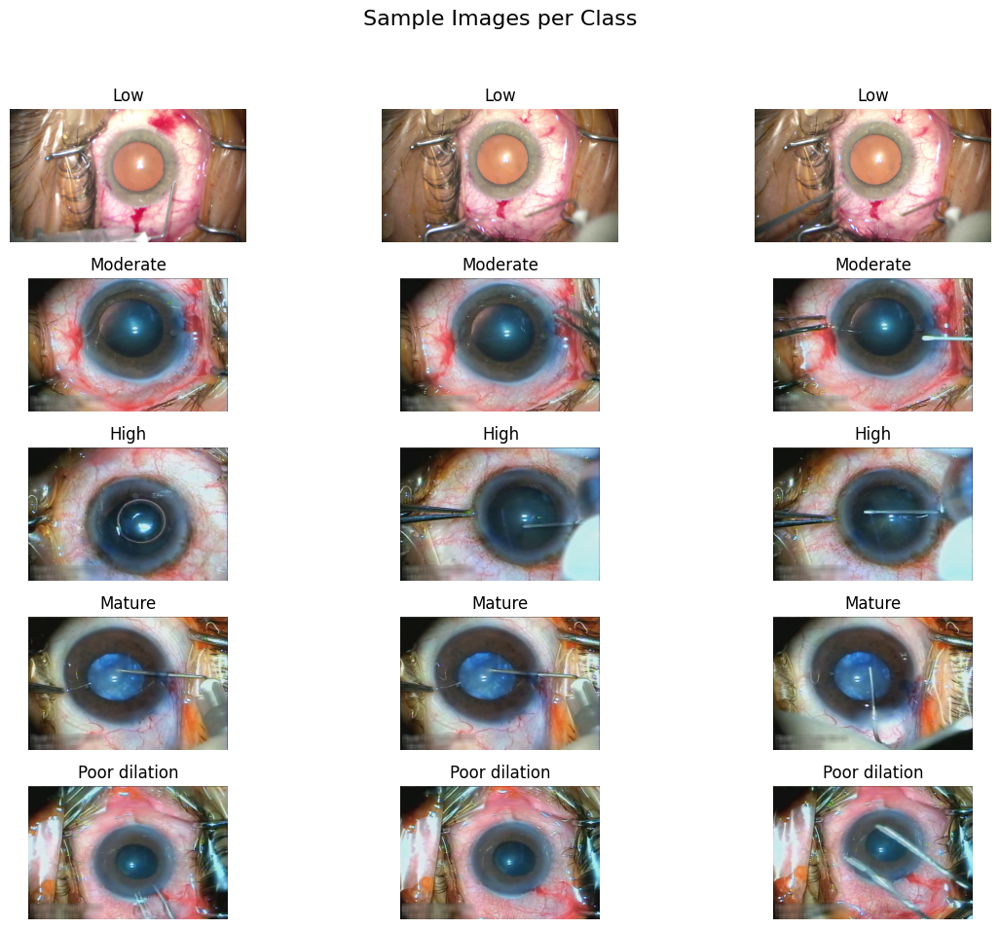

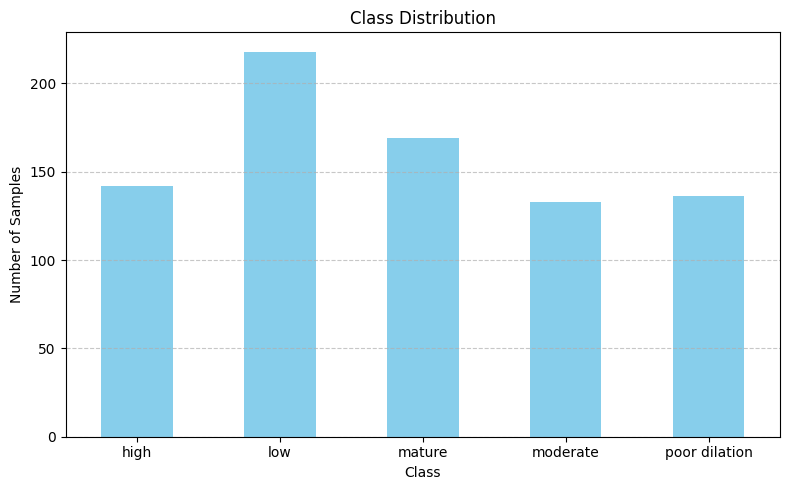

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 179MB/s]


Model is on device: cuda:0
Epoch: [1/30] | Step: [1/16] | Loss: 1.691008
Epoch: [1/30] | Step: [3/16] | Loss: 1.744442
Epoch: [1/30] | Step: [5/16] | Loss: 1.629890
Epoch: [1/30] | Step: [7/16] | Loss: 1.756399
Epoch: [1/30] | Step: [9/16] | Loss: 1.488199
Epoch: [1/30] | Step: [11/16] | Loss: 1.495508
Epoch: [1/30] | Step: [13/16] | Loss: 1.502378
Epoch: [1/30] | Step: [15/16] | Loss: 1.561506
Epoch: [1/30] | Loss: 1.459909
Valid Loss: 1.441627 | Acc: 0.4141
Epoch: [2/30] | Step: [1/16] | Loss: 1.509777
Epoch: [2/30] | Step: [3/16] | Loss: 1.561500
Epoch: [2/30] | Step: [5/16] | Loss: 1.466153
Epoch: [2/30] | Step: [7/16] | Loss: 1.386978
Epoch: [2/30] | Step: [9/16] | Loss: 1.597866
Epoch: [2/30] | Step: [11/16] | Loss: 1.346326
Epoch: [2/30] | Step: [13/16] | Loss: 1.476834
Epoch: [2/30] | Step: [15/16] | Loss: 1.390891
Epoch: [2/30] | Loss: 1.264294
Valid Loss: 1.318251 | Acc: 0.4375
Epoch: [3/30] | Step: [1/16] | Loss: 1.323110
Epoch: [3/30] | Step: [3/16] | Loss: 1.298984
Epoch: 

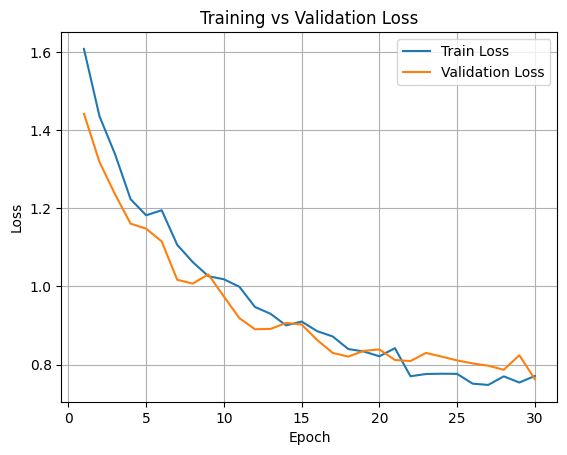

               precision    recall  f1-score   support

          low     0.8511    0.9091    0.8791        44
     moderate     0.9412    0.5926    0.7273        27
         high     0.6176    0.7500    0.6774        28
       mature     0.6250    0.7353    0.6757        34
poor dilation     0.8636    0.7037    0.7755        27

     accuracy                         0.7562       160
    macro avg     0.7797    0.7381    0.7470       160
 weighted avg     0.7795    0.7562    0.7575       160


Overall Accuracy: 0.7562
Macro F1-score  : 0.7470
Weighted F1-score: 0.7575


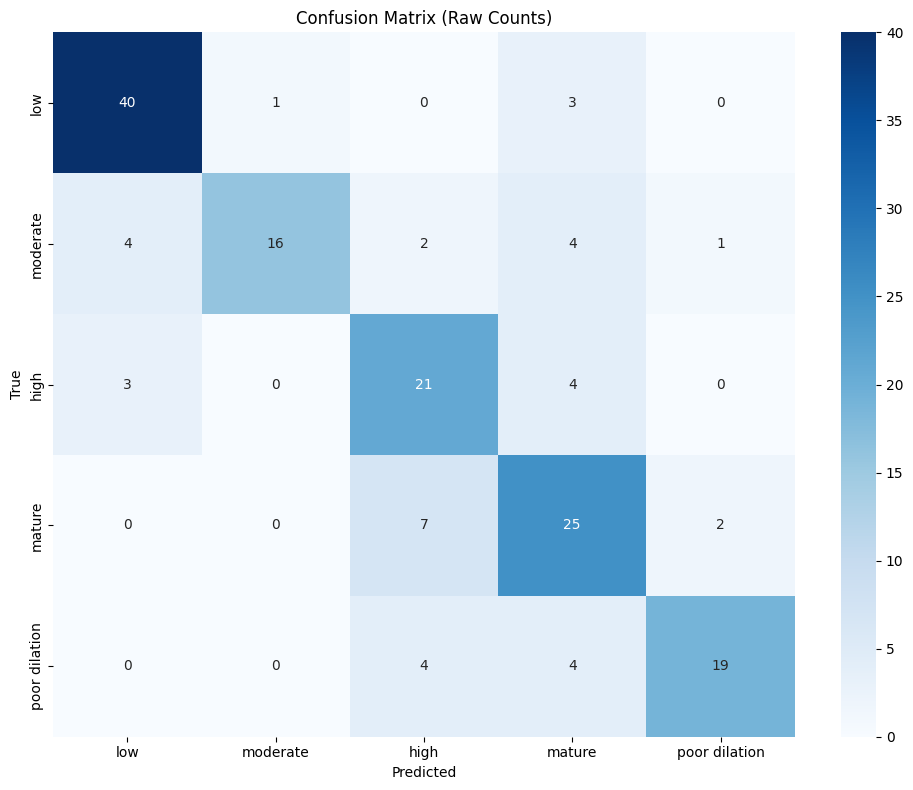

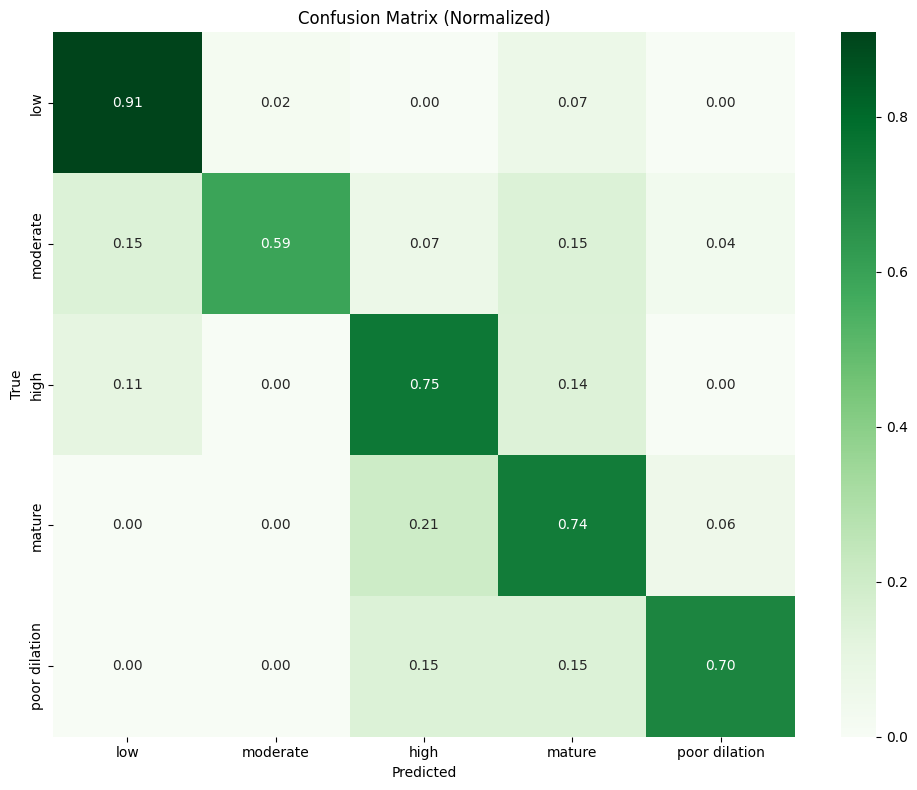

In [ ]:
CSV_PATH = "/content/dataset_V2.csv"
IMAGE_DIR = "/content/dataset_V2/dataset_V2"

train_loader, val_loader, test_loader, class_weights_tensor, df = get_dataloaders()


# Params
num_epochs = 30
lr = 1e-3
patience = 5
min_delta = 1e-4
best_val_loss = float('inf')
epochs_no_improve = 0

# Device configuration
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")



# Print dataset statistics
print(f"Total number of samples: {len(df)}")
print("\nClass distribution:")
print(df['label'].value_counts())

# Define the class labels (ordered)
classes = ["low", "moderate", "high", "mature", "poor dilation"]

# Create a subplot grid: 4 rows (classes) x 3 columns (images)
fig, axs = plt.subplots(len(classes), 3, figsize=(12, 10))
fig.suptitle("Sample Images per Class", fontsize=16)

# Loop over each class
for i, cls in enumerate(classes):
    class_samples = df[df["label"] == cls].head(3)
    for j, (_, row) in enumerate(class_samples.iterrows()):
        img_path = os.path.join(IMAGE_DIR, row["filename"] + ".jpg")
        try:
            image = Image.open(img_path)
            axs[i, j].imshow(image)
            axs[i, j].axis("off")
            axs[i, j].set_title(f"{cls.capitalize()}")
        except FileNotFoundError:
            axs[i, j].axis("off")
            axs[i, j].set_title("Image not found")

plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # adjust for suptitle
plt.show()

# Plot bar chart of class distribution
plt.figure(figsize=(8, 5))
df["label"].value_counts().sort_index().plot(kind='bar', color='skyblue')
plt.title("Class Distribution")
plt.xlabel("Class")
plt.ylabel("Number of Samples")
plt.xticks(rotation=0)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()




# Training
# model = resnet18(fine_tune=False).to(device)  # change to True if you want to fine-tune deeper layers
model = resnet18(fine_tune=False).to(device)
# Loss Function
# class_weights_tensor = class_weights_tensor.to(device)  # move to GPU
loss_fn = torch.nn.CrossEntropyLoss()

# Optimizer
optimizer = torch.optim.Adam(model.fc.parameters(), lr=lr)
# optimizer = torch.optim.AdamW(model.parameters(), lr=lr, weight_decay=1e-2)

# Scheduler
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3)


train_loss = []
valid_loss = []

print(f"Model is on device: {next(model.parameters()).device}")

# Train Loop
num_steps = len(train_loader)
for epochs in range(num_epochs):
    model.train()
    running_loss = 0.0
    for j, (imgs, lbls) in enumerate(train_loader):
        imgs, lbls = imgs.to(device), lbls.to(device)
        optimizer.zero_grad()
        out = model(imgs)
        loss = loss_fn(out, lbls)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
        if j % 2 == 0:
            print('Epoch: [{}/{}] | Step: [{}/{}] | Loss: {:.6f}'
                  .format(epochs+1, num_epochs, j+1, num_steps, loss.item()))
    train_loss.append(running_loss / num_steps)
    print('Epoch: [{}/{}] | Loss: {:.6f}'
          .format(epochs+1, num_epochs, loss.item()))

#---------------------
    model.eval()
    with torch.no_grad():
        correct = 0
        total = 0
        running_valid_loss = 0.0
        for imgs, lbls in val_loader:
            imgs, lbls = imgs.to(device), lbls.to(device)
            out = model(imgs)
            loss_val = loss_fn(out, lbls)
            running_valid_loss += loss_val.item()
            predicted = torch.argmax(out, dim=1)
            correct += (predicted == lbls).sum().item()
            total += lbls.size(0)
        avg_val_loss = running_valid_loss / len(val_loader)
        valid_loss.append(avg_val_loss)
        print('Valid Loss: {:.6f} | Acc: {:.4f}'.format(valid_loss[-1], correct / total))

        # Step the scheduler
        scheduler.step(avg_val_loss)


        # Early stopping
        if best_val_loss - avg_val_loss > min_delta:
            best_val_loss = avg_val_loss
            epochs_no_improve = 0
        else:
            epochs_no_improve += 1
            if epochs_no_improve >= patience:
                print("Early stopping triggered.")
                break

# Plot losses
plt.plot(range(1, len(train_loss)+1), train_loss, label='Train Loss')
plt.plot(range(1, len(valid_loss)+1), valid_loss, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training vs Validation Loss')
plt.legend()
plt.grid(True)
plt.show()




# # Predictions and true labels
# all_preds = []
# all_labels = []
#
# model.eval()
# with torch.no_grad():
#     for imgs, lbls in test_loader:
#         imgs = imgs.to(device)
#         outputs = model(imgs)
#         preds = torch.argmax(outputs, dim=1).cpu()
#         all_preds.extend(preds.numpy())
#         all_labels.extend(lbls.numpy())
#
# # Classification Report
# print(classification_report(all_labels, all_preds, target_names=classes))
#
# # Confusion Matrix
# cm = confusion_matrix(all_labels, all_preds)
# plt.figure(figsize=(10, 8))
# sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=classes, yticklabels=classes)
# plt.xlabel('Predicted')
# plt.ylabel('True')
# plt.title('Confusion Matrix')
# plt.show()
#


# Evaluation
all_preds = []
all_labels = []

model.eval()
with torch.no_grad():
    for imgs, lbls in test_loader:
        imgs, lbls = imgs.to(device), lbls.to(device)
        outputs = model(imgs)
        preds = torch.argmax(outputs, dim=1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(lbls.cpu().numpy())

# Convert to numpy arrays
all_preds = np.array(all_preds)
all_labels = np.array(all_labels)

# Print classification report
report = classification_report(all_labels, all_preds, target_names=classes, digits=4)
print(report)

# Save report as a dataframe (optional)
report_df = pd.DataFrame(classification_report(all_labels, all_preds, target_names=classes, output_dict=True)).T
report_df.to_csv("classification_report.csv")

# Accuracy and F1 scores
print(f"\nOverall Accuracy: {accuracy_score(all_labels, all_preds):.4f}")
print(f"Macro F1-score  : {f1_score(all_labels, all_preds, average='macro'):.4f}")
print(f"Weighted F1-score: {f1_score(all_labels, all_preds, average='weighted'):.4f}")

# Confusion Matrix
cm = confusion_matrix(all_labels, all_preds)
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

# Plot raw confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=classes, yticklabels=classes)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix (Raw Counts)')
plt.tight_layout()
plt.show()

# Plot normalized confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm_normalized, annot=True, fmt='.2f', cmap='Greens', xticklabels=classes, yticklabels=classes)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix (Normalized)')
plt.tight_layout()
plt.show()



torch.save(model.state_dict(), 'resnet18_model.pth')

In [ ]:
import os
import time
import psutil
import pandas as pd
import numpy as np
from tqdm import tqdm
from PIL import Image
import torch
import torch.nn as nn
from torchvision import models, transforms
from sklearn.metrics import classification_report
from collections import Counter
from torchvision.transforms import functional as TF

# ====== CUSTOM PAD TO SQUARE TRANSFORM ======
class PadToSquareWithMean:
    def __call__(self, image):
        w, h = image.size
        max_dim = max(w, h)
        pad_left = (max_dim - w) // 2
        pad_top = (max_dim - h) // 2
        pad_right = max_dim - w - pad_left
        pad_bottom = max_dim - h - pad_top

        # Compute mean color of the image (as RGB tuple)
        mean_color = image.resize((1, 1)).getpixel((0, 0))

        # Apply padding using the mean color
        return TF.pad(image, (pad_left, pad_top, pad_right, pad_bottom),
                      fill=mean_color, padding_mode='constant')

# ====== CONFIG ======
model_path = "/content/cataract_models/resnet18_model.pth"
image_dir = "/content/Test_Data/Test_Data"
label_csv_path = "/content/Test_Data.csv"
num_classes = 5
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Device used for inference: {device}")
class_names = ['low', 'moderate', 'high', 'mature', 'poor dilation']

# ====== TRANSFORMS ======
val_test_transform = transforms.Compose([
    PadToSquareWithMean(),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

# ====== LOAD MODEL ======
print("\nLoading model...")
start_model_load = time.time()
model = models.resnet18()
model.fc = nn.Linear(model.fc.in_features, num_classes)
model.load_state_dict(torch.load(model_path, map_location=device))
model.to(device)
model.eval()
end_model_load = time.time()
model_load_time = end_model_load - start_model_load
model_file_size = os.path.getsize(model_path) / (1024**2)  # MB

# ====== LOAD LABELS ======
df = pd.read_csv(label_csv_path)
df['filename'] = df['filename'].astype(str)
df['label'] = df['label'].str.strip().str.lower()

# ====== INFERENCE SETUP ======
y_true = []
y_pred = []
total_time = 0
total_images = 0

# Reset peak GPU memory stats
if device.type == "cuda":
    torch.cuda.reset_peak_memory_stats(device)

# Start monitoring CPU, RAM
process = psutil.Process(os.getpid())
cpu_before = psutil.cpu_percent(interval=1)
ram_before = process.memory_info().rss / (1024 ** 2)

# ====== RUN INFERENCE ======
for _, row in tqdm(df.iterrows(), total=len(df), desc="Running Inference"):
    filename, true_label = row['filename'], row['label']
    img_path = os.path.join(image_dir, filename + ".jpg")

    if not os.path.exists(img_path):
        print(f"Skipping missing file: {img_path}")
        continue

    img = Image.open(img_path).convert('RGB')
    input_tensor = val_test_transform(img).unsqueeze(0).to(device)

    start = time.time()
    with torch.no_grad():
        output = model(input_tensor)
        prob = torch.softmax(output, dim=1)
        pred_idx = torch.argmax(prob, dim=1).item()
    end = time.time()

    total_time += (end - start)
    total_images += 1
    y_true.append(true_label)
    y_pred.append(class_names[pred_idx])

# ====== RESOURCE USAGE ======
cpu_after = psutil.cpu_percent(interval=1)
ram_after = process.memory_info().rss / (1024 ** 2)
gpu_memory = 0
if device.type == "cuda":
    gpu_memory = torch.cuda.max_memory_allocated(device) / (1024 ** 2)

# ====== REPORT ======
print("\n====== Inference Results ======")
if total_images == 0:
    print("⚠️ No images were successfully processed.")
else:
    print(f"🕒 Average latency: {(total_time / total_images) * 1000:.2f} ms/image")
    print(f"⚡ Total inference time: {total_time:.2f} sec for {total_images} images")
print(f"🧊 Model load time: {model_load_time:.2f} sec")
print(f"📁 Model file size: {model_file_size:.2f} MB")
print(f"📈 CPU usage change: {cpu_after - cpu_before:.2f}%")
print(f"📦 RAM used change: {ram_after - ram_before:.2f} MB")
if device.type == "cuda":
    print(f"🧠 Peak GPU memory used: {gpu_memory:.2f} MB")

print("\n====== Classification Report ======")
if total_images > 0:
    print(classification_report(y_true, y_pred, target_names=class_names, zero_division=0))
    print("\nPrediction distribution:", Counter(y_pred))
    print("True label distribution:", Counter(y_true))


Device used for inference: cuda

Loading model...


Running Inference: 100%|██████████| 40/40 [00:00<00:00, 43.28it/s]



====== Inference Results ======
🕒 Average latency: 9.80 ms/image
⚡ Total inference time: 0.39 sec for 40 images
🧊 Model load time: 0.38 sec
📁 Model file size: 42.72 MB
📈 CPU usage change: -1.70%
📦 RAM used change: 272.79 MB
🧠 Peak GPU memory used: 62.17 MB

====== Classification Report ======
               precision    recall  f1-score   support

          low       0.55      0.86      0.67         7
     moderate       0.86      0.86      0.86         7
         high       0.62      0.83      0.71         6
       mature       1.00      0.54      0.70        13
poor dilation       1.00      1.00      1.00         7

     accuracy                           0.78        40
    macro avg       0.81      0.82      0.79        40
 weighted avg       0.84      0.78      0.78        40


Prediction distribution: Counter({'high': 11, 'mature': 8, 'low': 7, 'moderate': 7, 'poor dilation': 7})
True label distribution: Counter({'moderate': 13, 'low': 7, 'high': 7, 'poor dilation': 7, 'mature': 

In [ ]:
# ========== Config ==========
CSV_PATH = "dataset_V2.csv"
IMAGE_DIR = "/content/dataset_V2/dataset_V2"
BATCH_SIZE = 32

# ========== Dataset ==========
class CataractDataset(Dataset):
    def __init__(self, dataframe, image_dir, transform=None):
        self.data = dataframe.reset_index(drop=True)
        self.image_dir = image_dir
        self.transform = transform
        self.label_map = {"low": 0, "moderate": 1, "high": 2, "mature": 3, "poor dilation": 4}

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        row = self.data.iloc[idx]
        img_path = os.path.join(self.image_dir, row["filename"] + ".jpg")
        try:
            image = Image.open(img_path).convert("RGB")
        except FileNotFoundError:
            print(f"Missing image: {img_path}")
            return self.__getitem__((idx + 1) % len(self.data))

        label = self.label_map[row["label"].lower()]
        if self.transform:
            image = self.transform(image)
        return image, torch.tensor(label)

# ========== Load and Prepare CSV ==========
df = pd.read_csv(CSV_PATH)
df.columns = df.columns.str.strip()
df.rename(columns={"Frame Name": "filename"}, inplace=True)

# Derive label column from binary indicators
df["label"] = None
df.loc[df["Low Nuclear Density"] == 1.0, "label"] = "low"
df.loc[df["Moderate Nuclear Density"] == 1.0, "label"] = "moderate"
df.loc[df["High Nuclear Density"] == 1.0, "label"] = "high"
df.loc[df["Mature"] == 1.0, "label"] = "mature"
df.loc[df["Poor Dilation"] == 1.0, "label"] = "poor dilation"


# Keep only valid rows
df = df[df["label"].notna()]
df = df[["filename", "label"]]

# ========== Train / Val / Test Split ==========
train_val_df, test_df = train_test_split(df, test_size=0.2, stratify=df["label"], random_state=42)
train_df, val_df = train_test_split(train_val_df, test_size=0.2, stratify=train_val_df["label"], random_state=42)

# Map labels to integer indices
label_map = {"low": 0, "moderate": 1, "high": 2, "mature": 3, "poor dilation": 4}
train_df["class_idx"] = train_df["label"].map(label_map)

# Compute class weights
class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(train_df["class_idx"]),
    y=train_df["class_idx"]
)
class_weights_tensor = torch.tensor(class_weights, dtype=torch.float)

# ========== Transforms ==========
transform = transforms.Compose([
    PadToSquareWithMean(),  # <-- add this at the top
    transforms.Resize((224, 224)),  # match model input size
    transforms.RandomRotation(degrees=15),
    transforms.RandomAffine(degrees=10, translate=(0.05, 0.05), scale=(0.95, 1.05)),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
    transforms.RandomErasing(p=0.3)
])
val_test_transform = transforms.Compose([
    PadToSquareWithMean(),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])


# ========== Datasets and Dataloaders ==========
train_dataset = CataractDataset(train_df, IMAGE_DIR, transform)
# val_dataset = CataractDataset(val_df, IMAGE_DIR, transform)
# test_dataset = CataractDataset(test_df, IMAGE_DIR, transform)
val_dataset = CataractDataset(val_df, IMAGE_DIR, val_test_transform)
test_dataset = CataractDataset(test_df, IMAGE_DIR, val_test_transform)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False)

# ========== Return Utility ==========
def get_dataloaders():
    return train_loader, val_loader, test_loader, class_weights_tensor, df


In [ ]:
import torch.nn as nn
from torchvision import models

def resnet50(pretrained=True, fine_tune=False):
    """
    Returns a ResNet-50 pretrained on ImageNet, with its final layer
    replaced to output 5 classes.

    Args:
        pretrained (bool): use ImageNet weights if True.
        fine_tune  (bool): if False, freeze all layers except the new fc.

    Returns:
        model (nn.Module)
    """
    model = models.resnet50(pretrained=pretrained)

    # Freeze everything if not fine-tuning
    if not fine_tune:
        for param in model.parameters():
            param.requires_grad = False

    # Replace the classifier head
    num_ftrs = model.fc.in_features
    model.fc = nn.Linear(num_ftrs, 5)

    return model


Using device: cuda
Total number of samples: 798

Class distribution:
label
low              218
mature           169
high             142
poor dilation    136
moderate         133
Name: count, dtype: int64


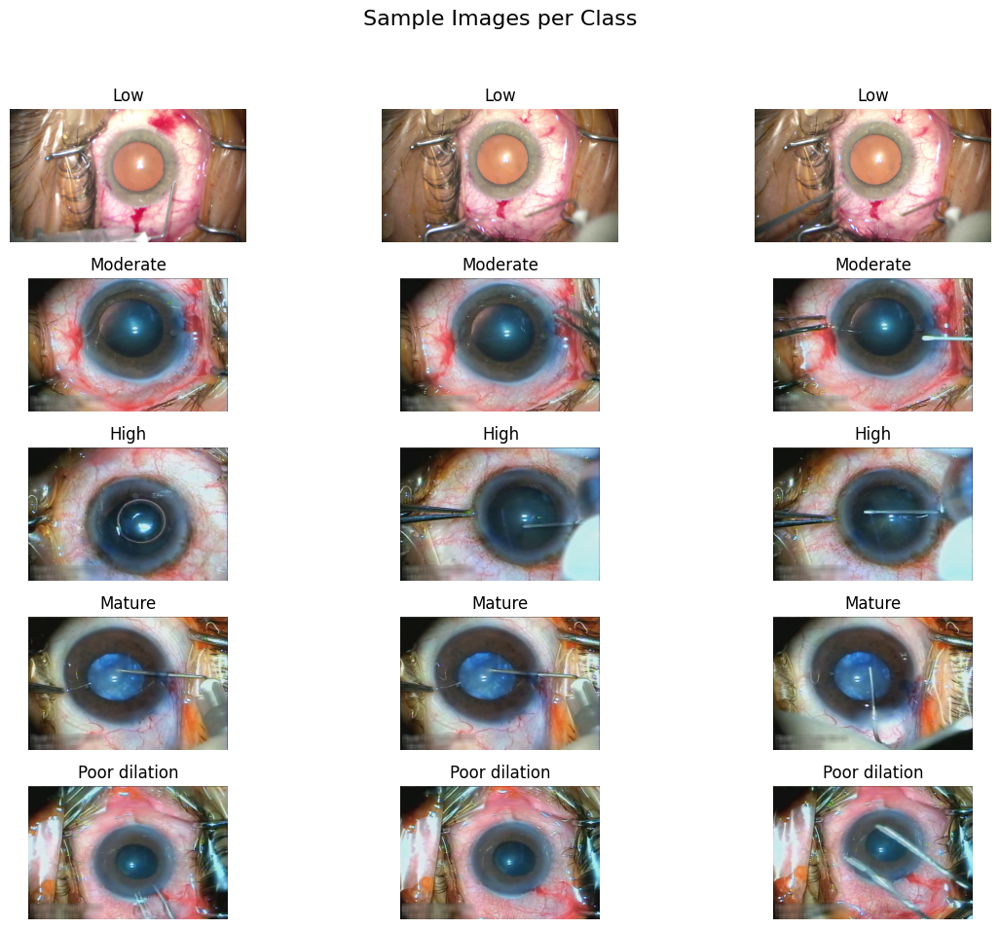

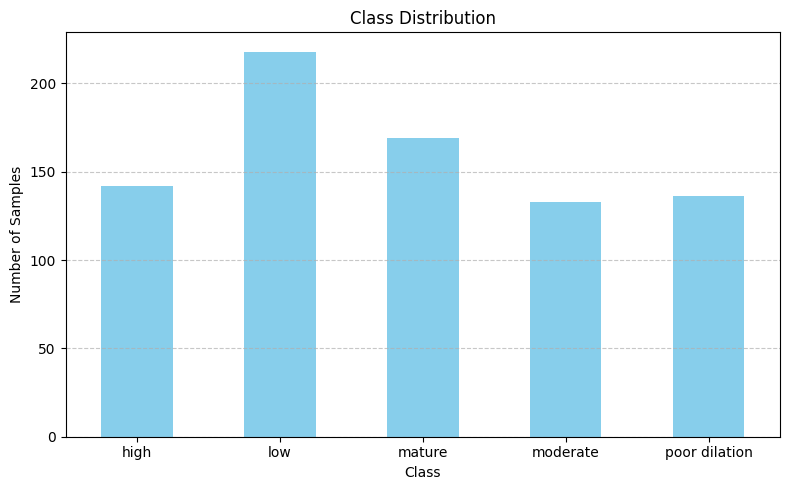

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 174MB/s]


Model is on device: cuda:0
Epoch: [1/30] | Step: [1/16] | Loss: 1.576435
Epoch: [1/30] | Step: [3/16] | Loss: 1.846903
Epoch: [1/30] | Step: [5/16] | Loss: 1.621093
Epoch: [1/30] | Step: [7/16] | Loss: 1.520251
Epoch: [1/30] | Step: [9/16] | Loss: 1.541415
Epoch: [1/30] | Step: [11/16] | Loss: 1.491296
Epoch: [1/30] | Step: [13/16] | Loss: 1.306499
Epoch: [1/30] | Step: [15/16] | Loss: 1.640530
Epoch: [1/30] | Loss: 1.472359
Valid Loss: 1.394006 | Acc: 0.4531
Epoch: [2/30] | Step: [1/16] | Loss: 1.296617
Epoch: [2/30] | Step: [3/16] | Loss: 1.467237
Epoch: [2/30] | Step: [5/16] | Loss: 1.517681
Epoch: [2/30] | Step: [7/16] | Loss: 1.388736
Epoch: [2/30] | Step: [9/16] | Loss: 1.474317
Epoch: [2/30] | Step: [11/16] | Loss: 1.276121
Epoch: [2/30] | Step: [13/16] | Loss: 1.593838
Epoch: [2/30] | Step: [15/16] | Loss: 1.519715
Epoch: [2/30] | Loss: 1.423739
Valid Loss: 1.220893 | Acc: 0.6172
Epoch: [3/30] | Step: [1/16] | Loss: 1.307538
Epoch: [3/30] | Step: [3/16] | Loss: 1.372596
Epoch: 

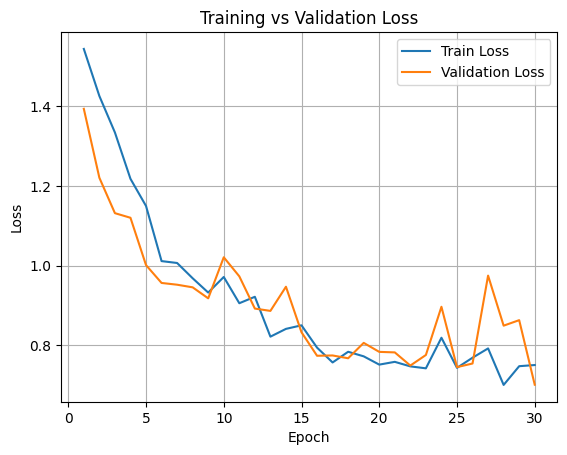

               precision    recall  f1-score   support

          low     0.8511    0.9091    0.8791        44
     moderate     0.7273    0.5926    0.6531        27
         high     0.6562    0.7500    0.7000        28
       mature     0.7407    0.5882    0.6557        34
poor dilation     0.6875    0.8148    0.7458        27

     accuracy                         0.7438       160
    macro avg     0.7326    0.7309    0.7267       160
 weighted avg     0.7450    0.7438    0.7397       160


Overall Accuracy: 0.7438
Macro F1-score  : 0.7267
Weighted F1-score: 0.7397


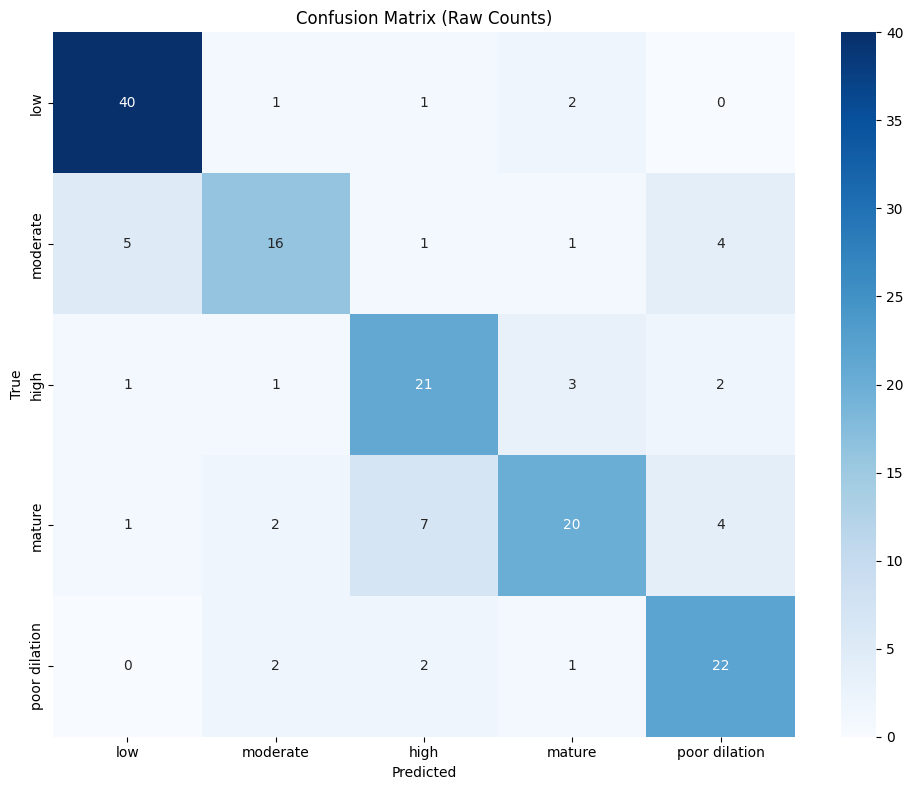

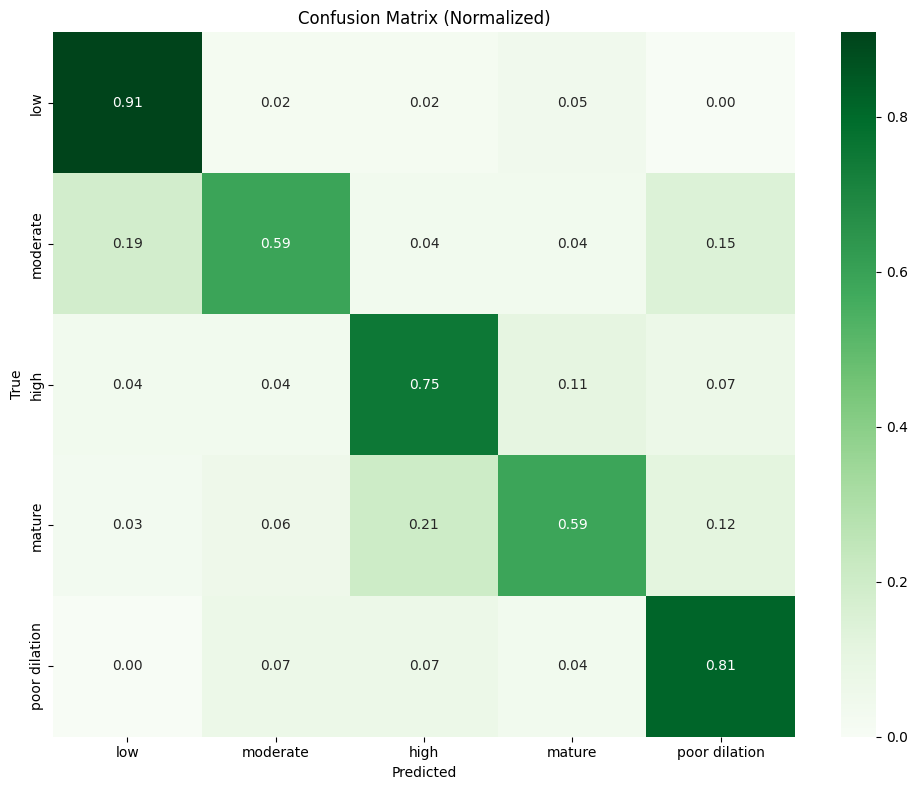

In [ ]:
CSV_PATH = "/content/dataset_V2.csv"
IMAGE_DIR = "/content/dataset_V2/dataset_V2"

train_loader, val_loader, test_loader, class_weights_tensor, df = get_dataloaders()


# Params
num_epochs = 30
lr = 1e-3
patience = 5
min_delta = 1e-4
best_val_loss = float('inf')
epochs_no_improve = 0

# Device configuration
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")



# Print dataset statistics
print(f"Total number of samples: {len(df)}")
print("\nClass distribution:")
print(df['label'].value_counts())

# Define the class labels (ordered)
classes = ["low", "moderate", "high", "mature", "poor dilation"]

# Create a subplot grid: 4 rows (classes) x 3 columns (images)
fig, axs = plt.subplots(len(classes), 3, figsize=(12, 10))
fig.suptitle("Sample Images per Class", fontsize=16)

# Loop over each class
for i, cls in enumerate(classes):
    class_samples = df[df["label"] == cls].head(3)
    for j, (_, row) in enumerate(class_samples.iterrows()):
        img_path = os.path.join(IMAGE_DIR, row["filename"] + ".jpg")
        try:
            image = Image.open(img_path)
            axs[i, j].imshow(image)
            axs[i, j].axis("off")
            axs[i, j].set_title(f"{cls.capitalize()}")
        except FileNotFoundError:
            axs[i, j].axis("off")
            axs[i, j].set_title("Image not found")

plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # adjust for suptitle
plt.show()

# Plot bar chart of class distribution
plt.figure(figsize=(8, 5))
df["label"].value_counts().sort_index().plot(kind='bar', color='skyblue')
plt.title("Class Distribution")
plt.xlabel("Class")
plt.ylabel("Number of Samples")
plt.xticks(rotation=0)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()




# Training
# model = resnet18(fine_tune=False).to(device)  # change to True if you want to fine-tune deeper layers
model = resnet50(fine_tune=False).to(device)
# Loss Function
class_weights_tensor = class_weights_tensor.to(device)  # move to GPU
loss_fn = torch.nn.CrossEntropyLoss()

# Optimizer
# optimizer = torch.optim.Adam(model.fc.parameters(), lr=lr)
optimizer = torch.optim.AdamW(model.parameters(), lr=lr, weight_decay=1e-2)

# Scheduler
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3)


train_loss = []
valid_loss = []

print(f"Model is on device: {next(model.parameters()).device}")

# Train Loop
num_steps = len(train_loader)
for epochs in range(num_epochs):
    model.train()
    running_loss = 0.0
    for j, (imgs, lbls) in enumerate(train_loader):
        imgs, lbls = imgs.to(device), lbls.to(device)
        optimizer.zero_grad()
        out = model(imgs)
        loss = loss_fn(out, lbls)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
        if j % 2 == 0:
            print('Epoch: [{}/{}] | Step: [{}/{}] | Loss: {:.6f}'
                  .format(epochs+1, num_epochs, j+1, num_steps, loss.item()))
    train_loss.append(running_loss / num_steps)
    print('Epoch: [{}/{}] | Loss: {:.6f}'
          .format(epochs+1, num_epochs, loss.item()))

#---------------------
    model.eval()
    with torch.no_grad():
        correct = 0
        total = 0
        running_valid_loss = 0.0
        for imgs, lbls in val_loader:
            imgs, lbls = imgs.to(device), lbls.to(device)
            out = model(imgs)
            loss_val = loss_fn(out, lbls)
            running_valid_loss += loss_val.item()
            predicted = torch.argmax(out, dim=1)
            correct += (predicted == lbls).sum().item()
            total += lbls.size(0)
        avg_val_loss = running_valid_loss / len(val_loader)
        valid_loss.append(avg_val_loss)
        print('Valid Loss: {:.6f} | Acc: {:.4f}'.format(valid_loss[-1], correct / total))

        # Step the scheduler
        scheduler.step(avg_val_loss)


        # Early stopping
        if best_val_loss - avg_val_loss > min_delta:
            best_val_loss = avg_val_loss
            epochs_no_improve = 0
        else:
            epochs_no_improve += 1
            if epochs_no_improve >= patience:
                print("Early stopping triggered.")
                break

# Plot losses
plt.plot(range(1, len(train_loss)+1), train_loss, label='Train Loss')
plt.plot(range(1, len(valid_loss)+1), valid_loss, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training vs Validation Loss')
plt.legend()
plt.grid(True)
plt.show()




# # Predictions and true labels
# all_preds = []
# all_labels = []
#
# model.eval()
# with torch.no_grad():
#     for imgs, lbls in test_loader:
#         imgs = imgs.to(device)
#         outputs = model(imgs)
#         preds = torch.argmax(outputs, dim=1).cpu()
#         all_preds.extend(preds.numpy())
#         all_labels.extend(lbls.numpy())
#
# # Classification Report
# print(classification_report(all_labels, all_preds, target_names=classes))
#
# # Confusion Matrix
# cm = confusion_matrix(all_labels, all_preds)
# plt.figure(figsize=(10, 8))
# sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=classes, yticklabels=classes)
# plt.xlabel('Predicted')
# plt.ylabel('True')
# plt.title('Confusion Matrix')
# plt.show()
#


# Evaluation
all_preds = []
all_labels = []

model.eval()
with torch.no_grad():
    for imgs, lbls in test_loader:
        imgs, lbls = imgs.to(device), lbls.to(device)
        outputs = model(imgs)
        preds = torch.argmax(outputs, dim=1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(lbls.cpu().numpy())

# Convert to numpy arrays
all_preds = np.array(all_preds)
all_labels = np.array(all_labels)

# Print classification report
report = classification_report(all_labels, all_preds, target_names=classes, digits=4)
print(report)

# Save report as a dataframe (optional)
report_df = pd.DataFrame(classification_report(all_labels, all_preds, target_names=classes, output_dict=True)).T
report_df.to_csv("classification_report.csv")

# Accuracy and F1 scores
print(f"\nOverall Accuracy: {accuracy_score(all_labels, all_preds):.4f}")
print(f"Macro F1-score  : {f1_score(all_labels, all_preds, average='macro'):.4f}")
print(f"Weighted F1-score: {f1_score(all_labels, all_preds, average='weighted'):.4f}")

# Confusion Matrix
cm = confusion_matrix(all_labels, all_preds)
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

# Plot raw confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=classes, yticklabels=classes)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix (Raw Counts)')
plt.tight_layout()
plt.show()

# Plot normalized confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm_normalized, annot=True, fmt='.2f', cmap='Greens', xticklabels=classes, yticklabels=classes)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix (Normalized)')
plt.tight_layout()
plt.show()


torch.save(model.state_dict(), 'resnet50_model.pth')

In [ ]:
import os
import time
import psutil
import pandas as pd
import numpy as np
from tqdm import tqdm
from PIL import Image
import torch
import torch.nn as nn
from torchvision import models, transforms
from sklearn.metrics import classification_report
from collections import Counter
from torchvision.transforms import functional as TF

# ====== CUSTOM PAD TO SQUARE TRANSFORM ======
class PadToSquareWithMean:
    def __call__(self, image):
        w, h = image.size
        max_dim = max(w, h)
        pad_left = (max_dim - w) // 2
        pad_top = (max_dim - h) // 2
        pad_right = max_dim - w - pad_left
        pad_bottom = max_dim - h - pad_top

        # Compute mean color of the image (as RGB tuple)
        mean_color = image.resize((1, 1)).getpixel((0, 0))

        # Apply padding using the mean color
        return TF.pad(image, (pad_left, pad_top, pad_right, pad_bottom),
                      fill=mean_color, padding_mode='constant')

# ====== CONFIG ======
model_path = "/content/cataract_models/resnet50_model.pth"
image_dir = "/content/Test_Data/Test_Data"
label_csv_path = "/content/Test_Data.csv"
num_classes = 5
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Device used for inference: {device}")
class_names = ['low', 'moderate', 'high', 'mature', 'poor dilation']

# ====== TRANSFORMS ======
val_test_transform = transforms.Compose([
    PadToSquareWithMean(),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

# ====== LOAD MODEL ======
print("\nLoading model...")
start_model_load = time.time()
model = models.resnet50()
model.fc = nn.Linear(model.fc.in_features, num_classes)
model.load_state_dict(torch.load(model_path, map_location=device))
model.to(device)
model.eval()
end_model_load = time.time()
model_load_time = end_model_load - start_model_load
model_file_size = os.path.getsize(model_path) / (1024**2)  # MB

# ====== LOAD LABELS ======
df = pd.read_csv(label_csv_path)
df['filename'] = df['filename'].astype(str)
df['label'] = df['label'].str.strip().str.lower()

# ====== INFERENCE SETUP ======
y_true = []
y_pred = []
total_time = 0
total_images = 0

# Reset peak GPU memory stats
if device.type == "cuda":
    torch.cuda.reset_peak_memory_stats(device)

# Start monitoring CPU, RAM
process = psutil.Process(os.getpid())
cpu_before = psutil.cpu_percent(interval=1)
ram_before = process.memory_info().rss / (1024 ** 2)

# ====== RUN INFERENCE ======
for _, row in tqdm(df.iterrows(), total=len(df), desc="Running Inference"):
    filename, true_label = row['filename'], row['label']
    img_path = os.path.join(image_dir, filename + ".jpg")

    if not os.path.exists(img_path):
        print(f"Skipping missing file: {img_path}")
        continue

    img = Image.open(img_path).convert('RGB')
    input_tensor = val_test_transform(img).unsqueeze(0).to(device)

    start = time.time()
    with torch.no_grad():
        output = model(input_tensor)
        prob = torch.softmax(output, dim=1)
        pred_idx = torch.argmax(prob, dim=1).item()
    end = time.time()

    total_time += (end - start)
    total_images += 1
    y_true.append(true_label)
    y_pred.append(class_names[pred_idx])

# ====== RESOURCE USAGE ======
cpu_after = psutil.cpu_percent(interval=1)
ram_after = process.memory_info().rss / (1024 ** 2)
gpu_memory = 0
if device.type == "cuda":
    gpu_memory = torch.cuda.max_memory_allocated(device) / (1024 ** 2)

# ====== REPORT ======
print("\n====== Inference Results ======")
if total_images == 0:
    print("⚠️ No images were successfully processed.")
else:
    print(f"🕒 Average latency: {(total_time / total_images) * 1000:.2f} ms/image")
    print(f"⚡ Total inference time: {total_time:.2f} sec for {total_images} images")
print(f"🧊 Model load time: {model_load_time:.2f} sec")
print(f"📁 Model file size: {model_file_size:.2f} MB")
print(f"📈 CPU usage change: {cpu_after - cpu_before:.2f}%")
print(f"📦 RAM used change: {ram_after - ram_before:.2f} MB")
if device.type == "cuda":
    print(f"🧠 Peak GPU memory used: {gpu_memory:.2f} MB")

print("\n====== Classification Report ======")
if total_images > 0:
    print(classification_report(y_true, y_pred, target_names=class_names, zero_division=0))
    print("\nPrediction distribution:", Counter(y_pred))
    print("True label distribution:", Counter(y_true))


Device used for inference: cuda

Loading model...


Running Inference: 100%|██████████| 40/40 [00:01<00:00, 33.80it/s]



====== Inference Results ======
🕒 Average latency: 16.07 ms/image
⚡ Total inference time: 0.64 sec for 40 images
🧊 Model load time: 0.68 sec
📁 Model file size: 90.02 MB
📈 CPU usage change: 25.70%
📦 RAM used change: 261.73 MB
🧠 Peak GPU memory used: 110.48 MB

====== Classification Report ======
               precision    recall  f1-score   support

          low       0.57      0.57      0.57         7
     moderate       0.88      1.00      0.93         7
         high       0.75      1.00      0.86         6
       mature       0.71      0.38      0.50        13
poor dilation       0.70      1.00      0.82         7

     accuracy                           0.72        40
    macro avg       0.72      0.79      0.74        40
 weighted avg       0.72      0.72      0.70        40


Prediction distribution: Counter({'poor dilation': 10, 'low': 8, 'mature': 8, 'high': 7, 'moderate': 7})
True label distribution: Counter({'moderate': 13, 'low': 7, 'high': 7, 'poor dilation': 7, 'mature'

In [ ]:
# ========== Config ==========
CSV_PATH = "dataset_V4.csv"
IMAGE_DIR = "/content/dataset_V4/dataset_V4"
BATCH_SIZE = 32

# ========== Dataset ==========
class CataractDataset(Dataset):
    def __init__(self, dataframe, image_dir, transform=None):
        self.data = dataframe.reset_index(drop=True)
        self.image_dir = image_dir
        self.transform = transform
        self.label_map = {"low": 0, "moderate": 1, "high": 2, "mature": 3, "poor dilation": 4}

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        row = self.data.iloc[idx]
        img_path = os.path.join(self.image_dir, row["filename"] + ".jpg")
        try:
            image = Image.open(img_path).convert("RGB")
        except FileNotFoundError:
            print(f"Missing image: {img_path}")
            return self.__getitem__((idx + 1) % len(self.data))

        label = self.label_map[row["label"].lower()]
        if self.transform:
            image = self.transform(image)
        return image, torch.tensor(label)

# ========== Load and Prepare CSV ==========
df = pd.read_csv(CSV_PATH)
df.columns = df.columns.str.strip()
df.rename(columns={"Frame Name": "filename"}, inplace=True)

# Derive label column from binary indicators
df["label"] = None
df.loc[df["Low Nuclear Density"] == 1.0, "label"] = "low"
df.loc[df["Moderate Nuclear Density"] == 1.0, "label"] = "moderate"
df.loc[df["High Nuclear Density"] == 1.0, "label"] = "high"
df.loc[df["Mature"] == 1.0, "label"] = "mature"
df.loc[df["Poor Dilation"] == 1.0, "label"] = "poor dilation"


# Keep only valid rows
df = df[df["label"].notna()]
df = df[["filename", "label"]]

# ========== Train / Val / Test Split ==========
train_val_df, test_df = train_test_split(df, test_size=0.2, stratify=df["label"], random_state=42)
train_df, val_df = train_test_split(train_val_df, test_size=0.2, stratify=train_val_df["label"], random_state=42)

# Map labels to integer indices
label_map = {"low": 0, "moderate": 1, "high": 2, "mature": 3, "poor dilation": 4}
train_df["class_idx"] = train_df["label"].map(label_map)

# Compute class weights
class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(train_df["class_idx"]),
    y=train_df["class_idx"]
)
class_weights_tensor = torch.tensor(class_weights, dtype=torch.float)

# ========== Transforms ==========
transform = transforms.Compose([
    PadToSquareWithMean(),  # <-- add this at the top
    transforms.Resize((224, 224)),  # match model input size
    transforms.RandomRotation(degrees=15),
    transforms.RandomAffine(degrees=10, translate=(0.05, 0.05), scale=(0.95, 1.05)),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
    transforms.RandomErasing(p=0.3)
])
val_test_transform = transforms.Compose([
    PadToSquareWithMean(),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])


# ========== Datasets and Dataloaders ==========
train_dataset = CataractDataset(train_df, IMAGE_DIR, transform)
# val_dataset = CataractDataset(val_df, IMAGE_DIR, transform)
# test_dataset = CataractDataset(test_df, IMAGE_DIR, transform)
val_dataset = CataractDataset(val_df, IMAGE_DIR, val_test_transform)
test_dataset = CataractDataset(test_df, IMAGE_DIR, val_test_transform)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False)

# ========== Return Utility ==========
def get_dataloaders():
    return train_loader, val_loader, test_loader, class_weights_tensor, df


In [ ]:
# efficient_net_B0.py

from torchvision.models import efficientnet_b0, EfficientNet_B0_Weights
import torch.nn as nn

def get_efficientnet_b0(num_classes: int = 5,
                        fine_tune: bool = False,
                        pretrained: bool = True) -> nn.Module:
    """
    Returns a pretrained EfficientNet-B0 modified for `num_classes` outputs.

    Args:
        num_classes: number of target classes (e.g. 5 for your cataract dataset)
        fine_tune: if False, freeze all backbone weights; if True, leave everything trainable
        pretrained: if True, load ImageNet weights

    Returns:
        model: EfficientNet-B0 ready for classification
    """
    # 1) Load EfficientNet-B0, optionally with pretrained weights
    weights = EfficientNet_B0_Weights.DEFAULT if pretrained else None
    model = efficientnet_b0(weights=weights)

    # 2) If not fine-tuning, freeze all pretrained layers
    if not fine_tune:
        for param in model.parameters():
            param.requires_grad = False

    # 3) Replace the head (classifier) with a num_classes output layer
    in_features = model.classifier[1].in_features
    model.classifier[1] = nn.Linear(in_features, num_classes)

    return model


Using device: cuda
Total number of samples: 1888

Class distribution:
label
mature           522
low              460
moderate         366
high             341
poor dilation    199
Name: count, dtype: int64


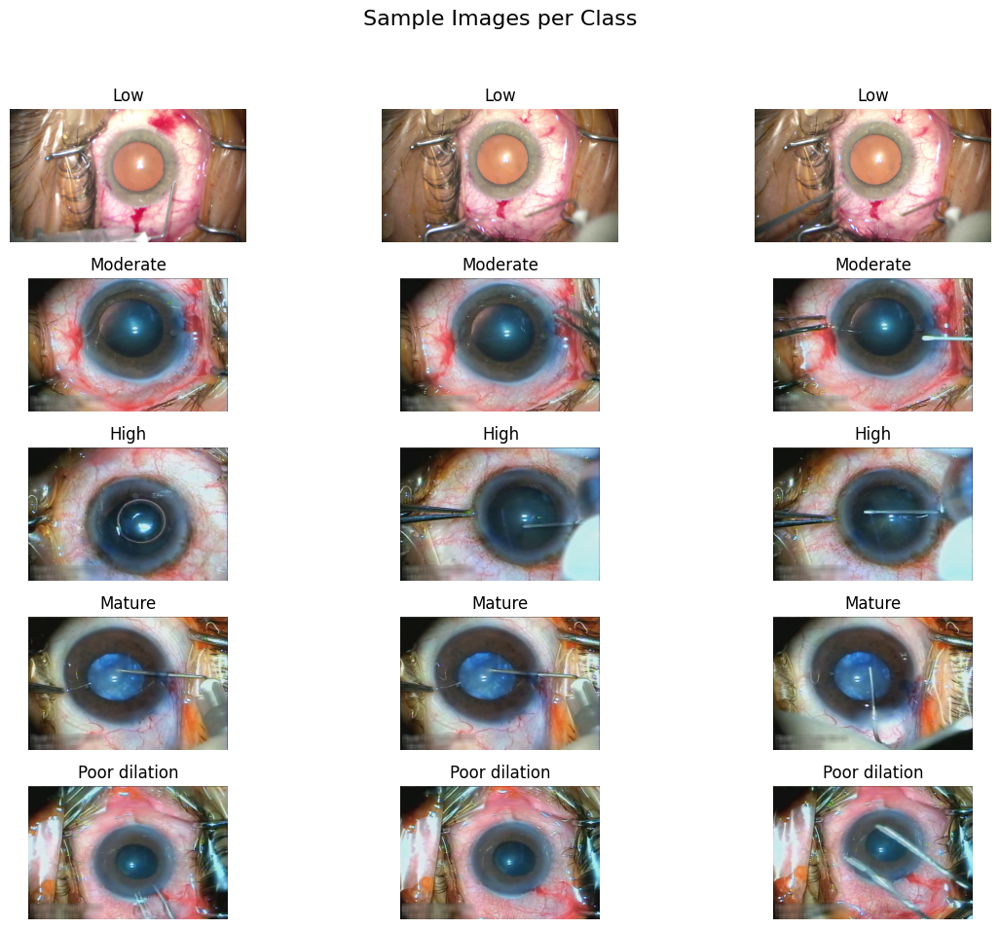

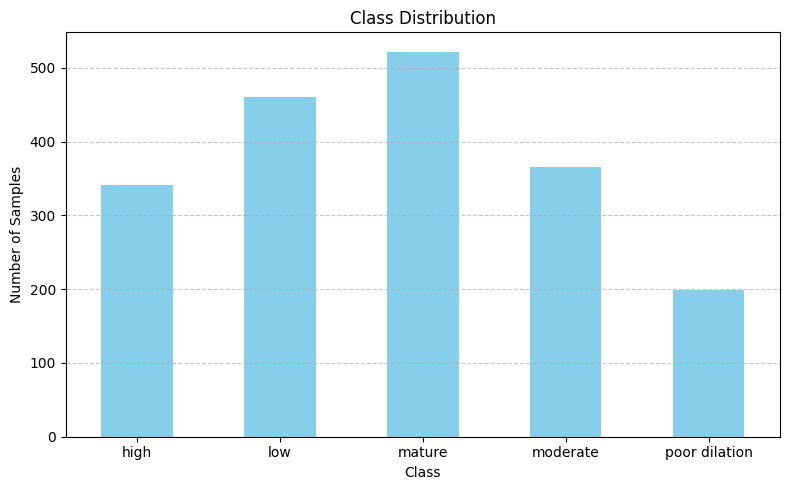

Downloading: "https://download.pytorch.org/models/efficientnet_b0_rwightman-7f5810bc.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b0_rwightman-7f5810bc.pth
100%|██████████| 20.5M/20.5M [00:00<00:00, 169MB/s]


Model is on device: cuda:0
Epoch: [1/30] | Step: [1/38] | Loss: 1.601297
Epoch: [1/30] | Step: [3/38] | Loss: 1.539363
Epoch: [1/30] | Step: [5/38] | Loss: 1.540689
Epoch: [1/30] | Step: [7/38] | Loss: 1.537301
Epoch: [1/30] | Step: [9/38] | Loss: 1.659398
Epoch: [1/30] | Step: [11/38] | Loss: 1.527337
Epoch: [1/30] | Step: [13/38] | Loss: 1.527224
Epoch: [1/30] | Step: [15/38] | Loss: 1.528378
Epoch: [1/30] | Step: [17/38] | Loss: 1.558502
Epoch: [1/30] | Step: [19/38] | Loss: 1.363230
Epoch: [1/30] | Step: [21/38] | Loss: 1.480853
Epoch: [1/30] | Step: [23/38] | Loss: 1.380299
Epoch: [1/30] | Step: [25/38] | Loss: 1.458245
Epoch: [1/30] | Step: [27/38] | Loss: 1.451451
Epoch: [1/30] | Step: [29/38] | Loss: 1.582486
Epoch: [1/30] | Step: [31/38] | Loss: 1.335729
Epoch: [1/30] | Step: [33/38] | Loss: 1.517920
Epoch: [1/30] | Step: [35/38] | Loss: 1.398679
Epoch: [1/30] | Step: [37/38] | Loss: 1.645324
Epoch: [1/30] | Loss: 1.536807
Valid Loss: 1.437058 | Acc: 0.3411
Epoch: [2/30] | Ste

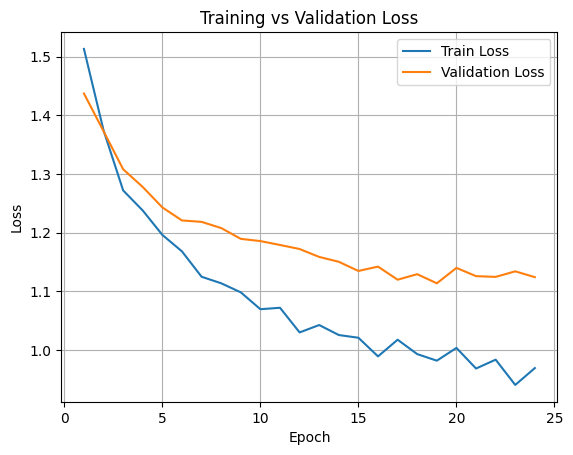

               precision    recall  f1-score   support

          low     0.5702    0.7500    0.6479        92
     moderate     0.6744    0.3973    0.5000        73
         high     0.4783    0.4853    0.4818        68
       mature     0.5877    0.6381    0.6119       105
poor dilation     0.8710    0.6750    0.7606        40

     accuracy                         0.5952       378
    macro avg     0.6363    0.5891    0.6004       378
 weighted avg     0.6105    0.5952    0.5914       378


Overall Accuracy: 0.5952
Macro F1-score  : 0.6004
Weighted F1-score: 0.5914


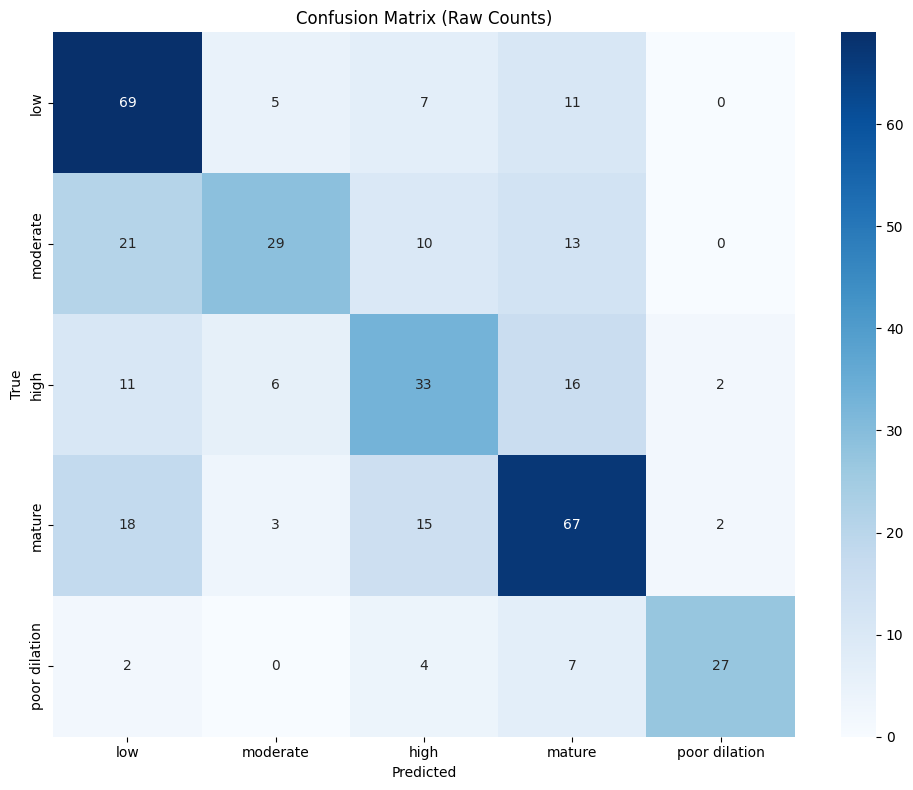

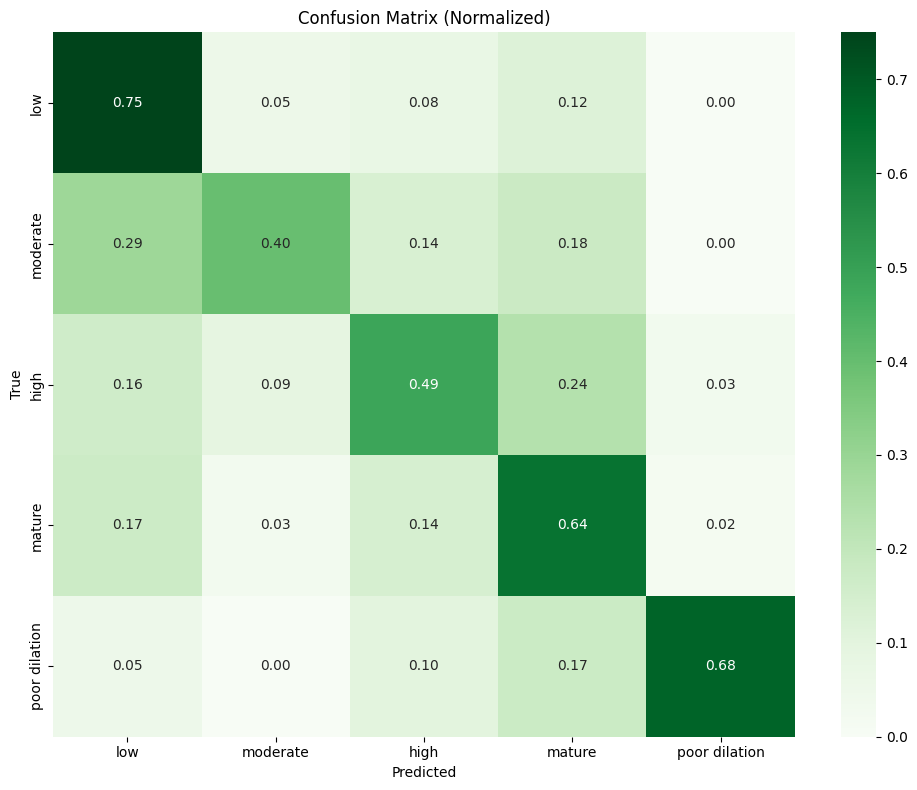

In [ ]:
CSV_PATH = "/content/dataset_V4.csv"
IMAGE_DIR = "/content/dataset_V4/dataset_V4"

train_loader, val_loader, test_loader, class_weights_tensor, df = get_dataloaders()


# Params
num_epochs = 30
lr = 1e-3
patience = 5
min_delta = 1e-4
best_val_loss = float('inf')
epochs_no_improve = 0

# Device configuration
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")



# Print dataset statistics
print(f"Total number of samples: {len(df)}")
print("\nClass distribution:")
print(df['label'].value_counts())

# Define the class labels (ordered)
classes = ["low", "moderate", "high", "mature", "poor dilation"]

# Create a subplot grid: 4 rows (classes) x 3 columns (images)
fig, axs = plt.subplots(len(classes), 3, figsize=(12, 10))
fig.suptitle("Sample Images per Class", fontsize=16)

# Loop over each class
for i, cls in enumerate(classes):
    class_samples = df[df["label"] == cls].head(3)
    for j, (_, row) in enumerate(class_samples.iterrows()):
        img_path = os.path.join(IMAGE_DIR, row["filename"] + ".jpg")
        try:
            image = Image.open(img_path)
            axs[i, j].imshow(image)
            axs[i, j].axis("off")
            axs[i, j].set_title(f"{cls.capitalize()}")
        except FileNotFoundError:
            axs[i, j].axis("off")
            axs[i, j].set_title("Image not found")

plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # adjust for suptitle
plt.show()

# Plot bar chart of class distribution
plt.figure(figsize=(8, 5))
df["label"].value_counts().sort_index().plot(kind='bar', color='skyblue')
plt.title("Class Distribution")
plt.xlabel("Class")
plt.ylabel("Number of Samples")
plt.xticks(rotation=0)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()




# Training
# model = resnet18(fine_tune=False).to(device)  # change to True if you want to fine-tune deeper layers
model = get_efficientnet_b0(num_classes=5,fine_tune=False,pretrained=True).to(device)
# Loss Function
# class_weights_tensor = class_weights_tensor.to(device)  # move to GPU
loss_fn = torch.nn.CrossEntropyLoss()

# Optimizer
# optimizer = torch.optim.Adam(model.fc.parameters(), lr=lr)
optimizer = torch.optim.AdamW(model.parameters(), lr=lr, weight_decay=1e-2)

# Scheduler
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3)


train_loss = []
valid_loss = []

print(f"Model is on device: {next(model.parameters()).device}")

# Train Loop
num_steps = len(train_loader)
for epochs in range(num_epochs):
    model.train()
    running_loss = 0.0
    for j, (imgs, lbls) in enumerate(train_loader):
        imgs, lbls = imgs.to(device), lbls.to(device)
        optimizer.zero_grad()
        out = model(imgs)
        loss = loss_fn(out, lbls)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
        if j % 2 == 0:
            print('Epoch: [{}/{}] | Step: [{}/{}] | Loss: {:.6f}'
                  .format(epochs+1, num_epochs, j+1, num_steps, loss.item()))
    train_loss.append(running_loss / num_steps)
    print('Epoch: [{}/{}] | Loss: {:.6f}'
          .format(epochs+1, num_epochs, loss.item()))

#---------------------
    model.eval()
    with torch.no_grad():
        correct = 0
        total = 0
        running_valid_loss = 0.0
        for imgs, lbls in val_loader:
            imgs, lbls = imgs.to(device), lbls.to(device)
            out = model(imgs)
            loss_val = loss_fn(out, lbls)
            running_valid_loss += loss_val.item()
            predicted = torch.argmax(out, dim=1)
            correct += (predicted == lbls).sum().item()
            total += lbls.size(0)
        avg_val_loss = running_valid_loss / len(val_loader)
        valid_loss.append(avg_val_loss)
        print('Valid Loss: {:.6f} | Acc: {:.4f}'.format(valid_loss[-1], correct / total))

        # Step the scheduler
        scheduler.step(avg_val_loss)


        # Early stopping
        if best_val_loss - avg_val_loss > min_delta:
            best_val_loss = avg_val_loss
            epochs_no_improve = 0
        else:
            epochs_no_improve += 1
            if epochs_no_improve >= patience:
                print("Early stopping triggered.")
                break

# Plot losses
plt.plot(range(1, len(train_loss)+1), train_loss, label='Train Loss')
plt.plot(range(1, len(valid_loss)+1), valid_loss, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training vs Validation Loss')
plt.legend()
plt.grid(True)
plt.show()




# # Predictions and true labels
# all_preds = []
# all_labels = []
#
# model.eval()
# with torch.no_grad():
#     for imgs, lbls in test_loader:
#         imgs = imgs.to(device)
#         outputs = model(imgs)
#         preds = torch.argmax(outputs, dim=1).cpu()
#         all_preds.extend(preds.numpy())
#         all_labels.extend(lbls.numpy())
#
# # Classification Report
# print(classification_report(all_labels, all_preds, target_names=classes))
#
# # Confusion Matrix
# cm = confusion_matrix(all_labels, all_preds)
# plt.figure(figsize=(10, 8))
# sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=classes, yticklabels=classes)
# plt.xlabel('Predicted')
# plt.ylabel('True')
# plt.title('Confusion Matrix')
# plt.show()
#


# Evaluation
all_preds = []
all_labels = []

model.eval()
with torch.no_grad():
    for imgs, lbls in test_loader:
        imgs, lbls = imgs.to(device), lbls.to(device)
        outputs = model(imgs)
        preds = torch.argmax(outputs, dim=1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(lbls.cpu().numpy())

# Convert to numpy arrays
all_preds = np.array(all_preds)
all_labels = np.array(all_labels)

# Print classification report
report = classification_report(all_labels, all_preds, target_names=classes, digits=4)
print(report)

# Save report as a dataframe (optional)
report_df = pd.DataFrame(classification_report(all_labels, all_preds, target_names=classes, output_dict=True)).T
report_df.to_csv("classification_report.csv")

# Accuracy and F1 scores
print(f"\nOverall Accuracy: {accuracy_score(all_labels, all_preds):.4f}")
print(f"Macro F1-score  : {f1_score(all_labels, all_preds, average='macro'):.4f}")
print(f"Weighted F1-score: {f1_score(all_labels, all_preds, average='weighted'):.4f}")

# Confusion Matrix
cm = confusion_matrix(all_labels, all_preds)
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

# Plot raw confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=classes, yticklabels=classes)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix (Raw Counts)')
plt.tight_layout()
plt.show()

# Plot normalized confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm_normalized, annot=True, fmt='.2f', cmap='Greens', xticklabels=classes, yticklabels=classes)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix (Normalized)')
plt.tight_layout()
plt.show()


torch.save(model.state_dict(), 'efficientnet_b0_cataract.pth')

In [ ]:
import os
import time
import psutil
import pandas as pd
import numpy as np
from tqdm import tqdm
from PIL import Image
import torch
import torch.nn as nn
from torchvision import models, transforms
from sklearn.metrics import classification_report
from collections import Counter
from torchvision.transforms import functional as TF

# ====== CUSTOM PAD TO SQUARE TRANSFORM ======
class PadToSquareWithMean:
    def __call__(self, image):
        w, h = image.size
        max_dim = max(w, h)
        pad_left = (max_dim - w) // 2
        pad_top = (max_dim - h) // 2
        pad_right = max_dim - w - pad_left
        pad_bottom = max_dim - h - pad_top

        # Compute mean color of the image (as RGB tuple)
        mean_color = image.resize((1, 1)).getpixel((0, 0))

        # Apply padding using the mean color
        return TF.pad(image, (pad_left, pad_top, pad_right, pad_bottom),
                      fill=mean_color, padding_mode='constant')

# ====== CONFIG ======
model_path = "/content/cataract_models/efficientnet_b0_cataract.pth"
image_dir = "/content/Test_Data/Test_Data"
label_csv_path = "/content/Test_Data.csv"
num_classes = 5
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Device used for inference: {device}")
class_names = ['low', 'moderate', 'high', 'mature', 'poor dilation']

# ====== TRANSFORMS ======
val_test_transform = transforms.Compose([
    PadToSquareWithMean(),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

# ====== LOAD MODEL ======
print("\nLoading model...")
start_model_load = time.time()
# model = models.get_efficientnet_b0()
from torchvision.models import efficientnet_b0, EfficientNet_B0_Weights
model = efficientnet_b0(weights=EfficientNet_B0_Weights.DEFAULT)
model.classifier[1] = nn.Linear(model.classifier[1].in_features, num_classes)
model.load_state_dict(torch.load(model_path, map_location=device))
model.to(device)
model.eval()
end_model_load = time.time()
model_load_time = end_model_load - start_model_load
model_file_size = os.path.getsize(model_path) / (1024**2)  # MB

# ====== LOAD LABELS ======
df = pd.read_csv(label_csv_path)
df['filename'] = df['filename'].astype(str)
df['label'] = df['label'].str.strip().str.lower()

# ====== INFERENCE SETUP ======
y_true = []
y_pred = []
total_time = 0
total_images = 0

# Reset peak GPU memory stats
if device.type == "cuda":
    torch.cuda.reset_peak_memory_stats(device)

# Start monitoring CPU, RAM
process = psutil.Process(os.getpid())
cpu_before = psutil.cpu_percent(interval=1)
ram_before = process.memory_info().rss / (1024 ** 2)

# ====== RUN INFERENCE ======
for _, row in tqdm(df.iterrows(), total=len(df), desc="Running Inference"):
    filename, true_label = row['filename'], row['label']
    img_path = os.path.join(image_dir, filename + ".jpg")

    if not os.path.exists(img_path):
        print(f"Skipping missing file: {img_path}")
        continue

    img = Image.open(img_path).convert('RGB')
    input_tensor = val_test_transform(img).unsqueeze(0).to(device)

    start = time.time()
    with torch.no_grad():
        output = model(input_tensor)
        prob = torch.softmax(output, dim=1)
        pred_idx = torch.argmax(prob, dim=1).item()
    end = time.time()

    total_time += (end - start)
    total_images += 1
    y_true.append(true_label)
    y_pred.append(class_names[pred_idx])

# ====== RESOURCE USAGE ======
cpu_after = psutil.cpu_percent(interval=1)
ram_after = process.memory_info().rss / (1024 ** 2)
gpu_memory = 0
if device.type == "cuda":
    gpu_memory = torch.cuda.max_memory_allocated(device) / (1024 ** 2)

# ====== REPORT ======
print("\n====== Inference Results ======")
if total_images == 0:
    print("⚠️ No images were successfully processed.")
else:
    print(f"🕒 Average latency: {(total_time / total_images) * 1000:.2f} ms/image")
    print(f"⚡ Total inference time: {total_time:.2f} sec for {total_images} images")
print(f"🧊 Model load time: {model_load_time:.2f} sec")
print(f"📁 Model file size: {model_file_size:.2f} MB")
print(f"📈 CPU usage change: {cpu_after - cpu_before:.2f}%")
print(f"📦 RAM used change: {ram_after - ram_before:.2f} MB")
if device.type == "cuda":
    print(f"🧠 Peak GPU memory used: {gpu_memory:.2f} MB")

print("\n====== Classification Report ======")
if total_images > 0:
    print(classification_report(y_true, y_pred, target_names=class_names, zero_division=0))
    print("\nPrediction distribution:", Counter(y_pred))
    print("True label distribution:", Counter(y_true))


Device used for inference: cuda

Loading model...


FileNotFoundError: [Errno 2] No such file or directory: '/content/cataract_models/efficientnet_b0_cataract.pth'

In [ ]:
# ========== Config ==========
CSV_PATH = "dataset_V4.csv"
IMAGE_DIR = "/content/dataset_V4/dataset_V4"
BATCH_SIZE = 64

# ========== Dataset ==========
class CataractDataset(Dataset):
    def __init__(self, dataframe, image_dir, transform=None):
        self.data = dataframe.reset_index(drop=True)
        self.image_dir = image_dir
        self.transform = transform
        self.label_map = {"low": 0, "moderate": 1, "high": 2, "mature": 3, "poor dilation": 4}

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        row = self.data.iloc[idx]
        img_path = os.path.join(self.image_dir, row["filename"] + ".jpg")
        try:
            image = Image.open(img_path).convert("RGB")
        except FileNotFoundError:
            print(f"Missing image: {img_path}")
            return self.__getitem__((idx + 1) % len(self.data))

        label = self.label_map[row["label"].lower()]
        if self.transform:
            image = self.transform(image)
        return image, torch.tensor(label)

# ========== Load and Prepare CSV ==========
df = pd.read_csv(CSV_PATH)
df.columns = df.columns.str.strip()
df.rename(columns={"Frame Name": "filename"}, inplace=True)

# Derive label column from binary indicators
df["label"] = None
df.loc[df["Low Nuclear Density"] == 1.0, "label"] = "low"
df.loc[df["Moderate Nuclear Density"] == 1.0, "label"] = "moderate"
df.loc[df["High Nuclear Density"] == 1.0, "label"] = "high"
df.loc[df["Mature"] == 1.0, "label"] = "mature"
df.loc[df["Poor Dilation"] == 1.0, "label"] = "poor dilation"


# Keep only valid rows
df = df[df["label"].notna()]
df = df[["filename", "label"]]

# ========== Train / Val / Test Split ==========
train_val_df, test_df = train_test_split(df, test_size=0.2, stratify=df["label"], random_state=42)
train_df, val_df = train_test_split(train_val_df, test_size=0.2, stratify=train_val_df["label"], random_state=42)

# Map labels to integer indices
label_map = {"low": 0, "moderate": 1, "high": 2, "mature": 3, "poor dilation": 4}
train_df["class_idx"] = train_df["label"].map(label_map)

# Compute class weights
class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(train_df["class_idx"]),
    y=train_df["class_idx"]
)
class_weights_tensor = torch.tensor(class_weights, dtype=torch.float)

# ========== Transforms ==========
transform = transforms.Compose([
    PadToSquareWithMean(),  # <-- add this at the top
    transforms.Resize((240, 240)),  # match model input size
    transforms.RandomRotation(degrees=15),
    transforms.RandomAffine(degrees=10, translate=(0.05, 0.05), scale=(0.95, 1.05)),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
    transforms.RandomErasing(p=0.3)
])
val_test_transform = transforms.Compose([
    PadToSquareWithMean(),
    transforms.Resize((240, 240)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])


# ========== Datasets and Dataloaders ==========
train_dataset = CataractDataset(train_df, IMAGE_DIR, transform)
# val_dataset = CataractDataset(val_df, IMAGE_DIR, transform)
# test_dataset = CataractDataset(test_df, IMAGE_DIR, transform)
val_dataset = CataractDataset(val_df, IMAGE_DIR, val_test_transform)
test_dataset = CataractDataset(test_df, IMAGE_DIR, val_test_transform)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False)

# ========== Return Utility ==========
def get_dataloaders():
    return train_loader, val_loader, test_loader, class_weights_tensor, df


In [ ]:
# efficient_net_B1.py

from torchvision.models import efficientnet_b1, EfficientNet_B1_Weights
import torch.nn as nn

def get_efficientnet_b1(num_classes: int = 5,
                        fine_tune: bool = False,
                        pretrained: bool = True) -> nn.Module:
    """
    Returns an EfficientNet-B1 pretrained on ImageNet, adapted for `num_classes` outputs.

    Args:
        num_classes:      number of target classes (e.g. 5 for your cataract dataset)
        fine_tune:        if False, freeze all pretrained layers; if True, leave them trainable
        pretrained:       if True, load ImageNet weights

    Returns:
        model: EfficientNet-B1 ready for classification
    """
    # 1) Load EfficientNet-B1, optionally with pretrained weights
    weights = EfficientNet_B1_Weights.DEFAULT if pretrained else None
    model = efficientnet_b1(weights=weights)

    # 2) Freeze backbone parameters if not fine-tuning
    if not fine_tune:
        for param in model.parameters():
            param.requires_grad = False

    # 3) Replace the classifier head with a new Linear(num_classes)
    in_features = model.classifier[1].in_features
    model.classifier[1] = nn.Linear(in_features, num_classes)

    return model


Using device: cuda
Total number of samples: 1888

Class distribution:
label
mature           522
low              460
moderate         366
high             341
poor dilation    199
Name: count, dtype: int64


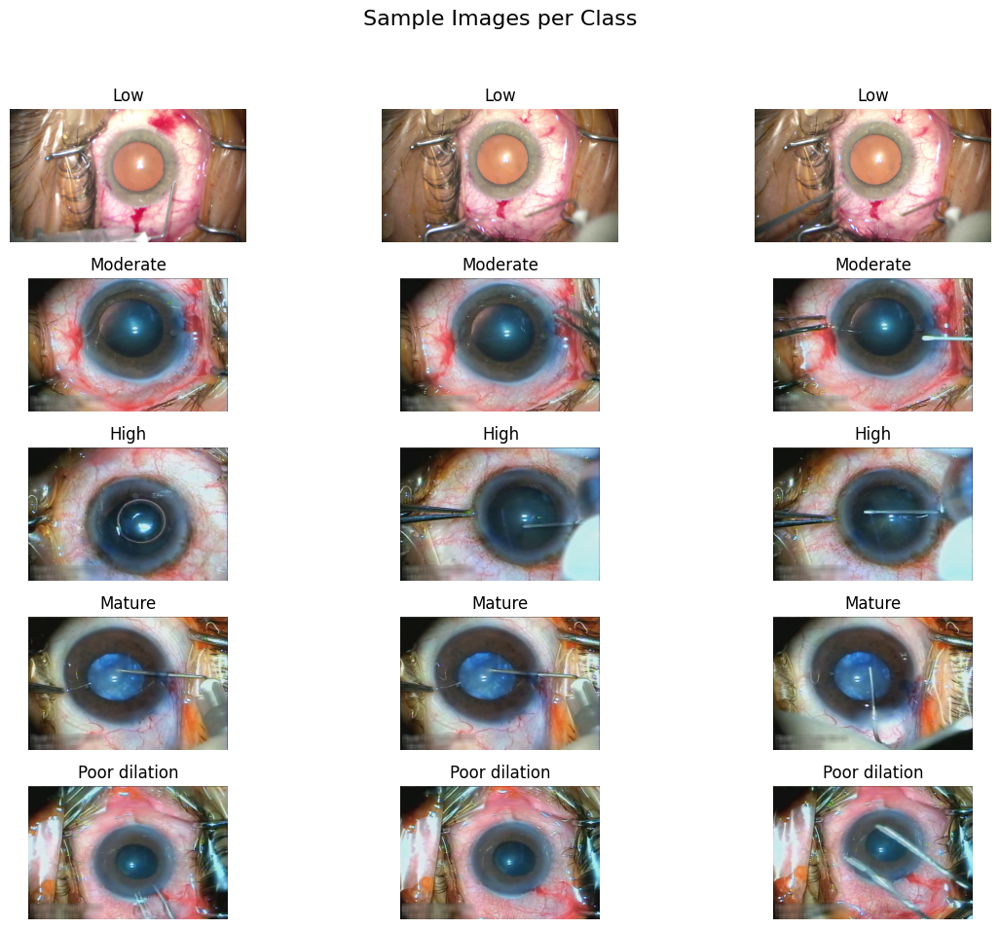

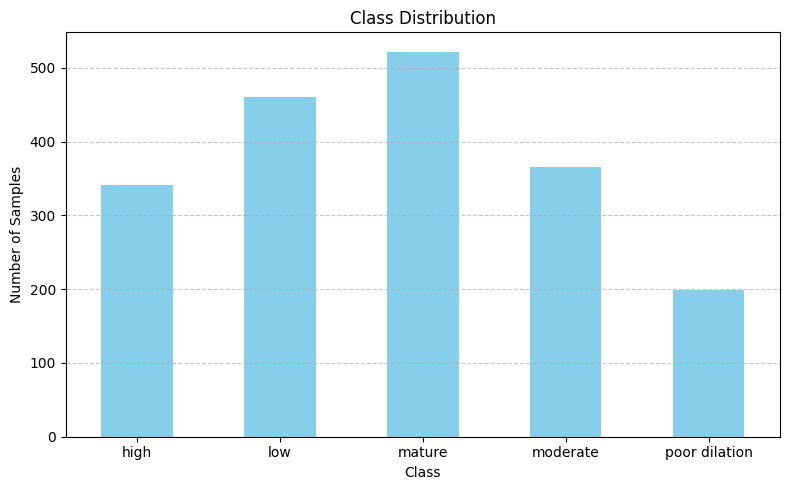

Downloading: "https://download.pytorch.org/models/efficientnet_b1-c27df63c.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b1-c27df63c.pth
100%|██████████| 30.1M/30.1M [00:00<00:00, 146MB/s]


Model is on device: cuda:0
Epoch: [1/50] | Step: [1/19] | Loss: 1.615573
Epoch: [1/50] | Step: [3/19] | Loss: 1.616501
Epoch: [1/50] | Step: [5/19] | Loss: 1.582337
Epoch: [1/50] | Step: [7/19] | Loss: 1.579391
Epoch: [1/50] | Step: [9/19] | Loss: 1.596815
Epoch: [1/50] | Step: [11/19] | Loss: 1.553418
Epoch: [1/50] | Step: [13/19] | Loss: 1.561719
Epoch: [1/50] | Step: [15/19] | Loss: 1.527594
Epoch: [1/50] | Step: [17/19] | Loss: 1.518590
Epoch: [1/50] | Step: [19/19] | Loss: 1.518596
Epoch: [1/50] | Loss: 1.518596
Valid Loss: 1.553254 | Acc: 0.3377
Epoch: [2/50] | Step: [1/19] | Loss: 1.510373
Epoch: [2/50] | Step: [3/19] | Loss: 1.552619
Epoch: [2/50] | Step: [5/19] | Loss: 1.509061
Epoch: [2/50] | Step: [7/19] | Loss: 1.455689
Epoch: [2/50] | Step: [9/19] | Loss: 1.466606
Epoch: [2/50] | Step: [11/19] | Loss: 1.464657
Epoch: [2/50] | Step: [13/19] | Loss: 1.501852
Epoch: [2/50] | Step: [15/19] | Loss: 1.416154
Epoch: [2/50] | Step: [17/19] | Loss: 1.471347
Epoch: [2/50] | Step: [1

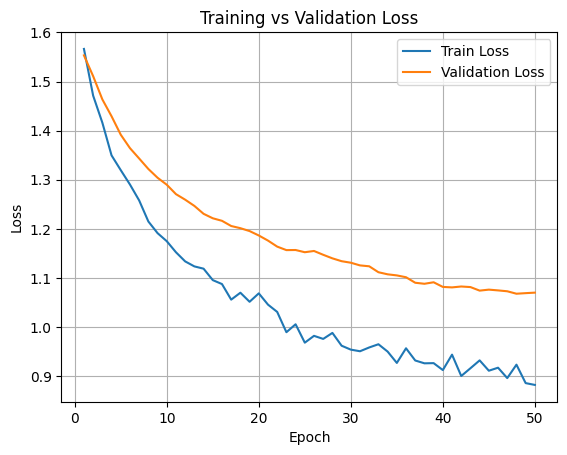

               precision    recall  f1-score   support

          low     0.5966    0.7717    0.6730        92
     moderate     0.4773    0.2877    0.3590        73
         high     0.6087    0.4118    0.4912        68
       mature     0.5926    0.7619    0.6667       105
poor dilation     0.9412    0.8000    0.8649        40

     accuracy                         0.6138       378
    macro avg     0.6433    0.6066    0.6109       378
 weighted avg     0.6111    0.6138    0.5982       378


Overall Accuracy: 0.6138
Macro F1-score  : 0.6109
Weighted F1-score: 0.5982


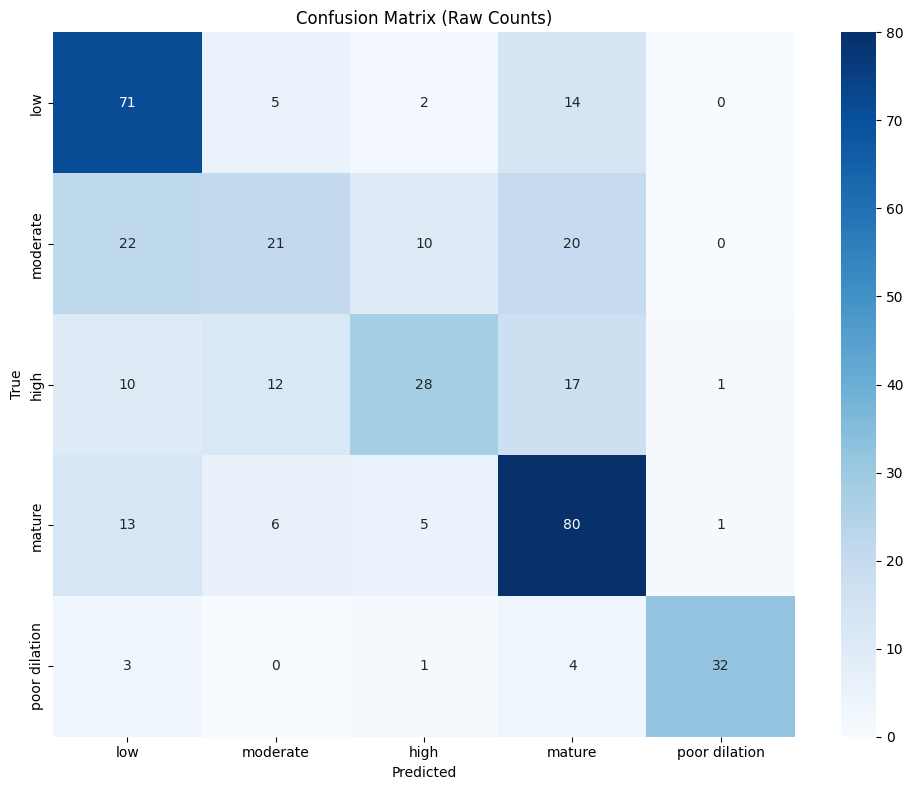

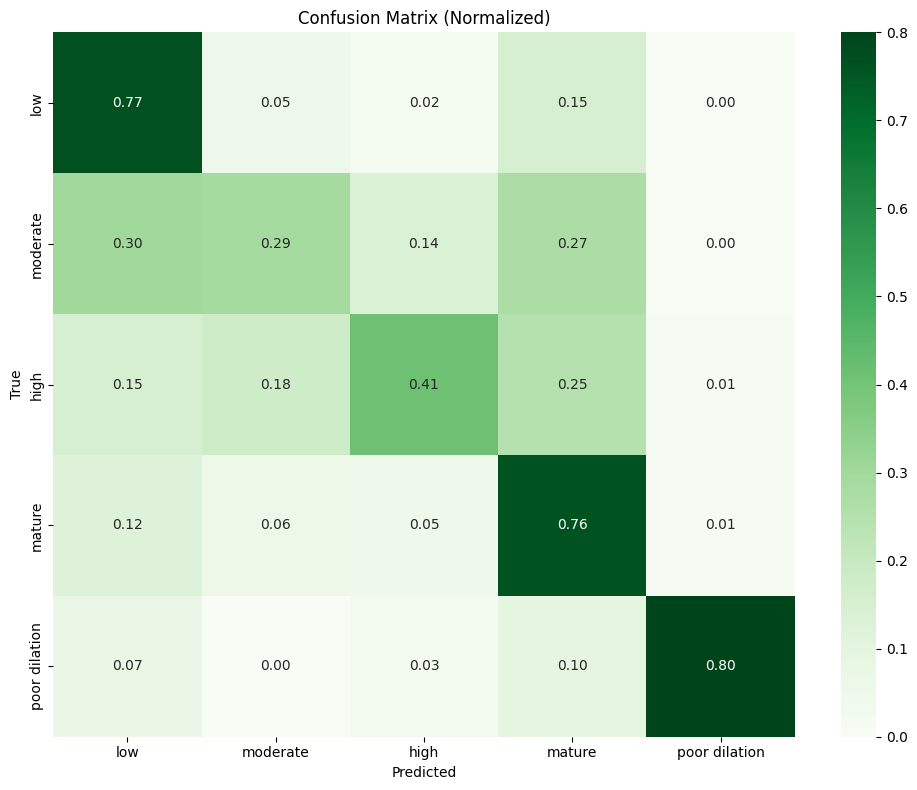

In [ ]:
CSV_PATH = "/content/dataset_V4.csv"
IMAGE_DIR = "/content/dataset_V4/dataset_V4"

train_loader, val_loader, test_loader, class_weights_tensor, df = get_dataloaders()


# Params
num_epochs = 50
lr = 1e-3
patience = 5
min_delta = 1e-4
best_val_loss = float('inf')
epochs_no_improve = 0

# Device configuration
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")



# Print dataset statistics
print(f"Total number of samples: {len(df)}")
print("\nClass distribution:")
print(df['label'].value_counts())

# Define the class labels (ordered)
classes = ["low", "moderate", "high", "mature", "poor dilation"]

# Create a subplot grid: 4 rows (classes) x 3 columns (images)
fig, axs = plt.subplots(len(classes), 3, figsize=(12, 10))
fig.suptitle("Sample Images per Class", fontsize=16)

# Loop over each class
for i, cls in enumerate(classes):
    class_samples = df[df["label"] == cls].head(3)
    for j, (_, row) in enumerate(class_samples.iterrows()):
        img_path = os.path.join(IMAGE_DIR, row["filename"] + ".jpg")
        try:
            image = Image.open(img_path)
            axs[i, j].imshow(image)
            axs[i, j].axis("off")
            axs[i, j].set_title(f"{cls.capitalize()}")
        except FileNotFoundError:
            axs[i, j].axis("off")
            axs[i, j].set_title("Image not found")

plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # adjust for suptitle
plt.show()

# Plot bar chart of class distribution
plt.figure(figsize=(8, 5))
df["label"].value_counts().sort_index().plot(kind='bar', color='skyblue')
plt.title("Class Distribution")
plt.xlabel("Class")
plt.ylabel("Number of Samples")
plt.xticks(rotation=0)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()




# Training
# model = resnet18(fine_tune=False).to(device)  # change to True if you want to fine-tune deeper layers
model = get_efficientnet_b1(fine_tune=False).to(device)
# Loss Function
# class_weights_tensor = class_weights_tensor.to(device)  # move to GPU
loss_fn = torch.nn.CrossEntropyLoss()

# Optimizer
# optimizer = torch.optim.Adam(model.fc.parameters(), lr=lr)
optimizer = torch.optim.AdamW(model.parameters(), lr=lr, weight_decay=1e-2)

# Scheduler
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3)


train_loss = []
valid_loss = []

print(f"Model is on device: {next(model.parameters()).device}")

# Train Loop
num_steps = len(train_loader)
for epochs in range(num_epochs):
    model.train()
    running_loss = 0.0
    for j, (imgs, lbls) in enumerate(train_loader):
        imgs, lbls = imgs.to(device), lbls.to(device)
        optimizer.zero_grad()
        out = model(imgs)
        loss = loss_fn(out, lbls)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
        if j % 2 == 0:
            print('Epoch: [{}/{}] | Step: [{}/{}] | Loss: {:.6f}'
                  .format(epochs+1, num_epochs, j+1, num_steps, loss.item()))
    train_loss.append(running_loss / num_steps)
    print('Epoch: [{}/{}] | Loss: {:.6f}'
          .format(epochs+1, num_epochs, loss.item()))

#---------------------
    model.eval()
    with torch.no_grad():
        correct = 0
        total = 0
        running_valid_loss = 0.0
        for imgs, lbls in val_loader:
            imgs, lbls = imgs.to(device), lbls.to(device)
            out = model(imgs)
            loss_val = loss_fn(out, lbls)
            running_valid_loss += loss_val.item()
            predicted = torch.argmax(out, dim=1)
            correct += (predicted == lbls).sum().item()
            total += lbls.size(0)
        avg_val_loss = running_valid_loss / len(val_loader)
        valid_loss.append(avg_val_loss)
        print('Valid Loss: {:.6f} | Acc: {:.4f}'.format(valid_loss[-1], correct / total))

        # Step the scheduler
        scheduler.step(avg_val_loss)


        # Early stopping
        if best_val_loss - avg_val_loss > min_delta:
            best_val_loss = avg_val_loss
            epochs_no_improve = 0
        else:
            epochs_no_improve += 1
            if epochs_no_improve >= patience:
                print("Early stopping triggered.")
                break

# Plot losses
plt.plot(range(1, len(train_loss)+1), train_loss, label='Train Loss')
plt.plot(range(1, len(valid_loss)+1), valid_loss, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training vs Validation Loss')
plt.legend()
plt.grid(True)
plt.show()




# # Predictions and true labels
# all_preds = []
# all_labels = []
#
# model.eval()
# with torch.no_grad():
#     for imgs, lbls in test_loader:
#         imgs = imgs.to(device)
#         outputs = model(imgs)
#         preds = torch.argmax(outputs, dim=1).cpu()
#         all_preds.extend(preds.numpy())
#         all_labels.extend(lbls.numpy())
#
# # Classification Report
# print(classification_report(all_labels, all_preds, target_names=classes))
#
# # Confusion Matrix
# cm = confusion_matrix(all_labels, all_preds)
# plt.figure(figsize=(10, 8))
# sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=classes, yticklabels=classes)
# plt.xlabel('Predicted')
# plt.ylabel('True')
# plt.title('Confusion Matrix')
# plt.show()
#


# Evaluation
all_preds = []
all_labels = []

model.eval()
with torch.no_grad():
    for imgs, lbls in test_loader:
        imgs, lbls = imgs.to(device), lbls.to(device)
        outputs = model(imgs)
        preds = torch.argmax(outputs, dim=1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(lbls.cpu().numpy())

# Convert to numpy arrays
all_preds = np.array(all_preds)
all_labels = np.array(all_labels)

# Print classification report
report = classification_report(all_labels, all_preds, target_names=classes, digits=4)
print(report)

# Save report as a dataframe (optional)
report_df = pd.DataFrame(classification_report(all_labels, all_preds, target_names=classes, output_dict=True)).T
report_df.to_csv("classification_report.csv")

# Accuracy and F1 scores
print(f"\nOverall Accuracy: {accuracy_score(all_labels, all_preds):.4f}")
print(f"Macro F1-score  : {f1_score(all_labels, all_preds, average='macro'):.4f}")
print(f"Weighted F1-score: {f1_score(all_labels, all_preds, average='weighted'):.4f}")

# Confusion Matrix
cm = confusion_matrix(all_labels, all_preds)
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

# Plot raw confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=classes, yticklabels=classes)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix (Raw Counts)')
plt.tight_layout()
plt.show()

# Plot normalized confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm_normalized, annot=True, fmt='.2f', cmap='Greens', xticklabels=classes, yticklabels=classes)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix (Normalized)')
plt.tight_layout()
plt.show()


torch.save(model.state_dict(), 'efficientnet_b1_cataract.pth')

In [ ]:
import os
import time
import psutil
import pandas as pd
import numpy as np
from tqdm import tqdm
from PIL import Image
import torch
import torch.nn as nn
from torchvision import models, transforms
from sklearn.metrics import classification_report
from collections import Counter
from torchvision.transforms import functional as TF

# ====== CUSTOM PAD TO SQUARE TRANSFORM ======
class PadToSquareWithMean:
    def __call__(self, image):
        w, h = image.size
        max_dim = max(w, h)
        pad_left = (max_dim - w) // 2
        pad_top = (max_dim - h) // 2
        pad_right = max_dim - w - pad_left
        pad_bottom = max_dim - h - pad_top

        # Compute mean color of the image (as RGB tuple)
        mean_color = image.resize((1, 1)).getpixel((0, 0))

        # Apply padding using the mean color
        return TF.pad(image, (pad_left, pad_top, pad_right, pad_bottom),
                      fill=mean_color, padding_mode='constant')

# ====== CONFIG ======
model_path = "/content/cataract_models/efficientnet_b1_cataract.pth"
image_dir = "/content/Test_Data/Test_Data"
label_csv_path = "/content/Test_Data.csv"
num_classes = 5
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Device used for inference: {device}")
class_names = ['low', 'moderate', 'high', 'mature', 'poor dilation']

# ====== TRANSFORMS ======
val_test_transform = transforms.Compose([
    PadToSquareWithMean(),
    transforms.Resize((240, 240)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])])

# ====== LOAD MODEL ======
print("\nLoading model...")
start_model_load = time.time()
# model = models.get_efficientnet_b1()
from torchvision.models import efficientnet_b1, EfficientNet_B1_Weights
model = efficientnet_b1(weights=EfficientNet_B1_Weights.DEFAULT)
model.classifier[1] = nn.Linear(model.classifier[1].in_features, num_classes)
model.load_state_dict(torch.load(model_path, map_location=device))
model.to(device)
model.eval()
end_model_load = time.time()
model_load_time = end_model_load - start_model_load
model_file_size = os.path.getsize(model_path) / (1024**2)  # MB

# ====== LOAD LABELS ======
df = pd.read_csv(label_csv_path)
df['filename'] = df['filename'].astype(str)
df['label'] = df['label'].str.strip().str.lower()

# ====== INFERENCE SETUP ======
y_true = []
y_pred = []
total_time = 0
total_images = 0

# Reset peak GPU memory stats
if device.type == "cuda":
    torch.cuda.reset_peak_memory_stats(device)

# Start monitoring CPU, RAM
process = psutil.Process(os.getpid())
cpu_before = psutil.cpu_percent(interval=1)
ram_before = process.memory_info().rss / (1024 ** 2)

# ====== RUN INFERENCE ======
for _, row in tqdm(df.iterrows(), total=len(df), desc="Running Inference"):
    filename, true_label = row['filename'], row['label']
    img_path = os.path.join(image_dir, filename + ".jpg")

    if not os.path.exists(img_path):
        print(f"Skipping missing file: {img_path}")
        continue

    img = Image.open(img_path).convert('RGB')
    input_tensor = val_test_transform(img).unsqueeze(0).to(device)

    start = time.time()
    with torch.no_grad():
        output = model(input_tensor)
        prob = torch.softmax(output, dim=1)
        pred_idx = torch.argmax(prob, dim=1).item()
    end = time.time()

    total_time += (end - start)
    total_images += 1
    y_true.append(true_label)
    y_pred.append(class_names[pred_idx])

# ====== RESOURCE USAGE ======
cpu_after = psutil.cpu_percent(interval=1)
ram_after = process.memory_info().rss / (1024 ** 2)
gpu_memory = 0
if device.type == "cuda":
    gpu_memory = torch.cuda.max_memory_allocated(device) / (1024 ** 2)

# ====== REPORT ======
print("\n====== Inference Results ======")
if total_images == 0:
    print("⚠️ No images were successfully processed.")
else:
    print(f"🕒 Average latency: {(total_time / total_images) * 1000:.2f} ms/image")
    print(f"⚡ Total inference time: {total_time:.2f} sec for {total_images} images")
print(f"🧊 Model load time: {model_load_time:.2f} sec")
print(f"📁 Model file size: {model_file_size:.2f} MB")
print(f"📈 CPU usage change: {cpu_after - cpu_before:.2f}%")
print(f"📦 RAM used change: {ram_after - ram_before:.2f} MB")
if device.type == "cuda":
    print(f"🧠 Peak GPU memory used: {gpu_memory:.2f} MB")

print("\n====== Classification Report ======")
if total_images > 0:
    print(classification_report(y_true, y_pred, target_names=class_names, zero_division=0))
    print("\nPrediction distribution:", Counter(y_pred))
    print("True label distribution:", Counter(y_true))


Device used for inference: cuda

Loading model...


Running Inference: 100%|██████████| 40/40 [00:01<00:00, 28.46it/s]



====== Inference Results ======
🕒 Average latency: 21.76 ms/image
⚡ Total inference time: 0.87 sec for 40 images
🧊 Model load time: 0.61 sec
📁 Model file size: 25.29 MB
📈 CPU usage change: 7.20%
📦 RAM used change: 253.14 MB
🧠 Peak GPU memory used: 46.09 MB

====== Classification Report ======
               precision    recall  f1-score   support

          low       0.80      0.57      0.67         7
     moderate       0.88      1.00      0.93         7
         high       0.60      1.00      0.75         6
       mature       1.00      0.77      0.87        13
poor dilation       1.00      1.00      1.00         7

     accuracy                           0.85        40
    macro avg       0.86      0.87      0.84        40
 weighted avg       0.88      0.85      0.85        40


Prediction distribution: Counter({'mature': 10, 'moderate': 10, 'low': 8, 'poor dilation': 7, 'high': 5})
True label distribution: Counter({'moderate': 13, 'low': 7, 'high': 7, 'poor dilation': 7, 'mature':

In [ ]:
# ========== Config ==========
CSV_PATH = "dataset_V4.csv"
IMAGE_DIR = "/content/dataset_V4/dataset_V4"
BATCH_SIZE = 64

# ========== Dataset ==========
class CataractDataset(Dataset):
    def __init__(self, dataframe, image_dir, transform=None):
        self.data = dataframe.reset_index(drop=True)
        self.image_dir = image_dir
        self.transform = transform
        self.label_map = {"low": 0, "moderate": 1, "high": 2, "mature": 3, "poor dilation": 4}

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        row = self.data.iloc[idx]
        img_path = os.path.join(self.image_dir, row["filename"] + ".jpg")
        try:
            image = Image.open(img_path).convert("RGB")
        except FileNotFoundError:
            print(f"Missing image: {img_path}")
            return self.__getitem__((idx + 1) % len(self.data))

        label = self.label_map[row["label"].lower()]
        if self.transform:
            image = self.transform(image)
        return image, torch.tensor(label)

# ========== Load and Prepare CSV ==========
df = pd.read_csv(CSV_PATH)
df.columns = df.columns.str.strip()
df.rename(columns={"Frame Name": "filename"}, inplace=True)

# Derive label column from binary indicators
df["label"] = None
df.loc[df["Low Nuclear Density"] == 1.0, "label"] = "low"
df.loc[df["Moderate Nuclear Density"] == 1.0, "label"] = "moderate"
df.loc[df["High Nuclear Density"] == 1.0, "label"] = "high"
df.loc[df["Mature"] == 1.0, "label"] = "mature"
df.loc[df["Poor Dilation"] == 1.0, "label"] = "poor dilation"


# Keep only valid rows
df = df[df["label"].notna()]
df = df[["filename", "label"]]

# ========== Train / Val / Test Split ==========
train_val_df, test_df = train_test_split(df, test_size=0.2, stratify=df["label"], random_state=42)
train_df, val_df = train_test_split(train_val_df, test_size=0.2, stratify=train_val_df["label"], random_state=42)

# Map labels to integer indices
label_map = {"low": 0, "moderate": 1, "high": 2, "mature": 3, "poor dilation": 4}
train_df["class_idx"] = train_df["label"].map(label_map)

# Compute class weights
class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(train_df["class_idx"]),
    y=train_df["class_idx"]
)
class_weights_tensor = torch.tensor(class_weights, dtype=torch.float)

# ========== Transforms ==========
transform = transforms.Compose([
    PadToSquareWithMean(),  # <-- add this at the top
    transforms.Resize((260, 260)),  # match model input size
    transforms.RandomRotation(degrees=15),
    transforms.RandomAffine(degrees=10, translate=(0.05, 0.05), scale=(0.95, 1.05)),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
    transforms.RandomErasing(p=0.3)
])
val_test_transform = transforms.Compose([
    PadToSquareWithMean(),
    transforms.Resize((260, 260)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])


# ========== Datasets and Dataloaders ==========
train_dataset = CataractDataset(train_df, IMAGE_DIR, transform)
# val_dataset = CataractDataset(val_df, IMAGE_DIR, transform)
# test_dataset = CataractDataset(test_df, IMAGE_DIR, transform)
val_dataset = CataractDataset(val_df, IMAGE_DIR, val_test_transform)
test_dataset = CataractDataset(test_df, IMAGE_DIR, val_test_transform)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False)

# ========== Return Utility ==========
def get_dataloaders():
    return train_loader, val_loader, test_loader, class_weights_tensor, df


In [ ]:
import torch.nn as nn
from torchvision import models

def efficientnet_b2(weights="DEFAULT", fine_tune=True):
    """
    EfficientNet-B2 adapted to 5 classes.

    Parameters
    ----------
    weights : str | torchvision.models.EfficientNet_B2_Weights | None
        "DEFAULT"  → ImageNet-1K weights (torchvision ≥0.15).
        None       → random initialization.
        Or pass an explicit EfficientNet_B2_Weights enum.
    fine_tune : bool
        True  → freeze everything except last two MBConv blocks + classifier.
        False → leave all layers trainable.

    Returns
    -------
    model : nn.Module
    """

    # 1) Load backbone
    eff_weights = (
        models.EfficientNet_B2_Weights.DEFAULT if weights == "DEFAULT" else weights
    )
    model = models.efficientnet_b2(weights=eff_weights)

    # 2) Freeze / unfreeze
    if fine_tune:
        for p in model.parameters():
            p.requires_grad = False
        # Unfreeze the deepest layers (features.6 & features.7) and the classifier
        for name, p in model.named_parameters():
            if name.startswith(("features.6", "features.7", "classifier")):
                p.requires_grad = True

    # 3) Replace classifier head (EffNet-B2 head = Sequential[Dropout, Linear])
    in_feats = model.classifier[1].in_features
    model.classifier[1] = nn.Linear(in_feats, 5)   # 5 classes

    return model


Using device: cuda
Total number of samples: 1888

Class distribution:
label
mature           522
low              460
moderate         366
high             341
poor dilation    199
Name: count, dtype: int64


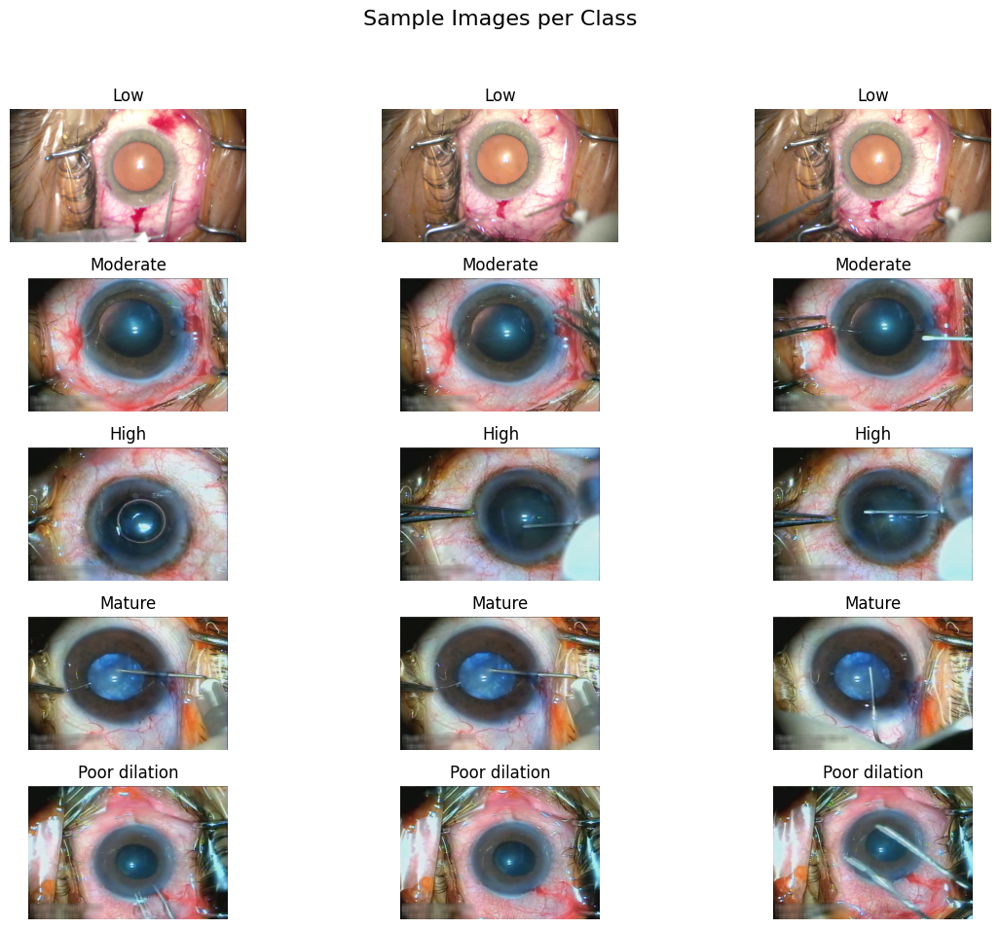

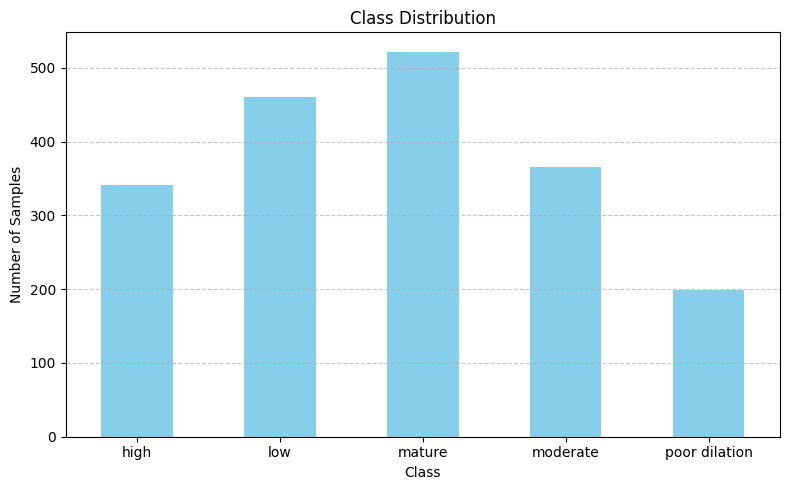

Model is on device: cuda:0
Epoch: [1/60] | Step: [1/19] | Loss: 1.583430
Epoch: [1/60] | Step: [3/19] | Loss: 1.581693
Epoch: [1/60] | Step: [5/19] | Loss: 1.599311
Epoch: [1/60] | Step: [7/19] | Loss: 1.577883
Epoch: [1/60] | Step: [9/19] | Loss: 1.595334
Epoch: [1/60] | Step: [11/19] | Loss: 1.563641
Epoch: [1/60] | Step: [13/19] | Loss: 1.508713
Epoch: [1/60] | Step: [15/19] | Loss: 1.489729
Epoch: [1/60] | Step: [17/19] | Loss: 1.513242
Epoch: [1/60] | Step: [19/19] | Loss: 1.601082
Epoch: [1/60] | Loss: 1.601082
Valid Loss: 1.483707 | Acc: 0.3245
Epoch: [2/60] | Step: [1/19] | Loss: 1.476419
Epoch: [2/60] | Step: [3/19] | Loss: 1.479751
Epoch: [2/60] | Step: [5/19] | Loss: 1.532174
Epoch: [2/60] | Step: [7/19] | Loss: 1.524197
Epoch: [2/60] | Step: [9/19] | Loss: 1.543919
Epoch: [2/60] | Step: [11/19] | Loss: 1.540334
Epoch: [2/60] | Step: [13/19] | Loss: 1.494959
Epoch: [2/60] | Step: [15/19] | Loss: 1.482435
Epoch: [2/60] | Step: [17/19] | Loss: 1.411986
Epoch: [2/60] | Step: [1

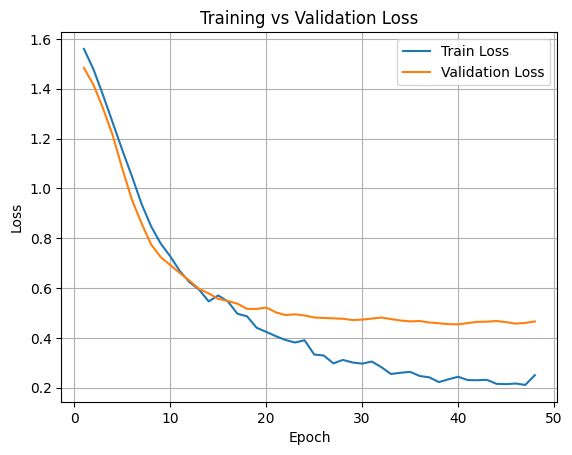

               precision    recall  f1-score   support

          low     0.8646    0.9022    0.8830        92
     moderate     0.8226    0.6986    0.7556        73
         high     0.7143    0.8088    0.7586        68
       mature     0.8762    0.8762    0.8762       105
poor dilation     0.8684    0.8250    0.8462        40

     accuracy                         0.8307       378
    macro avg     0.8292    0.8222    0.8239       378
 weighted avg     0.8331    0.8307    0.8302       378


Overall Accuracy: 0.8307
Macro F1-score  : 0.8239
Weighted F1-score: 0.8302


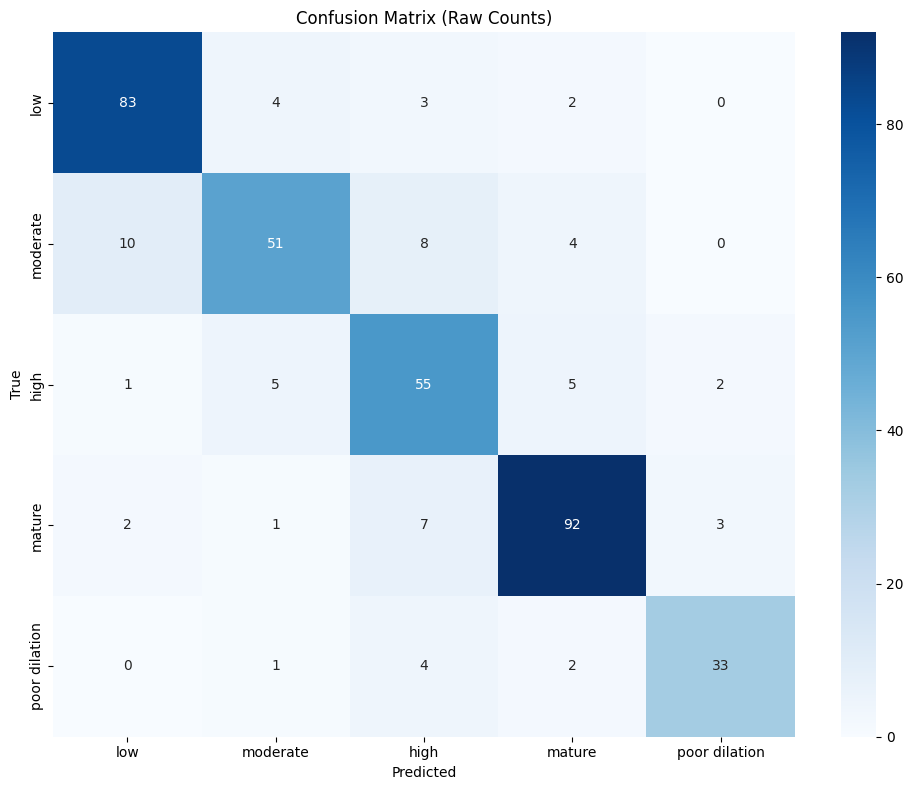

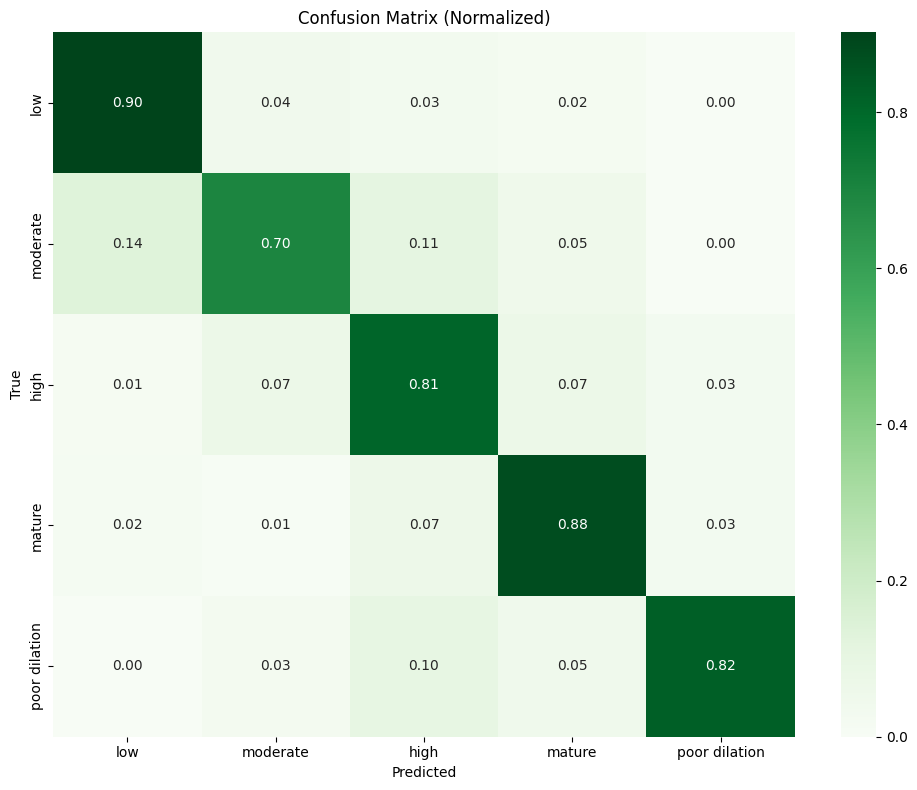

In [ ]:
CSV_PATH = "/content/dataset_V4.csv"
IMAGE_DIR = "/content/dataset_V4/dataset_V4"

train_loader, val_loader, test_loader, class_weights_tensor, df = get_dataloaders()


# Params
num_epochs = 60
lr = 1e-3
patience = 8
min_delta = 1e-4
best_val_loss = float('inf')
epochs_no_improve = 0

# Device configuration
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")



# Print dataset statistics
print(f"Total number of samples: {len(df)}")
print("\nClass distribution:")
print(df['label'].value_counts())

# Define the class labels (ordered)
classes = ["low", "moderate", "high", "mature", "poor dilation"]

# Create a subplot grid: 4 rows (classes) x 3 columns (images)
fig, axs = plt.subplots(len(classes), 3, figsize=(12, 10))
fig.suptitle("Sample Images per Class", fontsize=16)

# Loop over each class
for i, cls in enumerate(classes):
    class_samples = df[df["label"] == cls].head(3)
    for j, (_, row) in enumerate(class_samples.iterrows()):
        img_path = os.path.join(IMAGE_DIR, row["filename"] + ".jpg")
        try:
            image = Image.open(img_path)
            axs[i, j].imshow(image)
            axs[i, j].axis("off")
            axs[i, j].set_title(f"{cls.capitalize()}")
        except FileNotFoundError:
            axs[i, j].axis("off")
            axs[i, j].set_title("Image not found")

plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # adjust for suptitle
plt.show()

# Plot bar chart of class distribution
plt.figure(figsize=(8, 5))
df["label"].value_counts().sort_index().plot(kind='bar', color='skyblue')
plt.title("Class Distribution")
plt.xlabel("Class")
plt.ylabel("Number of Samples")
plt.xticks(rotation=0)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()




# Training
# model = resnet18(fine_tune=False).to(device)  # change to True if you want to fine-tune deeper layers
model = efficientnet_b2(fine_tune=True).to(device)
# Loss Function
# class_weights_tensor = class_weights_tensor.to(device)  # move to GPU
loss_fn = torch.nn.CrossEntropyLoss()

# Optimizer
# optimizer = torch.optim.Adam(model.fc.parameters(), lr=lr)
# optimizer = torch.optim.AdamW(model.parameters(), lr=lr, weight_decay=1e-2)

optimizer = torch.optim.AdamW([
    {"params": model.features.parameters(), "lr": 3e-5},   # very small LR for backbone
    {"params": model.classifier.parameters(), "lr": 3e-4}  # higher LR for classifier
], weight_decay=1e-2)

# Scheduler
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3)


train_loss = []
valid_loss = []

print(f"Model is on device: {next(model.parameters()).device}")

# Train Loop
num_steps = len(train_loader)
for epochs in range(num_epochs):
    model.train()
    running_loss = 0.0
    for j, (imgs, lbls) in enumerate(train_loader):
        imgs, lbls = imgs.to(device), lbls.to(device)
        optimizer.zero_grad()
        out = model(imgs)
        loss = loss_fn(out, lbls)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
        if j % 2 == 0:
            print('Epoch: [{}/{}] | Step: [{}/{}] | Loss: {:.6f}'
                  .format(epochs+1, num_epochs, j+1, num_steps, loss.item()))
    train_loss.append(running_loss / num_steps)
    print('Epoch: [{}/{}] | Loss: {:.6f}'
          .format(epochs+1, num_epochs, loss.item()))

#---------------------
    model.eval()
    with torch.no_grad():
        correct = 0
        total = 0
        running_valid_loss = 0.0
        for imgs, lbls in val_loader:
            imgs, lbls = imgs.to(device), lbls.to(device)
            out = model(imgs)
            loss_val = loss_fn(out, lbls)
            running_valid_loss += loss_val.item()
            predicted = torch.argmax(out, dim=1)
            correct += (predicted == lbls).sum().item()
            total += lbls.size(0)
        avg_val_loss = running_valid_loss / len(val_loader)
        valid_loss.append(avg_val_loss)
        print('Valid Loss: {:.6f} | Acc: {:.4f}'.format(valid_loss[-1], correct / total))

        # Step the scheduler
        scheduler.step(avg_val_loss)


        # Early stopping
        if best_val_loss - avg_val_loss > min_delta:
            best_val_loss = avg_val_loss
            epochs_no_improve = 0
        else:
            epochs_no_improve += 1
            if epochs_no_improve >= patience:
                print("Early stopping triggered.")
                break

# Plot losses
plt.plot(range(1, len(train_loss)+1), train_loss, label='Train Loss')
plt.plot(range(1, len(valid_loss)+1), valid_loss, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training vs Validation Loss')
plt.legend()
plt.grid(True)
plt.show()




# # Predictions and true labels
# all_preds = []
# all_labels = []
#
# model.eval()
# with torch.no_grad():
#     for imgs, lbls in test_loader:
#         imgs = imgs.to(device)
#         outputs = model(imgs)
#         preds = torch.argmax(outputs, dim=1).cpu()
#         all_preds.extend(preds.numpy())
#         all_labels.extend(lbls.numpy())
#
# # Classification Report
# print(classification_report(all_labels, all_preds, target_names=classes))
#
# # Confusion Matrix
# cm = confusion_matrix(all_labels, all_preds)
# plt.figure(figsize=(10, 8))
# sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=classes, yticklabels=classes)
# plt.xlabel('Predicted')
# plt.ylabel('True')
# plt.title('Confusion Matrix')
# plt.show()
#


# Evaluation
all_preds = []
all_labels = []

model.eval()
with torch.no_grad():
    for imgs, lbls in test_loader:
        imgs, lbls = imgs.to(device), lbls.to(device)
        outputs = model(imgs)
        preds = torch.argmax(outputs, dim=1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(lbls.cpu().numpy())

# Convert to numpy arrays
all_preds = np.array(all_preds)
all_labels = np.array(all_labels)

# Print classification report
report = classification_report(all_labels, all_preds, target_names=classes, digits=4)
print(report)

# Save report as a dataframe (optional)
report_df = pd.DataFrame(classification_report(all_labels, all_preds, target_names=classes, output_dict=True)).T
report_df.to_csv("classification_report.csv")

# Accuracy and F1 scores
print(f"\nOverall Accuracy: {accuracy_score(all_labels, all_preds):.4f}")
print(f"Macro F1-score  : {f1_score(all_labels, all_preds, average='macro'):.4f}")
print(f"Weighted F1-score: {f1_score(all_labels, all_preds, average='weighted'):.4f}")

# Confusion Matrix
cm = confusion_matrix(all_labels, all_preds)
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

# Plot raw confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=classes, yticklabels=classes)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix (Raw Counts)')
plt.tight_layout()
plt.show()

# Plot normalized confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm_normalized, annot=True, fmt='.2f', cmap='Greens', xticklabels=classes, yticklabels=classes)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix (Normalized)')
plt.tight_layout()
plt.show()



torch.save(model.state_dict(), "efficientnet_b2_cataract.pth")


**EFFICIENTNET B2 WITH OVERSAMPLING**

In [ ]:
# Imports
import os
import random
import pandas as pd
from PIL import Image
from torchvision import transforms
from torch.utils.data import Dataset, ConcatDataset, DataLoader
from torchvision import models
from google.colab import drive
import pandas as pd
from sklearn.model_selection import train_test_split
from torch.utils.data import DataLoader
from torchvision.transforms import functional as TF
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
import matplotlib.pyplot as plt
import multiprocessing
from sklearn.metrics import accuracy_score, f1_score, classification_report, confusion_matrix, ConfusionMatrixDisplay, roc_auc_score
import matplotlib.pyplot as plt
import torch.nn.functional as F
from sklearn.utils.class_weight import compute_class_weight
from torch.optim.lr_scheduler import ReduceLROnPlateau
import seaborn as sns
from torch.optim.lr_scheduler import CosineAnnealingLR
# Step 1: Mount Google Drive
# drive.mount('/content/drive')
drive.mount("/content/drive", force_remount=True)
# Step 2: Define paths (edit these if needed)
zip_path = "/content/drive/MyDrive/dataset_V6.zip"  # <-- change this if your file is in a folder
extract_dir = "/content/dataset_V6"

# Step 3: Unzip the dataset
import zipfile

os.makedirs(extract_dir, exist_ok=True)

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_dir)

print(f"✅ Extracted dataset to: {extract_dir}")




# Step 4 (Optional): Copy the CSV if it's also on Drive
# If your CSV is in MyDrive, adjust the path accordingly

csv_drive_path = "/content/drive/MyDrive/dataset_V6.csv"
csv_colab_path = "/content/dataset_V6.csv"

!cp "{csv_drive_path}" "{csv_colab_path}"

print(f"✅ CSV copied to: {csv_colab_path}")




Mounted at /content/drive
✅ Extracted dataset to: /content/dataset_V6
✅ CSV copied to: /content/dataset_V6.csv


In [ ]:
class PadToSquareWithMean:
    def __call__(self, image):
        w, h = image.size
        max_dim = max(w, h)
        pad_left = (max_dim - w) // 2
        pad_top = (max_dim - h) // 2
        pad_right = max_dim - w - pad_left
        pad_bottom = max_dim - h - pad_top

        # Compute true mean color
        np_img = np.array(image)
        mean_color = tuple(np_img.reshape(-1, 3).mean(axis=0).astype(np.uint8))

        return TF.pad(image, (pad_left, pad_top, pad_right, pad_bottom),
                      fill=mean_color, padding_mode='constant')

CSV_PATH = "dataset_V6.csv"
IMAGE_DIR = "/content/dataset_V6/dataset_V6"

# ===== Base + Augmentation Transforms =====
base_transform = transforms.Compose([
    PadToSquareWithMean(),
    transforms.Resize((300, 300)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])  # standard ImageNet normalization
])

aug_transform = transforms.Compose([
    PadToSquareWithMean(),
    transforms.Resize((300, 300)),
    transforms.RandomRotation(25),
    transforms.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.3),
    transforms.RandomAffine(15, translate=(0.1,0.1)),
    # transforms.RandomResizedCrop(224, scale=(0.7, 1.0)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

# ========== Dataset ==========
class CataractDataset(Dataset):
    def __init__(self, dataframe, image_dir, transform=None):
        self.data = dataframe.reset_index(drop=True)
        self.image_dir = image_dir
        self.transform = transform
        self.label_map = {"low": 0, "moderate": 1, "high": 2, "mature": 3, "poor dilation": 4}

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        row = self.data.iloc[idx]
        img_path = os.path.join(self.image_dir, row["filename"] + ".jpg")
        try:
            image = Image.open(img_path).convert("RGB")
        except FileNotFoundError:
            print(f"Missing image: {img_path}")
            return self.__getitem__((idx + 1) % len(self.data))

        label = self.label_map[row["label"].lower()]
        if self.transform:
            image = self.transform(image)
        return image, torch.tensor(label)

# ========== Load and Prepare CSV ==========
df = pd.read_csv(CSV_PATH)
df.columns = df.columns.str.strip()
df.rename(columns={"Frame Name": "filename"}, inplace=True)

# Derive label column from binary indicators
df["label"] = None
df.loc[df["Low Nuclear Density"] == 1.0, "label"] = "low"
df.loc[df["Moderate Nuclear Density"] == 1.0, "label"] = "moderate"
df.loc[df["High Nuclear Density"] == 1.0, "label"] = "high"
df.loc[df["Mature"] == 1.0, "label"] = "mature"
df.loc[df["Poor Dilation"] == 1.0, "label"] = "poor dilation"


# Keep only valid rows
df = df[df["label"].notna()]
df = df[["filename", "label"]]
# ========= Balance Function =========
def balance_dataset(df, image_dir, target_per_class =800):
    datasets = []
    class_counts = df['label'].value_counts().to_dict()
    augmented_summary = {}

    for label, count in class_counts.items():
        class_df = df[df['label'] == label]

        # Keep all original samples
        datasets.append(CataractDataset(class_df, image_dir, transform=base_transform))

        # Only add augmentation if class is below target
        if count < target_per_class:
            needed = target_per_class - count
            aug_rows = class_df.sample(needed, replace=True, random_state=42)
            datasets.append(CataractDataset(aug_rows, image_dir, transform=aug_transform))
            augmented_summary[label] = needed
        else:
            augmented_summary[label] = 0  # nothing added

    balanced_dataset = ConcatDataset(datasets)

    # Print summary
    print("\n=== Balancing Summary (No Downsampling) ===")
    for label, count in class_counts.items():
        added = augmented_summary[label]
        final_count = count + added
        print(f"{label:15s} | Original: {count:4d} | Added: {added:4d} | Final: {final_count:4d}")
    print(f"\nTotal balanced dataset size: {len(balanced_dataset)}")

    return balanced_dataset


df = pd.read_csv(CSV_PATH)
df.columns = df.columns.str.strip()
df.rename(columns={"Frame Name": "filename"}, inplace=True)

# Derive labels from binary indicators
df["label"] = None
df.loc[df["Low Nuclear Density"] == 1.0, "label"] = "low"
df.loc[df["Moderate Nuclear Density"] == 1.0, "label"] = "moderate"
df.loc[df["High Nuclear Density"] == 1.0, "label"] = "high"
df.loc[df["Mature"] == 1.0, "label"] = "mature"
df.loc[df["Poor Dilation"] == 1.0, "label"] = "poor dilation"

df = df[df["label"].notna()]
df = df[["filename", "label"]]

# ========= Split Dataset =========
train_df, temp_df = train_test_split(df, test_size=0.3, stratify=df['label'], random_state=42)
val_df, test_df = train_test_split(temp_df, test_size=0.5, stratify=temp_df['label'], random_state=42)

print(f"Train: {len(train_df)}, Val: {len(val_df)}, Test: {len(test_df)}")

# ========= Create Datasets =========
train_dataset = balance_dataset(train_df, IMAGE_DIR, target_per_class=800)
val_dataset = CataractDataset(val_df, IMAGE_DIR, transform=base_transform)
test_dataset = CataractDataset(test_df, IMAGE_DIR, transform=base_transform)

# ========= Create DataLoaders =========
BATCH_SIZE = 64
num_cpu = multiprocessing.cpu_count()
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=num_cpu//2, pin_memory=True)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=num_cpu//2, pin_memory=True)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=num_cpu//2, pin_memory=True)



Train: 1404, Val: 301, Test: 301

=== Balancing Summary (No Downsampling) ===
mature          | Original:  367 | Added:  433 | Final:  800
low             | Original:  323 | Added:  477 | Final:  800
high            | Original:  298 | Added:  502 | Final:  800
poor dilation   | Original:  251 | Added:  549 | Final:  800
moderate        | Original:  165 | Added:  635 | Final:  800

Total balanced dataset size: 4000


In [ ]:
import torch.nn as nn
from torchvision import models

def efficientnet_b2(weights="DEFAULT", fine_tune=True):
    """
    EfficientNet-B2 adapted to 5 classes.

    Parameters
    ----------
    weights : str | torchvision.models.EfficientNet_B2_Weights | None
        "DEFAULT"  → ImageNet-1K weights (torchvision ≥0.15).
        None       → random initialization.
        Or pass an explicit EfficientNet_B2_Weights enum.
    fine_tune : bool
        True  → freeze everything except last two MBConv blocks + classifier.
        False → leave all layers trainable.

    Returns
    -------
    model : nn.Module
    """

    # 1) Load backbone
    eff_weights = (
        models.EfficientNet_B2_Weights.DEFAULT if weights == "DEFAULT" else weights
    )
    model = models.efficientnet_b2(weights=eff_weights)

    # 2) Freeze / unfreeze
    if fine_tune:
        for p in model.parameters():
            p.requires_grad = False
        # Unfreeze the deepest layers (features.6 & features.7) and the classifier
        for name, p in model.named_parameters():
            # p.requires_grad = True

            if name.startswith(("features.6", "features.7", "classifier")):
                p.requires_grad = True

    # 3) Replace classifier head (EffNet-B2 head = Sequential[Dropout, Linear])
    in_feats = model.classifier[1].in_features
    model.classifier[1] = nn.Linear(in_feats, 5)   # 5 classes

    return model


Using device: cuda
Total number of samples: 2006

Class distribution:
label
mature           524
low              462
high             425
poor dilation    359
moderate         236
Name: count, dtype: int64


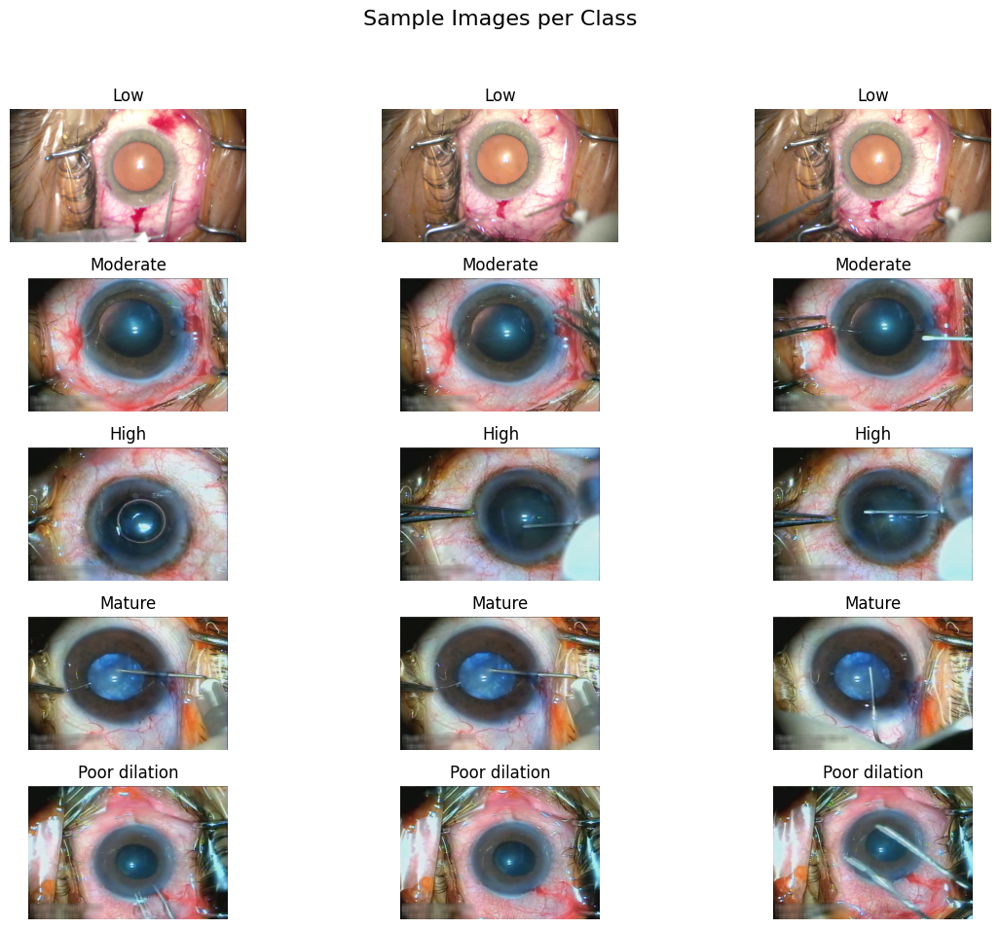

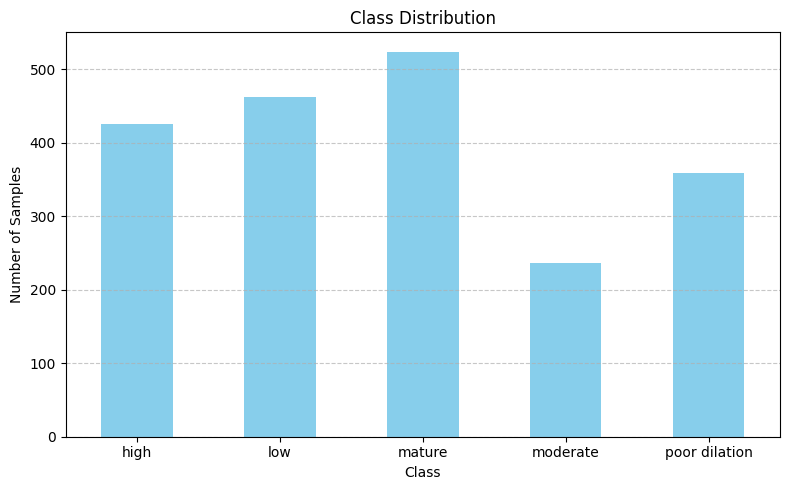

Downloading: "https://download.pytorch.org/models/efficientnet_b2_rwightman-c35c1473.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b2_rwightman-c35c1473.pth
100%|██████████| 35.2M/35.2M [00:00<00:00, 94.1MB/s]


Model is on device: cuda:0
Epoch: [1/60] | Step: [1/63] | Loss: 1.586367
Epoch: [1/60] | Step: [3/63] | Loss: 1.596070
Epoch: [1/60] | Step: [5/63] | Loss: 1.580600
Epoch: [1/60] | Step: [7/63] | Loss: 1.620046
Epoch: [1/60] | Step: [9/63] | Loss: 1.611030
Epoch: [1/60] | Step: [11/63] | Loss: 1.565484
Epoch: [1/60] | Step: [13/63] | Loss: 1.569932
Epoch: [1/60] | Step: [15/63] | Loss: 1.511592
Epoch: [1/60] | Step: [17/63] | Loss: 1.581734
Epoch: [1/60] | Step: [19/63] | Loss: 1.538401
Epoch: [1/60] | Step: [21/63] | Loss: 1.552484
Epoch: [1/60] | Step: [23/63] | Loss: 1.462782
Epoch: [1/60] | Step: [25/63] | Loss: 1.521881
Epoch: [1/60] | Step: [27/63] | Loss: 1.494592
Epoch: [1/60] | Step: [29/63] | Loss: 1.503524
Epoch: [1/60] | Step: [31/63] | Loss: 1.427012
Epoch: [1/60] | Step: [33/63] | Loss: 1.522470
Epoch: [1/60] | Step: [35/63] | Loss: 1.447331
Epoch: [1/60] | Step: [37/63] | Loss: 1.446859
Epoch: [1/60] | Step: [39/63] | Loss: 1.437929
Epoch: [1/60] | Step: [41/63] | Loss: 

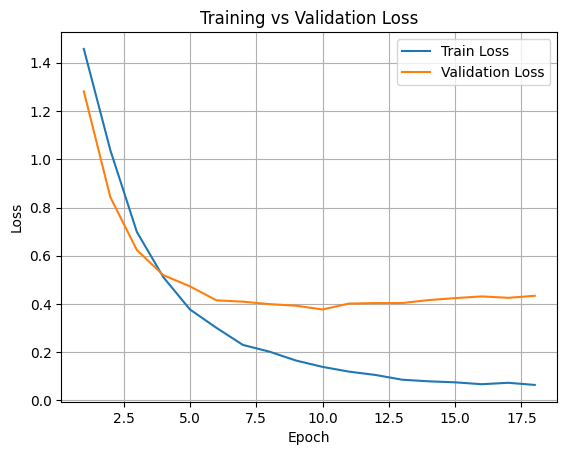

               precision    recall  f1-score   support

          low     0.9552    0.9275    0.9412        69
     moderate     0.8485    0.8000    0.8235        35
         high     0.8286    0.9062    0.8657        64
       mature     0.9589    0.8861    0.9211        79
poor dilation     0.8793    0.9444    0.9107        54

     accuracy                         0.9003       301
    macro avg     0.8941    0.8929    0.8924       301
 weighted avg     0.9032    0.9003    0.9007       301


Overall Accuracy: 0.9003
Macro F1-score  : 0.8924
Weighted F1-score: 0.9007


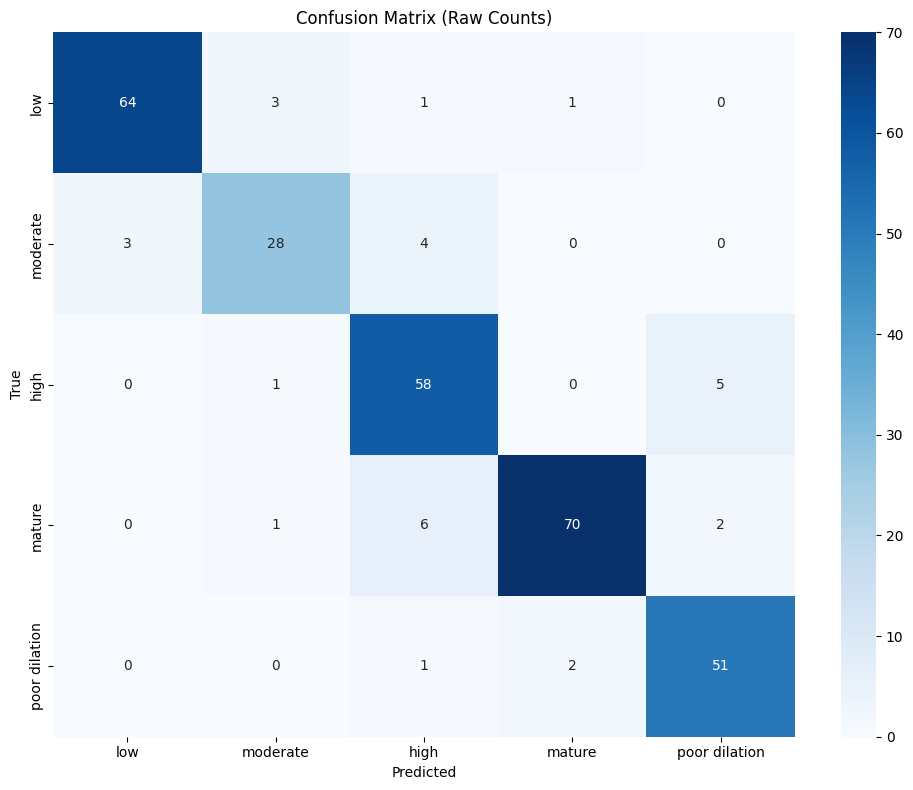

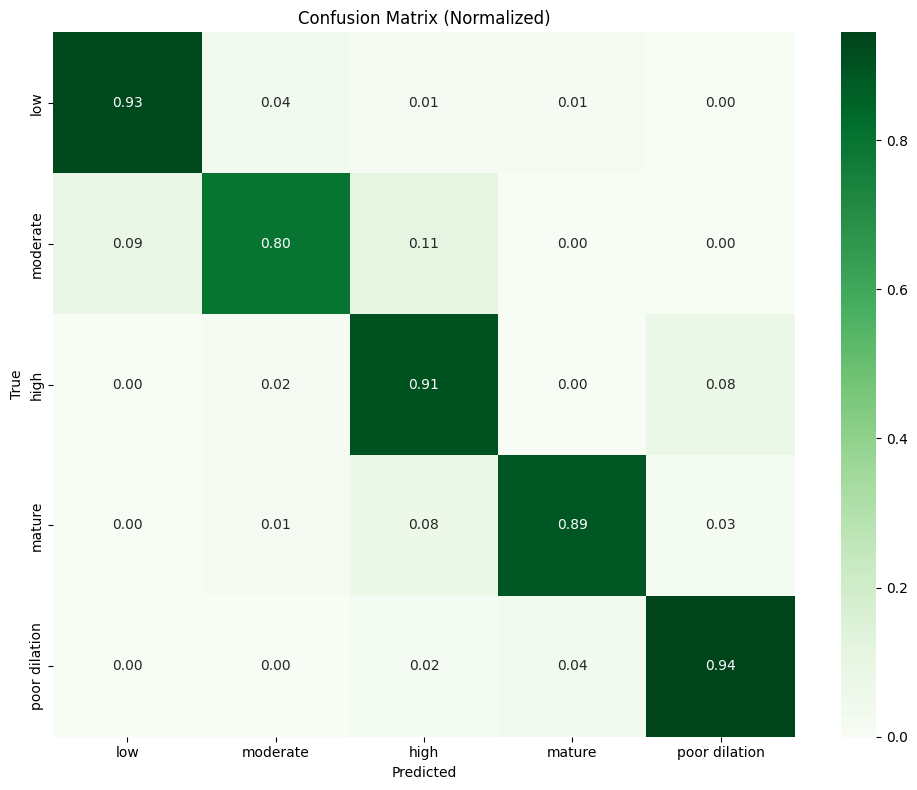

In [ ]:
CSV_PATH = "/content/dataset_V6.csv"
IMAGE_DIR = "/content/dataset_V6/dataset_V6"

# train_loader, val_loader, test_loader, class_weights_tensor, df = get_dataloaders()


# Params
num_epochs = 60
lr = 1e-3
patience = 8
min_delta = 1e-4
best_val_loss = float('inf')
epochs_no_improve = 0

# Device configuration
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")



# Print dataset statistics
print(f"Total number of samples: {len(df)}")
print("\nClass distribution:")
print(df['label'].value_counts())

# Define the class labels (ordered)
classes = ["low", "moderate", "high", "mature", "poor dilation"]

# Create a subplot grid: 4 rows (classes) x 3 columns (images)
fig, axs = plt.subplots(len(classes), 3, figsize=(12, 10))
fig.suptitle("Sample Images per Class", fontsize=16)

# Loop over each class
for i, cls in enumerate(classes):
    class_samples = df[df["label"] == cls].head(3)
    for j, (_, row) in enumerate(class_samples.iterrows()):
        img_path = os.path.join(IMAGE_DIR, row["filename"] + ".jpg")
        try:
            image = Image.open(img_path)
            axs[i, j].imshow(image)
            axs[i, j].axis("off")
            axs[i, j].set_title(f"{cls.capitalize()}")
        except FileNotFoundError:
            axs[i, j].axis("off")
            axs[i, j].set_title("Image not found")

plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # adjust for suptitle
plt.show()

# Plot bar chart of class distribution
plt.figure(figsize=(8, 5))
df["label"].value_counts().sort_index().plot(kind='bar', color='skyblue')
plt.title("Class Distribution")
plt.xlabel("Class")
plt.ylabel("Number of Samples")
plt.xticks(rotation=0)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()




# Training
# model = resnet18(fine_tune=False).to(device)  # change to True if you want to fine-tune deeper layers
model = efficientnet_b2(fine_tune=True).to(device)
# Loss Function
# class_weights_tensor = class_weights_tensor.to(device)  # move to GPU
loss_fn = torch.nn.CrossEntropyLoss()

# Optimizer
# optimizer = torch.optim.Adam(model.fc.parameters(), lr=lr)
# optimizer = torch.optim.AdamW(model.parameters(), lr=lr, weight_decay=1e-2)

optimizer = torch.optim.AdamW([
    {"params": model.features.parameters(), "lr": 3e-5},   # very small LR for backbone
    {"params": model.classifier.parameters(), "lr": 3e-4}  # higher LR for classifier
], weight_decay=1e-2)

# Scheduler
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3)


train_loss = []
valid_loss = []

print(f"Model is on device: {next(model.parameters()).device}")

# Train Loop
num_steps = len(train_loader)
for epochs in range(num_epochs):
    model.train()
    running_loss = 0.0
    for j, (imgs, lbls) in enumerate(train_loader):
        imgs, lbls = imgs.to(device), lbls.to(device)
        optimizer.zero_grad()
        out = model(imgs)
        loss = loss_fn(out, lbls)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
        if j % 2 == 0:
            print('Epoch: [{}/{}] | Step: [{}/{}] | Loss: {:.6f}'
                  .format(epochs+1, num_epochs, j+1, num_steps, loss.item()))
    train_loss.append(running_loss / num_steps)
    print('Epoch: [{}/{}] | Loss: {:.6f}'
          .format(epochs+1, num_epochs, loss.item()))

#---------------------
    model.eval()
    with torch.no_grad():
        correct = 0
        total = 0
        running_valid_loss = 0.0
        for imgs, lbls in val_loader:
            imgs, lbls = imgs.to(device), lbls.to(device)
            out = model(imgs)
            loss_val = loss_fn(out, lbls)
            running_valid_loss += loss_val.item()
            predicted = torch.argmax(out, dim=1)
            correct += (predicted == lbls).sum().item()
            total += lbls.size(0)
        avg_val_loss = running_valid_loss / len(val_loader)
        valid_loss.append(avg_val_loss)
        print('Valid Loss: {:.6f} | Acc: {:.4f}'.format(valid_loss[-1], correct / total))

        # Step the scheduler
        scheduler.step(avg_val_loss)


        # Early stopping
        if best_val_loss - avg_val_loss > min_delta:
            best_val_loss = avg_val_loss
            epochs_no_improve = 0
        else:
            epochs_no_improve += 1
            if epochs_no_improve >= patience:
                print("Early stopping triggered.")
                break

# Plot losses
plt.plot(range(1, len(train_loss)+1), train_loss, label='Train Loss')
plt.plot(range(1, len(valid_loss)+1), valid_loss, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training vs Validation Loss')
plt.legend()
plt.grid(True)
plt.show()




# # Predictions and true labels
# all_preds = []
# all_labels = []
#
# model.eval()
# with torch.no_grad():
#     for imgs, lbls in test_loader:
#         imgs = imgs.to(device)
#         outputs = model(imgs)
#         preds = torch.argmax(outputs, dim=1).cpu()
#         all_preds.extend(preds.numpy())
#         all_labels.extend(lbls.numpy())
#
# # Classification Report
# print(classification_report(all_labels, all_preds, target_names=classes))
#
# # Confusion Matrix
# cm = confusion_matrix(all_labels, all_preds)
# plt.figure(figsize=(10, 8))
# sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=classes, yticklabels=classes)
# plt.xlabel('Predicted')
# plt.ylabel('True')
# plt.title('Confusion Matrix')
# plt.show()
#


# Evaluation
all_preds = []
all_labels = []

model.eval()
with torch.no_grad():
    for imgs, lbls in test_loader:
        imgs, lbls = imgs.to(device), lbls.to(device)
        outputs = model(imgs)
        preds = torch.argmax(outputs, dim=1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(lbls.cpu().numpy())

# Convert to numpy arrays
all_preds = np.array(all_preds)
all_labels = np.array(all_labels)

# Print classification report
report = classification_report(all_labels, all_preds, target_names=classes, digits=4)
print(report)

# Save report as a dataframe (optional)
report_df = pd.DataFrame(classification_report(all_labels, all_preds, target_names=classes, output_dict=True)).T
report_df.to_csv("classification_report.csv")

# Accuracy and F1 scores
print(f"\nOverall Accuracy: {accuracy_score(all_labels, all_preds):.4f}")
print(f"Macro F1-score  : {f1_score(all_labels, all_preds, average='macro'):.4f}")
print(f"Weighted F1-score: {f1_score(all_labels, all_preds, average='weighted'):.4f}")

# Confusion Matrix
cm = confusion_matrix(all_labels, all_preds)
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

# Plot raw confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=classes, yticklabels=classes)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix (Raw Counts)')
plt.tight_layout()
plt.show()

# Plot normalized confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm_normalized, annot=True, fmt='.2f', cmap='Greens', xticklabels=classes, yticklabels=classes)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix (Normalized)')
plt.tight_layout()
plt.show()



torch.save(model.state_dict(), "efficientnet_b2_cataract.pth")


Embeddings shape: (1404, 1408)  | Labels: (1404,)


/tmp/ipython-input-3840853860.py:55: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = matplotlib.cm.get_cmap('tab10', num_classes)


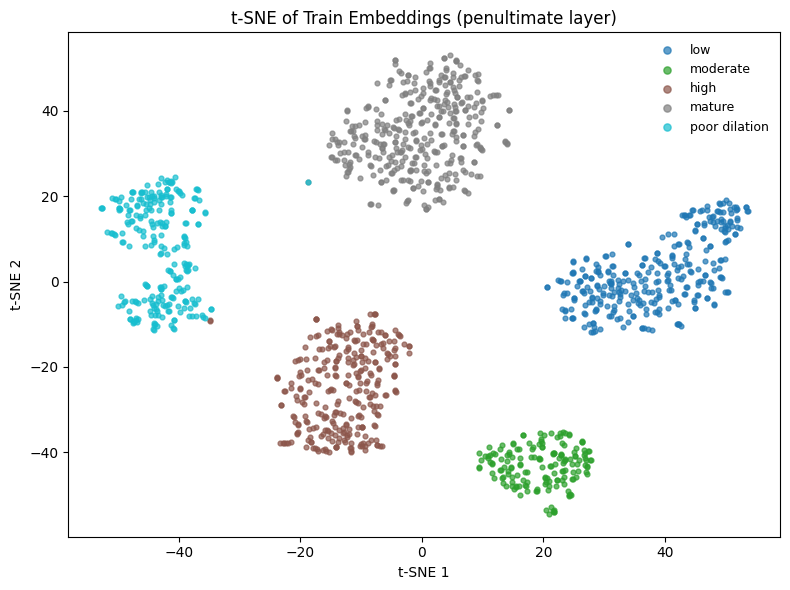

In [ ]:
# --- 0) No-aug train loader for feature extraction ---
# Use the same base_transform you already use for val/test
feat_dataset = CataractDataset(train_df.reset_index(drop=True), IMAGE_DIR, transform=base_transform)
feat_loader  = DataLoader(feat_dataset, batch_size=64, shuffle=False,
                          num_workers=num_cpu//2, pin_memory=True)

# If you need label names in a fixed order:
classes = ["low", "moderate", "high", "mature", "poor dilation"]
name_to_idx = {c:i for i,c in enumerate(classes)}

# --- 1) Collect penultimate-layer embeddings with a hook ---
import torch
import numpy as np

model.eval()
emb_chunks, lab_chunks = [], []

# For torchvision/timm EfficientNet, the classifier is in model.classifier (Sequential[Dropout, Linear]).
# A forward *pre*-hook on `classifier` gives the tensor right before the head = penultimate embedding.
def _feat_hook(module, inputs):
    # inputs is a tuple; take the tensor [B, D]
    x = inputs[0].detach().cpu()
    emb_chunks.append(x)

hook_handle = model.classifier.register_forward_pre_hook(lambda m, inp: _feat_hook(m, inp))

with torch.no_grad():
    for imgs, lbls in feat_loader:
        imgs = imgs.to(device)
        _ = model(imgs)                      # forward pass triggers the hook
        lab_chunks.append(lbls.cpu())

# Clean up the hook
hook_handle.remove()

embeddings = torch.cat(emb_chunks, dim=0).numpy()       # [N, D]
labels     = torch.cat(lab_chunks, dim=0).numpy()       # [N]

print("Embeddings shape:", embeddings.shape, " | Labels:", labels.shape)

# --- 2) t-SNE (PCA -> t-SNE is faster/stabler) ---
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

X_pca  = PCA(n_components=min(50, embeddings.shape[1]-1), random_state=42).fit_transform(embeddings)
tsne   = TSNE(n_components=2, perplexity=30, init='pca', learning_rate='auto', random_state=42)
X_2d   = tsne.fit_transform(X_pca)                       # [N, 2]

# --- 3) Plot ---
import matplotlib.pyplot as plt
import matplotlib

plt.figure(figsize=(8,6))
num_classes = len(classes)
cmap = matplotlib.cm.get_cmap('tab10', num_classes)
for idx, cls in enumerate(classes):
    mask = (labels == idx)
    plt.scatter(X_2d[mask,0], X_2d[mask,1], s=12, alpha=0.7, label=cls, color=cmap(idx))

plt.title("t-SNE of Train Embeddings (penultimate layer)")
plt.xlabel("t-SNE 1"); plt.ylabel("t-SNE 2")
plt.legend(markerscale=1.5, fontsize=9, frameon=False)
plt.tight_layout()
plt.show()

# (Optional) Save for later analysis
import pandas as pd
tsne_df = pd.DataFrame({"x": X_2d[:,0], "y": X_2d[:,1], "label": [classes[i] for i in labels]})
tsne_df.to_csv("tsne_train_embeddings.csv", index=False)


**EFFICIENTNET B3 WITH OVER SAMPLING**

Using device: cuda
Total number of samples: 2006

Class distribution:
label
mature           524
low              462
high             425
poor dilation    359
moderate         236
Name: count, dtype: int64


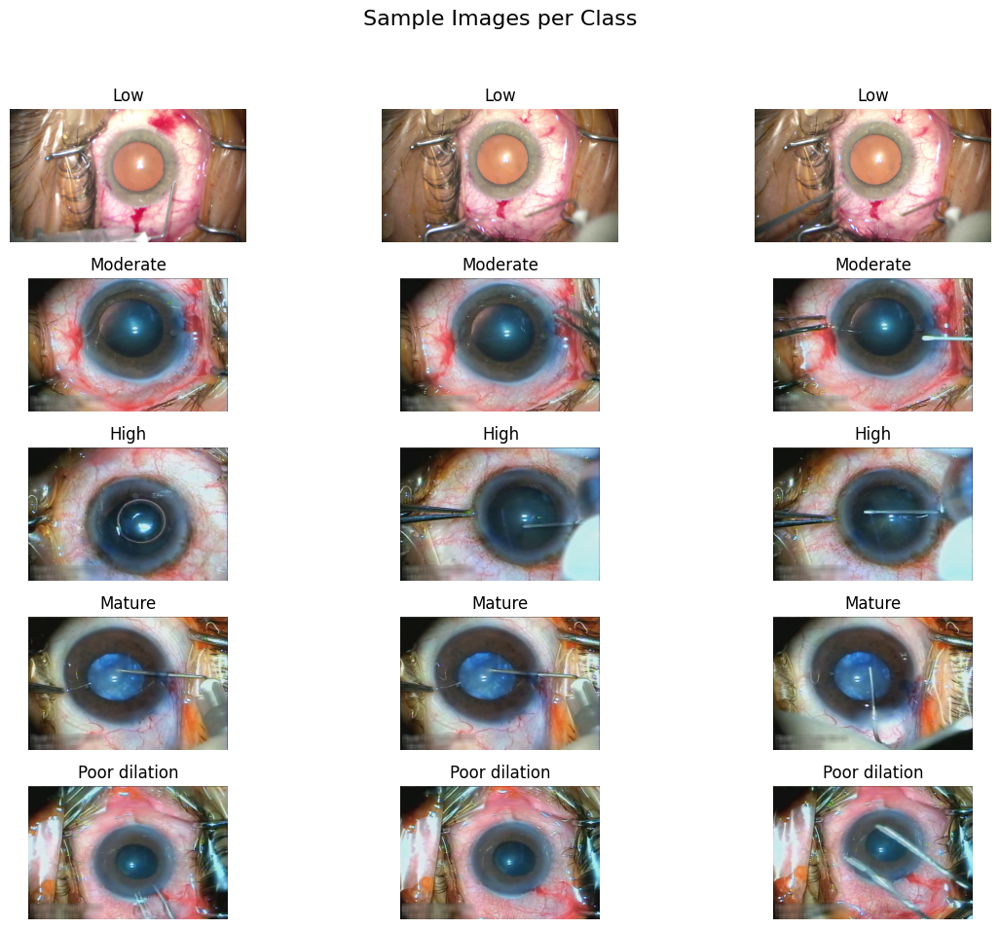

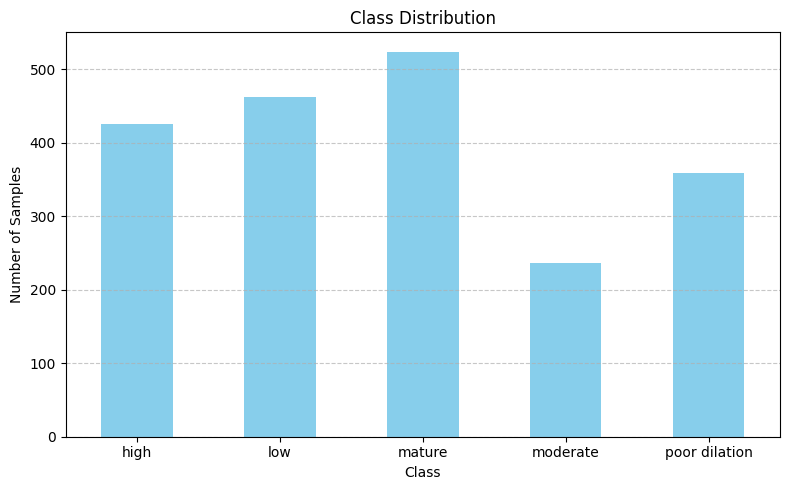

Model is on device: cuda:0
Epoch: [1/30] | Step: [1/63] | Loss: 1.610774
Epoch: [1/30] | Step: [3/63] | Loss: 1.533576
Epoch: [1/30] | Step: [5/63] | Loss: 1.427320
Epoch: [1/30] | Step: [7/63] | Loss: 1.306094
Epoch: [1/30] | Step: [9/63] | Loss: 1.165051
Epoch: [1/30] | Step: [11/63] | Loss: 1.092808
Epoch: [1/30] | Step: [13/63] | Loss: 1.044850
Epoch: [1/30] | Step: [15/63] | Loss: 0.911723
Epoch: [1/30] | Step: [17/63] | Loss: 0.747226
Epoch: [1/30] | Step: [19/63] | Loss: 0.899746
Epoch: [1/30] | Step: [21/63] | Loss: 0.711817
Epoch: [1/30] | Step: [23/63] | Loss: 0.696481
Epoch: [1/30] | Step: [25/63] | Loss: 0.511625
Epoch: [1/30] | Step: [27/63] | Loss: 0.360893
Epoch: [1/30] | Step: [29/63] | Loss: 0.545651
Epoch: [1/30] | Step: [31/63] | Loss: 0.614152
Epoch: [1/30] | Step: [33/63] | Loss: 0.441577
Epoch: [1/30] | Step: [35/63] | Loss: 0.565277
Epoch: [1/30] | Step: [37/63] | Loss: 0.452336
Epoch: [1/30] | Step: [39/63] | Loss: 0.373397
Epoch: [1/30] | Step: [41/63] | Loss: 

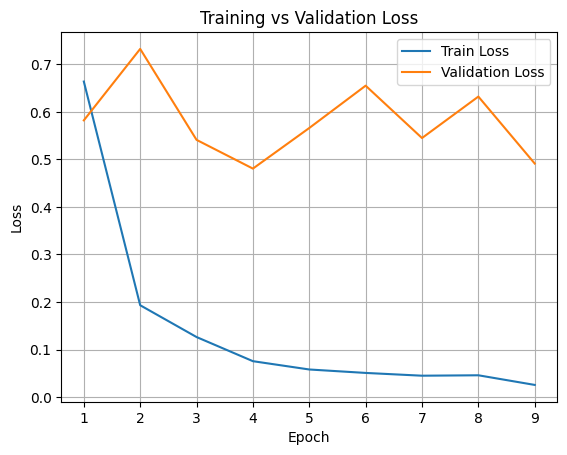

               precision    recall  f1-score   support

          low     0.9200    1.0000    0.9583        69
     moderate     0.9310    0.7714    0.8438        35
         high     0.8750    0.8750    0.8750        64
       mature     0.9367    0.9367    0.9367        79
poor dilation     0.9444    0.9444    0.9444        54

     accuracy                         0.9203       301
    macro avg     0.9214    0.9055    0.9116       301
 weighted avg     0.9205    0.9203    0.9191       301


Overall Accuracy: 0.9203
Macro F1-score  : 0.9116
Weighted F1-score: 0.9191


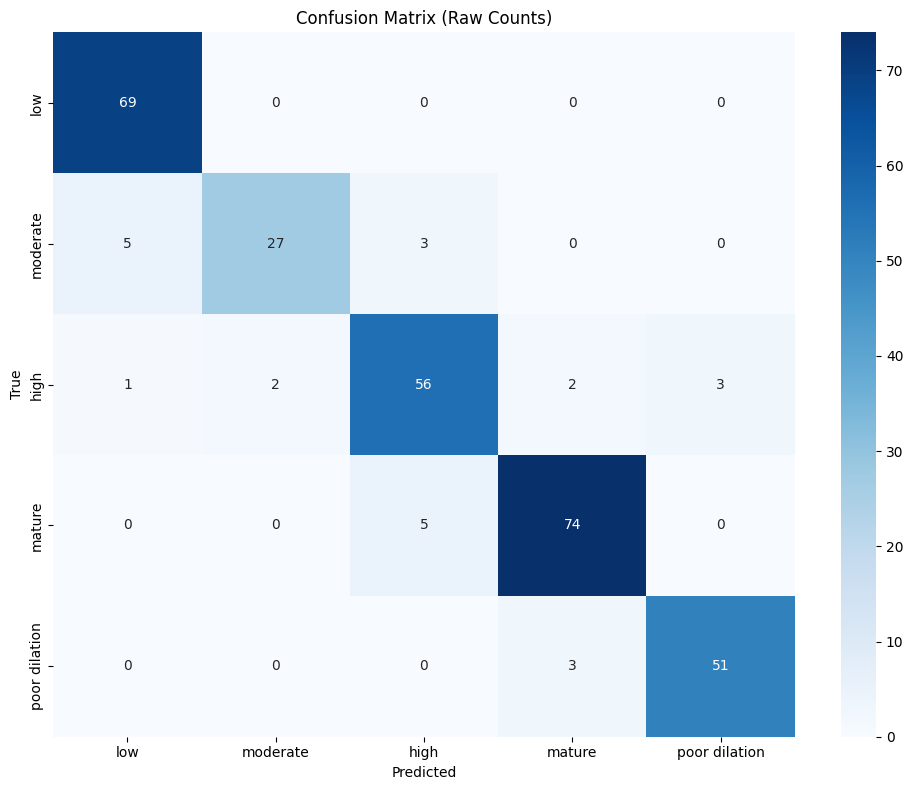

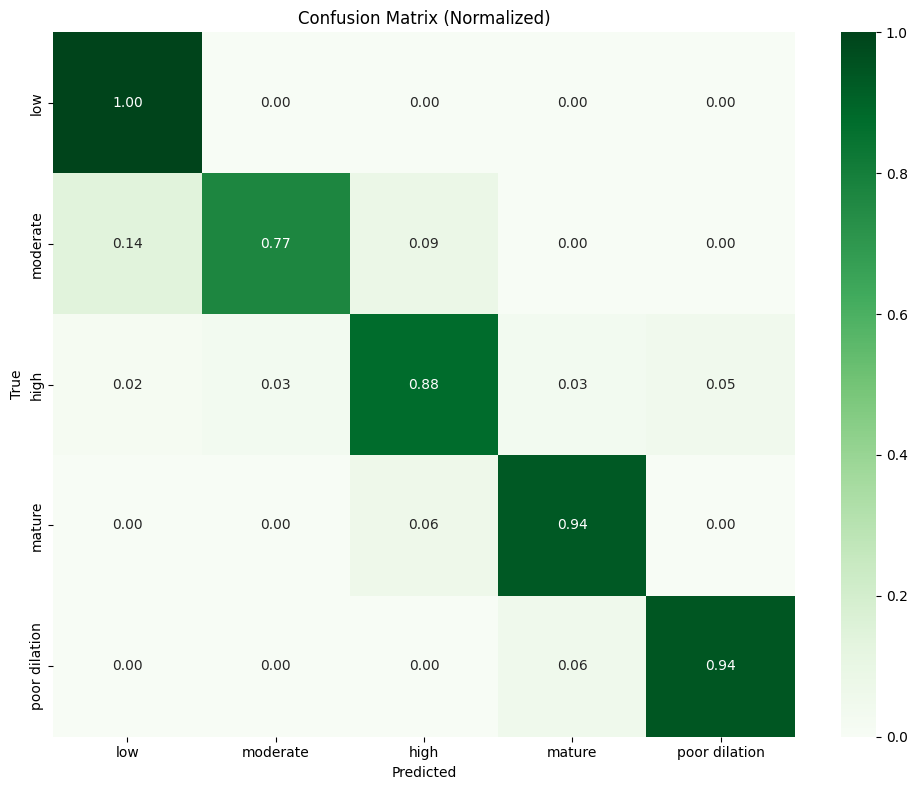

In [ ]:
CSV_PATH = "/content/dataset_V6.csv"
IMAGE_DIR = "/content/dataset_V6/dataset_V6"

# train_loader, val_loader, test_loader, class_weights_tensor, df = get_dataloaders()


# Params
num_epochs = 30
lr = 1e-3
patience = 5
min_delta = 1e-4
best_val_loss = float('inf')
epochs_no_improve = 0

# Device configuration
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")



# Print dataset statistics
print(f"Total number of samples: {len(df)}")
print("\nClass distribution:")
print(df['label'].value_counts())

# Define the class labels (ordered)
classes = ["low", "moderate", "high", "mature", "poor dilation"]

# Create a subplot grid: 4 rows (classes) x 3 columns (images)
fig, axs = plt.subplots(len(classes), 3, figsize=(12, 10))
fig.suptitle("Sample Images per Class", fontsize=16)

# Loop over each class
for i, cls in enumerate(classes):
    class_samples = df[df["label"] == cls].head(3)
    for j, (_, row) in enumerate(class_samples.iterrows()):
        img_path = os.path.join(IMAGE_DIR, row["filename"] + ".jpg")
        try:
            image = Image.open(img_path)
            axs[i, j].imshow(image)
            axs[i, j].axis("off")
            axs[i, j].set_title(f"{cls.capitalize()}")
        except FileNotFoundError:
            axs[i, j].axis("off")
            axs[i, j].set_title("Image not found")

plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # adjust for suptitle
plt.show()

# Plot bar chart of class distribution
plt.figure(figsize=(8, 5))
df["label"].value_counts().sort_index().plot(kind='bar', color='skyblue')
plt.title("Class Distribution")
plt.xlabel("Class")
plt.ylabel("Number of Samples")
plt.xticks(rotation=0)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()




# Training
# model = resnet18(fine_tune=False).to(device)  # change to True if you want to fine-tune deeper layers
model = efficientnet_b3(fine_tune=True).to(device)
# Loss Function
# class_weights_tensor = class_weights_tensor.to(device)  # move to GPU
loss_fn = torch.nn.CrossEntropyLoss()

# Optimizer
# optimizer = torch.optim.Adam(model.fc.parameters(), lr=lr)
optimizer = torch.optim.AdamW(model.parameters(), lr=lr, weight_decay=1e-2)

# Scheduler
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3)


train_loss = []
valid_loss = []

print(f"Model is on device: {next(model.parameters()).device}")

# Train Loop
num_steps = len(train_loader)
for epochs in range(num_epochs):
    model.train()
    running_loss = 0.0
    for j, (imgs, lbls) in enumerate(train_loader):
        imgs, lbls = imgs.to(device), lbls.to(device)
        optimizer.zero_grad()
        out = model(imgs)
        loss = loss_fn(out, lbls)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
        if j % 2 == 0:
            print('Epoch: [{}/{}] | Step: [{}/{}] | Loss: {:.6f}'
                  .format(epochs+1, num_epochs, j+1, num_steps, loss.item()))
    train_loss.append(running_loss / num_steps)
    print('Epoch: [{}/{}] | Loss: {:.6f}'
          .format(epochs+1, num_epochs, loss.item()))

#---------------------
    model.eval()
    with torch.no_grad():
        correct = 0
        total = 0
        running_valid_loss = 0.0
        for imgs, lbls in val_loader:
            imgs, lbls = imgs.to(device), lbls.to(device)
            out = model(imgs)
            loss_val = loss_fn(out, lbls)
            running_valid_loss += loss_val.item()
            predicted = torch.argmax(out, dim=1)
            correct += (predicted == lbls).sum().item()
            total += lbls.size(0)
        avg_val_loss = running_valid_loss / len(val_loader)
        valid_loss.append(avg_val_loss)
        print('Valid Loss: {:.6f} | Acc: {:.4f}'.format(valid_loss[-1], correct / total))

        # Step the scheduler
        scheduler.step(avg_val_loss)


        # Early stopping
        if best_val_loss - avg_val_loss > min_delta:
            best_val_loss = avg_val_loss
            epochs_no_improve = 0
        else:
            epochs_no_improve += 1
            if epochs_no_improve >= patience:
                print("Early stopping triggered.")
                break

# Plot losses
plt.plot(range(1, len(train_loss)+1), train_loss, label='Train Loss')
plt.plot(range(1, len(valid_loss)+1), valid_loss, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training vs Validation Loss')
plt.legend()
plt.grid(True)
plt.show()




# # Predictions and true labels
# all_preds = []
# all_labels = []
#
# model.eval()
# with torch.no_grad():
#     for imgs, lbls in test_loader:
#         imgs = imgs.to(device)
#         outputs = model(imgs)
#         preds = torch.argmax(outputs, dim=1).cpu()
#         all_preds.extend(preds.numpy())
#         all_labels.extend(lbls.numpy())
#
# # Classification Report
# print(classification_report(all_labels, all_preds, target_names=classes))
#
# # Confusion Matrix
# cm = confusion_matrix(all_labels, all_preds)
# plt.figure(figsize=(10, 8))
# sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=classes, yticklabels=classes)
# plt.xlabel('Predicted')
# plt.ylabel('True')
# plt.title('Confusion Matrix')
# plt.show()
#


# Evaluation
all_preds = []
all_labels = []

model.eval()
with torch.no_grad():
    for imgs, lbls in test_loader:
        imgs, lbls = imgs.to(device), lbls.to(device)
        outputs = model(imgs)
        preds = torch.argmax(outputs, dim=1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(lbls.cpu().numpy())

# Convert to numpy arrays
all_preds = np.array(all_preds)
all_labels = np.array(all_labels)

# Print classification report
report = classification_report(all_labels, all_preds, target_names=classes, digits=4)
print(report)

# Save report as a dataframe (optional)
report_df = pd.DataFrame(classification_report(all_labels, all_preds, target_names=classes, output_dict=True)).T
report_df.to_csv("classification_report.csv")

# Accuracy and F1 scores
print(f"\nOverall Accuracy: {accuracy_score(all_labels, all_preds):.4f}")
print(f"Macro F1-score  : {f1_score(all_labels, all_preds, average='macro'):.4f}")
print(f"Weighted F1-score: {f1_score(all_labels, all_preds, average='weighted'):.4f}")

# Confusion Matrix
cm = confusion_matrix(all_labels, all_preds)
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

# Plot raw confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=classes, yticklabels=classes)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix (Raw Counts)')
plt.tight_layout()
plt.show()

# Plot normalized confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm_normalized, annot=True, fmt='.2f', cmap='Greens', xticklabels=classes, yticklabels=classes)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix (Normalized)')
plt.tight_layout()
plt.show()

torch.save(model.state_dict(), "efficientnet_b3_cataract.pth")


In [ ]:
import os
import shutil

# 1. Path to your local .pth file in Colab
source_path = '/content/efficientnet_b2_cataract.pth'   # ← change this to your .pth

# 2. Ask user for the Drive folder (relative to MyDrive)
dest_folder = input("cataract_models_2.0")

# 3. Build full destination path and create it if needed
drive_base = '/content/drive/MyDrive'
full_dest_dir = os.path.join(drive_base, dest_folder)
os.makedirs(full_dest_dir, exist_ok=True)

# 4. Copy the file
shutil.copy(source_path, full_dest_dir)

print(f"✔️ Copied `{os.path.basename(source_path)}` → `{full_dest_dir}`")


cataract_models_2.0eg
✔️ Copied `efficientnet_b2_cataract.pth` → `/content/drive/MyDrive/eg`


INFERENCE OF B2

In [ ]:
import os
import time
import psutil
import pandas as pd
import numpy as np
from tqdm import tqdm
from PIL import Image
import torch
import torch.nn as nn
from torchvision import models, transforms
from sklearn.metrics import classification_report
from collections import Counter
from torchvision.transforms import functional as TF

# ====== CUSTOM PAD TO SQUARE TRANSFORM ======
class PadToSquareWithMean:
    def __call__(self, image):
        w, h = image.size
        max_dim = max(w, h)
        pad_left = (max_dim - w) // 2
        pad_top = (max_dim - h) // 2
        pad_right = max_dim - w - pad_left
        pad_bottom = max_dim - h - pad_top

        # Compute mean color of the image (as RGB tuple)
        mean_color = image.resize((1, 1)).getpixel((0, 0))

        # Apply padding using the mean color
        return TF.pad(image, (pad_left, pad_top, pad_right, pad_bottom),
                      fill=mean_color, padding_mode='constant')

# ====== CONFIG ======
model_path = "/content/cataract_models/efficientnet_b2_cataract.pth"
image_dir = "/content/Test_Data/Test_Data"
label_csv_path = "/content/Test_Data.csv"
num_classes = 5
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Device used for inference: {device}")
class_names = ['low', 'moderate', 'high', 'mature', 'poor dilation']

# ====== TRANSFORMS ======
val_test_transform = transforms.Compose([
    PadToSquareWithMean(),
    transforms.Resize((260, 260)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

# ====== LOAD MODEL ======
print("\nLoading model...")
start_model_load = time.time()
model = models.efficientnet_b2()
model.classifier[1] = nn.Linear(model.classifier[1].in_features, num_classes)
model.load_state_dict(torch.load(model_path, map_location=device))
model.to(device)
model.eval()
end_model_load = time.time()
model_load_time = end_model_load - start_model_load
model_file_size = os.path.getsize(model_path) / (1024**2)  # in MB

# ====== LOAD LABELS ======
df = pd.read_csv(label_csv_path)
df['filename'] = df['filename'].astype(str)
df['label'] = df['label'].str.strip().str.lower()

# ====== INFERENCE SETUP ======
y_true = []
y_pred = []
total_time = 0
total_images = 0

# Reset peak GPU memory stats
if device.type == "cuda":
    torch.cuda.reset_peak_memory_stats(device)

# Start monitoring CPU, RAM
process = psutil.Process(os.getpid())
cpu_before = psutil.cpu_percent(interval=1)
ram_before = process.memory_info().rss / (1024 ** 2)

# ====== RUN INFERENCE ======
for _, row in tqdm(df.iterrows(), total=len(df), desc="Running Inference"):
    filename, true_label = row['filename'], row['label']
    img_path = os.path.join(image_dir, filename + ".jpg")

    if not os.path.exists(img_path):
        print(f"Skipping missing file: {img_path}")
        continue

    img = Image.open(img_path).convert('RGB')
    input_tensor = val_test_transform(img).unsqueeze(0).to(device)

    start = time.time()
    with torch.no_grad():
        output = model(input_tensor)
        prob = torch.softmax(output, dim=1)
        pred_idx = torch.argmax(prob, dim=1).item()
    end = time.time()

    total_time += (end - start)
    total_images += 1
    y_true.append(true_label)
    y_pred.append(class_names[pred_idx])

# ====== RESOURCE USAGE ======
cpu_after = psutil.cpu_percent(interval=1)
ram_after = process.memory_info().rss / (1024 ** 2)
gpu_memory = 0
if device.type == "cuda":
    gpu_memory = torch.cuda.max_memory_allocated(device) / (1024 ** 2)

# ====== REPORT ======
print("\n====== Inference Results ======")
if total_images == 0:
    print("⚠️ No images were successfully processed.")
else:
    print(f"🕒 Average latency per image: {(total_time / total_images) * 1000:.2f} ms")
    print(f"⚡ Total inference time: {total_time:.2f} sec for {total_images} images")
print(f"🧠 Model load time: {model_load_time:.2f} sec")
print(f"📁 Model file size: {model_file_size:.2f} MB")
print(f"📈 CPU usage change: {cpu_after - cpu_before:.2f}%")
print(f"📦 RAM used change: {ram_after - ram_before:.2f} MB")
if device.type == "cuda":
    print(f"🧠 Peak GPU memory used: {gpu_memory:.2f} MB")

# ====== CLASSIFICATION REPORT ======
print("\n====== Classification Report ======")
if total_images > 0:
    print(classification_report(y_true, y_pred, target_names=class_names, zero_division=0))
    print("\nPrediction distribution:", Counter(y_pred))
    print("True label distribution:", Counter(y_true))


Device used for inference: cuda

Loading model...


Running Inference: 100%|██████████| 40/40 [00:01<00:00, 27.50it/s]



====== Inference Results ======
🕒 Average latency per image: 22.32 ms
⚡ Total inference time: 0.89 sec for 40 images
🧠 Model load time: 0.45 sec
📁 Model file size: 29.84 MB
📈 CPU usage change: 6.40%
📦 RAM used change: 261.90 MB
🧠 Peak GPU memory used: 53.45 MB

====== Classification Report ======
               precision    recall  f1-score   support

          low       1.00      1.00      1.00         7
     moderate       0.64      1.00      0.78         7
         high       1.00      1.00      1.00         6
       mature       1.00      0.77      0.87        13
poor dilation       1.00      0.86      0.92         7

     accuracy                           0.90        40
    macro avg       0.93      0.93      0.91        40
 weighted avg       0.94      0.90      0.91        40


Prediction distribution: Counter({'low': 11, 'moderate': 10, 'high': 7, 'mature': 6, 'poor dilation': 6})
True label distribution: Counter({'moderate': 13, 'low': 7, 'high': 7, 'poor dilation': 7, 'matu

In [ ]:
# ========== Config ==========
CSV_PATH = "dataset_V4.csv"
IMAGE_DIR = "/content/dataset_V4/dataset_V4"
BATCH_SIZE = 32

# ========== Dataset ==========
class CataractDataset(Dataset):
    def __init__(self, dataframe, image_dir, transform=None):
        self.data = dataframe.reset_index(drop=True)
        self.image_dir = image_dir
        self.transform = transform
        self.label_map = {"low": 0, "moderate": 1, "high": 2, "mature": 3, "poor dilation": 4}

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        row = self.data.iloc[idx]
        img_path = os.path.join(self.image_dir, row["filename"] + ".jpg")
        try:
            image = Image.open(img_path).convert("RGB")
        except FileNotFoundError:
            print(f"Missing image: {img_path}")
            return self.__getitem__((idx + 1) % len(self.data))

        label = self.label_map[row["label"].lower()]
        if self.transform:
            image = self.transform(image)
        return image, torch.tensor(label)

# ========== Load and Prepare CSV ==========
df = pd.read_csv(CSV_PATH)
df.columns = df.columns.str.strip()
df.rename(columns={"Frame Name": "filename"}, inplace=True)

# Derive label column from binary indicators
df["label"] = None
df.loc[df["Low Nuclear Density"] == 1.0, "label"] = "low"
df.loc[df["Moderate Nuclear Density"] == 1.0, "label"] = "moderate"
df.loc[df["High Nuclear Density"] == 1.0, "label"] = "high"
df.loc[df["Mature"] == 1.0, "label"] = "mature"
df.loc[df["Poor Dilation"] == 1.0, "label"] = "poor dilation"


# Keep only valid rows
df = df[df["label"].notna()]
df = df[["filename", "label"]]

# ========== Train / Val / Test Split ==========
train_val_df, test_df = train_test_split(df, test_size=0.2, stratify=df["label"], random_state=42)
train_df, val_df = train_test_split(train_val_df, test_size=0.2, stratify=train_val_df["label"], random_state=42)

# Map labels to integer indices
label_map = {"low": 0, "moderate": 1, "high": 2, "mature": 3, "poor dilation": 4}
train_df["class_idx"] = train_df["label"].map(label_map)

# Compute class weights
class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(train_df["class_idx"]),
    y=train_df["class_idx"]
)
class_weights_tensor = torch.tensor(class_weights, dtype=torch.float)

# ========== Transforms ==========
transform = transforms.Compose([
    PadToSquareWithMean(),  # <-- add this at the top
    transforms.Resize((300, 300)),  # match model input size
    transforms.RandomRotation(degrees=15),
    transforms.RandomAffine(degrees=10, translate=(0.05, 0.05), scale=(0.95, 1.05)),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
    transforms.RandomErasing(p=0.3)
])
val_test_transform = transforms.Compose([
    PadToSquareWithMean(),
    transforms.Resize((300, 300)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])


# ========== Datasets and Dataloaders ==========
train_dataset = CataractDataset(train_df, IMAGE_DIR, transform)
# val_dataset = CataractDataset(val_df, IMAGE_DIR, transform)
# test_dataset = CataractDataset(test_df, IMAGE_DIR, transform)
val_dataset = CataractDataset(val_df, IMAGE_DIR, val_test_transform)
test_dataset = CataractDataset(test_df, IMAGE_DIR, val_test_transform)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False)

# ========== Return Utility ==========
def get_dataloaders():
    return train_loader, val_loader, test_loader, class_weights_tensor, df


In [ ]:
import torch.nn as nn
from torchvision import models

def efficientnet_b3(weights="DEFAULT", fine_tune=True):
    """
    EfficientNet-B3 adapted to 5 classes.

    Parameters
    ----------
    weights : str | torchvision.models.EfficientNet_B3_Weights | None
        "DEFAULT"  → ImageNet-1K weights (torchvision ≥0.15).
        None       → random initialization.
        Or pass an explicit EfficientNet_B3_Weights enum.
    fine_tune : bool
        True  → freeze everything except last two MBConv blocks + classifier.
        False → leave all layers trainable.

    Returns
    -------
    model : nn.Module
    """

    # 1) Load backbone
    eff_weights = (
        models.EfficientNet_B3_Weights.DEFAULT if weights == "DEFAULT" else weights
    )
    model = models.efficientnet_b3(weights=eff_weights)

    # 2) Freeze / unfreeze
    if fine_tune:
        for p in model.parameters():
            p.requires_grad = False
        # Unfreeze the deepest layers (features.6 & features.7) and the classifier
        for name, p in model.named_parameters():
            if name.startswith(("features.6", "features.7", "classifier")):
                p.requires_grad = True

    # 3) Replace classifier head
    in_feats = model.classifier[1].in_features
    model.classifier[1] = nn.Linear(in_feats, 5)   # 5 classes

    return model


Using device: cuda
Total number of samples: 1888

Class distribution:
label
mature           522
low              460
moderate         366
high             341
poor dilation    199
Name: count, dtype: int64


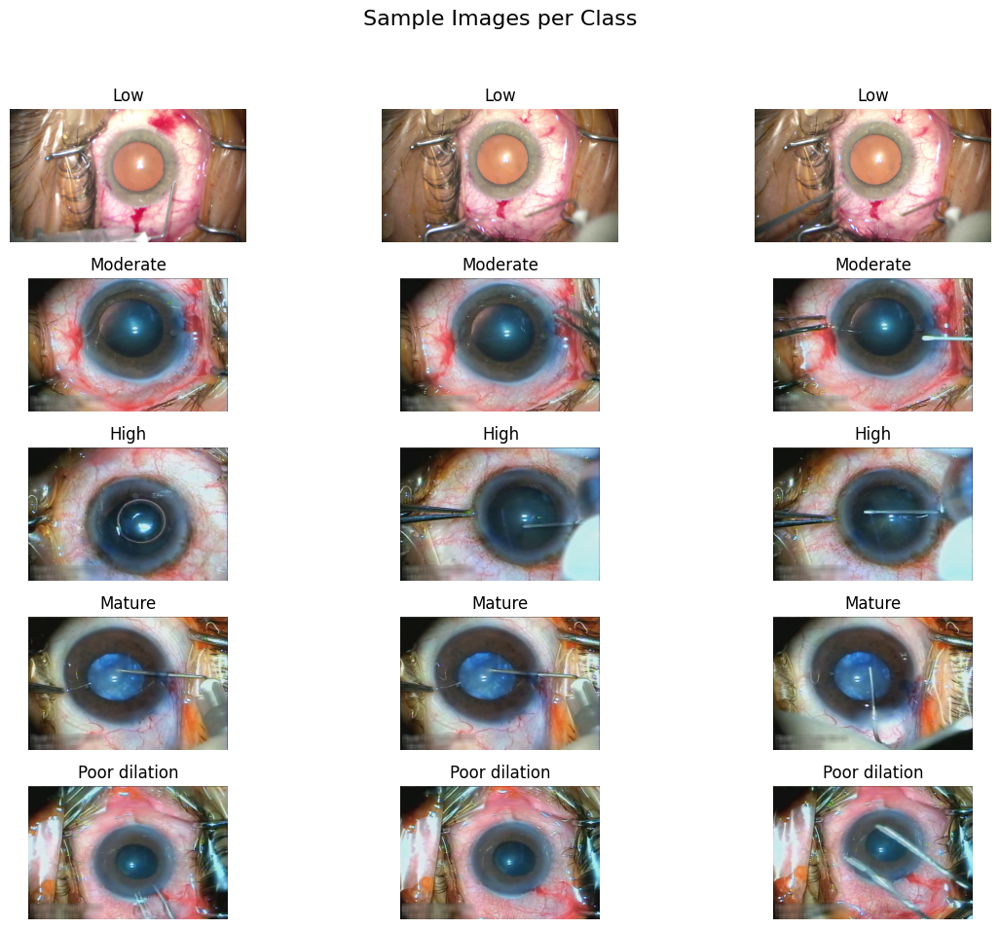

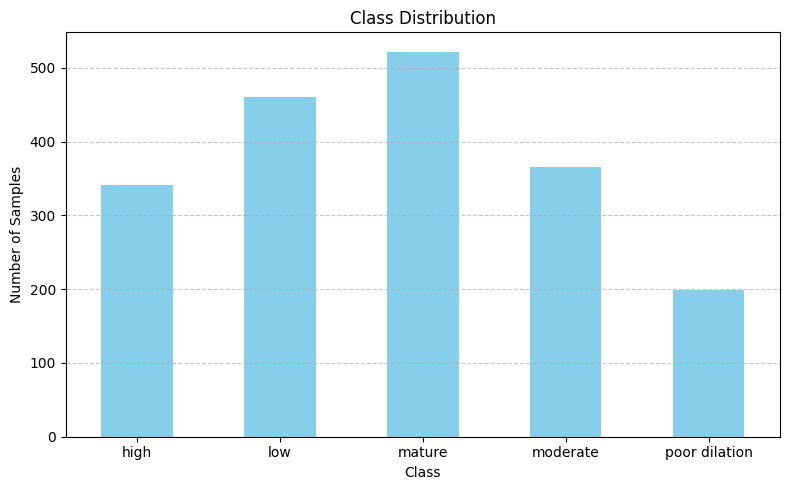

Model is on device: cuda:0
Epoch: [1/30] | Step: [1/38] | Loss: 1.635388
Epoch: [1/30] | Step: [3/38] | Loss: 1.430824
Epoch: [1/30] | Step: [5/38] | Loss: 1.481555
Epoch: [1/30] | Step: [7/38] | Loss: 1.363860
Epoch: [1/30] | Step: [9/38] | Loss: 1.261507
Epoch: [1/30] | Step: [11/38] | Loss: 1.205711
Epoch: [1/30] | Step: [13/38] | Loss: 0.966759
Epoch: [1/30] | Step: [15/38] | Loss: 1.134825
Epoch: [1/30] | Step: [17/38] | Loss: 1.001674
Epoch: [1/30] | Step: [19/38] | Loss: 1.109336
Epoch: [1/30] | Step: [21/38] | Loss: 1.114721
Epoch: [1/30] | Step: [23/38] | Loss: 0.808605
Epoch: [1/30] | Step: [25/38] | Loss: 0.829568
Epoch: [1/30] | Step: [27/38] | Loss: 1.051657
Epoch: [1/30] | Step: [29/38] | Loss: 0.940503
Epoch: [1/30] | Step: [31/38] | Loss: 0.900554
Epoch: [1/30] | Step: [33/38] | Loss: 0.823958
Epoch: [1/30] | Step: [35/38] | Loss: 1.130450
Epoch: [1/30] | Step: [37/38] | Loss: 0.908710
Epoch: [1/30] | Loss: 0.511029
Valid Loss: 0.834385 | Acc: 0.7185
Epoch: [2/30] | Ste

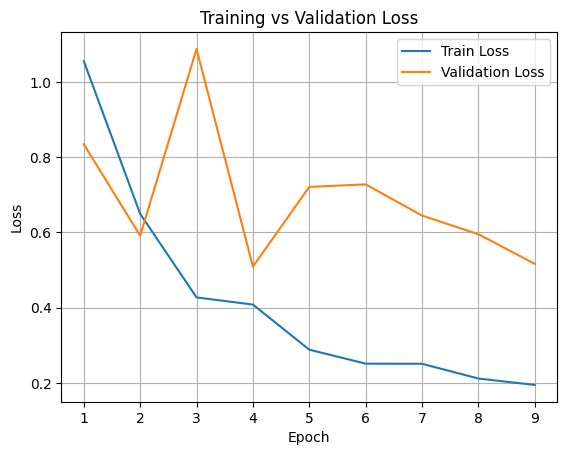

               precision    recall  f1-score   support

          low     0.9878    0.8804    0.9310        92
     moderate     0.7113    0.9452    0.8118        73
         high     0.8438    0.7941    0.8182        68
       mature     0.9451    0.8190    0.8776       105
poor dilation     0.8409    0.9250    0.8810        40

     accuracy                         0.8651       378
    macro avg     0.8658    0.8728    0.8639       378
 weighted avg     0.8811    0.8651    0.8675       378


Overall Accuracy: 0.8651
Macro F1-score  : 0.8639
Weighted F1-score: 0.8675


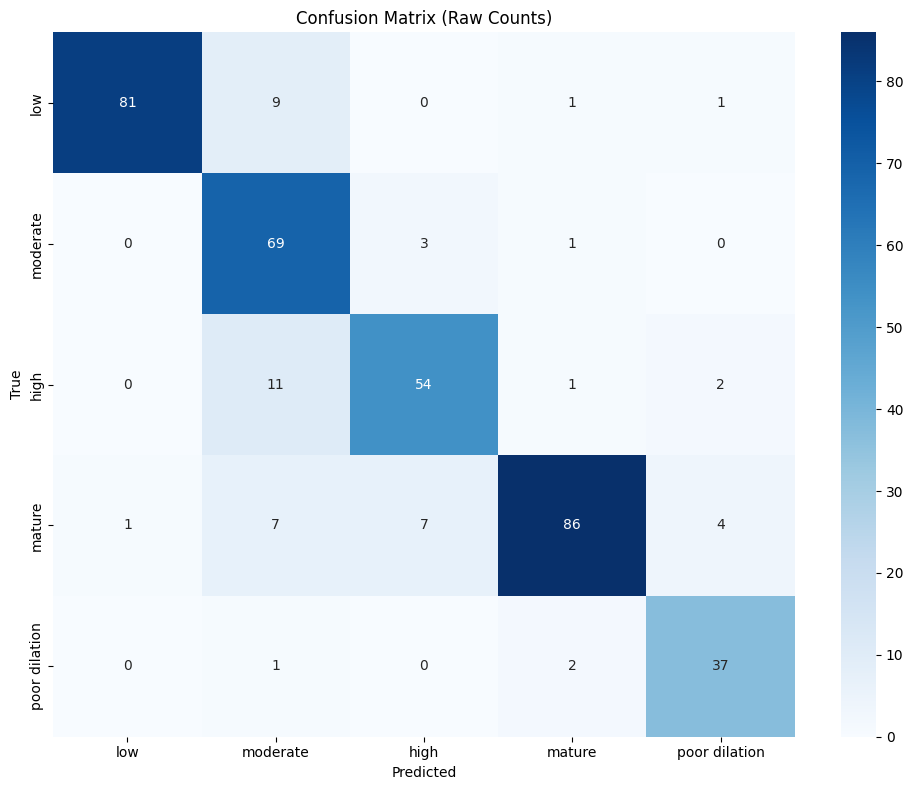

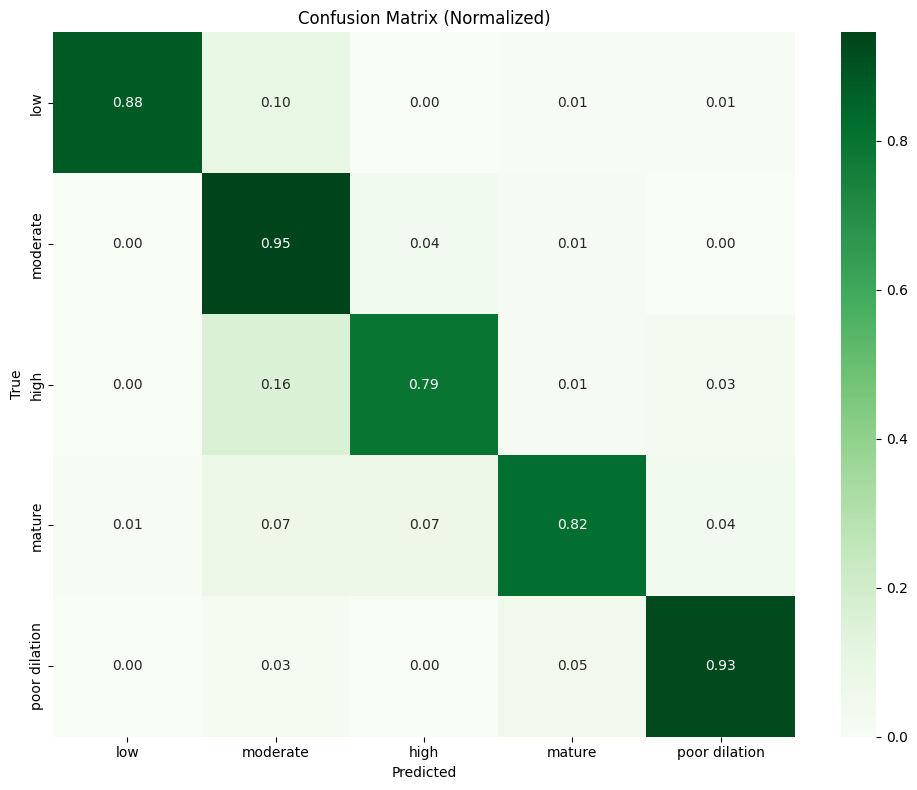

In [ ]:
CSV_PATH = "/content/dataset_V4.csv"
IMAGE_DIR = "/content/dataset_V4/dataset_V4"

train_loader, val_loader, test_loader, class_weights_tensor, df = get_dataloaders()


# Params
num_epochs = 30
lr = 1e-3
patience = 5
min_delta = 1e-4
best_val_loss = float('inf')
epochs_no_improve = 0

# Device configuration
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")



# Print dataset statistics
print(f"Total number of samples: {len(df)}")
print("\nClass distribution:")
print(df['label'].value_counts())

# Define the class labels (ordered)
classes = ["low", "moderate", "high", "mature", "poor dilation"]

# Create a subplot grid: 4 rows (classes) x 3 columns (images)
fig, axs = plt.subplots(len(classes), 3, figsize=(12, 10))
fig.suptitle("Sample Images per Class", fontsize=16)

# Loop over each class
for i, cls in enumerate(classes):
    class_samples = df[df["label"] == cls].head(3)
    for j, (_, row) in enumerate(class_samples.iterrows()):
        img_path = os.path.join(IMAGE_DIR, row["filename"] + ".jpg")
        try:
            image = Image.open(img_path)
            axs[i, j].imshow(image)
            axs[i, j].axis("off")
            axs[i, j].set_title(f"{cls.capitalize()}")
        except FileNotFoundError:
            axs[i, j].axis("off")
            axs[i, j].set_title("Image not found")

plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # adjust for suptitle
plt.show()

# Plot bar chart of class distribution
plt.figure(figsize=(8, 5))
df["label"].value_counts().sort_index().plot(kind='bar', color='skyblue')
plt.title("Class Distribution")
plt.xlabel("Class")
plt.ylabel("Number of Samples")
plt.xticks(rotation=0)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()




# Training
# model = resnet18(fine_tune=False).to(device)  # change to True if you want to fine-tune deeper layers
model = efficientnet_b3(fine_tune=False).to(device)
# Loss Function
# class_weights_tensor = class_weights_tensor.to(device)  # move to GPU
loss_fn = torch.nn.CrossEntropyLoss()

# Optimizer
# optimizer = torch.optim.Adam(model.fc.parameters(), lr=lr)
optimizer = torch.optim.AdamW(model.parameters(), lr=lr, weight_decay=1e-2)

# Scheduler
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3)


train_loss = []
valid_loss = []

print(f"Model is on device: {next(model.parameters()).device}")

# Train Loop
num_steps = len(train_loader)
for epochs in range(num_epochs):
    model.train()
    running_loss = 0.0
    for j, (imgs, lbls) in enumerate(train_loader):
        imgs, lbls = imgs.to(device), lbls.to(device)
        optimizer.zero_grad()
        out = model(imgs)
        loss = loss_fn(out, lbls)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
        if j % 2 == 0:
            print('Epoch: [{}/{}] | Step: [{}/{}] | Loss: {:.6f}'
                  .format(epochs+1, num_epochs, j+1, num_steps, loss.item()))
    train_loss.append(running_loss / num_steps)
    print('Epoch: [{}/{}] | Loss: {:.6f}'
          .format(epochs+1, num_epochs, loss.item()))

#---------------------
    model.eval()
    with torch.no_grad():
        correct = 0
        total = 0
        running_valid_loss = 0.0
        for imgs, lbls in val_loader:
            imgs, lbls = imgs.to(device), lbls.to(device)
            out = model(imgs)
            loss_val = loss_fn(out, lbls)
            running_valid_loss += loss_val.item()
            predicted = torch.argmax(out, dim=1)
            correct += (predicted == lbls).sum().item()
            total += lbls.size(0)
        avg_val_loss = running_valid_loss / len(val_loader)
        valid_loss.append(avg_val_loss)
        print('Valid Loss: {:.6f} | Acc: {:.4f}'.format(valid_loss[-1], correct / total))

        # Step the scheduler
        scheduler.step(avg_val_loss)


        # Early stopping
        if best_val_loss - avg_val_loss > min_delta:
            best_val_loss = avg_val_loss
            epochs_no_improve = 0
        else:
            epochs_no_improve += 1
            if epochs_no_improve >= patience:
                print("Early stopping triggered.")
                break

# Plot losses
plt.plot(range(1, len(train_loss)+1), train_loss, label='Train Loss')
plt.plot(range(1, len(valid_loss)+1), valid_loss, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training vs Validation Loss')
plt.legend()
plt.grid(True)
plt.show()




# # Predictions and true labels
# all_preds = []
# all_labels = []
#
# model.eval()
# with torch.no_grad():
#     for imgs, lbls in test_loader:
#         imgs = imgs.to(device)
#         outputs = model(imgs)
#         preds = torch.argmax(outputs, dim=1).cpu()
#         all_preds.extend(preds.numpy())
#         all_labels.extend(lbls.numpy())
#
# # Classification Report
# print(classification_report(all_labels, all_preds, target_names=classes))
#
# # Confusion Matrix
# cm = confusion_matrix(all_labels, all_preds)
# plt.figure(figsize=(10, 8))
# sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=classes, yticklabels=classes)
# plt.xlabel('Predicted')
# plt.ylabel('True')
# plt.title('Confusion Matrix')
# plt.show()
#


# Evaluation
all_preds = []
all_labels = []

model.eval()
with torch.no_grad():
    for imgs, lbls in test_loader:
        imgs, lbls = imgs.to(device), lbls.to(device)
        outputs = model(imgs)
        preds = torch.argmax(outputs, dim=1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(lbls.cpu().numpy())

# Convert to numpy arrays
all_preds = np.array(all_preds)
all_labels = np.array(all_labels)

# Print classification report
report = classification_report(all_labels, all_preds, target_names=classes, digits=4)
print(report)

# Save report as a dataframe (optional)
report_df = pd.DataFrame(classification_report(all_labels, all_preds, target_names=classes, output_dict=True)).T
report_df.to_csv("classification_report.csv")

# Accuracy and F1 scores
print(f"\nOverall Accuracy: {accuracy_score(all_labels, all_preds):.4f}")
print(f"Macro F1-score  : {f1_score(all_labels, all_preds, average='macro'):.4f}")
print(f"Weighted F1-score: {f1_score(all_labels, all_preds, average='weighted'):.4f}")

# Confusion Matrix
cm = confusion_matrix(all_labels, all_preds)
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

# Plot raw confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=classes, yticklabels=classes)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix (Raw Counts)')
plt.tight_layout()
plt.show()

# Plot normalized confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm_normalized, annot=True, fmt='.2f', cmap='Greens', xticklabels=classes, yticklabels=classes)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix (Normalized)')
plt.tight_layout()
plt.show()

torch.save(model.state_dict(), "efficientnet_b3_cataract.pth")


INFERENCE B3

In [ ]:
import os
import time
import psutil
import pandas as pd
import numpy as np
from tqdm import tqdm
from PIL import Image
import torch
import torch.nn as nn
from torchvision import models, transforms
from sklearn.metrics import classification_report
from collections import Counter
from torchvision.transforms import functional as TF

# ====== CUSTOM PAD TO SQUARE TRANSFORM ======
class PadToSquareWithMean:
    def __call__(self, image):
        w, h = image.size
        max_dim = max(w, h)
        pad_left = (max_dim - w) // 2
        pad_top = (max_dim - h) // 2
        pad_right = max_dim - w - pad_left
        pad_bottom = max_dim - h - pad_top

        # Compute mean color of the image (as RGB tuple)
        mean_color = image.resize((1, 1)).getpixel((0, 0))

        # Apply padding using the mean color
        return TF.pad(image, (pad_left, pad_top, pad_right, pad_bottom),
                      fill=mean_color, padding_mode='constant')

# ====== CONFIG ======
model_path = "/content/cataract_models/efficientnet_b3_cataract.pth"
image_dir = "/content/Test_Data/Test_Data"
label_csv_path = "/content/Test_Data.csv"
num_classes = 5
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Device used for inference: {device}")
class_names = ['low', 'moderate', 'high', 'mature', 'poor dilation']

# ====== TRANSFORMS ======
val_test_transform = transforms.Compose([
    PadToSquareWithMean(),
    transforms.Resize((300, 300)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

# ====== LOAD MODEL ======
print("\nLoading model...")
start_model_load = time.time()
model = models.efficientnet_b3()
model.classifier[1] = nn.Linear(model.classifier[1].in_features, num_classes)
model.load_state_dict(torch.load(model_path, map_location=device))
model.to(device)
model.eval()
end_model_load = time.time()
model_load_time = end_model_load - start_model_load
model_file_size = os.path.getsize(model_path) / (1024**2)  # MB

# ====== LOAD LABELS ======
df = pd.read_csv(label_csv_path)
df['filename'] = df['filename'].astype(str)
df['label'] = df['label'].str.strip().str.lower()

# ====== INFERENCE SETUP ======
y_true = []
y_pred = []
total_time = 0
total_images = 0

# Reset peak GPU memory stats
if device.type == "cuda":
    torch.cuda.reset_peak_memory_stats(device)

# Start monitoring CPU, RAM
process = psutil.Process(os.getpid())
cpu_before = psutil.cpu_percent(interval=1)
ram_before = process.memory_info().rss / (1024 ** 2)

# ====== RUN INFERENCE ======
for _, row in tqdm(df.iterrows(), total=len(df), desc="Running Inference"):
    filename, true_label = row['filename'], row['label']
    img_path = os.path.join(image_dir, filename + ".jpg")

    if not os.path.exists(img_path):
        print(f"Skipping missing file: {img_path}")
        continue

    img = Image.open(img_path).convert('RGB')
    input_tensor = val_test_transform(img).unsqueeze(0).to(device)

    start = time.time()
    with torch.no_grad():
        output = model(input_tensor)
        prob = torch.softmax(output, dim=1)
        pred_idx = torch.argmax(prob, dim=1).item()
    end = time.time()

    total_time += (end - start)
    total_images += 1
    y_true.append(true_label)
    y_pred.append(class_names[pred_idx])

# ====== RESOURCE USAGE ======
cpu_after = psutil.cpu_percent(interval=1)
ram_after = process.memory_info().rss / (1024 ** 2)
gpu_memory = 0
if device.type == "cuda":
    gpu_memory = torch.cuda.max_memory_allocated(device) / (1024 ** 2)

# ====== REPORT ======
print("\n====== Inference Results ======")
if total_images == 0:
    print("⚠️ No images were successfully processed.")
else:
    print(f"🕒 Average latency: {(total_time / total_images) * 1000:.2f} ms/image")
    print(f"⚡ Total inference time: {total_time:.2f} sec for {total_images} images")
print(f"🧊 Model load time: {model_load_time:.2f} sec")
print(f"📁 Model file size: {model_file_size:.2f} MB")
print(f"📈 CPU usage change: {cpu_after - cpu_before:.2f}%")
print(f"📦 RAM used change: {ram_after - ram_before:.2f} MB")
if device.type == "cuda":
    print(f"🧠 Peak GPU memory used: {gpu_memory:.2f} MB")

print("\n====== Classification Report ======")
if total_images > 0:
    print(classification_report(y_true, y_pred, target_names=class_names, zero_division=0))
    print("\nPrediction distribution:", Counter(y_pred))
    print("True label distribution:", Counter(y_true))


Device used for inference: cuda

Loading model...


FileNotFoundError: [Errno 2] No such file or directory: '/content/cataract_models/efficientnet_b3_cataract.pth'

In [ ]:
# ========== Config ==========
CSV_PATH = "dataset_V4.csv"
IMAGE_DIR = "/content/dataset_V4/dataset_V4"
BATCH_SIZE = 32

# ========== Dataset ==========
class CataractDataset(Dataset):
    def __init__(self, dataframe, image_dir, transform=None):
        self.data = dataframe.reset_index(drop=True)
        self.image_dir = image_dir
        self.transform = transform
        self.label_map = {"low": 0, "moderate": 1, "high": 2, "mature": 3, "poor dilation": 4}

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        row = self.data.iloc[idx]
        img_path = os.path.join(self.image_dir, row["filename"] + ".jpg")
        try:
            image = Image.open(img_path).convert("RGB")
        except FileNotFoundError:
            print(f"Missing image: {img_path}")
            return self.__getitem__((idx + 1) % len(self.data))

        label = self.label_map[row["label"].lower()]
        if self.transform:
            image = self.transform(image)
        return image, torch.tensor(label)

# ========== Load and Prepare CSV ==========
df = pd.read_csv(CSV_PATH)
df.columns = df.columns.str.strip()
df.rename(columns={"Frame Name": "filename"}, inplace=True)

# Derive label column from binary indicators
df["label"] = None
df.loc[df["Low Nuclear Density"] == 1.0, "label"] = "low"
df.loc[df["Moderate Nuclear Density"] == 1.0, "label"] = "moderate"
df.loc[df["High Nuclear Density"] == 1.0, "label"] = "high"
df.loc[df["Mature"] == 1.0, "label"] = "mature"
df.loc[df["Poor Dilation"] == 1.0, "label"] = "poor dilation"


# Keep only valid rows
df = df[df["label"].notna()]
df = df[["filename", "label"]]

# ========== Train / Val / Test Split ==========
train_val_df, test_df = train_test_split(df, test_size=0.2, stratify=df["label"], random_state=42)
train_df, val_df = train_test_split(train_val_df, test_size=0.2, stratify=train_val_df["label"], random_state=42)

# Map labels to integer indices
label_map = {"low": 0, "moderate": 1, "high": 2, "mature": 3, "poor dilation": 4}
train_df["class_idx"] = train_df["label"].map(label_map)

# Compute class weights
class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(train_df["class_idx"]),
    y=train_df["class_idx"]
)
class_weights_tensor = torch.tensor(class_weights, dtype=torch.float)

# ========== Transforms ==========
transform = transforms.Compose([
    # PadToSquareWithMean(),  # <-- add this at the top
    transforms.Resize((380, 380)),  # match model input size
    transforms.RandomRotation(degrees=15),
    transforms.RandomAffine(degrees=10, translate=(0.05, 0.05), scale=(0.95, 1.05)),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
    transforms.RandomErasing(p=0.3)
])
val_test_transform = transforms.Compose([
    # PadToSquareWithMean(),
    transforms.Resize((380, 380)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])


# ========== Datasets and Dataloaders ==========
train_dataset = CataractDataset(train_df, IMAGE_DIR, transform)
# val_dataset = CataractDataset(val_df, IMAGE_DIR, transform)
# test_dataset = CataractDataset(test_df, IMAGE_DIR, transform)
val_dataset = CataractDataset(val_df, IMAGE_DIR, val_test_transform)
test_dataset = CataractDataset(test_df, IMAGE_DIR, val_test_transform)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False)

# ========== Return Utility ==========
def get_dataloaders():
    return train_loader, val_loader, test_loader, class_weights_tensor, df


In [ ]:
def efficientnet_b4(num_classes=5, fine_tune=False):
    """
    Returns an EfficientNet-B4 model for 4-class classification.

    Args:
        num_classes (int): number of output classes
        fine_tune (bool): if True, unfreezes top layers for fine-tuning

    Returns:
        model: torch.nn.Module
    """
    # Load EfficientNet-B4 with pretrained weights
    model = models.efficientnet_b4(weights=models.EfficientNet_B4_Weights.DEFAULT)

    # Freeze all layers
    for param in model.parameters():
        param.requires_grad = False

    # Optionally unfreeze selected layers for fine-tuning
    if fine_tune:
        for name, param in model.named_parameters():
            if "features.6" in name or "features.7" in name or "classifier" in name:
                param.requires_grad = True

    # Replace the classifier layer
    in_features = model.classifier[1].in_features
    model.classifier[1] = nn.Linear(in_features, num_classes)

    return model


Using device: cuda
Total number of samples: 1888

Class distribution:
label
mature           522
low              460
moderate         366
high             341
poor dilation    199
Name: count, dtype: int64


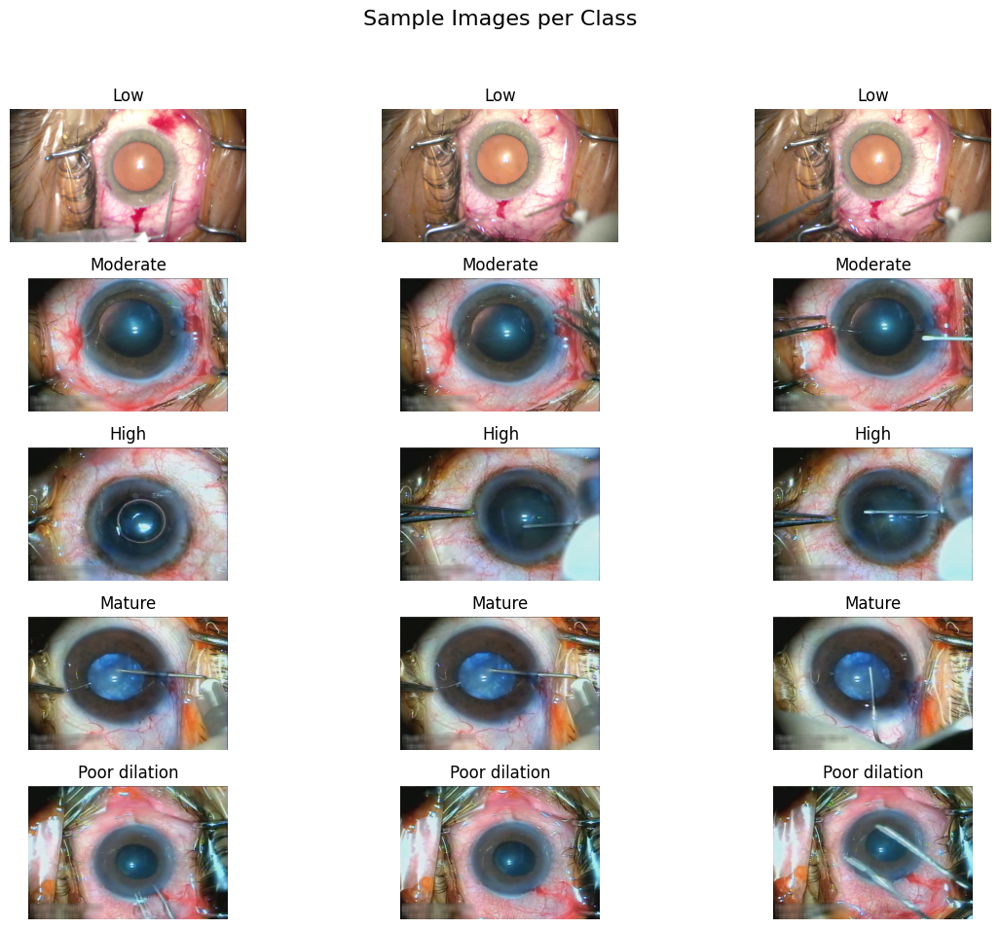

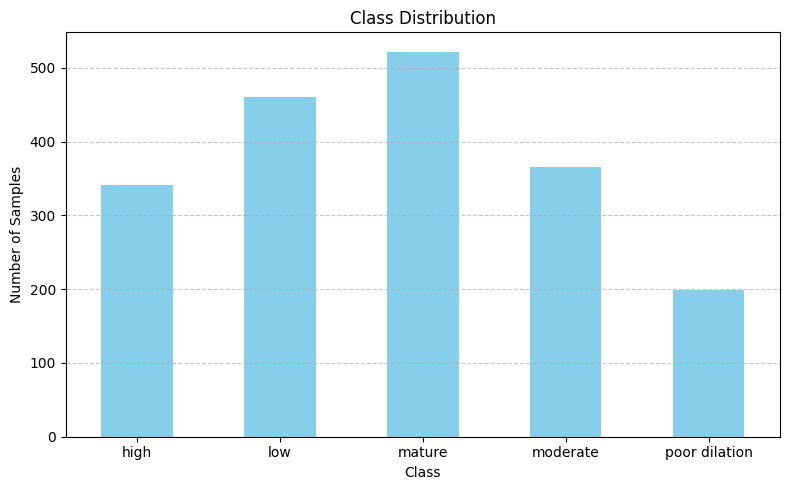

Downloading: "https://download.pytorch.org/models/efficientnet_b4_rwightman-23ab8bcd.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b4_rwightman-23ab8bcd.pth
100%|██████████| 74.5M/74.5M [00:00<00:00, 207MB/s]


Model is on device: cuda:0
Epoch: [1/30] | Step: [1/38] | Loss: 1.603421
Epoch: [1/30] | Step: [3/38] | Loss: 1.612246
Epoch: [1/30] | Step: [5/38] | Loss: 1.595005
Epoch: [1/30] | Step: [7/38] | Loss: 1.594192
Epoch: [1/30] | Step: [9/38] | Loss: 1.594205
Epoch: [1/30] | Step: [11/38] | Loss: 1.571930
Epoch: [1/30] | Step: [13/38] | Loss: 1.529569
Epoch: [1/30] | Step: [15/38] | Loss: 1.536754
Epoch: [1/30] | Step: [17/38] | Loss: 1.541907
Epoch: [1/30] | Step: [19/38] | Loss: 1.556556
Epoch: [1/30] | Step: [21/38] | Loss: 1.553605
Epoch: [1/30] | Step: [23/38] | Loss: 1.645936
Epoch: [1/30] | Step: [25/38] | Loss: 1.521570
Epoch: [1/30] | Step: [27/38] | Loss: 1.610006
Epoch: [1/30] | Step: [29/38] | Loss: 1.464295
Epoch: [1/30] | Step: [31/38] | Loss: 1.548084
Epoch: [1/30] | Step: [33/38] | Loss: 1.509642
Epoch: [1/30] | Step: [35/38] | Loss: 1.540620
Epoch: [1/30] | Step: [37/38] | Loss: 1.361623
Epoch: [1/30] | Loss: 1.511310
Valid Loss: 1.480165 | Acc: 0.4106
Epoch: [2/30] | Ste

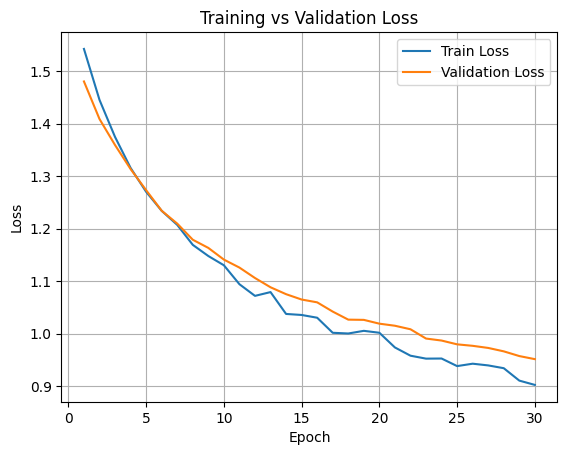

               precision    recall  f1-score   support

          low     0.7500    0.7500    0.7500        92
     moderate     0.5244    0.5890    0.5548        73
         high     0.5676    0.3088    0.4000        68
       mature     0.6231    0.7714    0.6894       105
poor dilation     0.8378    0.7750    0.8052        40

     accuracy                         0.6481       378
    macro avg     0.6606    0.6389    0.6399       378
 weighted avg     0.6476    0.6481    0.6383       378


Overall Accuracy: 0.6481
Macro F1-score  : 0.6399
Weighted F1-score: 0.6383


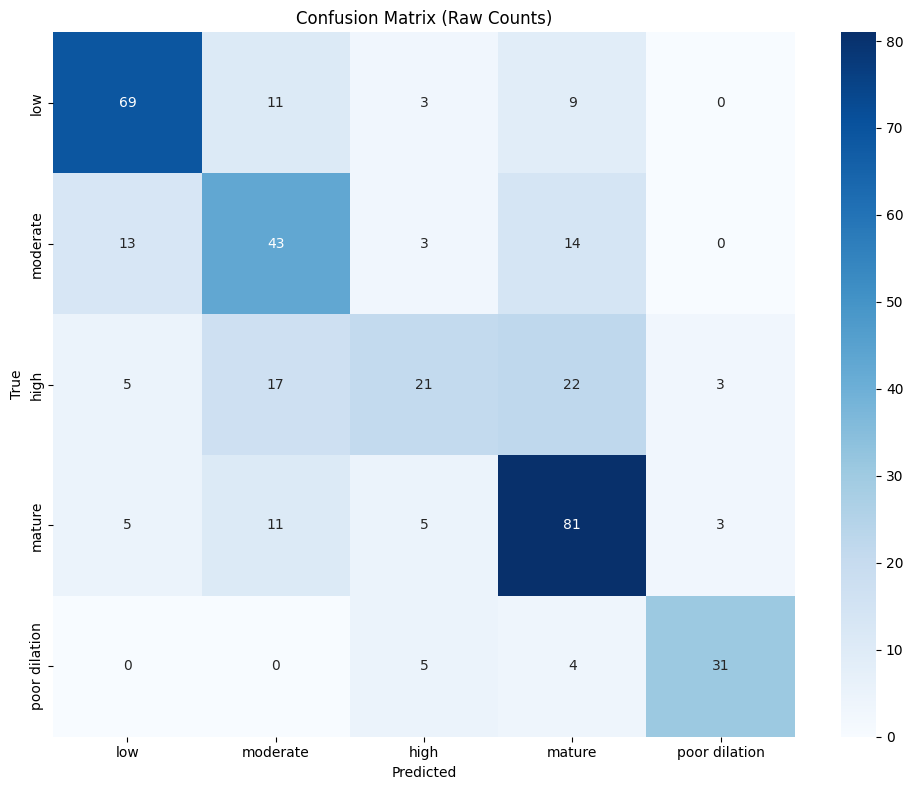

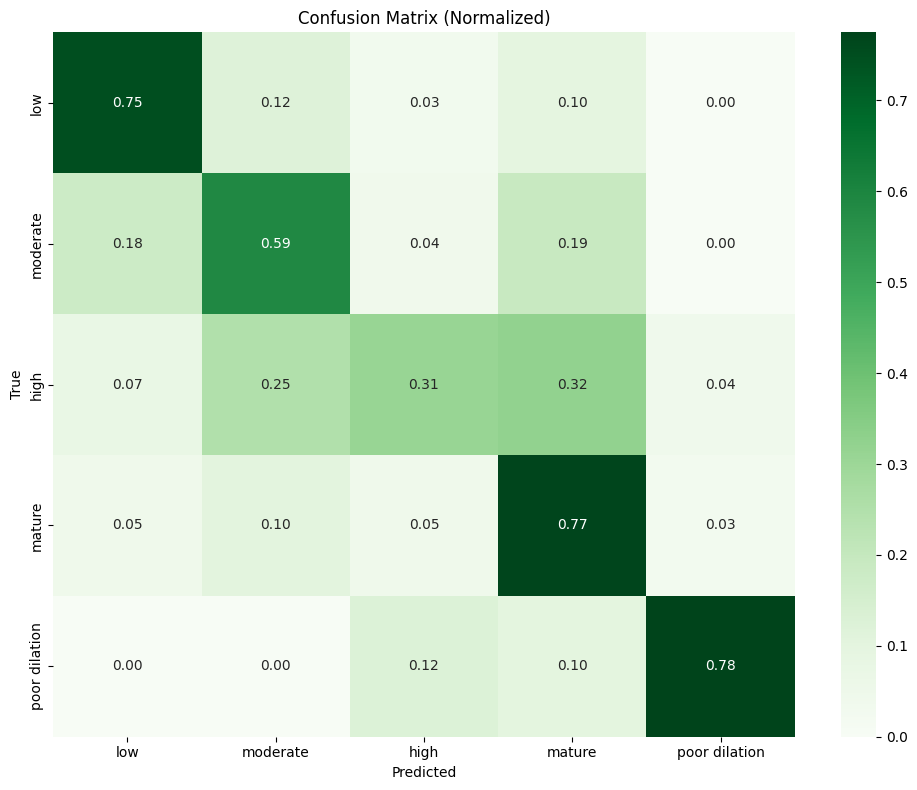

In [ ]:
CSV_PATH = "/content/dataset_V4.csv"
IMAGE_DIR = "/content/dataset_V4/dataset_V4"

train_loader, val_loader, test_loader, class_weights_tensor, df = get_dataloaders()


# Params
num_epochs = 30
lr = 1e-3
patience = 5
min_delta = 1e-4
best_val_loss = float('inf')
epochs_no_improve = 0

# Device configuration
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")



# Print dataset statistics
print(f"Total number of samples: {len(df)}")
print("\nClass distribution:")
print(df['label'].value_counts())

# Define the class labels (ordered)
classes = ["low", "moderate", "high", "mature", "poor dilation"]

# Create a subplot grid: 4 rows (classes) x 3 columns (images)
fig, axs = plt.subplots(len(classes), 3, figsize=(12, 10))
fig.suptitle("Sample Images per Class", fontsize=16)

# Loop over each class
for i, cls in enumerate(classes):
    class_samples = df[df["label"] == cls].head(3)
    for j, (_, row) in enumerate(class_samples.iterrows()):
        img_path = os.path.join(IMAGE_DIR, row["filename"] + ".jpg")
        try:
            image = Image.open(img_path)
            axs[i, j].imshow(image)
            axs[i, j].axis("off")
            axs[i, j].set_title(f"{cls.capitalize()}")
        except FileNotFoundError:
            axs[i, j].axis("off")
            axs[i, j].set_title("Image not found")

plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # adjust for suptitle
plt.show()

# Plot bar chart of class distribution
plt.figure(figsize=(8, 5))
df["label"].value_counts().sort_index().plot(kind='bar', color='skyblue')
plt.title("Class Distribution")
plt.xlabel("Class")
plt.ylabel("Number of Samples")
plt.xticks(rotation=0)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()




# Training
# model = resnet18(fine_tune=False).to(device)  # change to True if you want to fine-tune deeper layers
model = efficientnet_b4(fine_tune=False).to(device)
# Loss Function
# class_weights_tensor = class_weights_tensor.to(device)  # move to GPU
loss_fn = torch.nn.CrossEntropyLoss()
#weight=class_weights_tensor

# Optimizer
# optimizer = torch.optim.Adam(model.fc.parameters(), lr=lr)
optimizer = torch.optim.AdamW(model.parameters(), lr=lr, weight_decay=1e-2)

# Scheduler
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3)


train_loss = []
valid_loss = []

print(f"Model is on device: {next(model.parameters()).device}")

# Train Loop
num_steps = len(train_loader)
for epochs in range(num_epochs):
    model.train()
    running_loss = 0.0
    for j, (imgs, lbls) in enumerate(train_loader):
        imgs, lbls = imgs.to(device), lbls.to(device)
        optimizer.zero_grad()
        out = model(imgs)
        loss = loss_fn(out, lbls)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
        if j % 2 == 0:
            print('Epoch: [{}/{}] | Step: [{}/{}] | Loss: {:.6f}'
                  .format(epochs+1, num_epochs, j+1, num_steps, loss.item()))
    train_loss.append(running_loss / num_steps)
    print('Epoch: [{}/{}] | Loss: {:.6f}'
          .format(epochs+1, num_epochs, loss.item()))

#---------------------
    model.eval()
    with torch.no_grad():
        correct = 0
        total = 0
        running_valid_loss = 0.0
        for imgs, lbls in val_loader:
            imgs, lbls = imgs.to(device), lbls.to(device)
            out = model(imgs)
            loss_val = loss_fn(out, lbls)
            running_valid_loss += loss_val.item()
            predicted = torch.argmax(out, dim=1)
            correct += (predicted == lbls).sum().item()
            total += lbls.size(0)
        avg_val_loss = running_valid_loss / len(val_loader)
        valid_loss.append(avg_val_loss)
        print('Valid Loss: {:.6f} | Acc: {:.4f}'.format(valid_loss[-1], correct / total))

        # Step the scheduler
        scheduler.step(avg_val_loss)


        # Early stopping
        if best_val_loss - avg_val_loss > min_delta:
            best_val_loss = avg_val_loss
            epochs_no_improve = 0
        else:
            epochs_no_improve += 1
            if epochs_no_improve >= patience:
                print("Early stopping triggered.")
                break

# Plot losses
plt.plot(range(1, len(train_loss)+1), train_loss, label='Train Loss')
plt.plot(range(1, len(valid_loss)+1), valid_loss, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training vs Validation Loss')
plt.legend()
plt.grid(True)
plt.show()




# # Predictions and true labels
# all_preds = []
# all_labels = []
#
# model.eval()
# with torch.no_grad():
#     for imgs, lbls in test_loader:
#         imgs = imgs.to(device)
#         outputs = model(imgs)
#         preds = torch.argmax(outputs, dim=1).cpu()
#         all_preds.extend(preds.numpy())
#         all_labels.extend(lbls.numpy())
#
# # Classification Report
# print(classification_report(all_labels, all_preds, target_names=classes))
#
# # Confusion Matrix
# cm = confusion_matrix(all_labels, all_preds)
# plt.figure(figsize=(10, 8))
# sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=classes, yticklabels=classes)
# plt.xlabel('Predicted')
# plt.ylabel('True')
# plt.title('Confusion Matrix')
# plt.show()
#


# Evaluation
all_preds = []
all_labels = []

model.eval()
with torch.no_grad():
    for imgs, lbls in test_loader:
        imgs, lbls = imgs.to(device), lbls.to(device)
        outputs = model(imgs)
        preds = torch.argmax(outputs, dim=1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(lbls.cpu().numpy())

# Convert to numpy arrays
all_preds = np.array(all_preds)
all_labels = np.array(all_labels)

# Print classification report
report = classification_report(all_labels, all_preds, target_names=classes, digits=4)
print(report)

# Save report as a dataframe (optional)
report_df = pd.DataFrame(classification_report(all_labels, all_preds, target_names=classes, output_dict=True)).T
report_df.to_csv("classification_report.csv")

# Accuracy and F1 scores
print(f"\nOverall Accuracy: {accuracy_score(all_labels, all_preds):.4f}")
print(f"Macro F1-score  : {f1_score(all_labels, all_preds, average='macro'):.4f}")
print(f"Weighted F1-score: {f1_score(all_labels, all_preds, average='weighted'):.4f}")

# Confusion Matrix
cm = confusion_matrix(all_labels, all_preds)
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

# Plot raw confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=classes, yticklabels=classes)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix (Raw Counts)')
plt.tight_layout()
plt.show()

# Plot normalized confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm_normalized, annot=True, fmt='.2f', cmap='Greens', xticklabels=classes, yticklabels=classes)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix (Normalized)')
plt.tight_layout()
plt.show()


torch.save(model.state_dict(), 'efficientnet_b4_cataract.pth')

In [ ]:
import os
import time
import psutil
import pandas as pd
import numpy as np
from tqdm import tqdm
from PIL import Image
import torch
import torch.nn as nn
from torchvision import models, transforms
from sklearn.metrics import classification_report
from collections import Counter
from torchvision.transforms import functional as TF

# ====== CUSTOM PAD TO SQUARE TRANSFORM ======
class PadToSquareWithMean:
    def __call__(self, image):
        w, h = image.size
        max_dim = max(w, h)
        pad_left = (max_dim - w) // 2
        pad_top = (max_dim - h) // 2
        pad_right = max_dim - w - pad_left
        pad_bottom = max_dim - h - pad_top

        # Compute mean color of the image (as RGB tuple)
        mean_color = image.resize((1, 1)).getpixel((0, 0))

        # Apply padding using the mean color
        return TF.pad(image, (pad_left, pad_top, pad_right, pad_bottom),
                      fill=mean_color, padding_mode='constant')

# ====== CONFIG ======
model_path = "/content/efficientnet_b4_cataract.pth"
image_dir = "/content/Test_Data/Test_Data"
label_csv_path = "/content/Test_Data.csv"
num_classes = 5
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Device used for inference: {device}")
class_names = ['low', 'moderate', 'high', 'mature', 'poor dilation']

# ====== TRANSFORMS ======
val_test_transform = transforms.Compose([
    PadToSquareWithMean(),
    transforms.Resize((380, 380)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

# ====== LOAD MODEL ======
print("\nLoading model...")
start_model_load = time.time()
model = models.efficientnet_b4()
model.classifier[1] = nn.Linear(model.classifier[1].in_features, num_classes)
model.load_state_dict(torch.load(model_path, map_location=device))
model.to(device)
model.eval()
end_model_load = time.time()
model_load_time = end_model_load - start_model_load
model_file_size = os.path.getsize(model_path) / (1024**2)  # MB

# ====== LOAD LABELS ======
df = pd.read_csv(label_csv_path)
df['filename'] = df['filename'].astype(str)
df['label'] = df['label'].str.strip().str.lower()

# ====== INFERENCE SETUP ======
y_true = []
y_pred = []
total_time = 0
total_images = 0

# Reset peak GPU memory stats
if device.type == "cuda":
    torch.cuda.reset_peak_memory_stats(device)

# Start monitoring CPU, RAM
process = psutil.Process(os.getpid())
cpu_before = psutil.cpu_percent(interval=1)
ram_before = process.memory_info().rss / (1024 ** 2)

# ====== RUN INFERENCE ======
for _, row in tqdm(df.iterrows(), total=len(df), desc="Running Inference"):
    filename, true_label = row['filename'], row['label']
    img_path = os.path.join(image_dir, filename + ".jpg")

    if not os.path.exists(img_path):
        print(f"Skipping missing file: {img_path}")
        continue

    img = Image.open(img_path).convert('RGB')
    input_tensor = val_test_transform(img).unsqueeze(0).to(device)

    start = time.time()
    with torch.no_grad():
        output = model(input_tensor)
        prob = torch.softmax(output, dim=1)
        pred_idx = torch.argmax(prob, dim=1).item()
    end = time.time()

    total_time += (end - start)
    total_images += 1
    y_true.append(true_label)
    y_pred.append(class_names[pred_idx])

# ====== RESOURCE USAGE ======
cpu_after = psutil.cpu_percent(interval=1)
ram_after = process.memory_info().rss / (1024 ** 2)
gpu_memory = 0
if device.type == "cuda":
    gpu_memory = torch.cuda.max_memory_allocated(device) / (1024 ** 2)

# ====== REPORT ======
print("\n====== Inference Results ======")
if total_images == 0:
    print("⚠️ No images were successfully processed.")
else:
    print(f"🕒 Average latency: {(total_time / total_images) * 1000:.2f} ms/image")
    print(f"⚡ Total inference time: {total_time:.2f} sec for {total_images} images")
print(f"🧊 Model load time: {model_load_time:.2f} sec")
print(f"📁 Model file size: {model_file_size:.2f} MB")
print(f"📈 CPU usage change: {cpu_after - cpu_before:.2f}%")
print(f"📦 RAM used change: {ram_after - ram_before:.2f} MB")
if device.type == "cuda":
    print(f"🧠 Peak GPU memory used: {gpu_memory:.2f} MB")

print("\n====== Classification Report ======")
if total_images > 0:
    print(classification_report(y_true, y_pred, target_names=class_names, zero_division=0))
    print("\nPrediction distribution:", Counter(y_pred))
    print("True label distribution:", Counter(y_true))


Device used for inference: cuda

Loading model...


Running Inference: 100%|██████████| 40/40 [00:01<00:00, 22.75it/s]



====== Inference Results ======
🕒 Average latency: 28.23 ms/image
⚡ Total inference time: 1.13 sec for 40 images
🧊 Model load time: 0.88 sec
📁 Model file size: 67.71 MB
📈 CPU usage change: -8.80%
📦 RAM used change: 276.51 MB
🧠 Peak GPU memory used: 122.69 MB

====== Classification Report ======
               precision    recall  f1-score   support

          low       0.60      0.43      0.50         7
     moderate       1.00      1.00      1.00         7
         high       0.55      1.00      0.71         6
       mature       0.64      0.54      0.58        13
poor dilation       1.00      0.86      0.92         7

     accuracy                           0.72        40
    macro avg       0.76      0.76      0.74        40
 weighted avg       0.74      0.72      0.72        40


Prediction distribution: Counter({'moderate': 11, 'mature': 11, 'low': 7, 'poor dilation': 6, 'high': 5})
True label distribution: Counter({'moderate': 13, 'low': 7, 'high': 7, 'poor dilation': 7, 'mature

In [ ]:
# ========== Config ==========
CSV_PATH = "dataset_V4.csv"
IMAGE_DIR = "/content/dataset_V4/dataset_V4"
BATCH_SIZE = 32

# ========== Dataset ==========
class CataractDataset(Dataset):
    def __init__(self, dataframe, image_dir, transform=None):
        self.data = dataframe.reset_index(drop=True)
        self.image_dir = image_dir
        self.transform = transform
        self.label_map = {"low": 0, "moderate": 1, "high": 2, "mature": 3, "poor dilation": 4}

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        row = self.data.iloc[idx]
        img_path = os.path.join(self.image_dir, row["filename"] + ".jpg")
        try:
            image = Image.open(img_path).convert("RGB")
        except FileNotFoundError:
            print(f"Missing image: {img_path}")
            return self.__getitem__((idx + 1) % len(self.data))

        label = self.label_map[row["label"].lower()]
        if self.transform:
            image = self.transform(image)
        return image, torch.tensor(label)

# ========== Load and Prepare CSV ==========
df = pd.read_csv(CSV_PATH)
df.columns = df.columns.str.strip()
df.rename(columns={"Frame Name": "filename"}, inplace=True)

# Derive label column from binary indicators
df["label"] = None
df.loc[df["Low Nuclear Density"] == 1.0, "label"] = "low"
df.loc[df["Moderate Nuclear Density"] == 1.0, "label"] = "moderate"
df.loc[df["High Nuclear Density"] == 1.0, "label"] = "high"
df.loc[df["Mature"] == 1.0, "label"] = "mature"
df.loc[df["Poor Dilation"] == 1.0, "label"] = "poor dilation"


# Keep only valid rows
df = df[df["label"].notna()]
df = df[["filename", "label"]]

# ========== Train / Val / Test Split ==========
train_val_df, test_df = train_test_split(df, test_size=0.2, stratify=df["label"], random_state=42)
train_df, val_df = train_test_split(train_val_df, test_size=0.2, stratify=train_val_df["label"], random_state=42)

# Map labels to integer indices
label_map = {"low": 0, "moderate": 1, "high": 2, "mature": 3, "poor dilation": 4}
train_df["class_idx"] = train_df["label"].map(label_map)

# Compute class weights
class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(train_df["class_idx"]),
    y=train_df["class_idx"]
)
class_weights_tensor = torch.tensor(class_weights, dtype=torch.float)

# ========== Transforms ==========
transform = transforms.Compose([
    PadToSquareWithMean(),  # <-- add this at the top
    transforms.Resize((224, 224)),  # match model input size
    transforms.RandomRotation(degrees=15),
    transforms.RandomAffine(degrees=10, translate=(0.05, 0.05), scale=(0.95, 1.05)),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
    transforms.RandomErasing(p=0.3)
])
val_test_transform = transforms.Compose([
    PadToSquareWithMean(),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])


# ========== Datasets and Dataloaders ==========
train_dataset = CataractDataset(train_df, IMAGE_DIR, transform)
# val_dataset = CataractDataset(val_df, IMAGE_DIR, transform)
# test_dataset = CataractDataset(test_df, IMAGE_DIR, transform)
val_dataset = CataractDataset(val_df, IMAGE_DIR, val_test_transform)
test_dataset = CataractDataset(test_df, IMAGE_DIR, val_test_transform)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False)

# ========== Return Utility ==========
def get_dataloaders():
    return train_loader, val_loader, test_loader, class_weights_tensor, df


In [ ]:
import torch
import torch.nn as nn
from torchvision import models

def densenet121(fine_tune=False):
    """
    Returns a pretrained DenseNet-121 model modified for 5-class classification.

    Args:
        fine_tune (bool): If True, unfreezes the classifier and last block for fine-tuning

    Returns:
        model: torch.nn.Module
    """
    # Load pretrained DenseNet121
    model = models.densenet121(pretrained=True)

    # Freeze all parameters first
    for param in model.parameters():
        param.requires_grad = False

    # Unfreeze classifier and last denseblock if fine-tuning
    if fine_tune:
        for name, param in model.features.denseblock4.named_parameters():
            param.requires_grad = True
        for param in model.classifier.parameters():
            param.requires_grad = True

    # Replace classifier
    num_ftrs = model.classifier.in_features
    model.classifier = nn.Linear(num_ftrs, 5)

    return model


Using device: cuda
Total number of samples: 1888

Class distribution:
label
mature           522
low              460
moderate         366
high             341
poor dilation    199
Name: count, dtype: int64


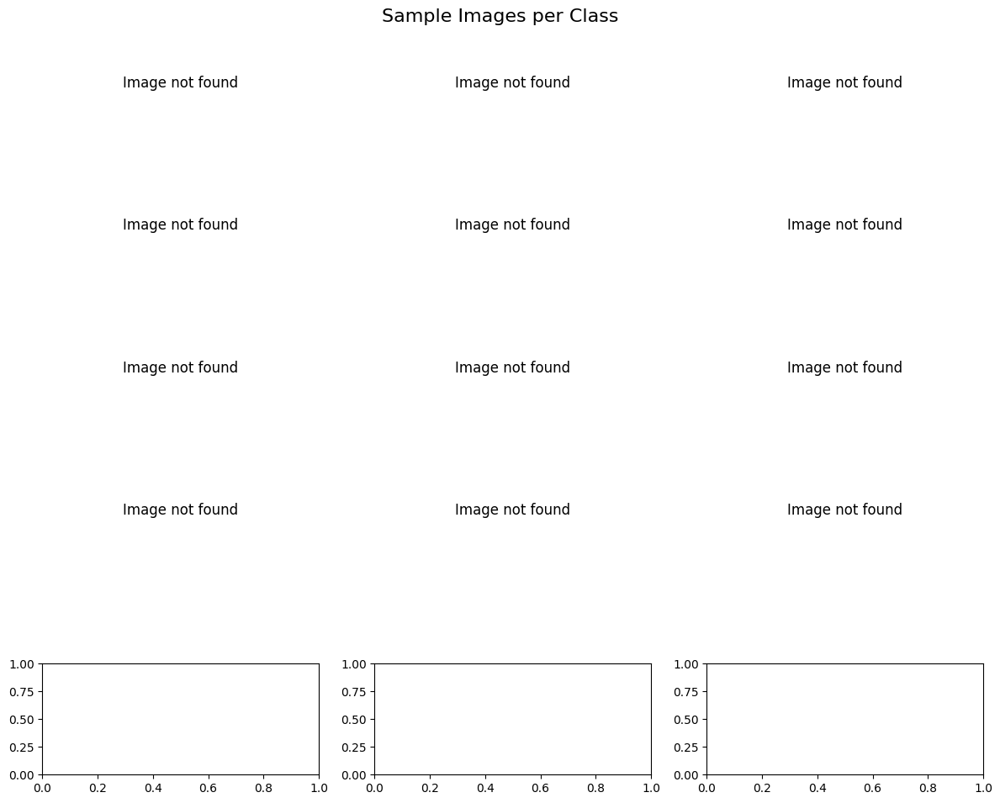

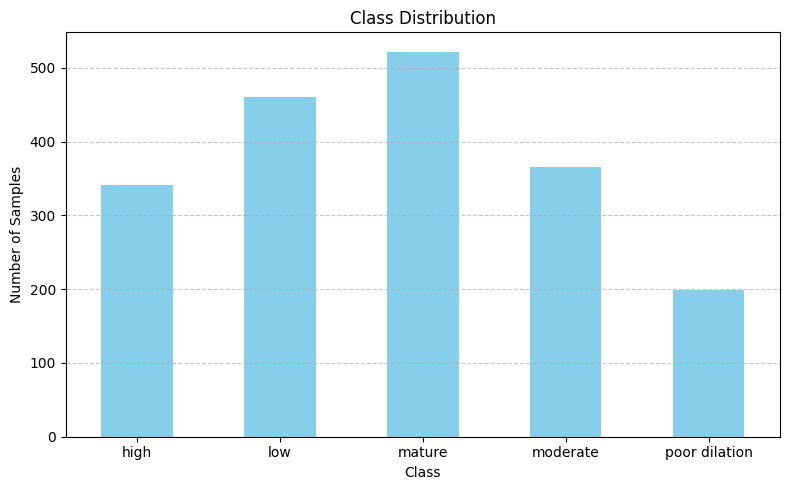

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/densenet121-a639ec97.pth" to /root/.cache/torch/hub/checkpoints/densenet121-a639ec97.pth
100%|██████████| 30.8M/30.8M [00:00<00:00, 180MB/s]


Model is on device: cuda:0
Epoch: [1/30] | Step: [1/38] | Loss: 1.760353
Epoch: [1/30] | Step: [3/38] | Loss: 1.715397
Epoch: [1/30] | Step: [5/38] | Loss: 1.604770
Epoch: [1/30] | Step: [7/38] | Loss: 1.545374
Epoch: [1/30] | Step: [9/38] | Loss: 1.656270
Epoch: [1/30] | Step: [11/38] | Loss: 1.557758
Epoch: [1/30] | Step: [13/38] | Loss: 1.787506
Epoch: [1/30] | Step: [15/38] | Loss: 1.528105
Epoch: [1/30] | Step: [17/38] | Loss: 1.765434
Epoch: [1/30] | Step: [19/38] | Loss: 1.621102
Epoch: [1/30] | Step: [21/38] | Loss: 1.498423
Epoch: [1/30] | Step: [23/38] | Loss: 1.560896
Epoch: [1/30] | Step: [25/38] | Loss: 1.517261
Epoch: [1/30] | Step: [27/38] | Loss: 1.455712
Epoch: [1/30] | Step: [29/38] | Loss: 1.536661
Epoch: [1/30] | Step: [31/38] | Loss: 1.432061
Epoch: [1/30] | Step: [33/38] | Loss: 1.572751
Epoch: [1/30] | Step: [35/38] | Loss: 1.517186
Epoch: [1/30] | Step: [37/38] | Loss: 1.479074
Epoch: [1/30] | Loss: 1.615820
Valid Loss: 1.477511 | Acc: 0.3179
Epoch: [2/30] | Ste

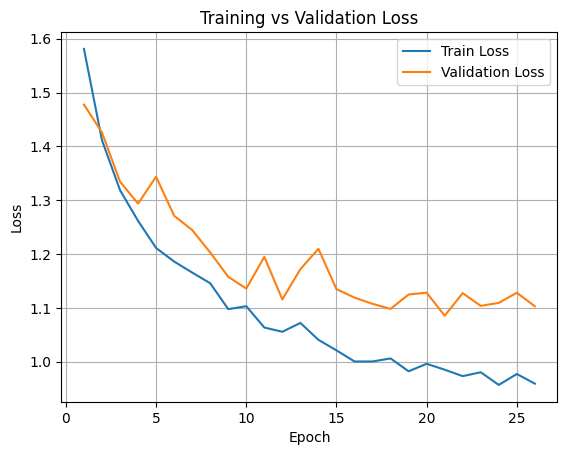

               precision    recall  f1-score   support

          low     0.5072    0.7609    0.6087        92
     moderate     0.6667    0.2466    0.3600        73
         high     0.5000    0.2647    0.3462        68
       mature     0.5235    0.7429    0.6142       105
poor Dilation     0.8571    0.6000    0.7059        40

     accuracy                         0.5503       378
    macro avg     0.6109    0.5230    0.5270       378
 weighted avg     0.5783    0.5503    0.5252       378


Overall Accuracy: 0.5503
Macro F1-score  : 0.5270
Weighted F1-score: 0.5252


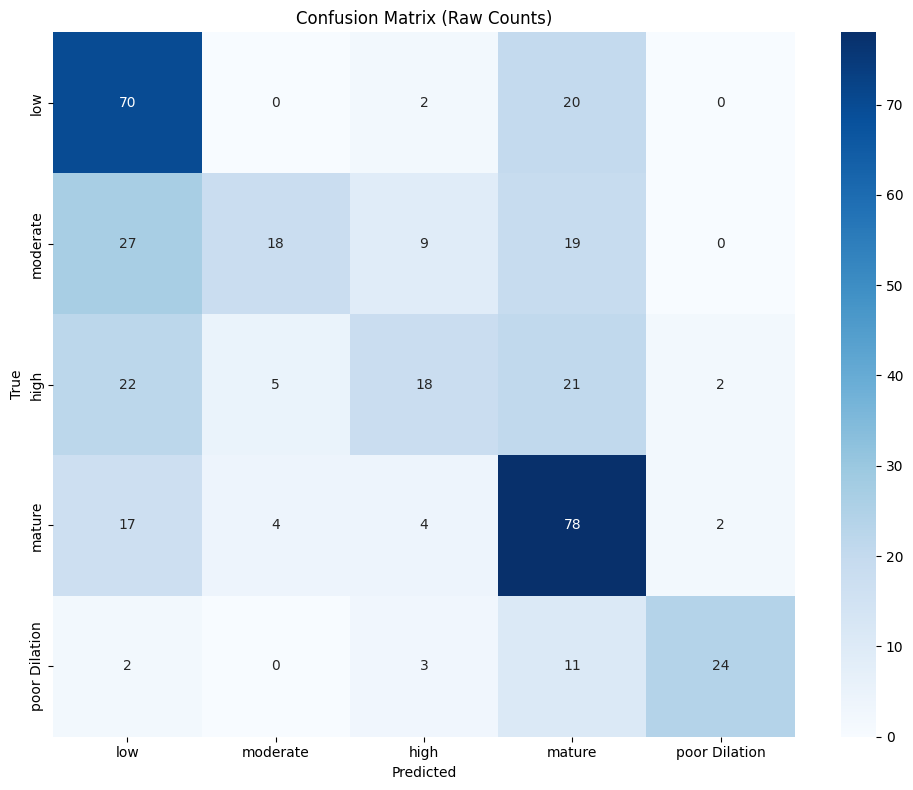

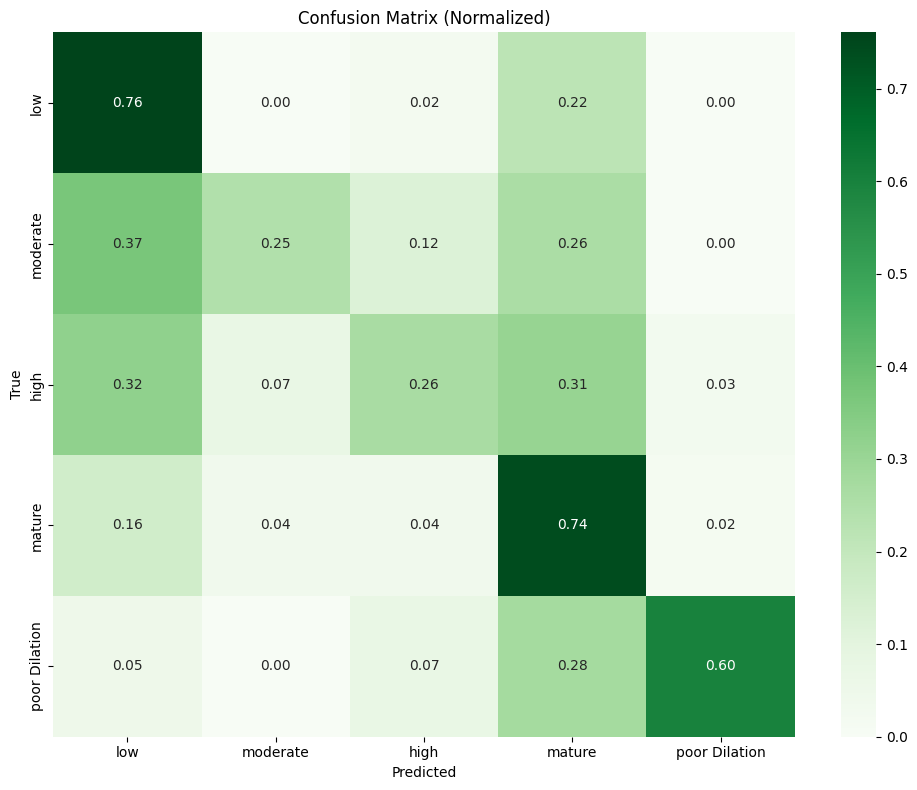

In [ ]:
CSV_PATH = "/content/dataset_V2.csv"
IMAGE_DIR = "/content/dataset_V2/dataset_V2"

train_loader, val_loader, test_loader, class_weights_tensor, df = get_dataloaders()


# Params
num_epochs = 30
lr = 1e-3
patience = 5
min_delta = 1e-4
best_val_loss = float('inf')
epochs_no_improve = 0

# Device configuration
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")



# Print dataset statistics
print(f"Total number of samples: {len(df)}")
print("\nClass distribution:")
print(df['label'].value_counts())

# Define the class labels (ordered)
classes = ["low", "moderate", "high", "mature", "poor Dilation"]

# Create a subplot grid: 4 rows (classes) x 3 columns (images)
fig, axs = plt.subplots(len(classes), 3, figsize=(12, 10))
fig.suptitle("Sample Images per Class", fontsize=16)

# Loop over each class
for i, cls in enumerate(classes):
    class_samples = df[df["label"] == cls].head(3)
    for j, (_, row) in enumerate(class_samples.iterrows()):
        img_path = os.path.join(IMAGE_DIR, row["filename"] + ".jpg")
        try:
            image = Image.open(img_path)
            axs[i, j].imshow(image)
            axs[i, j].axis("off")
            axs[i, j].set_title(f"{cls.capitalize()}")
        except FileNotFoundError:
            axs[i, j].axis("off")
            axs[i, j].set_title("Image not found")

plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # adjust for suptitle
plt.show()

# Plot bar chart of class distribution
plt.figure(figsize=(8, 5))
df["label"].value_counts().sort_index().plot(kind='bar', color='skyblue')
plt.title("Class Distribution")
plt.xlabel("Class")
plt.ylabel("Number of Samples")
plt.xticks(rotation=0)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()




# Training
# model = resnet18(fine_tune=False).to(device)  # change to True if you want to fine-tune deeper layers
model = densenet121(fine_tune=False).to(device)
# Loss Function
# class_weights_tensor = class_weights_tensor.to(device)  # move to GPU
loss_fn = torch.nn.CrossEntropyLoss()
#weight=class_weights_tensor

# Optimizer
# optimizer = torch.optim.Adam(model.fc.parameters(), lr=lr)
optimizer = torch.optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=1e-3, weight_decay=1e-2)

# Scheduler
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3)


train_loss = []
valid_loss = []

print(f"Model is on device: {next(model.parameters()).device}")

# Train Loop
num_steps = len(train_loader)
for epochs in range(num_epochs):
    model.train()
    running_loss = 0.0
    for j, (imgs, lbls) in enumerate(train_loader):
        imgs, lbls = imgs.to(device), lbls.to(device)
        optimizer.zero_grad()
        out = model(imgs)
        loss = loss_fn(out, lbls)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
        if j % 2 == 0:
            print('Epoch: [{}/{}] | Step: [{}/{}] | Loss: {:.6f}'
                  .format(epochs+1, num_epochs, j+1, num_steps, loss.item()))
    train_loss.append(running_loss / num_steps)
    print('Epoch: [{}/{}] | Loss: {:.6f}'
          .format(epochs+1, num_epochs, loss.item()))

#---------------------
    model.eval()
    with torch.no_grad():
        correct = 0
        total = 0
        running_valid_loss = 0.0
        for imgs, lbls in val_loader:
            imgs, lbls = imgs.to(device), lbls.to(device)
            out = model(imgs)
            loss_val = loss_fn(out, lbls)
            running_valid_loss += loss_val.item()
            predicted = torch.argmax(out, dim=1)
            correct += (predicted == lbls).sum().item()
            total += lbls.size(0)
        avg_val_loss = running_valid_loss / len(val_loader)
        valid_loss.append(avg_val_loss)
        print('Valid Loss: {:.6f} | Acc: {:.4f}'.format(valid_loss[-1], correct / total))

        # Step the scheduler
        scheduler.step(avg_val_loss)


        # Early stopping
        if best_val_loss - avg_val_loss > min_delta:
            best_val_loss = avg_val_loss
            epochs_no_improve = 0
        else:
            epochs_no_improve += 1
            if epochs_no_improve >= patience:
                print("Early stopping triggered.")
                break

# Plot losses
plt.plot(range(1, len(train_loss)+1), train_loss, label='Train Loss')
plt.plot(range(1, len(valid_loss)+1), valid_loss, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training vs Validation Loss')
plt.legend()
plt.grid(True)
plt.show()




# # Predictions and true labels
# all_preds = []
# all_labels = []
#
# model.eval()
# with torch.no_grad():
#     for imgs, lbls in test_loader:
#         imgs = imgs.to(device)
#         outputs = model(imgs)
#         preds = torch.argmax(outputs, dim=1).cpu()
#         all_preds.extend(preds.numpy())
#         all_labels.extend(lbls.numpy())
#
# # Classification Report
# print(classification_report(all_labels, all_preds, target_names=classes))
#
# # Confusion Matrix
# cm = confusion_matrix(all_labels, all_preds)
# plt.figure(figsize=(10, 8))
# sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=classes, yticklabels=classes)
# plt.xlabel('Predicted')
# plt.ylabel('True')
# plt.title('Confusion Matrix')
# plt.show()
#


# Evaluation
all_preds = []
all_labels = []

model.eval()
with torch.no_grad():
    for imgs, lbls in test_loader:
        imgs, lbls = imgs.to(device), lbls.to(device)
        outputs = model(imgs)
        preds = torch.argmax(outputs, dim=1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(lbls.cpu().numpy())

# Convert to numpy arrays
all_preds = np.array(all_preds)
all_labels = np.array(all_labels)

# Print classification report
report = classification_report(all_labels, all_preds, target_names=classes, digits=4)
print(report)

# Save report as a dataframe (optional)
report_df = pd.DataFrame(classification_report(all_labels, all_preds, target_names=classes, output_dict=True)).T
report_df.to_csv("classification_report.csv")

# Accuracy and F1 scores
print(f"\nOverall Accuracy: {accuracy_score(all_labels, all_preds):.4f}")
print(f"Macro F1-score  : {f1_score(all_labels, all_preds, average='macro'):.4f}")
print(f"Weighted F1-score: {f1_score(all_labels, all_preds, average='weighted'):.4f}")

# Confusion Matrix
cm = confusion_matrix(all_labels, all_preds)
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

# Plot raw confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=classes, yticklabels=classes)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix (Raw Counts)')
plt.tight_layout()
plt.show()

# Plot normalized confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm_normalized, annot=True, fmt='.2f', cmap='Greens', xticklabels=classes, yticklabels=classes)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix (Normalized)')
plt.tight_layout()
plt.show()



torch.save(model.state_dict(), 'densenet121.pth')

In [ ]:
import os
import time
import psutil
import pandas as pd
import numpy as np
from tqdm import tqdm
from PIL import Image
import torch
import torch.nn as nn
from torchvision import models, transforms
from sklearn.metrics import classification_report
from collections import Counter

# ====== CUSTOM PAD TO SQUARE TRANSFORM ======
from torchvision.transforms import functional as TF

class PadToSquareWithMean:
    def __call__(self, image):
        w, h = image.size
        max_dim = max(w, h)
        pad_left = (max_dim - w) // 2
        pad_top = (max_dim - h) // 2
        pad_right = max_dim - w - pad_left
        pad_bottom = max_dim - h - pad_top

        # Compute mean color of the image (as RGB tuple)
        mean_color = image.resize((1, 1)).getpixel((0, 0))

        # Apply padding using the mean color
        return TF.pad(image, (pad_left, pad_top, pad_right, pad_bottom),
                      fill=mean_color, padding_mode='constant')

# ====== CONFIG ======
model_path = "/content/densenet121.pth"
image_dir = "/content/Test_Data/Test_Data"
label_csv_path = "/content/Test_Data.csv"
num_classes = 5
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Device used for inference: {device}")
class_names = ['low', 'moderate', 'high', 'mature', 'poor dilation']

# ====== TRANSFORMS ======
val_test_transform = transforms.Compose([
    PadToSquareWithMean(),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])])

# ====== LOAD MODEL ======
print("\nLoading model...")
start_model_load = time.time()
model = models.densenet121()
model.classifier = nn.Linear(model.classifier.in_features, num_classes)
model.load_state_dict(torch.load(model_path, map_location=device))
model.to(device)
model.eval()
end_model_load = time.time()
model_load_time = end_model_load - start_model_load
model_file_size = os.path.getsize(model_path) / (1024**2)  # MB

# ====== LOAD LABELS ======
df = pd.read_csv(label_csv_path)
df['filename'] = df['filename'].astype(str)
df['label'] = df['label'].str.strip().str.lower()

# ====== INFERENCE SETUP ======
y_true = []
y_pred = []
total_time = 0
total_images = 0

# Reset peak GPU memory stats
if device.type == "cuda":
    torch.cuda.reset_peak_memory_stats(device)

# Start monitoring CPU, RAM
process = psutil.Process(os.getpid())
cpu_before = psutil.cpu_percent(interval=1)
ram_before = process.memory_info().rss / (1024 ** 2)

# ====== RUN INFERENCE ======
for _, row in tqdm(df.iterrows(), total=len(df), desc="Running Inference"):
    filename, true_label = row['filename'], row['label']
    img_path = os.path.join(image_dir, filename + ".jpg")

    if not os.path.exists(img_path):
        print(f"Skipping missing file: {img_path}")
        continue

    img = Image.open(img_path).convert('RGB')
    input_tensor = val_test_transform(img).unsqueeze(0).to(device)

    start = time.time()
    with torch.no_grad():
        output = model(input_tensor)
        prob = torch.softmax(output, dim=1)
        pred_idx = torch.argmax(prob, dim=1).item()
    end = time.time()

    total_time += (end - start)
    total_images += 1
    y_true.append(true_label)
    y_pred.append(class_names[pred_idx])

# ====== RESOURCE USAGE ======
cpu_after = psutil.cpu_percent(interval=1)
ram_after = process.memory_info().rss / (1024 ** 2)
gpu_memory = 0
if device.type == "cuda":
    gpu_memory = torch.cuda.max_memory_allocated(device) / (1024 ** 2)

# ====== REPORT ======
print("\n====== Inference Results ======")
if total_images == 0:
    print("⚠️ No images were successfully processed.")
else:
    print(f"🕒 Average latency: {(total_time / total_images) * 1000:.2f} ms/image")
    print(f"⚡ Total inference time: {total_time:.2f} sec for {total_images} images")
print(f"🧊 Model load time: {model_load_time:.2f} sec")
print(f"📁 Model file size: {model_file_size:.2f} MB")
print(f"📈 CPU usage change: {cpu_after - cpu_before:.2f}%")
print(f"📦 RAM used change: {ram_after - ram_before:.2f} MB")
if device.type == "cuda":
    print(f"🧠 Peak GPU memory used: {gpu_memory:.2f} MB")

print("\n====== Classification Report ======")
if total_images > 0:
    print(classification_report(y_true, y_pred, target_names=class_names, zero_division=0))
    print("\nPrediction distribution:", Counter(y_pred))
    print("True label distribution:", Counter(y_true))


Device used for inference: cuda

Loading model...


Running Inference: 100%|██████████| 40/40 [00:01<00:00, 22.33it/s]



====== Inference Results ======
🕒 Average latency: 29.96 ms/image
⚡ Total inference time: 1.20 sec for 40 images
🧊 Model load time: 0.67 sec
📁 Model file size: 27.13 MB
📈 CPU usage change: -11.10%
📦 RAM used change: 227.72 MB
🧠 Peak GPU memory used: 48.88 MB

====== Classification Report ======
               precision    recall  f1-score   support

          low       0.50      0.29      0.36         7
     moderate       0.88      1.00      0.93         7
         high       0.32      1.00      0.48         6
       mature       0.80      0.31      0.44        13
poor dilation       1.00      0.57      0.73         7

     accuracy                           0.57        40
    macro avg       0.70      0.63      0.59        40
 weighted avg       0.72      0.57      0.57        40


Prediction distribution: Counter({'mature': 19, 'low': 8, 'moderate': 5, 'high': 4, 'poor dilation': 4})
True label distribution: Counter({'moderate': 13, 'low': 7, 'high': 7, 'poor dilation': 7, 'mature'

In [ ]:
# ========== Config ==========
CSV_PATH = "dataset_V2.csv"
IMAGE_DIR = "/content/dataset_V2/dataset_V2"
BATCH_SIZE = 32

# ========== Dataset ==========
class CataractDataset(Dataset):
    def __init__(self, dataframe, image_dir, transform=None):
        self.data = dataframe.reset_index(drop=True)
        self.image_dir = image_dir
        self.transform = transform
        self.label_map = {"low": 0, "moderate": 1, "high": 2, "mature": 3, "poor dilation": 4}

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        row = self.data.iloc[idx]
        img_path = os.path.join(self.image_dir, row["filename"] + ".jpg")
        try:
            image = Image.open(img_path).convert("RGB")
        except FileNotFoundError:
            print(f"Missing image: {img_path}")
            return self.__getitem__((idx + 1) % len(self.data))

        label = self.label_map[row["label"].lower()]
        if self.transform:
            image = self.transform(image)
        return image, torch.tensor(label)

# ========== Load and Prepare CSV ==========
df = pd.read_csv(CSV_PATH)
df.columns = df.columns.str.strip()
df.rename(columns={"Frame Name": "filename"}, inplace=True)

# Derive label column from binary indicators
df["label"] = None
df.loc[df["Low Nuclear Density"] == 1.0, "label"] = "low"
df.loc[df["Moderate Nuclear Density"] == 1.0, "label"] = "moderate"
df.loc[df["High Nuclear Density"] == 1.0, "label"] = "high"
df.loc[df["Mature"] == 1.0, "label"] = "mature"
df.loc[df["Poor Dilation"] == 1.0, "label"] = "poor dilation"


# Keep only valid rows
df = df[df["label"].notna()]
df = df[["filename", "label"]]

# ========== Train / Val / Test Split ==========
train_val_df, test_df = train_test_split(df, test_size=0.2, stratify=df["label"], random_state=42)
train_df, val_df = train_test_split(train_val_df, test_size=0.2, stratify=train_val_df["label"], random_state=42)

# Map labels to integer indices
label_map = {"low": 0, "moderate": 1, "high": 2, "mature": 3, "poor dilation": 4}
train_df["class_idx"] = train_df["label"].map(label_map)

# Compute class weights
class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(train_df["class_idx"]),
    y=train_df["class_idx"]
)
class_weights_tensor = torch.tensor(class_weights, dtype=torch.float)

# ========== Transforms ==========
transform = transforms.Compose([
    PadToSquareWithMean(),  # <-- add this at the top
    transforms.Resize((224, 224)),  # match model input size
    transforms.RandomRotation(degrees=15),
    transforms.RandomAffine(degrees=10, translate=(0.05, 0.05), scale=(0.95, 1.05)),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
    transforms.RandomErasing(p=0.3)
])
val_test_transform = transforms.Compose([
    PadToSquareWithMean(),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])


# ========== Datasets and Dataloaders ==========
train_dataset = CataractDataset(train_df, IMAGE_DIR, transform)
# val_dataset = CataractDataset(val_df, IMAGE_DIR, transform)
# test_dataset = CataractDataset(test_df, IMAGE_DIR, transform)
val_dataset = CataractDataset(val_df, IMAGE_DIR, val_test_transform)
test_dataset = CataractDataset(test_df, IMAGE_DIR, val_test_transform)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False)

# ========== Return Utility ==========
def get_dataloaders():
    return train_loader, val_loader, test_loader, class_weights_tensor, df


In [ ]:
# densenet169.py

from torchvision.models import densenet169, DenseNet169_Weights
import torch.nn as nn

def get_densenet169(num_classes: int = 5,
                    fine_tune: bool = False,
                    pretrained: bool = True) -> nn.Module:
    """
    Returns a DenseNet-169 pretrained on ImageNet, adapted for `num_classes` outputs.

    Args:
        num_classes: number of classes (5 for your dataset)
        fine_tune:   if False, freeze all backbone layers
        pretrained:  if True, load ImageNet weights
    """
    weights = DenseNet169_Weights.DEFAULT if pretrained else None
    model = densenet169(weights=weights)

    if not fine_tune:
        for param in model.features.parameters():
            param.requires_grad = False

    # Replace classifier
    in_features = model.classifier.in_features
    model.classifier = nn.Linear(in_features, num_classes)
    return model


Using device: cuda
Total number of samples: 798

Class distribution:
label
low              218
mature           169
high             142
poor dilation    136
moderate         133
Name: count, dtype: int64


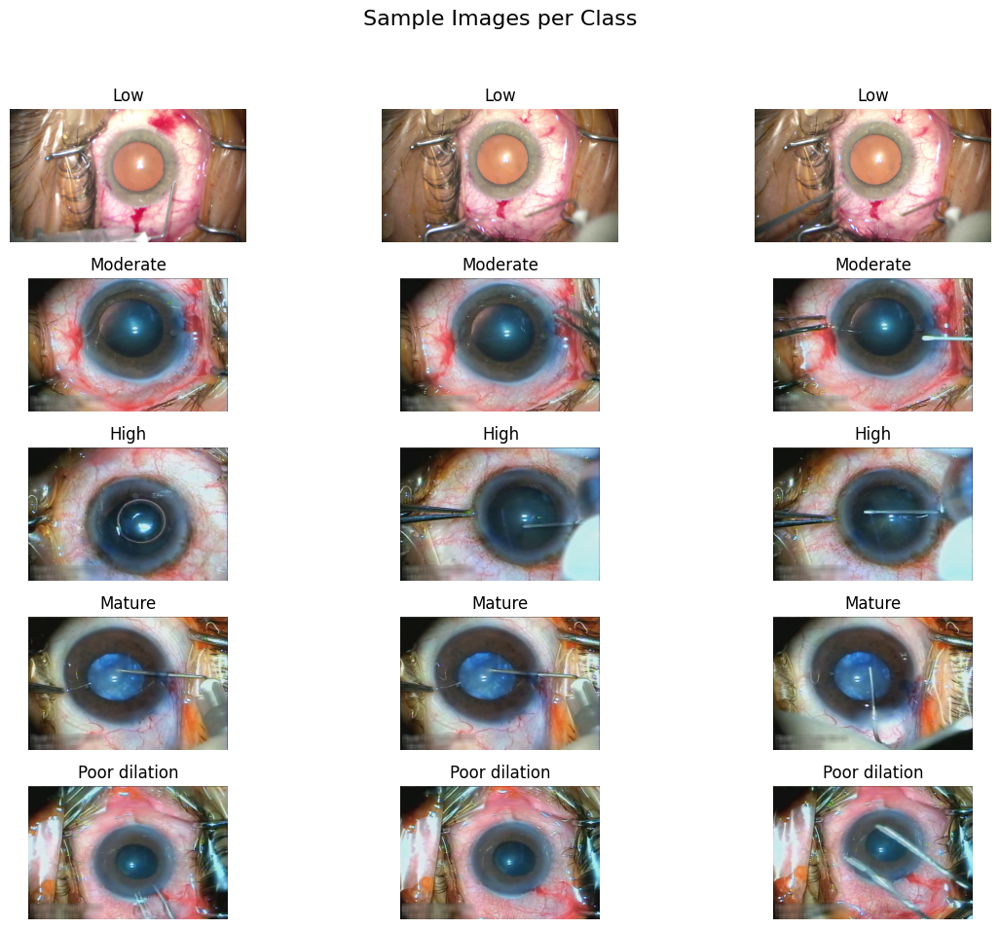

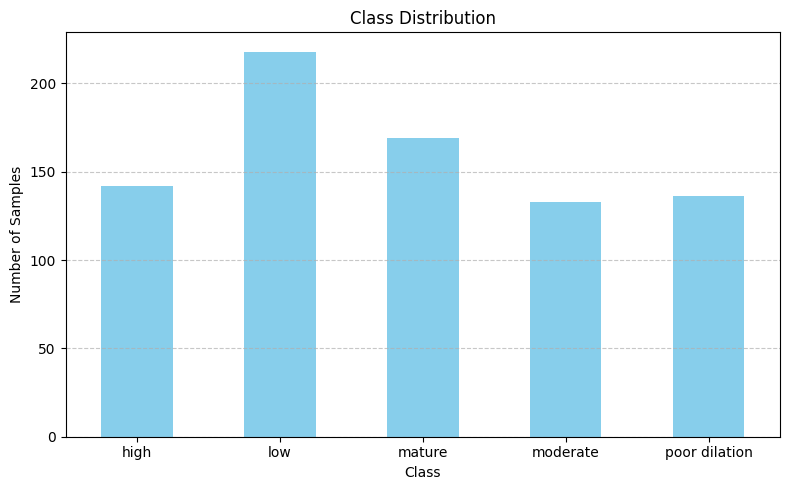

Downloading: "https://download.pytorch.org/models/densenet169-b2777c0a.pth" to /root/.cache/torch/hub/checkpoints/densenet169-b2777c0a.pth
100%|██████████| 54.7M/54.7M [00:00<00:00, 223MB/s]


Model is on device: cuda:0
Epoch: [1/100] | Step: [1/16] | Loss: 1.671946
Epoch: [1/100] | Step: [3/16] | Loss: 1.668556
Epoch: [1/100] | Step: [5/16] | Loss: 1.753568
Epoch: [1/100] | Step: [7/16] | Loss: 1.660052
Epoch: [1/100] | Step: [9/16] | Loss: 1.711452
Epoch: [1/100] | Step: [11/16] | Loss: 1.504094
Epoch: [1/100] | Step: [13/16] | Loss: 1.546039
Epoch: [1/100] | Step: [15/16] | Loss: 1.570708
Epoch: [1/100] | Loss: 1.413456
Valid Loss: 1.434531 | Acc: 0.3984
Epoch: [2/100] | Step: [1/16] | Loss: 1.642100
Epoch: [2/100] | Step: [3/16] | Loss: 1.410302
Epoch: [2/100] | Step: [5/16] | Loss: 1.378851
Epoch: [2/100] | Step: [7/16] | Loss: 1.370559
Epoch: [2/100] | Step: [9/16] | Loss: 1.346101
Epoch: [2/100] | Step: [11/16] | Loss: 1.321957
Epoch: [2/100] | Step: [13/16] | Loss: 1.297307
Epoch: [2/100] | Step: [15/16] | Loss: 1.336020
Epoch: [2/100] | Loss: 1.285978
Valid Loss: 1.275852 | Acc: 0.6016
Epoch: [3/100] | Step: [1/16] | Loss: 1.314336
Epoch: [3/100] | Step: [3/16] | Lo

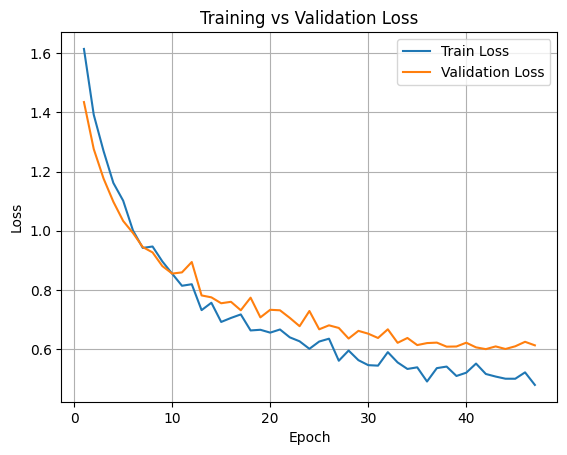

               precision    recall  f1-score   support

          low     0.8367    0.9318    0.8817        44
     moderate     0.8889    0.5926    0.7111        27
         high     0.6765    0.8214    0.7419        28
       mature     0.8378    0.9118    0.8732        34
poor dilation     1.0000    0.8148    0.8980        27

     accuracy                         0.8313       160
    macro avg     0.8480    0.8145    0.8212       160
 weighted avg     0.8453    0.8313    0.8294       160


Overall Accuracy: 0.8313
Macro F1-score  : 0.8212
Weighted F1-score: 0.8294


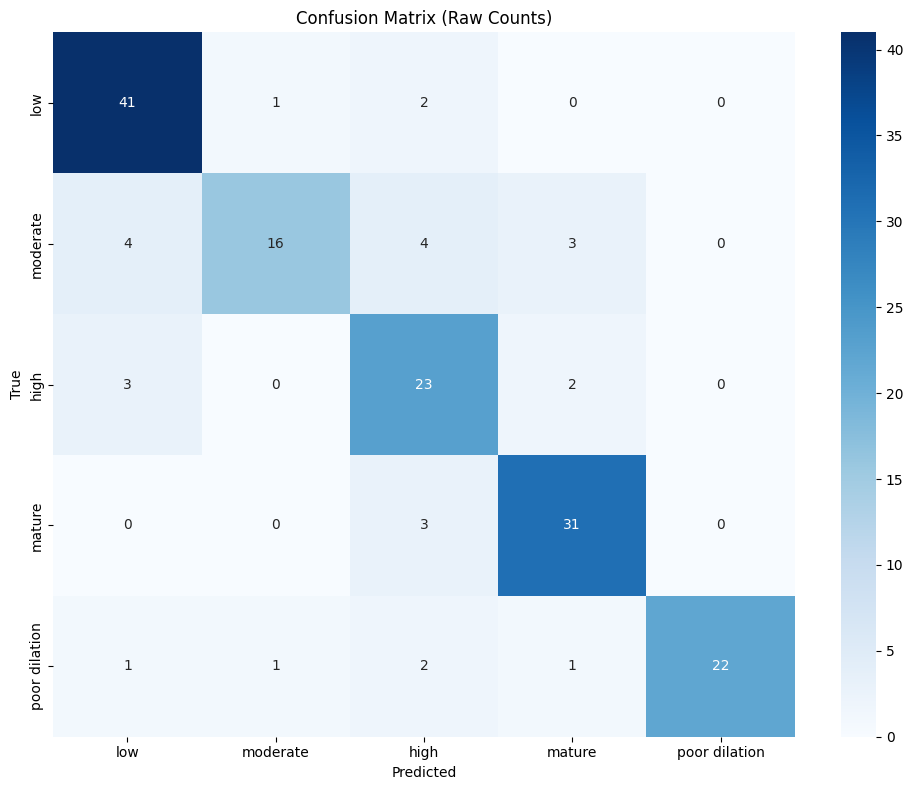

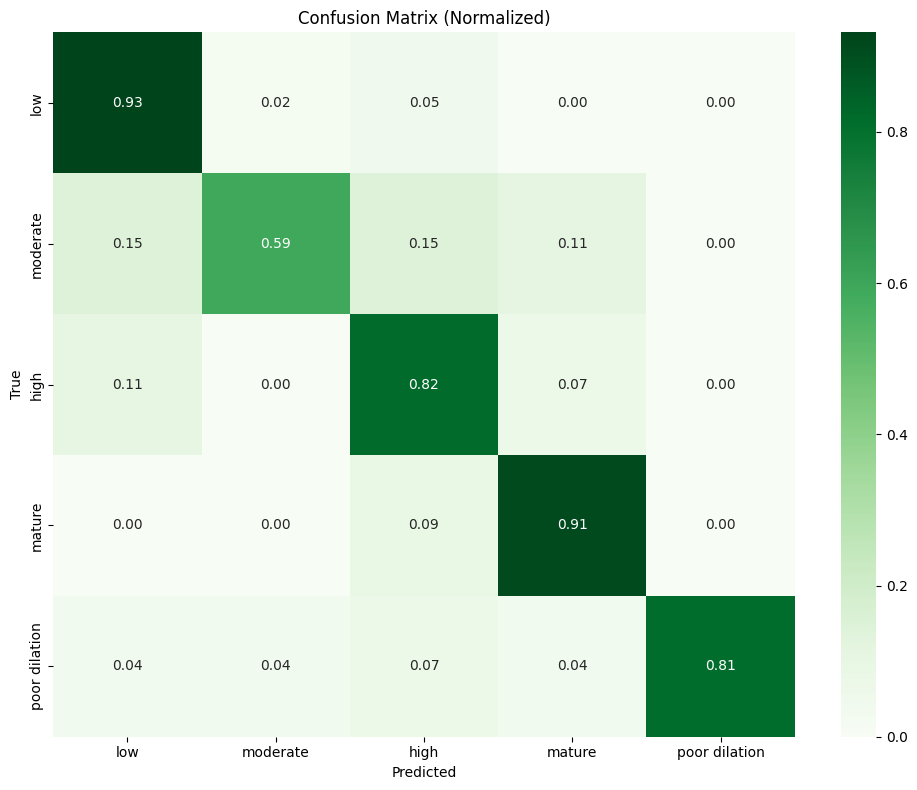

In [ ]:
CSV_PATH = "/content/dataset_V2.csv"
IMAGE_DIR = "/content/dataset_V2/dataset_V2"

train_loader, val_loader, test_loader, class_weights_tensor, df = get_dataloaders()


# Params
num_epochs = 100
lr = 1e-3
patience = 5
min_delta = 1e-4
best_val_loss = float('inf')
epochs_no_improve = 0

# Device configuration
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")



# Print dataset statistics
print(f"Total number of samples: {len(df)}")
print("\nClass distribution:")
print(df['label'].value_counts())

# Define the class labels (ordered)
classes = ["low", "moderate", "high", "mature", "poor dilation"]

# Create a subplot grid: 4 rows (classes) x 3 columns (images)
fig, axs = plt.subplots(len(classes), 3, figsize=(12, 10))
fig.suptitle("Sample Images per Class", fontsize=16)

# Loop over each class
for i, cls in enumerate(classes):
    class_samples = df[df["label"] == cls].head(3)
    for j, (_, row) in enumerate(class_samples.iterrows()):
        img_path = os.path.join(IMAGE_DIR, row["filename"] + ".jpg")
        try:
            image = Image.open(img_path)
            axs[i, j].imshow(image)
            axs[i, j].axis("off")
            axs[i, j].set_title(f"{cls.capitalize()}")
        except FileNotFoundError:
            axs[i, j].axis("off")
            axs[i, j].set_title("Image not found")

plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # adjust for suptitle
plt.show()

# Plot bar chart of class distribution
plt.figure(figsize=(8, 5))
df["label"].value_counts().sort_index().plot(kind='bar', color='skyblue')
plt.title("Class Distribution")
plt.xlabel("Class")
plt.ylabel("Number of Samples")
plt.xticks(rotation=0)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()




# Training
# model = resnet18(fine_tune=False).to(device)  # change to True if you want to fine-tune deeper layers
model = get_densenet169(fine_tune=False).to(device)
# Loss Function
# class_weights_tensor = class_weights_tensor.to(device)  # move to GPU
loss_fn = torch.nn.CrossEntropyLoss()
#weight=class_weights_tensor

# Optimizer
# optimizer = torch.optim.Adam(model.fc.parameters(), lr=lr)
optimizer = torch.optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=1e-3, weight_decay=1e-2)

# Scheduler
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3)


train_loss = []
valid_loss = []

print(f"Model is on device: {next(model.parameters()).device}")

# Train Loop
num_steps = len(train_loader)
for epochs in range(num_epochs):
    model.train()
    running_loss = 0.0
    for j, (imgs, lbls) in enumerate(train_loader):
        imgs, lbls = imgs.to(device), lbls.to(device)
        optimizer.zero_grad()
        out = model(imgs)
        loss = loss_fn(out, lbls)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
        if j % 2 == 0:
            print('Epoch: [{}/{}] | Step: [{}/{}] | Loss: {:.6f}'
                  .format(epochs+1, num_epochs, j+1, num_steps, loss.item()))
    train_loss.append(running_loss / num_steps)
    print('Epoch: [{}/{}] | Loss: {:.6f}'
          .format(epochs+1, num_epochs, loss.item()))

#---------------------
    model.eval()
    with torch.no_grad():
        correct = 0
        total = 0
        running_valid_loss = 0.0
        for imgs, lbls in val_loader:
            imgs, lbls = imgs.to(device), lbls.to(device)
            out = model(imgs)
            loss_val = loss_fn(out, lbls)
            running_valid_loss += loss_val.item()
            predicted = torch.argmax(out, dim=1)
            correct += (predicted == lbls).sum().item()
            total += lbls.size(0)
        avg_val_loss = running_valid_loss / len(val_loader)
        valid_loss.append(avg_val_loss)
        print('Valid Loss: {:.6f} | Acc: {:.4f}'.format(valid_loss[-1], correct / total))

        # Step the scheduler
        scheduler.step(avg_val_loss)


        # Early stopping
        if best_val_loss - avg_val_loss > min_delta:
            best_val_loss = avg_val_loss
            epochs_no_improve = 0
        else:
            epochs_no_improve += 1
            if epochs_no_improve >= patience:
                print("Early stopping triggered.")
                break

# Plot losses
plt.plot(range(1, len(train_loss)+1), train_loss, label='Train Loss')
plt.plot(range(1, len(valid_loss)+1), valid_loss, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training vs Validation Loss')
plt.legend()
plt.grid(True)
plt.show()




# # Predictions and true labels
# all_preds = []
# all_labels = []
#
# model.eval()
# with torch.no_grad():
#     for imgs, lbls in test_loader:
#         imgs = imgs.to(device)
#         outputs = model(imgs)
#         preds = torch.argmax(outputs, dim=1).cpu()
#         all_preds.extend(preds.numpy())
#         all_labels.extend(lbls.numpy())
#
# # Classification Report
# print(classification_report(all_labels, all_preds, target_names=classes))
#
# # Confusion Matrix
# cm = confusion_matrix(all_labels, all_preds)
# plt.figure(figsize=(10, 8))
# sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=classes, yticklabels=classes)
# plt.xlabel('Predicted')
# plt.ylabel('True')
# plt.title('Confusion Matrix')
# plt.show()
#


# Evaluation
all_preds = []
all_labels = []

model.eval()
with torch.no_grad():
    for imgs, lbls in test_loader:
        imgs, lbls = imgs.to(device), lbls.to(device)
        outputs = model(imgs)
        preds = torch.argmax(outputs, dim=1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(lbls.cpu().numpy())

# Convert to numpy arrays
all_preds = np.array(all_preds)
all_labels = np.array(all_labels)

# Print classification report
report = classification_report(all_labels, all_preds, target_names=classes, digits=4)
print(report)

# Save report as a dataframe (optional)
report_df = pd.DataFrame(classification_report(all_labels, all_preds, target_names=classes, output_dict=True)).T
report_df.to_csv("classification_report.csv")

# Accuracy and F1 scores
print(f"\nOverall Accuracy: {accuracy_score(all_labels, all_preds):.4f}")
print(f"Macro F1-score  : {f1_score(all_labels, all_preds, average='macro'):.4f}")
print(f"Weighted F1-score: {f1_score(all_labels, all_preds, average='weighted'):.4f}")

# Confusion Matrix
cm = confusion_matrix(all_labels, all_preds)
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

# Plot raw confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=classes, yticklabels=classes)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix (Raw Counts)')
plt.tight_layout()
plt.show()

# Plot normalized confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm_normalized, annot=True, fmt='.2f', cmap='Greens', xticklabels=classes, yticklabels=classes)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix (Normalized)')
plt.tight_layout()
plt.show()


torch.save(model.state_dict(), 'densenet169.pth')

In [ ]:
import os
import time
import psutil
import pandas as pd
import numpy as np
from tqdm import tqdm
from PIL import Image
import torch
import torch.nn as nn
from torchvision import models, transforms
from sklearn.metrics import classification_report
from collections import Counter

# ====== CUSTOM PAD TO SQUARE TRANSFORM ======
from torchvision.transforms import functional as TF

class PadToSquareWithMean:
    def __call__(self, image):
        w, h = image.size
        max_dim = max(w, h)
        pad_left = (max_dim - w) // 2
        pad_top = (max_dim - h) // 2
        pad_right = max_dim - w - pad_left
        pad_bottom = max_dim - h - pad_top

        # Compute mean color of the image (as RGB tuple)
        mean_color = image.resize((1, 1)).getpixel((0, 0))

        # Apply padding using the mean color
        return TF.pad(image, (pad_left, pad_top, pad_right, pad_bottom),
                      fill=mean_color, padding_mode='constant')

# ====== CONFIG ======
model_path = "/content/densenet169.pth"
image_dir = "/content/Test_Data/Test_Data"
label_csv_path = "/content/Test_Data.csv"
num_classes = 5
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Device used for inference: {device}")
class_names = ['low', 'moderate', 'high', 'mature', 'poor dilation']

# ====== TRANSFORMS ======
val_test_transform = transforms.Compose([
    PadToSquareWithMean(),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])])

# ====== LOAD MODEL ======
print("\nLoading model...")
start_model_load = time.time()
model = models.densenet169()
model.classifier = nn.Linear(model.classifier.in_features, num_classes)
model.load_state_dict(torch.load(model_path, map_location=device))
model.to(device)
model.eval()
end_model_load = time.time()
model_load_time = end_model_load - start_model_load
model_file_size = os.path.getsize(model_path) / (1024**2)  # MB

# ====== LOAD LABELS ======
df = pd.read_csv(label_csv_path)
df['filename'] = df['filename'].astype(str)
df['label'] = df['label'].str.strip().str.lower()

# ====== INFERENCE SETUP ======
y_true = []
y_pred = []
total_time = 0
total_images = 0

# Reset peak GPU memory stats
if device.type == "cuda":
    torch.cuda.reset_peak_memory_stats(device)

# Start monitoring CPU, RAM
process = psutil.Process(os.getpid())
cpu_before = psutil.cpu_percent(interval=1)
ram_before = process.memory_info().rss / (1024 ** 2)

# ====== RUN INFERENCE ======
for _, row in tqdm(df.iterrows(), total=len(df), desc="Running Inference"):
    filename, true_label = row['filename'], row['label']
    img_path = os.path.join(image_dir, filename + ".jpg")

    if not os.path.exists(img_path):
        print(f"Skipping missing file: {img_path}")
        continue

    img = Image.open(img_path).convert('RGB')
    input_tensor = val_test_transform(img).unsqueeze(0).to(device)

    start = time.time()
    with torch.no_grad():
        output = model(input_tensor)
        prob = torch.softmax(output, dim=1)
        pred_idx = torch.argmax(prob, dim=1).item()
    end = time.time()

    total_time += (end - start)
    total_images += 1
    y_true.append(true_label)
    y_pred.append(class_names[pred_idx])

# ====== RESOURCE USAGE ======
cpu_after = psutil.cpu_percent(interval=1)
ram_after = process.memory_info().rss / (1024 ** 2)
gpu_memory = 0
if device.type == "cuda":
    gpu_memory = torch.cuda.max_memory_allocated(device) / (1024 ** 2)

# ====== REPORT ======
print("\n====== Inference Results ======")
if total_images == 0:
    print("⚠️ No images were successfully processed.")
else:
    print(f"🕒 Average latency: {(total_time / total_images) * 1000:.2f} ms/image")
    print(f"⚡ Total inference time: {total_time:.2f} sec for {total_images} images")
print(f"🧊 Model load time: {model_load_time:.2f} sec")
print(f"📁 Model file size: {model_file_size:.2f} MB")
print(f"📈 CPU usage change: {cpu_after - cpu_before:.2f}%")
print(f"📦 RAM used change: {ram_after - ram_before:.2f} MB")
if device.type == "cuda":
    print(f"🧠 Peak GPU memory used: {gpu_memory:.2f} MB")

print("\n====== Classification Report ======")
if total_images > 0:
    print(classification_report(y_true, y_pred, target_names=class_names, zero_division=0))
    print("\nPrediction distribution:", Counter(y_pred))
    print("True label distribution:", Counter(y_true))


Device used for inference: cuda

Loading model...


Running Inference: 100%|██████████| 40/40 [00:02<00:00, 19.67it/s]



====== Inference Results ======
🕒 Average latency: 36.82 ms/image
⚡ Total inference time: 1.47 sec for 40 images
🧊 Model load time: 0.67 sec
📁 Model file size: 48.62 MB
📈 CPU usage change: -7.60%
📦 RAM used change: 206.36 MB
🧠 Peak GPU memory used: 70.31 MB

====== Classification Report ======
               precision    recall  f1-score   support

          low       0.75      0.86      0.80         7
     moderate       0.70      1.00      0.82         7
         high       0.67      1.00      0.80         6
       mature       1.00      0.62      0.76        13
poor dilation       1.00      0.71      0.83         7

     accuracy                           0.80        40
    macro avg       0.82      0.84      0.80        40
 weighted avg       0.85      0.80      0.80        40


Prediction distribution: Counter({'low': 10, 'mature': 9, 'high': 8, 'moderate': 8, 'poor dilation': 5})
True label distribution: Counter({'moderate': 13, 'low': 7, 'high': 7, 'poor dilation': 7, 'mature':

In [ ]:
# ========== Config ==========
CSV_PATH = "dataset_V2.csv"
IMAGE_DIR = "/content/dataset_V2/dataset_V2"
BATCH_SIZE = 32

# ========== Dataset ==========
class CataractDataset(Dataset):
    def __init__(self, dataframe, image_dir, transform=None):
        self.data = dataframe.reset_index(drop=True)
        self.image_dir = image_dir
        self.transform = transform
        self.label_map = {"low": 0, "moderate": 1, "high": 2, "mature": 3, "poor dilation": 4}

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        row = self.data.iloc[idx]
        img_path = os.path.join(self.image_dir, row["filename"] + ".jpg")
        try:
            image = Image.open(img_path).convert("RGB")
        except FileNotFoundError:
            print(f"Missing image: {img_path}")
            return self.__getitem__((idx + 1) % len(self.data))

        label = self.label_map[row["label"].lower()]
        if self.transform:
            image = self.transform(image)
        return image, torch.tensor(label)

# ========== Load and Prepare CSV ==========
df = pd.read_csv(CSV_PATH)
df.columns = df.columns.str.strip()
df.rename(columns={"Frame Name": "filename"}, inplace=True)

# Derive label column from binary indicators
df["label"] = None
df.loc[df["Low Nuclear Density"] == 1.0, "label"] = "low"
df.loc[df["Moderate Nuclear Density"] == 1.0, "label"] = "moderate"
df.loc[df["High Nuclear Density"] == 1.0, "label"] = "high"
df.loc[df["Mature"] == 1.0, "label"] = "mature"
df.loc[df["Poor Dilation"] == 1.0, "label"] = "poor dilation"


# Keep only valid rows
df = df[df["label"].notna()]
df = df[["filename", "label"]]

# ========== Train / Val / Test Split ==========
train_val_df, test_df = train_test_split(df, test_size=0.2, stratify=df["label"], random_state=42)
train_df, val_df = train_test_split(train_val_df, test_size=0.2, stratify=train_val_df["label"], random_state=42)

# Map labels to integer indices
label_map = {"low": 0, "moderate": 1, "high": 2, "mature": 3, "poor dilation": 4}
train_df["class_idx"] = train_df["label"].map(label_map)

# Compute class weights
class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(train_df["class_idx"]),
    y=train_df["class_idx"]
)
class_weights_tensor = torch.tensor(class_weights, dtype=torch.float)

# ========== Transforms ==========
transform = transforms.Compose([
    PadToSquareWithMean(),  # <-- add this at the top
    transforms.Resize((224, 224)),  # match model input size
    transforms.RandomRotation(degrees=15),
    transforms.RandomAffine(degrees=10, translate=(0.05, 0.05), scale=(0.95, 1.05)),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
    transforms.RandomErasing(p=0.3)
])
val_test_transform = transforms.Compose([
    PadToSquareWithMean(),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])


# ========== Datasets and Dataloaders ==========
train_dataset = CataractDataset(train_df, IMAGE_DIR, transform)
# val_dataset = CataractDataset(val_df, IMAGE_DIR, transform)
# test_dataset = CataractDataset(test_df, IMAGE_DIR, transform)
val_dataset = CataractDataset(val_df, IMAGE_DIR, val_test_transform)
test_dataset = CataractDataset(test_df, IMAGE_DIR, val_test_transform)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False)

# ========== Return Utility ==========
def get_dataloaders():
    return train_loader, val_loader, test_loader, class_weights_tensor, df


In [ ]:
# vgg16.py

from torchvision.models import vgg16, VGG16_Weights
import torch.nn as nn

def get_vgg16(num_classes: int = 5,
              fine_tune: bool = False,
              pretrained: bool = True) -> nn.Module:
    """
    Returns a VGG-16 pretrained on ImageNet, adapted for `num_classes` outputs.

    Args:
        num_classes: number of classes (5 for your dataset)
        fine_tune:   if False, freeze all backbone layers
        pretrained:  if True, load ImageNet weights
    """
    weights = VGG16_Weights.DEFAULT if pretrained else None
    model = vgg16(weights=weights)

    if not fine_tune:
        for param in model.features.parameters():
            param.requires_grad = False

    # Replace final classifier layer (idx 6 in the Sequential)
    in_features = model.classifier[6].in_features
    model.classifier[6] = nn.Linear(in_features, num_classes)
    return model


Using device: cuda
Total number of samples: 798

Class distribution:
label
low              218
mature           169
high             142
poor dilation    136
moderate         133
Name: count, dtype: int64


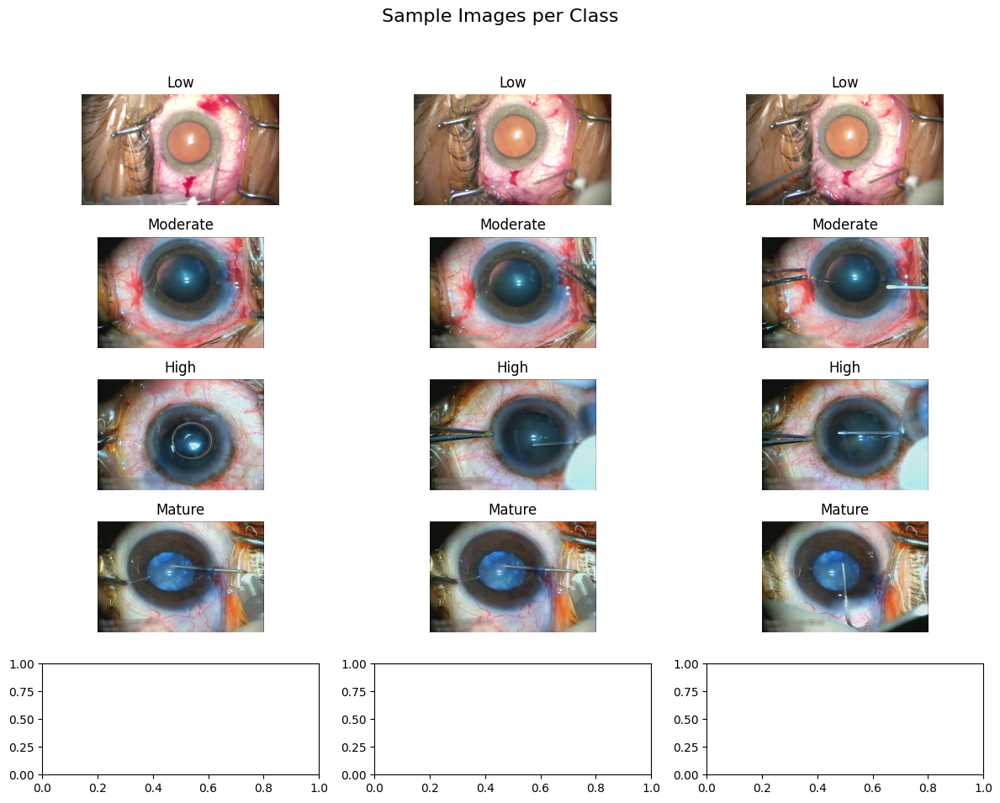

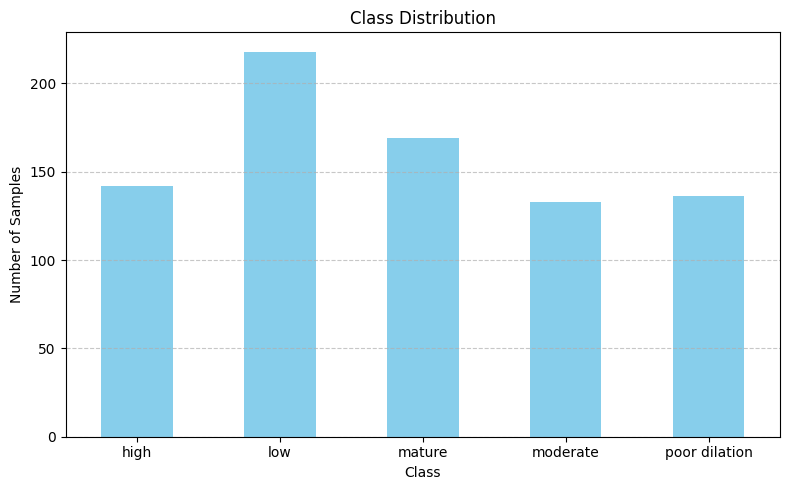

Model is on device: cuda:0
Epoch: [1/30] | Step: [1/16] | Loss: 1.777078
Epoch: [1/30] | Step: [3/16] | Loss: 1.684874
Epoch: [1/30] | Step: [5/16] | Loss: 2.116542
Epoch: [1/30] | Step: [7/16] | Loss: 1.718890
Epoch: [1/30] | Step: [9/16] | Loss: 1.815735
Epoch: [1/30] | Step: [11/16] | Loss: 1.943007
Epoch: [1/30] | Step: [13/16] | Loss: 2.208709
Epoch: [1/30] | Step: [15/16] | Loss: 1.685848
Epoch: [1/30] | Loss: 1.591639
Valid Loss: 1.110138 | Acc: 0.6172
Epoch: [2/30] | Step: [1/16] | Loss: 1.862555
Epoch: [2/30] | Step: [3/16] | Loss: 1.635077
Epoch: [2/30] | Step: [5/16] | Loss: 1.578557
Epoch: [2/30] | Step: [7/16] | Loss: 1.805325
Epoch: [2/30] | Step: [9/16] | Loss: 2.183353
Epoch: [2/30] | Step: [11/16] | Loss: 1.664123
Epoch: [2/30] | Step: [13/16] | Loss: 1.781380
Epoch: [2/30] | Step: [15/16] | Loss: 1.135827
Epoch: [2/30] | Loss: 1.662368
Valid Loss: 1.004360 | Acc: 0.6094
Epoch: [3/30] | Step: [1/16] | Loss: 1.388711
Epoch: [3/30] | Step: [3/16] | Loss: 1.080588
Epoch: 

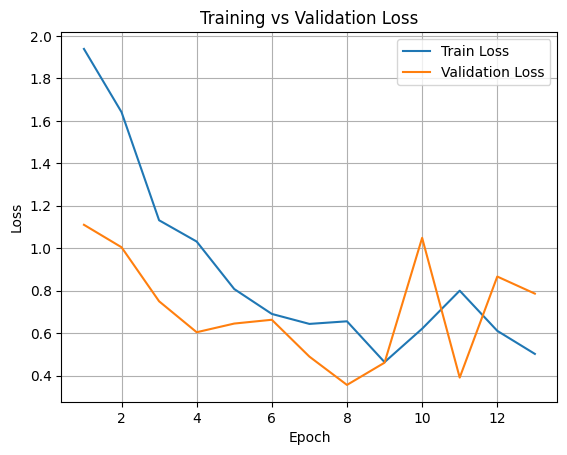

               precision    recall  f1-score   support

          low     0.8367    0.9318    0.8817        44
     moderate     0.8947    0.6296    0.7391        27
         high     0.5102    0.8929    0.6494        28
       mature     1.0000    0.5294    0.6923        34
poor Dilation     1.0000    0.9259    0.9615        27

     accuracy                         0.7875       160
    macro avg     0.8483    0.7819    0.7848       160
 weighted avg     0.8516    0.7875    0.7902       160


Overall Accuracy: 0.7875
Macro F1-score  : 0.7848
Weighted F1-score: 0.7902


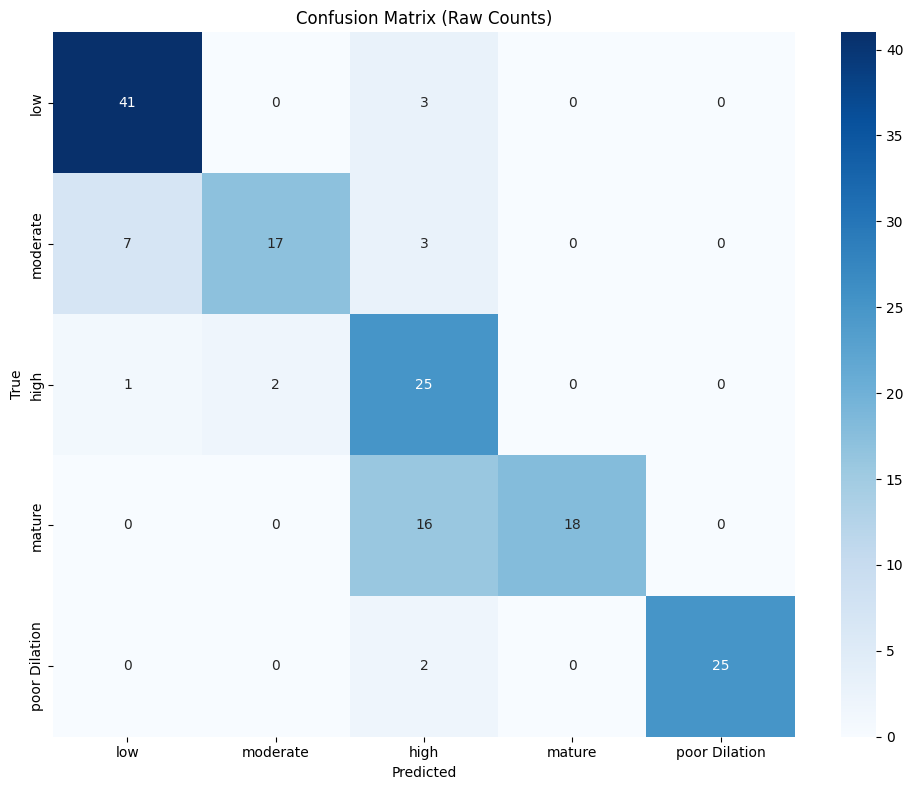

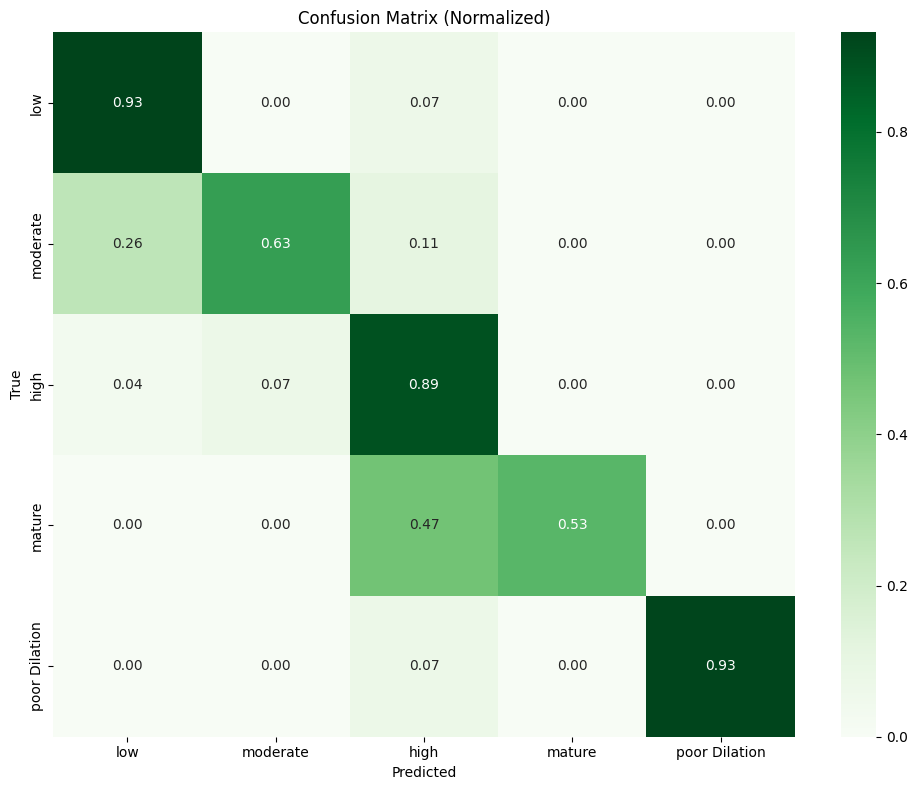

In [ ]:
CSV_PATH = "/content/dataset_V2.csv"
IMAGE_DIR = "/content/dataset_V2/dataset_V2"

train_loader, val_loader, test_loader, class_weights_tensor, df = get_dataloaders()


# Params
num_epochs = 30
lr = 1e-3
patience = 5
min_delta = 1e-4
best_val_loss = float('inf')
epochs_no_improve = 0

# Device configuration
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")



# Print dataset statistics
print(f"Total number of samples: {len(df)}")
print("\nClass distribution:")
print(df['label'].value_counts())

# Define the class labels (ordered)
classes = ["low", "moderate", "high", "mature", "poor Dilation"]

# Create a subplot grid: 4 rows (classes) x 3 columns (images)
fig, axs = plt.subplots(len(classes), 3, figsize=(12, 10))
fig.suptitle("Sample Images per Class", fontsize=16)

# Loop over each class
for i, cls in enumerate(classes):
    class_samples = df[df["label"] == cls].head(3)
    for j, (_, row) in enumerate(class_samples.iterrows()):
        img_path = os.path.join(IMAGE_DIR, row["filename"] + ".jpg")
        try:
            image = Image.open(img_path)
            axs[i, j].imshow(image)
            axs[i, j].axis("off")
            axs[i, j].set_title(f"{cls.capitalize()}")
        except FileNotFoundError:
            axs[i, j].axis("off")
            axs[i, j].set_title("Image not found")

plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # adjust for suptitle
plt.show()

# Plot bar chart of class distribution
plt.figure(figsize=(8, 5))
df["label"].value_counts().sort_index().plot(kind='bar', color='skyblue')
plt.title("Class Distribution")
plt.xlabel("Class")
plt.ylabel("Number of Samples")
plt.xticks(rotation=0)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()




# Training
# model = resnet18(fine_tune=False).to(device)  # change to True if you want to fine-tune deeper layers
model = get_vgg16(fine_tune=False).to(device)
# Loss Function
# class_weights_tensor = class_weights_tensor.to(device)  # move to GPU
loss_fn = torch.nn.CrossEntropyLoss()
#weight=class_weights_tensor

# Optimizer
# optimizer = torch.optim.Adam(model.fc.parameters(), lr=lr)
optimizer = torch.optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=1e-3, weight_decay=1e-2)

# Scheduler
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3)


train_loss = []
valid_loss = []

print(f"Model is on device: {next(model.parameters()).device}")

# Train Loop
num_steps = len(train_loader)
for epochs in range(num_epochs):
    model.train()
    running_loss = 0.0
    for j, (imgs, lbls) in enumerate(train_loader):
        imgs, lbls = imgs.to(device), lbls.to(device)
        optimizer.zero_grad()
        out = model(imgs)
        loss = loss_fn(out, lbls)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
        if j % 2 == 0:
            print('Epoch: [{}/{}] | Step: [{}/{}] | Loss: {:.6f}'
                  .format(epochs+1, num_epochs, j+1, num_steps, loss.item()))
    train_loss.append(running_loss / num_steps)
    print('Epoch: [{}/{}] | Loss: {:.6f}'
          .format(epochs+1, num_epochs, loss.item()))

#---------------------
    model.eval()
    with torch.no_grad():
        correct = 0
        total = 0
        running_valid_loss = 0.0
        for imgs, lbls in val_loader:
            imgs, lbls = imgs.to(device), lbls.to(device)
            out = model(imgs)
            loss_val = loss_fn(out, lbls)
            running_valid_loss += loss_val.item()
            predicted = torch.argmax(out, dim=1)
            correct += (predicted == lbls).sum().item()
            total += lbls.size(0)
        avg_val_loss = running_valid_loss / len(val_loader)
        valid_loss.append(avg_val_loss)
        print('Valid Loss: {:.6f} | Acc: {:.4f}'.format(valid_loss[-1], correct / total))

        # Step the scheduler
        scheduler.step(avg_val_loss)


        # Early stopping
        if best_val_loss - avg_val_loss > min_delta:
            best_val_loss = avg_val_loss
            epochs_no_improve = 0
        else:
            epochs_no_improve += 1
            if epochs_no_improve >= patience:
                print("Early stopping triggered.")
                break

# Plot losses
plt.plot(range(1, len(train_loss)+1), train_loss, label='Train Loss')
plt.plot(range(1, len(valid_loss)+1), valid_loss, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training vs Validation Loss')
plt.legend()
plt.grid(True)
plt.show()




# # Predictions and true labels
# all_preds = []
# all_labels = []
#
# model.eval()
# with torch.no_grad():
#     for imgs, lbls in test_loader:
#         imgs = imgs.to(device)
#         outputs = model(imgs)
#         preds = torch.argmax(outputs, dim=1).cpu()
#         all_preds.extend(preds.numpy())
#         all_labels.extend(lbls.numpy())
#
# # Classification Report
# print(classification_report(all_labels, all_preds, target_names=classes))
#
# # Confusion Matrix
# cm = confusion_matrix(all_labels, all_preds)
# plt.figure(figsize=(10, 8))
# sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=classes, yticklabels=classes)
# plt.xlabel('Predicted')
# plt.ylabel('True')
# plt.title('Confusion Matrix')
# plt.show()
#


# Evaluation
all_preds = []
all_labels = []

model.eval()
with torch.no_grad():
    for imgs, lbls in test_loader:
        imgs, lbls = imgs.to(device), lbls.to(device)
        outputs = model(imgs)
        preds = torch.argmax(outputs, dim=1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(lbls.cpu().numpy())

# Convert to numpy arrays
all_preds = np.array(all_preds)
all_labels = np.array(all_labels)

# Print classification report
report = classification_report(all_labels, all_preds, target_names=classes, digits=4)
print(report)

# Save report as a dataframe (optional)
report_df = pd.DataFrame(classification_report(all_labels, all_preds, target_names=classes, output_dict=True)).T
report_df.to_csv("classification_report.csv")

# Accuracy and F1 scores
print(f"\nOverall Accuracy: {accuracy_score(all_labels, all_preds):.4f}")
print(f"Macro F1-score  : {f1_score(all_labels, all_preds, average='macro'):.4f}")
print(f"Weighted F1-score: {f1_score(all_labels, all_preds, average='weighted'):.4f}")

# Confusion Matrix
cm = confusion_matrix(all_labels, all_preds)
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

# Plot raw confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=classes, yticklabels=classes)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix (Raw Counts)')
plt.tight_layout()
plt.show()

# Plot normalized confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm_normalized, annot=True, fmt='.2f', cmap='Greens', xticklabels=classes, yticklabels=classes)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix (Normalized)')
plt.tight_layout()
plt.show()


torch.save(model.state_dict(), 'vgg16.pth')

In [ ]:
import os
import time
import psutil
import pandas as pd
import numpy as np
from tqdm import tqdm
from PIL import Image
import torch
import torch.nn as nn
from torchvision import models, transforms
from sklearn.metrics import classification_report
from collections import Counter

# ====== CUSTOM PAD TO SQUARE TRANSFORM ======
from torchvision.transforms import functional as TF

class PadToSquareWithMean:
    def __call__(self, image):
        w, h = image.size
        max_dim = max(w, h)
        pad_left = (max_dim - w) // 2
        pad_top = (max_dim - h) // 2
        pad_right = max_dim - w - pad_left
        pad_bottom = max_dim - h - pad_top

        # Compute mean color of the image (as RGB tuple)
        mean_color = image.resize((1, 1)).getpixel((0, 0))

        # Apply padding using the mean color
        return TF.pad(image, (pad_left, pad_top, pad_right, pad_bottom),
                      fill=mean_color, padding_mode='constant')

# ====== CONFIG ======
model_path = "/content/vgg16.pth"
image_dir = "/content/Test_Data/Test_Data"
label_csv_path = "/content/Test_Data.csv"
num_classes = 5
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Device used for inference: {device}")
class_names = ['low', 'moderate', 'high', 'mature', 'poor dilation']

# ====== TRANSFORMS ======
val_test_transform = transforms.Compose([
    PadToSquareWithMean(),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])])

# ====== LOAD MODEL ======
print("\nLoading model...")
start_model_load = time.time()
model = models.vgg16(weights=None)  # Don't load pretrained ImageNet weights since you're using a fine-tuned model
model.classifier[6] = nn.Linear(model.classifier[6].in_features, num_classes)
model.load_state_dict(torch.load(model_path, map_location=device))
model.to(device)
model.eval()
end_model_load = time.time()
model_load_time = end_model_load - start_model_load
model_file_size = os.path.getsize(model_path) / (1024**2)  # MB

# ====== LOAD LABELS ======
df = pd.read_csv(label_csv_path)
df['filename'] = df['filename'].astype(str)
df['label'] = df['label'].str.strip().str.lower()

# ====== INFERENCE SETUP ======
y_true = []
y_pred = []
total_time = 0
total_images = 0

# Reset peak GPU memory stats
if device.type == "cuda":
    torch.cuda.reset_peak_memory_stats(device)

# Start monitoring CPU, RAM
process = psutil.Process(os.getpid())
cpu_before = psutil.cpu_percent(interval=1)
ram_before = process.memory_info().rss / (1024 ** 2)

# ====== RUN INFERENCE ======
for _, row in tqdm(df.iterrows(), total=len(df), desc="Running Inference"):
    filename, true_label = row['filename'], row['label']
    img_path = os.path.join(image_dir, filename + ".jpg")

    if not os.path.exists(img_path):
        print(f"Skipping missing file: {img_path}")
        continue

    img = Image.open(img_path).convert('RGB')
    input_tensor = val_test_transform(img).unsqueeze(0).to(device)

    start = time.time()
    with torch.no_grad():
        output = model(input_tensor)
        prob = torch.softmax(output, dim=1)
        pred_idx = torch.argmax(prob, dim=1).item()
    end = time.time()

    total_time += (end - start)
    total_images += 1
    y_true.append(true_label)
    y_pred.append(class_names[pred_idx])

# ====== RESOURCE USAGE ======
cpu_after = psutil.cpu_percent(interval=1)
ram_after = process.memory_info().rss / (1024 ** 2)
gpu_memory = 0
if device.type == "cuda":
    gpu_memory = torch.cuda.max_memory_allocated(device) / (1024 ** 2)

# ====== REPORT ======
print("\n====== Inference Results ======")
if total_images == 0:
    print("⚠️ No images were successfully processed.")
else:
    print(f"🕒 Average latency: {(total_time / total_images) * 1000:.2f} ms/image")
    print(f"⚡ Total inference time: {total_time:.2f} sec for {total_images} images")
print(f"🧊 Model load time: {model_load_time:.2f} sec")
print(f"📁 Model file size: {model_file_size:.2f} MB")
print(f"📈 CPU usage change: {cpu_after - cpu_before:.2f}%")
print(f"📦 RAM used change: {ram_after - ram_before:.2f} MB")
if device.type == "cuda":
    print(f"🧠 Peak GPU memory used: {gpu_memory:.2f} MB")

print("\n====== Classification Report ======")
if total_images > 0:
    print(classification_report(y_true, y_pred, target_names=class_names, zero_division=0))
    print("\nPrediction distribution:", Counter(y_pred))
    print("True label distribution:", Counter(y_true))


Device used for inference: cuda

Loading model...


Running Inference: 100%|██████████| 40/40 [00:01<00:00, 38.67it/s]



====== Inference Results ======
🕒 Average latency: 11.77 ms/image
⚡ Total inference time: 0.47 sec for 40 images
🧊 Model load time: 2.80 sec
📁 Model file size: 512.25 MB
📈 CPU usage change: 15.90%
📦 RAM used change: 314.94 MB
🧠 Peak GPU memory used: 559.28 MB

====== Classification Report ======
               precision    recall  f1-score   support

          low       0.54      1.00      0.70         7
     moderate       0.78      1.00      0.88         7
         high       1.00      0.33      0.50         6
       mature       1.00      0.69      0.82        13
poor dilation       1.00      1.00      1.00         7

     accuracy                           0.80        40
    macro avg       0.86      0.81      0.78        40
 weighted avg       0.88      0.80      0.79        40


Prediction distribution: Counter({'high': 13, 'low': 9, 'moderate': 9, 'poor dilation': 7, 'mature': 2})
True label distribution: Counter({'moderate': 13, 'low': 7, 'high': 7, 'poor dilation': 7, 'mature

In [ ]:
# ========== Config ==========
CSV_PATH = "dataset_V2.csv"
IMAGE_DIR = "/content/dataset_V2/dataset_V2"
BATCH_SIZE = 32

# ========== Dataset ==========
class CataractDataset(Dataset):
    def __init__(self, dataframe, image_dir, transform=None):
        self.data = dataframe.reset_index(drop=True)
        self.image_dir = image_dir
        self.transform = transform
        self.label_map = {"low": 0, "moderate": 1, "high": 2, "mature": 3, "poor dilation": 4}

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        row = self.data.iloc[idx]
        img_path = os.path.join(self.image_dir, row["filename"] + ".jpg")
        try:
            image = Image.open(img_path).convert("RGB")
        except FileNotFoundError:
            print(f"Missing image: {img_path}")
            return self.__getitem__((idx + 1) % len(self.data))

        label = self.label_map[row["label"].lower()]
        if self.transform:
            image = self.transform(image)
        return image, torch.tensor(label)

# ========== Load and Prepare CSV ==========
df = pd.read_csv(CSV_PATH)
df.columns = df.columns.str.strip()
df.rename(columns={"Frame Name": "filename"}, inplace=True)

# Derive label column from binary indicators
df["label"] = None
df.loc[df["Low Nuclear Density"] == 1.0, "label"] = "low"
df.loc[df["Moderate Nuclear Density"] == 1.0, "label"] = "moderate"
df.loc[df["High Nuclear Density"] == 1.0, "label"] = "high"
df.loc[df["Mature"] == 1.0, "label"] = "mature"
df.loc[df["Poor Dilation"] == 1.0, "label"] = "poor dilation"


# Keep only valid rows
df = df[df["label"].notna()]
df = df[["filename", "label"]]

# ========== Train / Val / Test Split ==========
train_val_df, test_df = train_test_split(df, test_size=0.2, stratify=df["label"], random_state=42)
train_df, val_df = train_test_split(train_val_df, test_size=0.2, stratify=train_val_df["label"], random_state=42)

# Map labels to integer indices
label_map = {"low": 0, "moderate": 1, "high": 2, "mature": 3, "poor dilation": 4}
train_df["class_idx"] = train_df["label"].map(label_map)

# Compute class weights
class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(train_df["class_idx"]),
    y=train_df["class_idx"]
)
class_weights_tensor = torch.tensor(class_weights, dtype=torch.float)

# ========== Transforms ==========
transform = transforms.Compose([
    PadToSquareWithMean(),  # <-- add this at the top
    transforms.Resize((224, 224)),  # match model input size
    transforms.RandomRotation(degrees=15),
    transforms.RandomAffine(degrees=10, translate=(0.05, 0.05), scale=(0.95, 1.05)),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
    transforms.RandomErasing(p=0.3)
])
val_test_transform = transforms.Compose([
    PadToSquareWithMean(),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])


# ========== Datasets and Dataloaders ==========
train_dataset = CataractDataset(train_df, IMAGE_DIR, transform)
# val_dataset = CataractDataset(val_df, IMAGE_DIR, transform)
# test_dataset = CataractDataset(test_df, IMAGE_DIR, transform)
val_dataset = CataractDataset(val_df, IMAGE_DIR, val_test_transform)
test_dataset = CataractDataset(test_df, IMAGE_DIR, val_test_transform)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False)

# ========== Return Utility ==========
def get_dataloaders():
    return train_loader, val_loader, test_loader, class_weights_tensor, df


In [ ]:
# vgg19.py

from torchvision.models import vgg19, VGG19_Weights
import torch.nn as nn

def get_vgg19(num_classes: int = 5,
              fine_tune: bool = False,
              pretrained: bool = True) -> nn.Module:
    """
    Returns a VGG-19 pretrained on ImageNet, adapted for `num_classes` outputs.

    Args:
        num_classes: number of classes (5 for your dataset)
        fine_tune:   if False, freeze all backbone layers
        pretrained:  if True, load ImageNet weights
    """
    weights = VGG19_Weights.DEFAULT if pretrained else None
    model = vgg19(weights=weights)

    if not fine_tune:
        for param in model.features.parameters():
            param.requires_grad = False

    in_features = model.classifier[6].in_features
    model.classifier[6] = nn.Linear(in_features, num_classes)
    return model


Using device: cuda
Total number of samples: 798

Class distribution:
label
low              218
mature           169
high             142
poor dilation    136
moderate         133
Name: count, dtype: int64


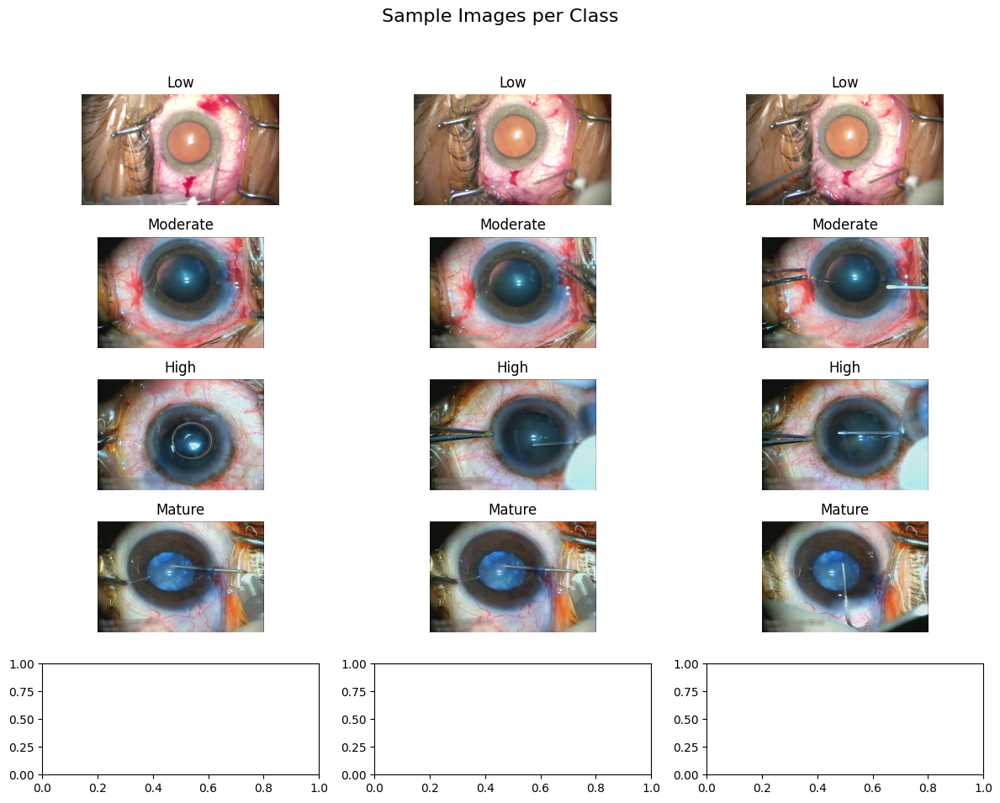

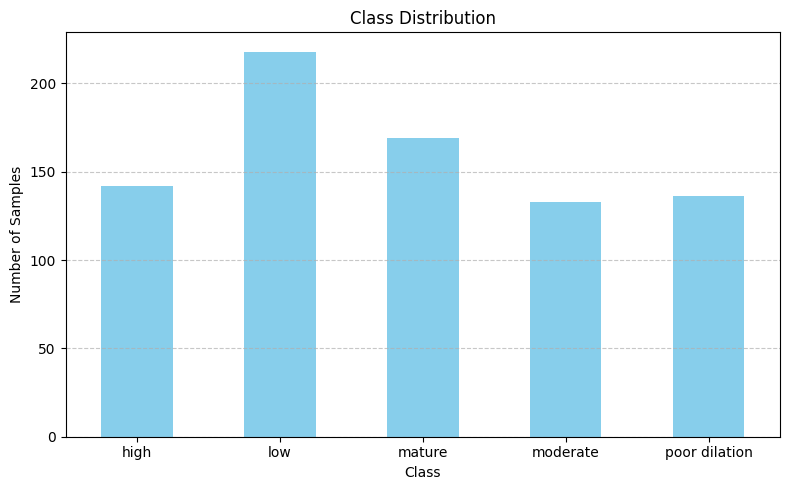

Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth
100%|██████████| 548M/548M [00:02<00:00, 230MB/s]


Model is on device: cuda:0
Epoch: [1/30] | Step: [1/16] | Loss: 1.876294
Epoch: [1/30] | Step: [3/16] | Loss: 2.183143
Epoch: [1/30] | Step: [5/16] | Loss: 1.627932
Epoch: [1/30] | Step: [7/16] | Loss: 1.936201
Epoch: [1/30] | Step: [9/16] | Loss: 1.993569
Epoch: [1/30] | Step: [11/16] | Loss: 1.879732
Epoch: [1/30] | Step: [13/16] | Loss: 2.372151
Epoch: [1/30] | Step: [15/16] | Loss: 2.241676
Epoch: [1/30] | Loss: 2.650669
Valid Loss: 1.887398 | Acc: 0.4141
Epoch: [2/30] | Step: [1/16] | Loss: 2.787419
Epoch: [2/30] | Step: [3/16] | Loss: 1.740600
Epoch: [2/30] | Step: [5/16] | Loss: 1.432814
Epoch: [2/30] | Step: [7/16] | Loss: 1.705318
Epoch: [2/30] | Step: [9/16] | Loss: 1.235999
Epoch: [2/30] | Step: [11/16] | Loss: 1.636311
Epoch: [2/30] | Step: [13/16] | Loss: 1.475948
Epoch: [2/30] | Step: [15/16] | Loss: 1.104457
Epoch: [2/30] | Loss: 1.314925
Valid Loss: 1.186348 | Acc: 0.4375
Epoch: [3/30] | Step: [1/16] | Loss: 1.171494
Epoch: [3/30] | Step: [3/16] | Loss: 1.238099
Epoch: 

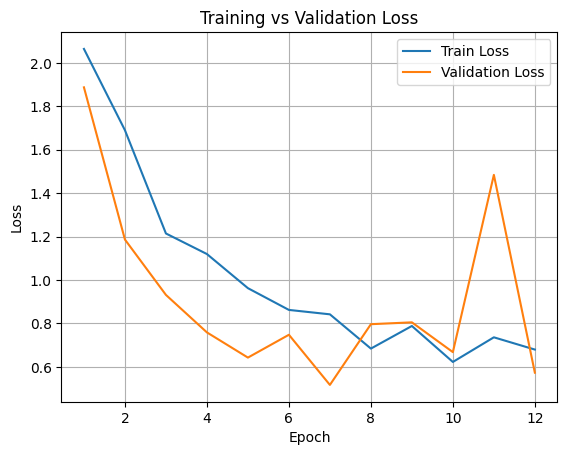

               precision    recall  f1-score   support

          low     0.9744    0.8636    0.9157        44
     moderate     0.8519    0.8519    0.8519        27
         high     0.7391    0.6071    0.6667        28
       mature     0.7647    0.7647    0.7647        34
poor Dilation     0.7297    1.0000    0.8438        27

     accuracy                         0.8187       160
    macro avg     0.8120    0.8175    0.8085       160
 weighted avg     0.8267    0.8187    0.8171       160


Overall Accuracy: 0.8187
Macro F1-score  : 0.8085
Weighted F1-score: 0.8171


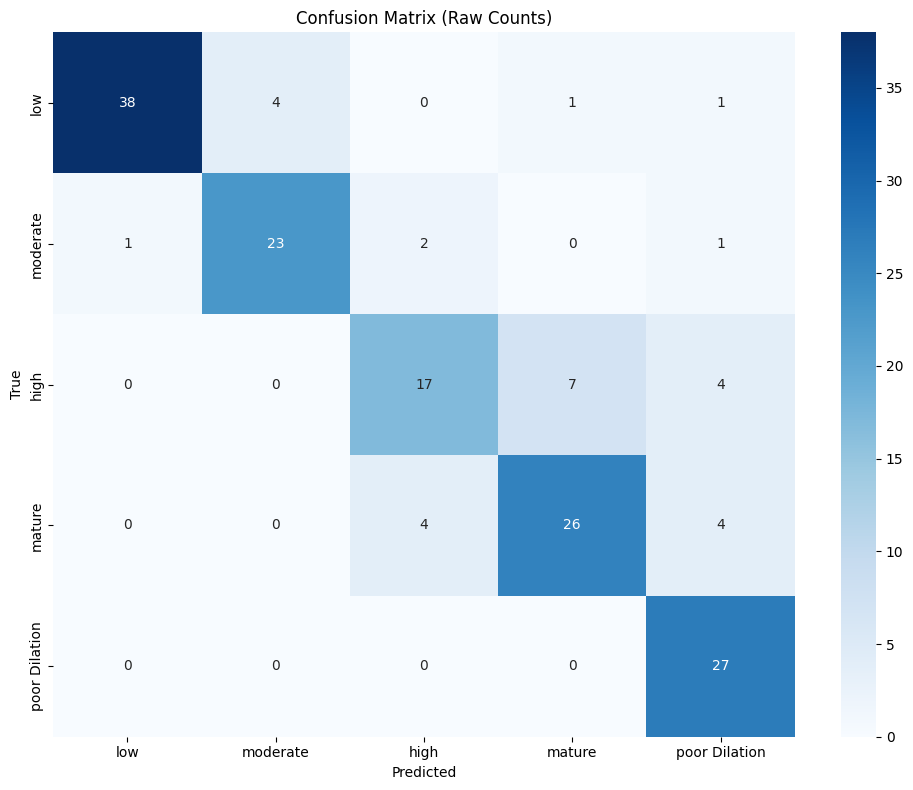

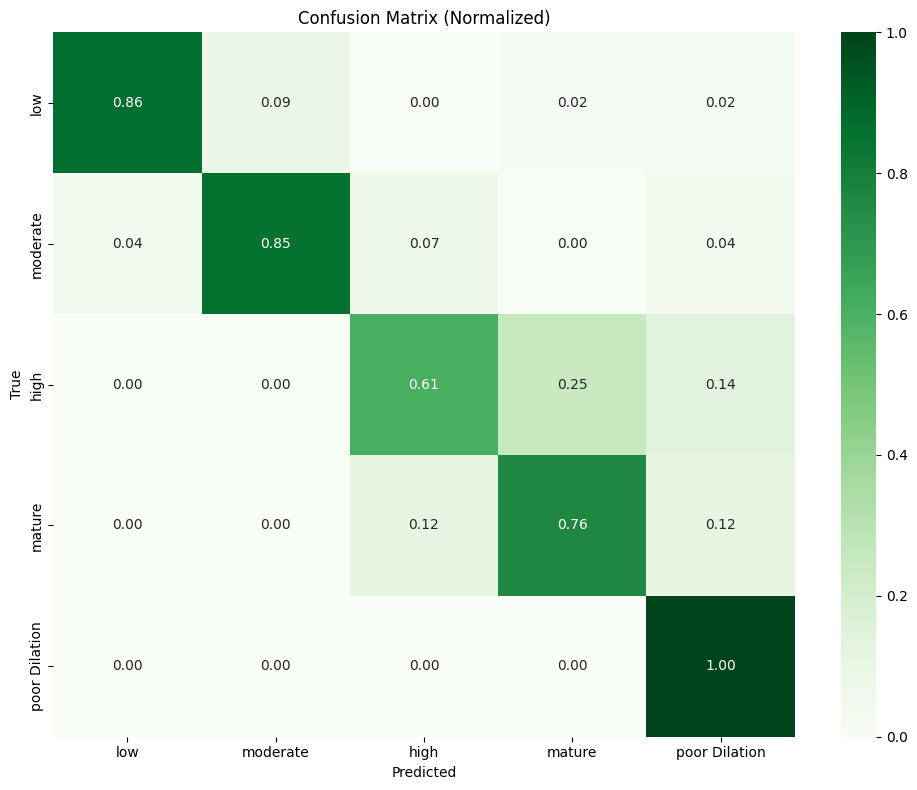

In [ ]:
CSV_PATH = "/content/dataset_V2.csv"
IMAGE_DIR = "/content/dataset_V2/dataset_V2"

train_loader, val_loader, test_loader, class_weights_tensor, df = get_dataloaders()


# Params
num_epochs = 30
lr = 1e-3
patience = 5
min_delta = 1e-4
best_val_loss = float('inf')
epochs_no_improve = 0

# Device configuration
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")



# Print dataset statistics
print(f"Total number of samples: {len(df)}")
print("\nClass distribution:")
print(df['label'].value_counts())

# Define the class labels (ordered)
classes = ["low", "moderate", "high", "mature", "poor Dilation"]

# Create a subplot grid: 4 rows (classes) x 3 columns (images)
fig, axs = plt.subplots(len(classes), 3, figsize=(12, 10))
fig.suptitle("Sample Images per Class", fontsize=16)

# Loop over each class
for i, cls in enumerate(classes):
    class_samples = df[df["label"] == cls].head(3)
    for j, (_, row) in enumerate(class_samples.iterrows()):
        img_path = os.path.join(IMAGE_DIR, row["filename"] + ".jpg")
        try:
            image = Image.open(img_path)
            axs[i, j].imshow(image)
            axs[i, j].axis("off")
            axs[i, j].set_title(f"{cls.capitalize()}")
        except FileNotFoundError:
            axs[i, j].axis("off")
            axs[i, j].set_title("Image not found")

plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # adjust for suptitle
plt.show()

# Plot bar chart of class distribution
plt.figure(figsize=(8, 5))
df["label"].value_counts().sort_index().plot(kind='bar', color='skyblue')
plt.title("Class Distribution")
plt.xlabel("Class")
plt.ylabel("Number of Samples")
plt.xticks(rotation=0)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()




# Training
# model = resnet18(fine_tune=False).to(device)  # change to True if you want to fine-tune deeper layers
model = get_vgg19(fine_tune=False).to(device)
# Loss Function
# class_weights_tensor = class_weights_tensor.to(device)  # move to GPU
loss_fn = torch.nn.CrossEntropyLoss()
#weight=class_weights_tensor

# Optimizer
# optimizer = torch.optim.Adam(model.fc.parameters(), lr=lr)
optimizer = torch.optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=1e-3, weight_decay=1e-2)

# Scheduler
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3)


train_loss = []
valid_loss = []

print(f"Model is on device: {next(model.parameters()).device}")

# Train Loop
num_steps = len(train_loader)
for epochs in range(num_epochs):
    model.train()
    running_loss = 0.0
    for j, (imgs, lbls) in enumerate(train_loader):
        imgs, lbls = imgs.to(device), lbls.to(device)
        optimizer.zero_grad()
        out = model(imgs)
        loss = loss_fn(out, lbls)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
        if j % 2 == 0:
            print('Epoch: [{}/{}] | Step: [{}/{}] | Loss: {:.6f}'
                  .format(epochs+1, num_epochs, j+1, num_steps, loss.item()))
    train_loss.append(running_loss / num_steps)
    print('Epoch: [{}/{}] | Loss: {:.6f}'
          .format(epochs+1, num_epochs, loss.item()))

#---------------------
    model.eval()
    with torch.no_grad():
        correct = 0
        total = 0
        running_valid_loss = 0.0
        for imgs, lbls in val_loader:
            imgs, lbls = imgs.to(device), lbls.to(device)
            out = model(imgs)
            loss_val = loss_fn(out, lbls)
            running_valid_loss += loss_val.item()
            predicted = torch.argmax(out, dim=1)
            correct += (predicted == lbls).sum().item()
            total += lbls.size(0)
        avg_val_loss = running_valid_loss / len(val_loader)
        valid_loss.append(avg_val_loss)
        print('Valid Loss: {:.6f} | Acc: {:.4f}'.format(valid_loss[-1], correct / total))

        # Step the scheduler
        scheduler.step(avg_val_loss)


        # Early stopping
        if best_val_loss - avg_val_loss > min_delta:
            best_val_loss = avg_val_loss
            epochs_no_improve = 0
        else:
            epochs_no_improve += 1
            if epochs_no_improve >= patience:
                print("Early stopping triggered.")
                break

# Plot losses
plt.plot(range(1, len(train_loss)+1), train_loss, label='Train Loss')
plt.plot(range(1, len(valid_loss)+1), valid_loss, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training vs Validation Loss')
plt.legend()
plt.grid(True)
plt.show()




# # Predictions and true labels
# all_preds = []
# all_labels = []
#
# model.eval()
# with torch.no_grad():
#     for imgs, lbls in test_loader:
#         imgs = imgs.to(device)
#         outputs = model(imgs)
#         preds = torch.argmax(outputs, dim=1).cpu()
#         all_preds.extend(preds.numpy())
#         all_labels.extend(lbls.numpy())
#
# # Classification Report
# print(classification_report(all_labels, all_preds, target_names=classes))
#
# # Confusion Matrix
# cm = confusion_matrix(all_labels, all_preds)
# plt.figure(figsize=(10, 8))
# sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=classes, yticklabels=classes)
# plt.xlabel('Predicted')
# plt.ylabel('True')
# plt.title('Confusion Matrix')
# plt.show()
#


# Evaluation
all_preds = []
all_labels = []

model.eval()
with torch.no_grad():
    for imgs, lbls in test_loader:
        imgs, lbls = imgs.to(device), lbls.to(device)
        outputs = model(imgs)
        preds = torch.argmax(outputs, dim=1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(lbls.cpu().numpy())

# Convert to numpy arrays
all_preds = np.array(all_preds)
all_labels = np.array(all_labels)

# Print classification report
report = classification_report(all_labels, all_preds, target_names=classes, digits=4)
print(report)

# Save report as a dataframe (optional)
report_df = pd.DataFrame(classification_report(all_labels, all_preds, target_names=classes, output_dict=True)).T
report_df.to_csv("classification_report.csv")

# Accuracy and F1 scores
print(f"\nOverall Accuracy: {accuracy_score(all_labels, all_preds):.4f}")
print(f"Macro F1-score  : {f1_score(all_labels, all_preds, average='macro'):.4f}")
print(f"Weighted F1-score: {f1_score(all_labels, all_preds, average='weighted'):.4f}")

# Confusion Matrix
cm = confusion_matrix(all_labels, all_preds)
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

# Plot raw confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=classes, yticklabels=classes)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix (Raw Counts)')
plt.tight_layout()
plt.show()

# Plot normalized confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm_normalized, annot=True, fmt='.2f', cmap='Greens', xticklabels=classes, yticklabels=classes)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix (Normalized)')
plt.tight_layout()
plt.show()



torch.save(model.state_dict(), 'vgg19.pth')


In [ ]:
import os
import time
import psutil
import pandas as pd
import numpy as np
from tqdm import tqdm
from PIL import Image
import torch
import torch.nn as nn
from torchvision import models, transforms
from sklearn.metrics import classification_report
from collections import Counter

# ====== CUSTOM PAD TO SQUARE TRANSFORM ======
from torchvision.transforms import functional as TF

class PadToSquareWithMean:
    def __call__(self, image):
        w, h = image.size
        max_dim = max(w, h)
        pad_left = (max_dim - w) // 2
        pad_top = (max_dim - h) // 2
        pad_right = max_dim - w - pad_left
        pad_bottom = max_dim - h - pad_top

        # Compute mean color of the image (as RGB tuple)
        mean_color = image.resize((1, 1)).getpixel((0, 0))

        # Apply padding using the mean color
        return TF.pad(image, (pad_left, pad_top, pad_right, pad_bottom),
                      fill=mean_color, padding_mode='constant')

# ====== CONFIG ======
model_path = "/content/vgg19.pth"
image_dir = "/content/Test_Data/Test_Data"
label_csv_path = "/content/Test_Data.csv"
num_classes = 5
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Device used for inference: {device}")
class_names = ['low', 'moderate', 'high', 'mature', 'poor dilation']

# ====== TRANSFORMS ======
val_test_transform = transforms.Compose([
    PadToSquareWithMean(),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])])

# ====== LOAD MODEL ======
print("\nLoading model...")
start_model_load = time.time()
from torchvision.models import vgg19

model = vgg19(weights=None)  # Or weights=models.VGG19_Weights.DEFAULT
model.classifier[6] = nn.Linear(model.classifier[6].in_features, num_classes)
model.load_state_dict(torch.load(model_path, map_location=device))
model.to(device)
model.eval()

end_model_load = time.time()
model_load_time = end_model_load - start_model_load
model_file_size = os.path.getsize(model_path) / (1024**2)  # MB

# ====== LOAD LABELS ======
df = pd.read_csv(label_csv_path)
df['filename'] = df['filename'].astype(str)
df['label'] = df['label'].str.strip().str.lower()

# ====== INFERENCE SETUP ======
y_true = []
y_pred = []
total_time = 0
total_images = 0

# Reset peak GPU memory stats
if device.type == "cuda":
    torch.cuda.reset_peak_memory_stats(device)

# Start monitoring CPU, RAM
process = psutil.Process(os.getpid())
cpu_before = psutil.cpu_percent(interval=1)
ram_before = process.memory_info().rss / (1024 ** 2)

# ====== RUN INFERENCE ======
for _, row in tqdm(df.iterrows(), total=len(df), desc="Running Inference"):
    filename, true_label = row['filename'], row['label']
    img_path = os.path.join(image_dir, filename + ".jpg")

    if not os.path.exists(img_path):
        print(f"Skipping missing file: {img_path}")
        continue

    img = Image.open(img_path).convert('RGB')
    input_tensor = val_test_transform(img).unsqueeze(0).to(device)

    start = time.time()
    with torch.no_grad():
        output = model(input_tensor)
        prob = torch.softmax(output, dim=1)
        pred_idx = torch.argmax(prob, dim=1).item()
    end = time.time()

    total_time += (end - start)
    total_images += 1
    y_true.append(true_label)
    y_pred.append(class_names[pred_idx])

# ====== RESOURCE USAGE ======
cpu_after = psutil.cpu_percent(interval=1)
ram_after = process.memory_info().rss / (1024 ** 2)
gpu_memory = 0
if device.type == "cuda":
    gpu_memory = torch.cuda.max_memory_allocated(device) / (1024 ** 2)

# ====== REPORT ======
print("\n====== Inference Results ======")
if total_images == 0:
    print("⚠️ No images were successfully processed.")
else:
    print(f"🕒 Average latency: {(total_time / total_images) * 1000:.2f} ms/image")
    print(f"⚡ Total inference time: {total_time:.2f} sec for {total_images} images")
print(f"🧊 Model load time: {model_load_time:.2f} sec")
print(f"📁 Model file size: {model_file_size:.2f} MB")
print(f"📈 CPU usage change: {cpu_after - cpu_before:.2f}%")
print(f"📦 RAM used change: {ram_after - ram_before:.2f} MB")
if device.type == "cuda":
    print(f"🧠 Peak GPU memory used: {gpu_memory:.2f} MB")

print("\n====== Classification Report ======")
if total_images > 0:
    print(classification_report(y_true, y_pred, target_names=class_names, zero_division=0))
    print("\nPrediction distribution:", Counter(y_pred))
    print("True label distribution:", Counter(y_true))


Device used for inference: cuda

Loading model...


Running Inference: 100%|██████████| 40/40 [00:00<00:00, 40.31it/s]



====== Inference Results ======
🕒 Average latency: 11.30 ms/image
⚡ Total inference time: 0.45 sec for 40 images
🧊 Model load time: 2.92 sec
📁 Model file size: 532.51 MB
📈 CPU usage change: 0.20%
📦 RAM used change: 317.72 MB
🧠 Peak GPU memory used: 578.66 MB

====== Classification Report ======
               precision    recall  f1-score   support

          low       0.88      1.00      0.93         7
     moderate       1.00      1.00      1.00         7
         high       1.00      0.83      0.91         6
       mature       1.00      0.85      0.92        13
poor dilation       0.78      1.00      0.88         7

     accuracy                           0.93        40
    macro avg       0.93      0.94      0.93        40
 weighted avg       0.94      0.93      0.93        40


Prediction distribution: Counter({'moderate': 11, 'poor dilation': 9, 'high': 8, 'low': 7, 'mature': 5})
True label distribution: Counter({'moderate': 13, 'low': 7, 'high': 7, 'poor dilation': 7, 'mature'

CONVNEXT

In [ ]:
import torch.nn as nn
from torchvision.models import (
    convnext_tiny, ConvNeXt_Tiny_Weights,
    convnext_small, ConvNeXt_Small_Weights,
    convnext_base, ConvNeXt_Base_Weights,
    convnext_large, ConvNeXt_Large_Weights
)

def get_convnext_model(variant="tiny", num_classes=5, pretrained=True, fine_tune_head_only=True):
    weights_map = {
        "tiny": (convnext_tiny, ConvNeXt_Tiny_Weights.DEFAULT),
        "small": (convnext_small, ConvNeXt_Small_Weights.DEFAULT),
        "base": (convnext_base, ConvNeXt_Base_Weights.DEFAULT),
        "large": (convnext_large, ConvNeXt_Large_Weights.DEFAULT)
    }

    if variant not in weights_map:
        raise ValueError(f"Invalid variant: {variant}. Choose from: {list(weights_map.keys())}")

    model_fn, weights_enum = weights_map[variant]
    weights = weights_enum if pretrained else None
    model = model_fn(weights=weights)

    # Freeze backbone if only fine-tuning classifier
    if fine_tune_head_only:
        for param in model.parameters():
            param.requires_grad = False

    # Replace classification head
    in_features = model.classifier[2].in_features
    model.classifier[2] = nn.Linear(in_features, num_classes)

    # Unfreeze classifier head
    if fine_tune_head_only:
        for param in model.classifier.parameters():
            param.requires_grad = True

    return model


In [ ]:
# ========== Config ==========
CSV_PATH = "dataset_V4.csv"
IMAGE_DIR = "/content/dataset_V4/dataset_V4"
BATCH_SIZE = 32

# ========== Dataset ==========
class CataractDataset(Dataset):
    def __init__(self, dataframe, image_dir, transform=None):
        self.data = dataframe.reset_index(drop=True)
        self.image_dir = image_dir
        self.transform = transform
        self.label_map = {"low": 0, "moderate": 1, "high": 2, "mature": 3, "poor dilation": 4}

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        row = self.data.iloc[idx]
        img_path = os.path.join(self.image_dir, row["filename"] + ".jpg")
        try:
            image = Image.open(img_path).convert("RGB")
        except FileNotFoundError:
            print(f"Missing image: {img_path}")
            return self.__getitem__((idx + 1) % len(self.data))

        label = self.label_map[row["label"].lower()]
        if self.transform:
            image = self.transform(image)
        return image, torch.tensor(label)

# ========== Load and Prepare CSV ==========
df = pd.read_csv(CSV_PATH)
df.columns = df.columns.str.strip()
df.rename(columns={"Frame Name": "filename"}, inplace=True)

# Derive label column from binary indicators
df["label"] = None
df.loc[df["Low Nuclear Density"] == 1.0, "label"] = "low"
df.loc[df["Moderate Nuclear Density"] == 1.0, "label"] = "moderate"
df.loc[df["High Nuclear Density"] == 1.0, "label"] = "high"
df.loc[df["Mature"] == 1.0, "label"] = "mature"
df.loc[df["Poor Dilation"] == 1.0, "label"] = "poor dilation"


# Keep only valid rows
df = df[df["label"].notna()]
df = df[["filename", "label"]]

# ========== Train / Val / Test Split ==========
train_val_df, test_df = train_test_split(df, test_size=0.2, stratify=df["label"], random_state=42)
train_df, val_df = train_test_split(train_val_df, test_size=0.2, stratify=train_val_df["label"], random_state=42)

# Map labels to integer indices
label_map = {"low": 0, "moderate": 1, "high": 2, "mature": 3, "poor dilation": 4}
train_df["class_idx"] = train_df["label"].map(label_map)

# Compute class weights
class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(train_df["class_idx"]),
    y=train_df["class_idx"]
)
class_weights_tensor = torch.tensor(class_weights, dtype=torch.float)

# ========== Transforms ==========
transform = transforms.Compose([
    PadToSquareWithMean(),  # <-- add this at the top
    transforms.Resize((224, 224)),  # match model input size
    transforms.RandomRotation(degrees=15),
    transforms.RandomAffine(degrees=10, translate=(0.05, 0.05), scale=(0.95, 1.05)),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
    transforms.RandomErasing(p=0.3)
])
val_test_transform = transforms.Compose([
    PadToSquareWithMean(),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])


# ========== Datasets and Dataloaders ==========
train_dataset = CataractDataset(train_df, IMAGE_DIR, transform)
# val_dataset = CataractDataset(val_df, IMAGE_DIR, transform)
# test_dataset = CataractDataset(test_df, IMAGE_DIR, transform)
val_dataset = CataractDataset(val_df, IMAGE_DIR, val_test_transform)
test_dataset = CataractDataset(test_df, IMAGE_DIR, val_test_transform)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False)

# ========== Return Utility ==========
def get_dataloaders():
    return train_loader, val_loader, test_loader, class_weights_tensor, df


In [ ]:
CSV_PATH = "/content/dataset_V4.csv"
IMAGE_DIR = "/content/dataset_V4/dataset_V4"

train_loader, val_loader, test_loader, class_weights_tensor, df = get_dataloaders()


# Params
num_epochs = 30
lr = 1e-3
patience = 5
min_delta = 1e-4
best_val_loss = float('inf')
epochs_no_improve = 0

# Device configuration
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")



# Print dataset statistics
print(f"Total number of samples: {len(df)}")
print("\nClass distribution:")
print(df['label'].value_counts())

# Define the class labels (ordered)
classes = ["low", "moderate", "high", "mature", "poor dilation"]

# Create a subplot grid: 4 rows (classes) x 3 columns (images)
fig, axs = plt.subplots(len(classes), 3, figsize=(12, 10))
fig.suptitle("Sample Images per Class", fontsize=16)

# Loop over each class
for i, cls in enumerate(classes):
    class_samples = df[df["label"] == cls].head(3)
    for j, (_, row) in enumerate(class_samples.iterrows()):
        img_path = os.path.join(IMAGE_DIR, row["filename"] + ".jpg")
        try:
            image = Image.open(img_path)
            axs[i, j].imshow(image)
            axs[i, j].axis("off")
            axs[i, j].set_title(f"{cls.capitalize()}")
        except FileNotFoundError:
            axs[i, j].axis("off")
            axs[i, j].set_title("Image not found")

plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # adjust for suptitle
plt.show()

# Plot bar chart of class distribution
plt.figure(figsize=(8, 5))
df["label"].value_counts().sort_index().plot(kind='bar', color='skyblue')
plt.title("Class Distribution")
plt.xlabel("Class")
plt.ylabel("Number of Samples")
plt.xticks(rotation=0)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()




# Training
# model = resnet18(fine_tune=False).to(device)  # change to True if you want to fine-tune deeper layers
model = get_convnext_model(variant="tiny", num_classes=5, fine_tune_head_only=True).to(device)
# Loss Function
# class_weights_tensor = class_weights_tensor.to(device)  # move to GPU
loss_fn = torch.nn.CrossEntropyLoss()

# Optimizer
# optimizer = torch.optim.Adam(model.fc.parameters(), lr=lr)
optimizer = torch.optim.Adam(model.classifier.parameters(), lr=lr)

# optimizer = torch.optim.AdamW(model.parameters(), lr=lr, weight_decay=1e-2)

# Scheduler
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3)


train_loss = []
valid_loss = []

print(f"Model is on device: {next(model.parameters()).device}")

# Train Loop
num_steps = len(train_loader)
for epochs in range(num_epochs):
    model.train()
    running_loss = 0.0
    for j, (imgs, lbls) in enumerate(train_loader):
        imgs, lbls = imgs.to(device), lbls.to(device)
        optimizer.zero_grad()
        out = model(imgs)
        loss = loss_fn(out, lbls)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
        if j % 2 == 0:
            print('Epoch: [{}/{}] | Step: [{}/{}] | Loss: {:.6f}'
                  .format(epochs+1, num_epochs, j+1, num_steps, loss.item()))
    train_loss.append(running_loss / num_steps)
    print('Epoch: [{}/{}] | Loss: {:.6f}'
          .format(epochs+1, num_epochs, loss.item()))

#---------------------
    model.eval()
    with torch.no_grad():
        correct = 0
        total = 0
        running_valid_loss = 0.0
        for imgs, lbls in val_loader:
            imgs, lbls = imgs.to(device), lbls.to(device)
            out = model(imgs)
            loss_val = loss_fn(out, lbls)
            running_valid_loss += loss_val.item()
            predicted = torch.argmax(out, dim=1)
            correct += (predicted == lbls).sum().item()
            total += lbls.size(0)
        avg_val_loss = running_valid_loss / len(val_loader)
        valid_loss.append(avg_val_loss)
        print('Valid Loss: {:.6f} | Acc: {:.4f}'.format(valid_loss[-1], correct / total))

        # Step the scheduler
        scheduler.step(avg_val_loss)


        # Early stopping
        if best_val_loss - avg_val_loss > min_delta:
            best_val_loss = avg_val_loss
            epochs_no_improve = 0
        else:
            epochs_no_improve += 1
            if epochs_no_improve >= patience:
                print("Early stopping triggered.")
                break

# Plot losses
plt.plot(range(1, len(train_loss)+1), train_loss, label='Train Loss')
plt.plot(range(1, len(valid_loss)+1), valid_loss, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training vs Validation Loss')
plt.legend()
plt.grid(True)
plt.show()




# # Predictions and true labels
# all_preds = []
# all_labels = []
#
# model.eval()
# with torch.no_grad():
#     for imgs, lbls in test_loader:
#         imgs = imgs.to(device)
#         outputs = model(imgs)
#         preds = torch.argmax(outputs, dim=1).cpu()
#         all_preds.extend(preds.numpy())
#         all_labels.extend(lbls.numpy())
#
# # Classification Report
# print(classification_report(all_labels, all_preds, target_names=classes))
#
# # Confusion Matrix
# cm = confusion_matrix(all_labels, all_preds)
# plt.figure(figsize=(10, 8))
# sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=classes, yticklabels=classes)
# plt.xlabel('Predicted')
# plt.ylabel('True')
# plt.title('Confusion Matrix')
# plt.show()
#


# Evaluation
all_preds = []
all_labels = []

model.eval()
with torch.no_grad():
    for imgs, lbls in test_loader:
        imgs, lbls = imgs.to(device), lbls.to(device)
        outputs = model(imgs)
        preds = torch.argmax(outputs, dim=1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(lbls.cpu().numpy())

# Convert to numpy arrays
all_preds = np.array(all_preds)
all_labels = np.array(all_labels)

# Print classification report
report = classification_report(all_labels, all_preds, target_names=classes, digits=4)
print(report)

# Save report as a dataframe (optional)
report_df = pd.DataFrame(classification_report(all_labels, all_preds, target_names=classes, output_dict=True)).T
report_df.to_csv("classification_report.csv")

# Accuracy and F1 scores
print(f"\nOverall Accuracy: {accuracy_score(all_labels, all_preds):.4f}")
print(f"Macro F1-score  : {f1_score(all_labels, all_preds, average='macro'):.4f}")
print(f"Weighted F1-score: {f1_score(all_labels, all_preds, average='weighted'):.4f}")

# Confusion Matrix
cm = confusion_matrix(all_labels, all_preds)
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

# Plot raw confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=classes, yticklabels=classes)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix (Raw Counts)')
plt.tight_layout()
plt.show()

# Plot normalized confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm_normalized, annot=True, fmt='.2f', cmap='Greens', xticklabels=classes, yticklabels=classes)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix (Normalized)')
plt.tight_layout()
plt.show()



torch.save(model.state_dict(), 'convnext_tiny.pth')

In [ ]:
import os
import time
import psutil
import pandas as pd
import numpy as np
from tqdm import tqdm
from PIL import Image
import torch
import torch.nn as nn
from torchvision import models, transforms
from sklearn.metrics import classification_report
from collections import Counter
from torchvision.transforms import functional as TF

# ====== CUSTOM PAD TO SQUARE TRANSFORM ======
class PadToSquareWithMean:
    def __call__(self, image):
        w, h = image.size
        max_dim = max(w, h)
        pad_left = (max_dim - w) // 2
        pad_top = (max_dim - h) // 2
        pad_right = max_dim - w - pad_left
        pad_bottom = max_dim - h - pad_top

        # Compute mean color of the image (as RGB tuple)
        mean_color = image.resize((1, 1)).getpixel((0, 0))

        # Apply padding using the mean color
        return TF.pad(image, (pad_left, pad_top, pad_right, pad_bottom),
                      fill=mean_color, padding_mode='constant')

# ====== CONFIG ======
model_path = "/content/cataract_models/convnext_tiny.pth"
image_dir = "/content/Test_Data/Test_Data"
label_csv_path = "/content/Test_Data.csv"
num_classes = 5
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Device used for inference: {device}")
class_names = ['low', 'moderate', 'high', 'mature', 'poor dilation']

# ====== TRANSFORMS ======
val_test_transform = transforms.Compose([
    PadToSquareWithMean(),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

# ====== LOAD MODEL ======
print("\nLoading model...")
start_model_load = time.time()
model = get_convnext_model(variant="tiny", num_classes=5, fine_tune_head_only=True).to(device)
# model.fc = nn.Linear(model.fc.in_features, num_classes)
model.load_state_dict(torch.load(model_path, map_location=device))
model.to(device)
model.eval()
end_model_load = time.time()
model_load_time = end_model_load - start_model_load
model_file_size = os.path.getsize(model_path) / (1024**2)  # MB

# ====== LOAD LABELS ======
df = pd.read_csv(label_csv_path)
df['filename'] = df['filename'].astype(str)
df['label'] = df['label'].str.strip().str.lower()

# ====== INFERENCE SETUP ======
y_true = []
y_pred = []
total_time = 0
total_images = 0

# Reset peak GPU memory stats
if device.type == "cuda":
    torch.cuda.reset_peak_memory_stats(device)

# Start monitoring CPU, RAM
process = psutil.Process(os.getpid())
cpu_before = psutil.cpu_percent(interval=1)
ram_before = process.memory_info().rss / (1024 ** 2)

# ====== RUN INFERENCE ======
for _, row in tqdm(df.iterrows(), total=len(df), desc="Running Inference"):
    filename, true_label = row['filename'], row['label']
    img_path = os.path.join(image_dir, filename + ".jpg")

    if not os.path.exists(img_path):
        print(f"Skipping missing file: {img_path}")
        continue

    img = Image.open(img_path).convert('RGB')
    input_tensor = val_test_transform(img).unsqueeze(0).to(device)

    start = time.time()
    with torch.no_grad():
        output = model(input_tensor)
        prob = torch.softmax(output, dim=1)
        pred_idx = torch.argmax(prob, dim=1).item()
    end = time.time()

    total_time += (end - start)
    total_images += 1
    y_true.append(true_label)
    y_pred.append(class_names[pred_idx])

# ====== RESOURCE USAGE ======
cpu_after = psutil.cpu_percent(interval=1)
ram_after = process.memory_info().rss / (1024 ** 2)
gpu_memory = 0
if device.type == "cuda":
    gpu_memory = torch.cuda.max_memory_allocated(device) / (1024 ** 2)

# ====== REPORT ======
print("\n====== Inference Results ======")
if total_images == 0:
    print("⚠️ No images were successfully processed.")
else:
    print(f"🕒 Average latency: {(total_time / total_images) * 1000:.2f} ms/image")
    print(f"⚡ Total inference time: {total_time:.2f} sec for {total_images} images")
print(f"🧊 Model load time: {model_load_time:.2f} sec")
print(f"📁 Model file size: {model_file_size:.2f} MB")
print(f"📈 CPU usage change: {cpu_after - cpu_before:.2f}%")
print(f"📦 RAM used change: {ram_after - ram_before:.2f} MB")
if device.type == "cuda":
    print(f"🧠 Peak GPU memory used: {gpu_memory:.2f} MB")

print("\n====== Classification Report ======")
if total_images > 0:
    print(classification_report(y_true, y_pred, target_names=class_names, zero_division=0))
    print("\nPrediction distribution:", Counter(y_pred))
    print("True label distribution:", Counter(y_true))

Device used for inference: cuda

Loading model...


Downloading: "https://download.pytorch.org/models/convnext_tiny-983f1562.pth" to /root/.cache/torch/hub/checkpoints/convnext_tiny-983f1562.pth
100%|██████████| 109M/109M [00:03<00:00, 29.8MB/s]
Running Inference: 100%|██████████| 40/40 [00:06<00:00,  6.55it/s]



====== Inference Results ======
🕒 Average latency: 69.22 ms/image
⚡ Total inference time: 2.77 sec for 40 images
🧊 Model load time: 10.33 sec
📁 Model file size: 106.20 MB
📈 CPU usage change: 0.00%
📦 RAM used change: 228.41 MB
🧠 Peak GPU memory used: 129.49 MB

====== Classification Report ======
               precision    recall  f1-score   support

          low       0.67      0.57      0.62         7
     moderate       1.00      1.00      1.00         7
         high       0.67      1.00      0.80         6
       mature       1.00      0.77      0.87        13
poor dilation       0.88      1.00      0.93         7

     accuracy                           0.85        40
    macro avg       0.84      0.87      0.84        40
 weighted avg       0.87      0.85      0.85        40


Prediction distribution: Counter({'moderate': 10, 'mature': 9, 'poor dilation': 8, 'low': 7, 'high': 6})
True label distribution: Counter({'moderate': 13, 'low': 7, 'high': 7, 'poor dilation': 7, 'mature

In [ ]:
# ========== Config ==========
CSV_PATH = "dataset_V4.csv"
IMAGE_DIR = "/content/dataset_V4/dataset_V4"
BATCH_SIZE = 32

# ========== Dataset ==========
class CataractDataset(Dataset):
    def __init__(self, dataframe, image_dir, transform=None):
        self.data = dataframe.reset_index(drop=True)
        self.image_dir = image_dir
        self.transform = transform
        self.label_map = {"low": 0, "moderate": 1, "high": 2, "mature": 3, "poor dilation": 4}

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        row = self.data.iloc[idx]
        img_path = os.path.join(self.image_dir, row["filename"] + ".jpg")
        try:
            image = Image.open(img_path).convert("RGB")
        except FileNotFoundError:
            print(f"Missing image: {img_path}")
            return self.__getitem__((idx + 1) % len(self.data))

        label = self.label_map[row["label"].lower()]
        if self.transform:
            image = self.transform(image)
        return image, torch.tensor(label)

# ========== Load and Prepare CSV ==========
df = pd.read_csv(CSV_PATH)
df.columns = df.columns.str.strip()
df.rename(columns={"Frame Name": "filename"}, inplace=True)

# Derive label column from binary indicators
df["label"] = None
df.loc[df["Low Nuclear Density"] == 1.0, "label"] = "low"
df.loc[df["Moderate Nuclear Density"] == 1.0, "label"] = "moderate"
df.loc[df["High Nuclear Density"] == 1.0, "label"] = "high"
df.loc[df["Mature"] == 1.0, "label"] = "mature"
df.loc[df["Poor Dilation"] == 1.0, "label"] = "poor dilation"


# Keep only valid rows
df = df[df["label"].notna()]
df = df[["filename", "label"]]

# ========== Train / Val / Test Split ==========
train_val_df, test_df = train_test_split(df, test_size=0.2, stratify=df["label"], random_state=42)
train_df, val_df = train_test_split(train_val_df, test_size=0.2, stratify=train_val_df["label"], random_state=42)

# Map labels to integer indices
label_map = {"low": 0, "moderate": 1, "high": 2, "mature": 3, "poor dilation": 4}
train_df["class_idx"] = train_df["label"].map(label_map)

# Compute class weights
class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(train_df["class_idx"]),
    y=train_df["class_idx"]
)
class_weights_tensor = torch.tensor(class_weights, dtype=torch.float)

# ========== Transforms ==========
transform = transforms.Compose([
    PadToSquareWithMean(),  # <-- add this at the top
    transforms.Resize((224, 224)),  # match model input size
    transforms.RandomRotation(degrees=15),
    transforms.RandomAffine(degrees=10, translate=(0.05, 0.05), scale=(0.95, 1.05)),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
    transforms.RandomErasing(p=0.3)
])
val_test_transform = transforms.Compose([
    PadToSquareWithMean(),
    transforms.Resize((288, 288)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])


# ========== Datasets and Dataloaders ==========
train_dataset = CataractDataset(train_df, IMAGE_DIR, transform)
# val_dataset = CataractDataset(val_df, IMAGE_DIR, transform)
# test_dataset = CataractDataset(test_df, IMAGE_DIR, transform)
val_dataset = CataractDataset(val_df, IMAGE_DIR, val_test_transform)
test_dataset = CataractDataset(test_df, IMAGE_DIR, val_test_transform)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False)

# ========== Return Utility ==========
def get_dataloaders():
    return train_loader, val_loader, test_loader, class_weights_tensor, df


In [ ]:
CSV_PATH = "/content/dataset_V4.csv"
IMAGE_DIR = "/content/dataset_V4/dataset_V4"

train_loader, val_loader, test_loader, class_weights_tensor, df = get_dataloaders()


# Params
num_epochs = 30
lr = 1e-3
patience = 5
min_delta = 1e-4
best_val_loss = float('inf')
epochs_no_improve = 0

# Device configuration
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")



# Print dataset statistics
print(f"Total number of samples: {len(df)}")
print("\nClass distribution:")
print(df['label'].value_counts())

# Define the class labels (ordered)
classes = ["low", "moderate", "high", "mature", "poor dilation"]

# Create a subplot grid: 4 rows (classes) x 3 columns (images)
fig, axs = plt.subplots(len(classes), 3, figsize=(12, 10))
fig.suptitle("Sample Images per Class", fontsize=16)

# Loop over each class
for i, cls in enumerate(classes):
    class_samples = df[df["label"] == cls].head(3)
    for j, (_, row) in enumerate(class_samples.iterrows()):
        img_path = os.path.join(IMAGE_DIR, row["filename"] + ".jpg")
        try:
            image = Image.open(img_path)
            axs[i, j].imshow(image)
            axs[i, j].axis("off")
            axs[i, j].set_title(f"{cls.capitalize()}")
        except FileNotFoundError:
            axs[i, j].axis("off")
            axs[i, j].set_title("Image not found")

plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # adjust for suptitle
plt.show()

# Plot bar chart of class distribution
plt.figure(figsize=(8, 5))
df["label"].value_counts().sort_index().plot(kind='bar', color='skyblue')
plt.title("Class Distribution")
plt.xlabel("Class")
plt.ylabel("Number of Samples")
plt.xticks(rotation=0)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()




# Training
# model = resnet18(fine_tune=False).to(device)  # change to True if you want to fine-tune deeper layers
model = get_convnext_model(variant="small", num_classes=5, fine_tune_head_only=True).to(device)
# Loss Function
# class_weights_tensor = class_weights_tensor.to(device)  # move to GPU
loss_fn = torch.nn.CrossEntropyLoss()

# Optimizer
# optimizer = torch.optim.Adam(model.fc.parameters(), lr=lr)
optimizer = torch.optim.Adam(model.classifier.parameters(), lr=lr)

# optimizer = torch.optim.AdamW(model.parameters(), lr=lr, weight_decay=1e-2)

# Scheduler
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3)


train_loss = []
valid_loss = []

print(f"Model is on device: {next(model.parameters()).device}")

# Train Loop
num_steps = len(train_loader)
for epochs in range(num_epochs):
    model.train()
    running_loss = 0.0
    for j, (imgs, lbls) in enumerate(train_loader):
        imgs, lbls = imgs.to(device), lbls.to(device)
        optimizer.zero_grad()
        out = model(imgs)
        loss = loss_fn(out, lbls)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
        if j % 2 == 0:
            print('Epoch: [{}/{}] | Step: [{}/{}] | Loss: {:.6f}'
                  .format(epochs+1, num_epochs, j+1, num_steps, loss.item()))
    train_loss.append(running_loss / num_steps)
    print('Epoch: [{}/{}] | Loss: {:.6f}'
          .format(epochs+1, num_epochs, loss.item()))

#---------------------
    model.eval()
    with torch.no_grad():
        correct = 0
        total = 0
        running_valid_loss = 0.0
        for imgs, lbls in val_loader:
            imgs, lbls = imgs.to(device), lbls.to(device)
            out = model(imgs)
            loss_val = loss_fn(out, lbls)
            running_valid_loss += loss_val.item()
            predicted = torch.argmax(out, dim=1)
            correct += (predicted == lbls).sum().item()
            total += lbls.size(0)
        avg_val_loss = running_valid_loss / len(val_loader)
        valid_loss.append(avg_val_loss)
        print('Valid Loss: {:.6f} | Acc: {:.4f}'.format(valid_loss[-1], correct / total))

        # Step the scheduler
        scheduler.step(avg_val_loss)


        # Early stopping
        if best_val_loss - avg_val_loss > min_delta:
            best_val_loss = avg_val_loss
            epochs_no_improve = 0
        else:
            epochs_no_improve += 1
            if epochs_no_improve >= patience:
                print("Early stopping triggered.")
                break

# Plot losses
plt.plot(range(1, len(train_loss)+1), train_loss, label='Train Loss')
plt.plot(range(1, len(valid_loss)+1), valid_loss, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training vs Validation Loss')
plt.legend()
plt.grid(True)
plt.show()




# # Predictions and true labels
# all_preds = []
# all_labels = []
#
# model.eval()
# with torch.no_grad():
#     for imgs, lbls in test_loader:
#         imgs = imgs.to(device)
#         outputs = model(imgs)
#         preds = torch.argmax(outputs, dim=1).cpu()
#         all_preds.extend(preds.numpy())
#         all_labels.extend(lbls.numpy())
#
# # Classification Report
# print(classification_report(all_labels, all_preds, target_names=classes))
#
# # Confusion Matrix
# cm = confusion_matrix(all_labels, all_preds)
# plt.figure(figsize=(10, 8))
# sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=classes, yticklabels=classes)
# plt.xlabel('Predicted')
# plt.ylabel('True')
# plt.title('Confusion Matrix')
# plt.show()
#


# Evaluation
all_preds = []
all_labels = []

model.eval()
with torch.no_grad():
    for imgs, lbls in test_loader:
        imgs, lbls = imgs.to(device), lbls.to(device)
        outputs = model(imgs)
        preds = torch.argmax(outputs, dim=1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(lbls.cpu().numpy())

# Convert to numpy arrays
all_preds = np.array(all_preds)
all_labels = np.array(all_labels)

# Print classification report
report = classification_report(all_labels, all_preds, target_names=classes, digits=4)
print(report)

# Save report as a dataframe (optional)
report_df = pd.DataFrame(classification_report(all_labels, all_preds, target_names=classes, output_dict=True)).T
report_df.to_csv("classification_report.csv")

# Accuracy and F1 scores
print(f"\nOverall Accuracy: {accuracy_score(all_labels, all_preds):.4f}")
print(f"Macro F1-score  : {f1_score(all_labels, all_preds, average='macro'):.4f}")
print(f"Weighted F1-score: {f1_score(all_labels, all_preds, average='weighted'):.4f}")

# Confusion Matrix
cm = confusion_matrix(all_labels, all_preds)
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

# Plot raw confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=classes, yticklabels=classes)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix (Raw Counts)')
plt.tight_layout()
plt.show()

# Plot normalized confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm_normalized, annot=True, fmt='.2f', cmap='Greens', xticklabels=classes, yticklabels=classes)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix (Normalized)')
plt.tight_layout()
plt.show()



torch.save(model.state_dict(), 'convnext_small.pth')

In [ ]:
import os
import time
import psutil
import pandas as pd
import numpy as np
from tqdm import tqdm
from PIL import Image
import torch
import torch.nn as nn
from torchvision import models, transforms
from sklearn.metrics import classification_report
from collections import Counter
from torchvision.transforms import functional as TF

# ====== CUSTOM PAD TO SQUARE TRANSFORM ======
class PadToSquareWithMean:
    def __call__(self, image):
        w, h = image.size
        max_dim = max(w, h)
        pad_left = (max_dim - w) // 2
        pad_top = (max_dim - h) // 2
        pad_right = max_dim - w - pad_left
        pad_bottom = max_dim - h - pad_top

        # Compute mean color of the image (as RGB tuple)
        mean_color = image.resize((1, 1)).getpixel((0, 0))

        # Apply padding using the mean color
        return TF.pad(image, (pad_left, pad_top, pad_right, pad_bottom),
                      fill=mean_color, padding_mode='constant')

# ====== CONFIG ======
model_path = "/content/cataract_models/convnext_small.pth"
image_dir = "/content/Test_Data/Test_Data"
label_csv_path = "/content/Test_Data.csv"
num_classes = 5
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Device used for inference: {device}")
class_names = ['low', 'moderate', 'high', 'mature', 'poor dilation']

# ====== TRANSFORMS ======
val_test_transform = transforms.Compose([
    PadToSquareWithMean(),
    transforms.Resize((288, 288)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

# ====== LOAD MODEL ======
print("\nLoading model...")
start_model_load = time.time()
model = get_convnext_model(variant="small", num_classes=5, fine_tune_head_only=True).to(device)
# model.fc = nn.Linear(model.fc.in_features, num_classes)
model.load_state_dict(torch.load(model_path, map_location=device))
model.to(device)
model.eval()
end_model_load = time.time()
model_load_time = end_model_load - start_model_load
model_file_size = os.path.getsize(model_path) / (1024**2)  # MB

# ====== LOAD LABELS ======
df = pd.read_csv(label_csv_path)
df['filename'] = df['filename'].astype(str)
df['label'] = df['label'].str.strip().str.lower()

# ====== INFERENCE SETUP ======
y_true = []
y_pred = []
total_time = 0
total_images = 0

# Reset peak GPU memory stats
if device.type == "cuda":
    torch.cuda.reset_peak_memory_stats(device)

# Start monitoring CPU, RAM
process = psutil.Process(os.getpid())
cpu_before = psutil.cpu_percent(interval=1)
ram_before = process.memory_info().rss / (1024 ** 2)

# ====== RUN INFERENCE ======
for _, row in tqdm(df.iterrows(), total=len(df), desc="Running Inference"):
    filename, true_label = row['filename'], row['label']
    img_path = os.path.join(image_dir, filename + ".jpg")

    if not os.path.exists(img_path):
        print(f"Skipping missing file: {img_path}")
        continue

    img = Image.open(img_path).convert('RGB')
    input_tensor = val_test_transform(img).unsqueeze(0).to(device)

    start = time.time()
    with torch.no_grad():
        output = model(input_tensor)
        prob = torch.softmax(output, dim=1)
        pred_idx = torch.argmax(prob, dim=1).item()
    end = time.time()

    total_time += (end - start)
    total_images += 1
    y_true.append(true_label)
    y_pred.append(class_names[pred_idx])

# ====== RESOURCE USAGE ======
cpu_after = psutil.cpu_percent(interval=1)
ram_after = process.memory_info().rss / (1024 ** 2)
gpu_memory = 0
if device.type == "cuda":
    gpu_memory = torch.cuda.max_memory_allocated(device) / (1024 ** 2)

# ====== REPORT ======
print("\n====== Inference Results ======")
if total_images == 0:
    print("⚠️ No images were successfully processed.")
else:
    print(f"🕒 Average latency: {(total_time / total_images) * 1000:.2f} ms/image")
    print(f"⚡ Total inference time: {total_time:.2f} sec for {total_images} images")
print(f"🧊 Model load time: {model_load_time:.2f} sec")
print(f"📁 Model file size: {model_file_size:.2f} MB")
print(f"📈 CPU usage change: {cpu_after - cpu_before:.2f}%")
print(f"📦 RAM used change: {ram_after - ram_before:.2f} MB")
if device.type == "cuda":
    print(f"🧠 Peak GPU memory used: {gpu_memory:.2f} MB")

print("\n====== Classification Report ======")
if total_images > 0:
    print(classification_report(y_true, y_pred, target_names=class_names, zero_division=0))
    print("\nPrediction distribution:", Counter(y_pred))
    print("True label distribution:", Counter(y_true))

Device used for inference: cuda

Loading model...


Running Inference: 100%|██████████| 40/40 [00:02<00:00, 17.97it/s]



====== Inference Results ======
🕒 Average latency: 29.46 ms/image
⚡ Total inference time: 1.18 sec for 40 images
🧊 Model load time: 4.17 sec
📁 Model file size: 188.79 MB
📈 CPU usage change: -8.60%
📦 RAM used change: 243.41 MB
🧠 Peak GPU memory used: 218.77 MB

====== Classification Report ======
               precision    recall  f1-score   support

          low       0.67      0.86      0.75         7
     moderate       1.00      1.00      1.00         7
         high       0.67      1.00      0.80         6
       mature       1.00      0.62      0.76        13
poor dilation       1.00      1.00      1.00         7

     accuracy                           0.85        40
    macro avg       0.87      0.89      0.86        40
 weighted avg       0.89      0.85      0.85        40


Prediction distribution: Counter({'high': 9, 'mature': 9, 'moderate': 8, 'low': 7, 'poor dilation': 7})
True label distribution: Counter({'moderate': 13, 'low': 7, 'high': 7, 'poor dilation': 7, 'mature'

In [ ]:
# ========== Config ==========
CSV_PATH = "dataset_V4.csv"
IMAGE_DIR = "/content/dataset_V4/dataset_V4"
BATCH_SIZE = 32

# ========== Dataset ==========
class CataractDataset(Dataset):
    def __init__(self, dataframe, image_dir, transform=None):
        self.data = dataframe.reset_index(drop=True)
        self.image_dir = image_dir
        self.transform = transform
        self.label_map = {"low": 0, "moderate": 1, "high": 2, "mature": 3, "poor dilation": 4}

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        row = self.data.iloc[idx]
        img_path = os.path.join(self.image_dir, row["filename"] + ".jpg")
        try:
            image = Image.open(img_path).convert("RGB")
        except FileNotFoundError:
            print(f"Missing image: {img_path}")
            return self.__getitem__((idx + 1) % len(self.data))

        label = self.label_map[row["label"].lower()]
        if self.transform:
            image = self.transform(image)
        return image, torch.tensor(label)

# ========== Load and Prepare CSV ==========
df = pd.read_csv(CSV_PATH)
df.columns = df.columns.str.strip()
df.rename(columns={"Frame Name": "filename"}, inplace=True)

# Derive label column from binary indicators
df["label"] = None
df.loc[df["Low Nuclear Density"] == 1.0, "label"] = "low"
df.loc[df["Moderate Nuclear Density"] == 1.0, "label"] = "moderate"
df.loc[df["High Nuclear Density"] == 1.0, "label"] = "high"
df.loc[df["Mature"] == 1.0, "label"] = "mature"
df.loc[df["Poor Dilation"] == 1.0, "label"] = "poor dilation"


# Keep only valid rows
df = df[df["label"].notna()]
df = df[["filename", "label"]]

# ========== Train / Val / Test Split ==========
train_val_df, test_df = train_test_split(df, test_size=0.2, stratify=df["label"], random_state=42)
train_df, val_df = train_test_split(train_val_df, test_size=0.2, stratify=train_val_df["label"], random_state=42)

# Map labels to integer indices
label_map = {"low": 0, "moderate": 1, "high": 2, "mature": 3, "poor dilation": 4}
train_df["class_idx"] = train_df["label"].map(label_map)

# Compute class weights
class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(train_df["class_idx"]),
    y=train_df["class_idx"]
)
class_weights_tensor = torch.tensor(class_weights, dtype=torch.float)

# ========== Transforms ==========
transform = transforms.Compose([
    PadToSquareWithMean(),  # <-- add this at the top
    transforms.Resize((384, 384)),  # match model input size
    transforms.RandomRotation(degrees=15),
    transforms.RandomAffine(degrees=10, translate=(0.05, 0.05), scale=(0.95, 1.05)),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
    transforms.RandomErasing(p=0.3)
])
val_test_transform = transforms.Compose([
    PadToSquareWithMean(),
    transforms.Resize((384, 384)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])


# ========== Datasets and Dataloaders ==========
train_dataset = CataractDataset(train_df, IMAGE_DIR, transform)
# val_dataset = CataractDataset(val_df, IMAGE_DIR, transform)
# test_dataset = CataractDataset(test_df, IMAGE_DIR, transform)
val_dataset = CataractDataset(val_df, IMAGE_DIR, val_test_transform)
test_dataset = CataractDataset(test_df, IMAGE_DIR, val_test_transform)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False)

# ========== Return Utility ==========
def get_dataloaders():
    return train_loader, val_loader, test_loader, class_weights_tensor, df


In [ ]:
CSV_PATH = "/content/dataset_V4.csv"
IMAGE_DIR = "/content/dataset_V4/dataset_V4"

train_loader, val_loader, test_loader, class_weights_tensor, df = get_dataloaders()


# Params
num_epochs = 30
lr = 1e-3
patience = 5
min_delta = 1e-4
best_val_loss = float('inf')
epochs_no_improve = 0

# Device configuration
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")



# Print dataset statistics
print(f"Total number of samples: {len(df)}")
print("\nClass distribution:")
print(df['label'].value_counts())

# Define the class labels (ordered)
classes = ["low", "moderate", "high", "mature", "poor dilation"]

# Create a subplot grid: 4 rows (classes) x 3 columns (images)
fig, axs = plt.subplots(len(classes), 3, figsize=(12, 10))
fig.suptitle("Sample Images per Class", fontsize=16)

# Loop over each class
for i, cls in enumerate(classes):
    class_samples = df[df["label"] == cls].head(3)
    for j, (_, row) in enumerate(class_samples.iterrows()):
        img_path = os.path.join(IMAGE_DIR, row["filename"] + ".jpg")
        try:
            image = Image.open(img_path)
            axs[i, j].imshow(image)
            axs[i, j].axis("off")
            axs[i, j].set_title(f"{cls.capitalize()}")
        except FileNotFoundError:
            axs[i, j].axis("off")
            axs[i, j].set_title("Image not found")

plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # adjust for suptitle
plt.show()

# Plot bar chart of class distribution
plt.figure(figsize=(8, 5))
df["label"].value_counts().sort_index().plot(kind='bar', color='skyblue')
plt.title("Class Distribution")
plt.xlabel("Class")
plt.ylabel("Number of Samples")
plt.xticks(rotation=0)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()




# Training
# model = resnet18(fine_tune=False).to(device)  # change to True if you want to fine-tune deeper layers
model = get_convnext_model(variant="base", num_classes=5, fine_tune_head_only=True).to(device)
# Loss Function
# class_weights_tensor = class_weights_tensor.to(device)  # move to GPU
loss_fn = torch.nn.CrossEntropyLoss()

# Optimizer
# optimizer = torch.optim.Adam(model.fc.parameters(), lr=lr)
optimizer = torch.optim.Adam(model.classifier.parameters(), lr=lr)

# optimizer = torch.optim.AdamW(model.parameters(), lr=lr, weight_decay=1e-2)

# Scheduler
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3)


train_loss = []
valid_loss = []

print(f"Model is on device: {next(model.parameters()).device}")

# Train Loop
num_steps = len(train_loader)
for epochs in range(num_epochs):
    model.train()
    running_loss = 0.0
    for j, (imgs, lbls) in enumerate(train_loader):
        imgs, lbls = imgs.to(device), lbls.to(device)
        optimizer.zero_grad()
        out = model(imgs)
        loss = loss_fn(out, lbls)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
        if j % 2 == 0:
            print('Epoch: [{}/{}] | Step: [{}/{}] | Loss: {:.6f}'
                  .format(epochs+1, num_epochs, j+1, num_steps, loss.item()))
    train_loss.append(running_loss / num_steps)
    print('Epoch: [{}/{}] | Loss: {:.6f}'
          .format(epochs+1, num_epochs, loss.item()))

#---------------------
    model.eval()
    with torch.no_grad():
        correct = 0
        total = 0
        running_valid_loss = 0.0
        for imgs, lbls in val_loader:
            imgs, lbls = imgs.to(device), lbls.to(device)
            out = model(imgs)
            loss_val = loss_fn(out, lbls)
            running_valid_loss += loss_val.item()
            predicted = torch.argmax(out, dim=1)
            correct += (predicted == lbls).sum().item()
            total += lbls.size(0)
        avg_val_loss = running_valid_loss / len(val_loader)
        valid_loss.append(avg_val_loss)
        print('Valid Loss: {:.6f} | Acc: {:.4f}'.format(valid_loss[-1], correct / total))

        # Step the scheduler
        scheduler.step(avg_val_loss)


        # Early stopping
        if best_val_loss - avg_val_loss > min_delta:
            best_val_loss = avg_val_loss
            epochs_no_improve = 0
        else:
            epochs_no_improve += 1
            if epochs_no_improve >= patience:
                print("Early stopping triggered.")
                break

# Plot losses
plt.plot(range(1, len(train_loss)+1), train_loss, label='Train Loss')
plt.plot(range(1, len(valid_loss)+1), valid_loss, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training vs Validation Loss')
plt.legend()
plt.grid(True)
plt.show()




# # Predictions and true labels
# all_preds = []
# all_labels = []
#
# model.eval()
# with torch.no_grad():
#     for imgs, lbls in test_loader:
#         imgs = imgs.to(device)
#         outputs = model(imgs)
#         preds = torch.argmax(outputs, dim=1).cpu()
#         all_preds.extend(preds.numpy())
#         all_labels.extend(lbls.numpy())
#
# # Classification Report
# print(classification_report(all_labels, all_preds, target_names=classes))
#
# # Confusion Matrix
# cm = confusion_matrix(all_labels, all_preds)
# plt.figure(figsize=(10, 8))
# sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=classes, yticklabels=classes)
# plt.xlabel('Predicted')
# plt.ylabel('True')
# plt.title('Confusion Matrix')
# plt.show()
#


# Evaluation
all_preds = []
all_labels = []

model.eval()
with torch.no_grad():
    for imgs, lbls in test_loader:
        imgs, lbls = imgs.to(device), lbls.to(device)
        outputs = model(imgs)
        preds = torch.argmax(outputs, dim=1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(lbls.cpu().numpy())

# Convert to numpy arrays
all_preds = np.array(all_preds)
all_labels = np.array(all_labels)

# Print classification report
report = classification_report(all_labels, all_preds, target_names=classes, digits=4)
print(report)

# Save report as a dataframe (optional)
report_df = pd.DataFrame(classification_report(all_labels, all_preds, target_names=classes, output_dict=True)).T
report_df.to_csv("classification_report.csv")

# Accuracy and F1 scores
print(f"\nOverall Accuracy: {accuracy_score(all_labels, all_preds):.4f}")
print(f"Macro F1-score  : {f1_score(all_labels, all_preds, average='macro'):.4f}")
print(f"Weighted F1-score: {f1_score(all_labels, all_preds, average='weighted'):.4f}")

# Confusion Matrix
cm = confusion_matrix(all_labels, all_preds)
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

# Plot raw confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=classes, yticklabels=classes)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix (Raw Counts)')
plt.tight_layout()
plt.show()

# Plot normalized confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm_normalized, annot=True, fmt='.2f', cmap='Greens', xticklabels=classes, yticklabels=classes)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix (Normalized)')
plt.tight_layout()
plt.show()



torch.save(model.state_dict(), 'convnext_base.pth')

In [ ]:
import os
import time
import psutil
import pandas as pd
import numpy as np
from tqdm import tqdm
from PIL import Image
import torch
import torch.nn as nn
from torchvision import models, transforms
from sklearn.metrics import classification_report
from collections import Counter
from torchvision.transforms import functional as TF

# ====== CUSTOM PAD TO SQUARE TRANSFORM ======
class PadToSquareWithMean:
    def __call__(self, image):
        w, h = image.size
        max_dim = max(w, h)
        pad_left = (max_dim - w) // 2
        pad_top = (max_dim - h) // 2
        pad_right = max_dim - w - pad_left
        pad_bottom = max_dim - h - pad_top

        # Compute mean color of the image (as RGB tuple)
        mean_color = image.resize((1, 1)).getpixel((0, 0))

        # Apply padding using the mean color
        return TF.pad(image, (pad_left, pad_top, pad_right, pad_bottom),
                      fill=mean_color, padding_mode='constant')

# ====== CONFIG ======
model_path = "/content/cataract_models/convnext_base.pth"
image_dir = "/content/Test_Data/Test_Data"
label_csv_path = "/content/Test_Data.csv"
num_classes = 5
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Device used for inference: {device}")
class_names = ['low', 'moderate', 'high', 'mature', 'poor dilation']

# ====== TRANSFORMS ======
val_test_transform = transforms.Compose([
    PadToSquareWithMean(),
    transforms.Resize((384, 384)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

# ====== LOAD MODEL ======
print("\nLoading model...")
start_model_load = time.time()
model = get_convnext_model(variant="base", num_classes=5, fine_tune_head_only=True).to(device)
# model.fc = nn.Linear(model.fc.in_features, num_classes)
model.load_state_dict(torch.load(model_path, map_location=device))
model.to(device)
model.eval()
end_model_load = time.time()
model_load_time = end_model_load - start_model_load
model_file_size = os.path.getsize(model_path) / (1024**2)  # MB

# ====== LOAD LABELS ======
df = pd.read_csv(label_csv_path)
df['filename'] = df['filename'].astype(str)
df['label'] = df['label'].str.strip().str.lower()

# ====== INFERENCE SETUP ======
y_true = []
y_pred = []
total_time = 0
total_images = 0

# Reset peak GPU memory stats
if device.type == "cuda":
    torch.cuda.reset_peak_memory_stats(device)

# Start monitoring CPU, RAM
process = psutil.Process(os.getpid())
cpu_before = psutil.cpu_percent(interval=1)
ram_before = process.memory_info().rss / (1024 ** 2)

# ====== RUN INFERENCE ======
for _, row in tqdm(df.iterrows(), total=len(df), desc="Running Inference"):
    filename, true_label = row['filename'], row['label']
    img_path = os.path.join(image_dir, filename + ".jpg")

    if not os.path.exists(img_path):
        print(f"Skipping missing file: {img_path}")
        continue

    img = Image.open(img_path).convert('RGB')
    input_tensor = val_test_transform(img).unsqueeze(0).to(device)

    start = time.time()
    with torch.no_grad():
        output = model(input_tensor)
        prob = torch.softmax(output, dim=1)
        pred_idx = torch.argmax(prob, dim=1).item()
    end = time.time()

    total_time += (end - start)
    total_images += 1
    y_true.append(true_label)
    y_pred.append(class_names[pred_idx])

# ====== RESOURCE USAGE ======
cpu_after = psutil.cpu_percent(interval=1)
ram_after = process.memory_info().rss / (1024 ** 2)
gpu_memory = 0
if device.type == "cuda":
    gpu_memory = torch.cuda.max_memory_allocated(device) / (1024 ** 2)

# ====== REPORT ======
print("\n====== Inference Results ======")
if total_images == 0:
    print("⚠️ No images were successfully processed.")
else:
    print(f"🕒 Average latency: {(total_time / total_images) * 1000:.2f} ms/image")
    print(f"⚡ Total inference time: {total_time:.2f} sec for {total_images} images")
print(f"🧊 Model load time: {model_load_time:.2f} sec")
print(f"📁 Model file size: {model_file_size:.2f} MB")
print(f"📈 CPU usage change: {cpu_after - cpu_before:.2f}%")
print(f"📦 RAM used change: {ram_after - ram_before:.2f} MB")
if device.type == "cuda":
    print(f"🧠 Peak GPU memory used: {gpu_memory:.2f} MB")

print("\n====== Classification Report ======")
if total_images > 0:
    print(classification_report(y_true, y_pred, target_names=class_names, zero_division=0))
    print("\nPrediction distribution:", Counter(y_pred))
    print("True label distribution:", Counter(y_true))


Device used for inference: cuda

Loading model...


Running Inference: 100%|██████████| 40/40 [00:02<00:00, 14.43it/s]



====== Inference Results ======
🕒 Average latency: 39.87 ms/image
⚡ Total inference time: 1.59 sec for 40 images
🧊 Model load time: 6.64 sec
📁 Model file size: 334.18 MB
📈 CPU usage change: 4.30%
📦 RAM used change: 238.93 MB
🧠 Peak GPU memory used: 391.37 MB

====== Classification Report ======
               precision    recall  f1-score   support

          low       0.80      0.57      0.67         7
     moderate       1.00      1.00      1.00         7
         high       0.50      1.00      0.67         6
       mature       0.91      0.77      0.83        13
poor dilation       1.00      0.71      0.83         7

     accuracy                           0.80        40
    macro avg       0.84      0.81      0.80        40
 weighted avg       0.86      0.80      0.81        40


Prediction distribution: Counter({'mature': 12, 'moderate': 11, 'low': 7, 'high': 5, 'poor dilation': 5})
True label distribution: Counter({'moderate': 13, 'low': 7, 'high': 7, 'poor dilation': 7, 'mature

In [ ]:
# ========== Config ==========
CSV_PATH = "dataset_V4.csv"
IMAGE_DIR = "/content/dataset_V4/dataset_V4"
BATCH_SIZE = 32

# ========== Dataset ==========
class CataractDataset(Dataset):
    def __init__(self, dataframe, image_dir, transform=None):
        self.data = dataframe.reset_index(drop=True)
        self.image_dir = image_dir
        self.transform = transform
        self.label_map = {"low": 0, "moderate": 1, "high": 2, "mature": 3, "poor dilation": 4}

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        row = self.data.iloc[idx]
        img_path = os.path.join(self.image_dir, row["filename"] + ".jpg")
        try:
            image = Image.open(img_path).convert("RGB")
        except FileNotFoundError:
            print(f"Missing image: {img_path}")
            return self.__getitem__((idx + 1) % len(self.data))

        label = self.label_map[row["label"].lower()]
        if self.transform:
            image = self.transform(image)
        return image, torch.tensor(label)

# ========== Load and Prepare CSV ==========
df = pd.read_csv(CSV_PATH)
df.columns = df.columns.str.strip()
df.rename(columns={"Frame Name": "filename"}, inplace=True)

# Derive label column from binary indicators
df["label"] = None
df.loc[df["Low Nuclear Density"] == 1.0, "label"] = "low"
df.loc[df["Moderate Nuclear Density"] == 1.0, "label"] = "moderate"
df.loc[df["High Nuclear Density"] == 1.0, "label"] = "high"
df.loc[df["Mature"] == 1.0, "label"] = "mature"
df.loc[df["Poor Dilation"] == 1.0, "label"] = "poor dilation"


# Keep only valid rows
df = df[df["label"].notna()]
df = df[["filename", "label"]]

# ========== Train / Val / Test Split ==========
train_val_df, test_df = train_test_split(df, test_size=0.2, stratify=df["label"], random_state=42)
train_df, val_df = train_test_split(train_val_df, test_size=0.2, stratify=train_val_df["label"], random_state=42)

# Map labels to integer indices
label_map = {"low": 0, "moderate": 1, "high": 2, "mature": 3, "poor dilation": 4}
train_df["class_idx"] = train_df["label"].map(label_map)

# Compute class weights
class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(train_df["class_idx"]),
    y=train_df["class_idx"]
)
class_weights_tensor = torch.tensor(class_weights, dtype=torch.float)

# ========== Transforms ==========
transform = transforms.Compose([
    PadToSquareWithMean(),  # <-- add this at the top
    transforms.Resize((512, 512)),  # match model input size
    transforms.RandomRotation(degrees=15),
    transforms.RandomAffine(degrees=10, translate=(0.05, 0.05), scale=(0.95, 1.05)),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
    transforms.RandomErasing(p=0.3)
])
val_test_transform = transforms.Compose([
    PadToSquareWithMean(),
    transforms.Resize((512, 512)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])


# ========== Datasets and Dataloaders ==========
train_dataset = CataractDataset(train_df, IMAGE_DIR, transform)
# val_dataset = CataractDataset(val_df, IMAGE_DIR, transform)
# test_dataset = CataractDataset(test_df, IMAGE_DIR, transform)
val_dataset = CataractDataset(val_df, IMAGE_DIR, val_test_transform)
test_dataset = CataractDataset(test_df, IMAGE_DIR, val_test_transform)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False)

# ========== Return Utility ==========
def get_dataloaders():
    return train_loader, val_loader, test_loader, class_weights_tensor, df


In [ ]:
CSV_PATH = "/content/dataset_V4.csv"
IMAGE_DIR = "/content/dataset_V4/dataset_V4"

train_loader, val_loader, test_loader, class_weights_tensor, df = get_dataloaders()


# Params
num_epochs = 30
lr = 1e-3
patience = 5
min_delta = 1e-4
best_val_loss = float('inf')
epochs_no_improve = 0

# Device configuration
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")



# Print dataset statistics
print(f"Total number of samples: {len(df)}")
print("\nClass distribution:")
print(df['label'].value_counts())

# Define the class labels (ordered)
classes = ["low", "moderate", "high", "mature", "poor dilation"]

# Create a subplot grid: 4 rows (classes) x 3 columns (images)
fig, axs = plt.subplots(len(classes), 3, figsize=(12, 10))
fig.suptitle("Sample Images per Class", fontsize=16)

# Loop over each class
for i, cls in enumerate(classes):
    class_samples = df[df["label"] == cls].head(3)
    for j, (_, row) in enumerate(class_samples.iterrows()):
        img_path = os.path.join(IMAGE_DIR, row["filename"] + ".jpg")
        try:
            image = Image.open(img_path)
            axs[i, j].imshow(image)
            axs[i, j].axis("off")
            axs[i, j].set_title(f"{cls.capitalize()}")
        except FileNotFoundError:
            axs[i, j].axis("off")
            axs[i, j].set_title("Image not found")

plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # adjust for suptitle
plt.show()

# Plot bar chart of class distribution
plt.figure(figsize=(8, 5))
df["label"].value_counts().sort_index().plot(kind='bar', color='skyblue')
plt.title("Class Distribution")
plt.xlabel("Class")
plt.ylabel("Number of Samples")
plt.xticks(rotation=0)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()




# Training
# model = resnet18(fine_tune=False).to(device)  # change to True if you want to fine-tune deeper layers
model = get_convnext_model(variant="large", num_classes=5, fine_tune_head_only=True).to(device)
# Loss Function
# class_weights_tensor = class_weights_tensor.to(device)  # move to GPU
loss_fn = torch.nn.CrossEntropyLoss()

# Optimizer
# optimizer = torch.optim.Adam(model.fc.parameters(), lr=lr)
optimizer = torch.optim.Adam(model.classifier.parameters(), lr=lr)

# optimizer = torch.optim.AdamW(model.parameters(), lr=lr, weight_decay=1e-2)

# Scheduler
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3)


train_loss = []
valid_loss = []

print(f"Model is on device: {next(model.parameters()).device}")

# Train Loop
num_steps = len(train_loader)
for epochs in range(num_epochs):
    model.train()
    running_loss = 0.0
    for j, (imgs, lbls) in enumerate(train_loader):
        imgs, lbls = imgs.to(device), lbls.to(device)
        optimizer.zero_grad()
        out = model(imgs)
        loss = loss_fn(out, lbls)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
        if j % 2 == 0:
            print('Epoch: [{}/{}] | Step: [{}/{}] | Loss: {:.6f}'
                  .format(epochs+1, num_epochs, j+1, num_steps, loss.item()))
    train_loss.append(running_loss / num_steps)
    print('Epoch: [{}/{}] | Loss: {:.6f}'
          .format(epochs+1, num_epochs, loss.item()))

#---------------------
    model.eval()
    with torch.no_grad():
        correct = 0
        total = 0
        running_valid_loss = 0.0
        for imgs, lbls in val_loader:
            imgs, lbls = imgs.to(device), lbls.to(device)
            out = model(imgs)
            loss_val = loss_fn(out, lbls)
            running_valid_loss += loss_val.item()
            predicted = torch.argmax(out, dim=1)
            correct += (predicted == lbls).sum().item()
            total += lbls.size(0)
        avg_val_loss = running_valid_loss / len(val_loader)
        valid_loss.append(avg_val_loss)
        print('Valid Loss: {:.6f} | Acc: {:.4f}'.format(valid_loss[-1], correct / total))

        # Step the scheduler
        scheduler.step(avg_val_loss)


        # Early stopping
        if best_val_loss - avg_val_loss > min_delta:
            best_val_loss = avg_val_loss
            epochs_no_improve = 0
        else:
            epochs_no_improve += 1
            if epochs_no_improve >= patience:
                print("Early stopping triggered.")
                break

# Plot losses
plt.plot(range(1, len(train_loss)+1), train_loss, label='Train Loss')
plt.plot(range(1, len(valid_loss)+1), valid_loss, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training vs Validation Loss')
plt.legend()
plt.grid(True)
plt.show()




# # Predictions and true labels
# all_preds = []
# all_labels = []
#
# model.eval()
# with torch.no_grad():
#     for imgs, lbls in test_loader:
#         imgs = imgs.to(device)
#         outputs = model(imgs)
#         preds = torch.argmax(outputs, dim=1).cpu()
#         all_preds.extend(preds.numpy())
#         all_labels.extend(lbls.numpy())
#
# # Classification Report
# print(classification_report(all_labels, all_preds, target_names=classes))
#
# # Confusion Matrix
# cm = confusion_matrix(all_labels, all_preds)
# plt.figure(figsize=(10, 8))
# sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=classes, yticklabels=classes)
# plt.xlabel('Predicted')
# plt.ylabel('True')
# plt.title('Confusion Matrix')
# plt.show()
#


# Evaluation
all_preds = []
all_labels = []

model.eval()
with torch.no_grad():
    for imgs, lbls in test_loader:
        imgs, lbls = imgs.to(device), lbls.to(device)
        outputs = model(imgs)
        preds = torch.argmax(outputs, dim=1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(lbls.cpu().numpy())

# Convert to numpy arrays
all_preds = np.array(all_preds)
all_labels = np.array(all_labels)

# Print classification report
report = classification_report(all_labels, all_preds, target_names=classes, digits=4)
print(report)

# Save report as a dataframe (optional)
report_df = pd.DataFrame(classification_report(all_labels, all_preds, target_names=classes, output_dict=True)).T
report_df.to_csv("classification_report.csv")

# Accuracy and F1 scores
print(f"\nOverall Accuracy: {accuracy_score(all_labels, all_preds):.4f}")
print(f"Macro F1-score  : {f1_score(all_labels, all_preds, average='macro'):.4f}")
print(f"Weighted F1-score: {f1_score(all_labels, all_preds, average='weighted'):.4f}")

# Confusion Matrix
cm = confusion_matrix(all_labels, all_preds)
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

# Plot raw confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=classes, yticklabels=classes)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix (Raw Counts)')
plt.tight_layout()
plt.show()

# Plot normalized confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm_normalized, annot=True, fmt='.2f', cmap='Greens', xticklabels=classes, yticklabels=classes)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix (Normalized)')
plt.tight_layout()
plt.show()



torch.save(model.state_dict(), 'convnext_large.pth')

In [ ]:
import os
import time
import psutil
import pandas as pd
import numpy as np
from tqdm import tqdm
from PIL import Image
import torch
import torch.nn as nn
from torchvision import models, transforms
from sklearn.metrics import classification_report
from collections import Counter
from torchvision.transforms import functional as TF

# ====== CUSTOM PAD TO SQUARE TRANSFORM ======
class PadToSquareWithMean:
    def __call__(self, image):
        w, h = image.size
        max_dim = max(w, h)
        pad_left = (max_dim - w) // 2
        pad_top = (max_dim - h) // 2
        pad_right = max_dim - w - pad_left
        pad_bottom = max_dim - h - pad_top

        # Compute mean color of the image (as RGB tuple)
        mean_color = image.resize((1, 1)).getpixel((0, 0))

        # Apply padding using the mean color
        return TF.pad(image, (pad_left, pad_top, pad_right, pad_bottom),
                      fill=mean_color, padding_mode='constant')

# ====== CONFIG ======
model_path = "/content/cataract_models/convnext_large.pth"
image_dir = "/content/Test_Data/Test_Data"
label_csv_path = "/content/Test_Data.csv"
num_classes = 5
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Device used for inference: {device}")
class_names = ['low', 'moderate', 'high', 'mature', 'poor dilation']

# ====== TRANSFORMS ======
val_test_transform = transforms.Compose([
    PadToSquareWithMean(),
    transforms.Resize((512, 512)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

# ====== LOAD MODEL ======
print("\nLoading model...")
start_model_load = time.time()
model = get_convnext_model(variant="large", num_classes=5, fine_tune_head_only=True).to(device)
# model.fc = nn.Linear(model.fc.in_features, num_classes)
model.load_state_dict(torch.load(model_path, map_location=device))
model.to(device)
model.eval()
end_model_load = time.time()
model_load_time = end_model_load - start_model_load
model_file_size = os.path.getsize(model_path) / (1024**2)  # MB

# ====== LOAD LABELS ======
df = pd.read_csv(label_csv_path)
df['filename'] = df['filename'].astype(str)
df['label'] = df['label'].str.strip().str.lower()

# ====== INFERENCE SETUP ======
y_true = []
y_pred = []
total_time = 0
total_images = 0

# Reset peak GPU memory stats
if device.type == "cuda":
    torch.cuda.reset_peak_memory_stats(device)

# Start monitoring CPU, RAM
process = psutil.Process(os.getpid())
cpu_before = psutil.cpu_percent(interval=1)
ram_before = process.memory_info().rss / (1024 ** 2)

# ====== RUN INFERENCE ======
for _, row in tqdm(df.iterrows(), total=len(df), desc="Running Inference"):
    filename, true_label = row['filename'], row['label']
    img_path = os.path.join(image_dir, filename + ".jpg")

    if not os.path.exists(img_path):
        print(f"Skipping missing file: {img_path}")
        continue

    img = Image.open(img_path).convert('RGB')
    input_tensor = val_test_transform(img).unsqueeze(0).to(device)

    start = time.time()
    with torch.no_grad():
        output = model(input_tensor)
        prob = torch.softmax(output, dim=1)
        pred_idx = torch.argmax(prob, dim=1).item()
    end = time.time()

    total_time += (end - start)
    total_images += 1
    y_true.append(true_label)
    y_pred.append(class_names[pred_idx])

# ====== RESOURCE USAGE ======
cpu_after = psutil.cpu_percent(interval=1)
ram_after = process.memory_info().rss / (1024 ** 2)
gpu_memory = 0
if device.type == "cuda":
    gpu_memory = torch.cuda.max_memory_allocated(device) / (1024 ** 2)

# ====== REPORT ======
print("\n====== Inference Results ======")
if total_images == 0:
    print("⚠️ No images were successfully processed.")
else:
    print(f"🕒 Average latency: {(total_time / total_images) * 1000:.2f} ms/image")
    print(f"⚡ Total inference time: {total_time:.2f} sec for {total_images} images")
print(f"🧊 Model load time: {model_load_time:.2f} sec")
print(f"📁 Model file size: {model_file_size:.2f} MB")
print(f"📈 CPU usage change: {cpu_after - cpu_before:.2f}%")
print(f"📦 RAM used change: {ram_after - ram_before:.2f} MB")
if device.type == "cuda":
    print(f"🧠 Peak GPU memory used: {gpu_memory:.2f} MB")

print("\n====== Classification Report ======")
if total_images > 0:
    print(classification_report(y_true, y_pred, target_names=class_names, zero_division=0))
    print("\nPrediction distribution:", Counter(y_pred))
    print("True label distribution:", Counter(y_true))


Device used for inference: cuda

Loading model...


Downloading: "https://download.pytorch.org/models/convnext_large-ea097f82.pth" to /root/.cache/torch/hub/checkpoints/convnext_large-ea097f82.pth
100%|██████████| 755M/755M [00:11<00:00, 68.6MB/s]
Running Inference: 100%|██████████| 40/40 [00:06<00:00,  5.74it/s]



====== Inference Results ======
🕒 Average latency: 123.75 ms/image
⚡ Total inference time: 4.95 sec for 40 images
🧊 Model load time: 24.22 sec
📁 Model file size: 748.71 MB
📈 CPU usage change: 0.40%
📦 RAM used change: 247.96 MB
🧠 Peak GPU memory used: 884.47 MB

====== Classification Report ======
               precision    recall  f1-score   support

          low       0.83      0.71      0.77         7
     moderate       1.00      1.00      1.00         7
         high       1.00      1.00      1.00         6
       mature       0.86      0.92      0.89        13
poor dilation       1.00      1.00      1.00         7

     accuracy                           0.93        40
    macro avg       0.94      0.93      0.93        40
 weighted avg       0.92      0.93      0.92        40


Prediction distribution: Counter({'moderate': 14, 'low': 7, 'poor dilation': 7, 'high': 6, 'mature': 6})
True label distribution: Counter({'moderate': 13, 'low': 7, 'high': 7, 'poor dilation': 7, 'matur

In [ ]:
from google.colab import drive
import shutil
import os

# Mount Google Drive
drive.mount('/content/drive')

# Source and destination directories
source_dir = '/content'
destination_dir = '/content/drive/MyDrive/cataract_models'

# Create the destination folder if it doesn't exist
os.makedirs(destination_dir, exist_ok=True)

# Copy all .pth files
for file in os.listdir(source_dir):
    if file.endswith('.pth'):
        src = os.path.join(source_dir, file)
        dst = os.path.join(destination_dir, file)
        shutil.copy2(src, dst)
        print(f"Copied: {file} → {destination_dir}")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Copied: convnext_large.pth → /content/drive/MyDrive/cataract_models
Copied: convnext_tiny.pth → /content/drive/MyDrive/cataract_models
Copied: convnext_base.pth → /content/drive/MyDrive/cataract_models
Copied: convnext_small.pth → /content/drive/MyDrive/cataract_models
